# Reinforcement Learning -- Homework 1 

# 0 Import Libraries 

In [32]:
from gridworld import GridWorld1
import gridrender as gui
import numpy as np
import time
import matplotlib.pyplot as plt

# 1 Dynamic Programming 

## Q1: Implement the discrete MDP Model

In [33]:
# Transition Matrix
P = np.array([[[0.45, 0, 0.55], [0, 0, 1]], [[0, 0, 1], [0.5, 0.4, 0.1]], [[0.6, 0, 0.4], [0, 0.9, 0.1]]])

# Reward Matrix
R = np.array([[-0.4, 0], [2, 0], [-1, -0.5]])

# Value function
V_initial = np.array([0, 0, 0])

# discount factor
gamma = 0.95

# One step of value iteration
def step_value_iteration(V, P, R, gamma, n_states):
    V_new = R + gamma * np.matmul(P, V)
    policy = np.argmax(V_new, axis=1)
    return V_new[np.arange(n_states), policy], policy

# Define the function to calculate L_inf norm
def L_norm_inf(x):
    return np.linalg.norm(x, ord=np.inf)

## Q2: Value Iteration

In [34]:
def policy_to_value(policy, P, R, gamma, n_states):
    '''For a given policy, use the bellman equation to derive the corresponding value function'''
    r = R[np.arange(n_states), policy]
    p = P[np.arange(n_states), policy]
    inv_tmp = np.linalg.inv(np.identity(n_states) - gamma * p)
    return np.matmul(inv_tmp, r)

def iterate_value(V_initial, P, R, gamma, n_states, epi):
    '''Value iteration, in order to get an sympototic value function and greedy optimal policy'''
    V_list = [V_initial]
    while True:
        V_new, policy = step_value_iteration(V_list[-1], P, R, gamma, n_states)
        V_list.append(V_new)
        if L_norm_inf(V_new - V_list[-2]) < epi:
            break
    return V_list, policy

def recall_iteration_results(start, stop, V_list, policy_final, V_optimal, figsize=None):
    '''Function to present the result'''
    print('\t', 'run time: ', stop-start)
    print('\t','number of iterations: ', len(V_list)-1)
    print('\t','greedy policy: ', policy_final)
    print('\t', 'value function of final iteration: ', V_list[-1])
    print('\t', 'plot convengence of value function: ')
    plt.figure(figsize=figsize)
    epi_VI = [L_norm_inf(V_list[i] - V_optimal) for i in range(len(V_list))]
    plt.plot(np.arange(0, len(V_list)), epi_VI)
    plt.axhline(y=0, color='r', lw=0.8)
    plt.title('Convergence of iteration')
    plt.xlabel('iteration')
    plt.ylabel('L_inf_norm')
    plt.show()

optimal policy: [1 0 1]
Optimal value function:  [ 12.393531   14.393531   13.0458221] 

Run Value Iteration:
	 run time:  0.0038199424743652344
	 number of iterations:  84
	 greedy policy:  [1 0 1]
	 value function of final iteration:  [ 12.20945133  14.20945133  12.86174503]
	 plot convengence of value function: 


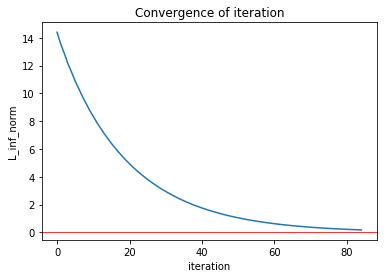

In [35]:
epi = 0.01
policy_optimal = np.array([1, 0, 1])
n_states = 3

# Compute optimal value function
V_optimal = policy_to_value(policy_optimal, P, R, gamma, n_states)
print('optimal policy:', policy_optimal)
print('Optimal value function: ', V_optimal, '\n')

print('Run Value Iteration:')
start = time.time()
V_list, policy_greedy = iterate_value(V_initial, P, R, gamma, n_states, epi)
stop = time.time()
recall_iteration_results(start, stop, V_list, policy_greedy, V_optimal)

## Q3: Policy Iteration 

In [36]:
def iterate_policy(policy_initial, P, R, gamma, n_states, epi):
    V_list = [policy_to_value(policy_initial, P, R, gamma, n_states)]
    while True:
        _, policy = step_value_iteration(V_list[-1], P, R, gamma, n_states)
        V_list.append(policy_to_value(policy, P, R, gamma, n_states))
        if L_norm_inf(V_list[-1] - V_list[-2]) < epi:
            break
    return V_list, policy

optimal policy: [1 0 1]
Optimal value function:  [ 12.393531   14.393531   13.0458221] 

Run Policy Iteration:
	 run time:  0.0008480548858642578
	 number of iterations:  2
	 greedy policy:  [1 0 1]
	 value function of final iteration:  [ 12.393531   14.393531   13.0458221]
	 plot convengence of value function: 


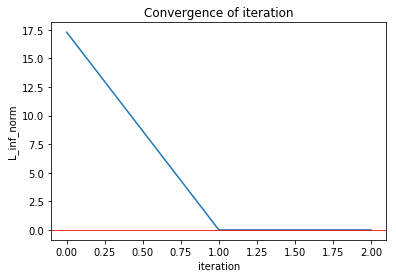

In [37]:
print('optimal policy:', policy_optimal)
print('Optimal value function: ', V_optimal, '\n')
policy_initial = np.random.randint(2, size=3)
print('Run Policy Iteration:')
start = time.time()
V_list, policy_greedy_ite = iterate_policy(policy_initial, P, R, gamma, n_states, epi)
stop = time.time()
recall_iteration_results(start, stop, V_list, policy_greedy_ite, V_optimal)

## Comments 

- For this specific problem, policy iteration is much more efficient than value iteration
- Each value iteration is computationally efficient. However, since the convergence is only asymptotic, it may take many steps to achieve the optimal value function.
- Policy iteration converges in a finite number of iterations, that is why it it more efficient than value iteration in the problem. However, each policy iteration requires a full policy evaluation and computation of inverse of matrix, which might be very expensive in some case.]

# 2 Reinforcement Learning 

## Q4: Policy Evauation 

In [38]:
################################################################################
# Work to do: Q4
################################################################################
# here the v-function and q-function to be used for question 4
v_q4 = [0.87691855, 0.92820033, 0.98817903, 0.00000000, 0.67106071, -0.99447514, 0.00000000, -0.82847001, -0.87691855,
        -0.93358351, -0.99447514]
q_q4 = [[0.87691855, 0.65706417],
        [0.92820033, 0.84364237],
        [0.98817903, -0.75639924, 0.89361129],
        [0.00000000],
        [-0.62503460, 0.67106071],
        [-0.99447514, -0.70433689, 0.75620264],
        [0.00000000],
        [-0.82847001, 0.49505225],
        [-0.87691855, -0.79703229],
        [-0.93358351, -0.84424050, -0.93896668],
        [-0.89268904, -0.99447514]
        ]

In [39]:
def compute_T_max(gamma):
    return 2*np.rint(1/(1-gamma))

def initiate_Q_N(env):
    Q_initial = []
    N_visit = []
    #state_action_index = {}
    for state in range(env.n_states):
        Q_state_action = [(0 if i in env.state_actions[state] else -np.inf) for i in range(len(env.action_names))]
        Q_initial.append(Q_state_action)
        N_visit.append([0]*len(env.action_names))
    return Q_initial, N_visit

def recover_V_from_Q(Q, env):
    '''When Q_learning terminates, we need to compute V from corresponding Q'''
    policy = []
    Vs = []
    for state in range(env.n_states):
        index = np.argmax(Q[state])
        Vs.append(Q[state][index])
        policy.append(index)
    return np.array(Vs), policy

def value_eva_MC(n_episodes, gamma, env):
    '''Function to compute Q-function, include the initial action not included by the deterministic policy'''
    T_max = compute_T_max(gamma)
    Qn = []
    V_sum=0
    for i in range(n_episodes):
        Q, _ = initiate_Q_N(env)
        for state in range(env.n_states):
            for a in env.state_actions[state]:
                t = 0
                V = 0
                discount = 1/gamma
                action = a
                s_old = state
                while True:
                    nexts, reward, term = env.step(s_old, action)
                    discount *= gamma
                    V += reward * discount
                    t += 1
                    if term or t > T_max:
                        break
                    s_old = nexts
                    # Deterministic Policy
                    action = 0 if 0 in env.state_actions[s_old] else 3
                Q[state][a] = V
        V_sum += np.array(Q)
        Qn.append(V_sum/(i+1))
    return Qn

def value_function_MC_fixed_init_state(state_initial, n_episodes, gamma, env=GridWorld1):
    '''Function to compute directly the V-function, on the condition that the initial action is also determined
    by that deterministic policy'''
    T_max = compute_T_max(gamma)
    Qn = []
    for i in range(n_episodes):
        state = state_initial
        t = 0
        V = 0
        discount = 1/gamma
        while True:
            # Deterministic Policy
            action = 0 if 0 in env.state_actions[state] else 3
            nexts, reward, term = env.step(state,action)
            discount *= gamma
            V = V + reward * discount
            t += 1
            state = nexts
            if term or t > T_max:
                break
        Qn.append(V)
    Qn = np.array(Qn)
    Qn = np.cumsum(Qn) / np.arange(1, len(Qn)+1)
    return Qn

In [40]:
# Compute J_n
env = GridWorld1
env.render = False
gamma = 0.95
n_episodes = 5000

# Compute initial action for each state if using the deterministic policy
a0 = [0 if 0 in env.state_actions[state] else 3 for state in range(env.n_states)]
#gui.render_policy(env, a0)

# Compute estimated value function
#V_s = [value_function_MC_fixed_init_state(state, n_episodes, gamma) for state in range(env.n_states)]
#Js = np.mean(np.array(V_s), axis=0)

Qnew = value_eva_MC(n_episodes, gamma, env)
print('Final evaluation of Q-Function\n(-inf corresponding to the actions that are not permeritted):')
print(Qnew[-1])
print('--------------------------------------------------------')
print('Final evaluation of Value function for deterministic policy: ')
print(Qnew[-1][np.arange(env.n_states), a0])
V_s = [Qnew[i][np.arange(env.n_states), a0] for i in range(n_episodes)]
Js = np.mean(np.array(V_s), axis=1)

# Compute J
J = np.mean(v_q4)

Final evaluation of Q-Function
(-inf corresponding to the actions that are not permeritted):
[[ 0.87712189  0.6557209         -inf        -inf]
 [ 0.9289036         -inf  0.84405926        -inf]
 [ 0.98750119 -0.75079126  0.893431          -inf]
 [ 0.                -inf        -inf        -inf]
 [       -inf -0.62895534        -inf  0.67555465]
 [-0.99442933 -0.71241491        -inf  0.76156514]
 [ 0.                -inf        -inf        -inf]
 [-0.82969868        -inf        -inf  0.49219358]
 [-0.87875316        -inf -0.79542471        -inf]
 [-0.9331834         -inf -0.84475139 -0.93900644]
 [       -inf        -inf -0.89285963 -0.9946004 ]]
--------------------------------------------------------
Final evaluation of Value function for deterministic policy: 
[ 0.87712189  0.9289036   0.98750119  0.          0.67555465 -0.99442933
  0.         -0.82969868 -0.87875316 -0.9331834  -0.9946004 ]


### Visualization: Q-Function and convergence courbe 

In [41]:
Vis_V = [Qnew[-1][state][env.state_actions[state]] for state in range(env.n_states)]
Vis_V = [item if item.shape[0] == 3 else np.append(item, 0) for item in Vis_V]
Vis_V = [item if item.shape[0] == 3 else np.append(item, 0) for item in Vis_V]
gui.render_q(env, Vis_V)

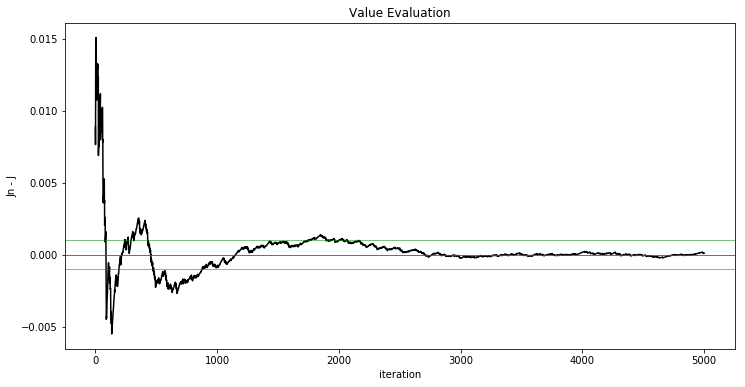

In [53]:
plt.figure(figsize=(12, 6))
plt.plot(np.arange(1, n_episodes+1), Js-J, color='k')
plt.axhline(y=0, color='r', lw=0.8)
plt.axhline(y=0.001, color='g', lw=0.5)
plt.axhline(y=-0.001, color='g', lw=0.5)
plt.title('Value Evaluation')
plt.xlabel('iteration')
plt.ylabel('Jn - J')
plt.show()

## Q5: Policy Optimisation 

- $\epsilon$-greedy exploration policy is a combination between policy of Q-learning and random exploration policy. If $\epsilon = 1$, then it is totally random exploration policy. Otherwise, if $\epsilon = 0$, it is totally Q-learning the algorithm.
- The step size $\alpha$ depends on both state $s$ and action $a$ chosen. In my experiment, I have chosen $\alpha=\frac{1}{\#visits(s, a)^\omega}$, where $\omega\in(\frac{1}{2}, 1]$. When $\omega = 1$, it corresponds to a linear learning rate. Otherwise, it is polynomial learning rate.

In [42]:
################################################################################
# Work to do: Q5
################################################################################
v_opt = [0.87691855, 0.92820033, 0.98817903, 0.00000000, 0.82369294, 0.92820033, 0.00000000, 0.77818504, 0.82369294,
         0.87691855, 0.82847001]

In [43]:
def epi_greedy_exploration_policy(epi, Q_state, actions):
    '''Implementation of the epi-greedy exploration policy'''
    if np.random.uniform() <= epi:
        action = np.random.choice(actions)
        return action, Q_state[action]
    else:
        index = np.argmax(Q_state)
        return index, Q_state[index]

def Q_learning_epi_greedy(n_episodes, gamma, epi, w=1, env=GridWorld1, mu0=None):
    '''Implementation of the Q-learning algorithm'''
    Q, N_visit= initiate_Q_N(env)
    T_max = compute_T_max(gamma)
    Vs = [[0 for i in range(env.n_states)]]
    policy = []
    for i in range(n_episodes):
        if mu0 == None:
            state = env.reset()
        else:
            state = np.random.choice(np.arange(env.n_states), p=mu0)
        t = 0
        while True:
            a0, Q_x_a0 = epi_greedy_exploration_policy(epi, Q[state], env.state_actions[state])
            N_visit[state][a0] += 1
            nexts, reward, term = env.step(state, a0)
            # Compute temporal difference
            a1, Q_x_a1 = epi_greedy_exploration_policy(epi, Q[nexts], env.state_actions[nexts])
            delta = reward + gamma * Q_x_a1 - Q_x_a0
            Q[state][a0] = Q_x_a0 + delta / np.power(N_visit[state][a0], w)
            state = nexts
            t += 1
            if term or t > T_max:
                break
        Vs_tmp, policy = recover_V_from_Q(Q, env)
        Vs.append(Vs_tmp)
    return Vs, policy

In [70]:
n_episodes = 10000
gamma = 0.95
epi = 0.01
env = GridWorld1
start = time.time()
Vs, policy = Q_learning_epi_greedy(n_episodes, gamma, epi, w=0.53, env=env, mu0=None)
stop = time.time()

[0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 run time:  2.002120018005371
	 number of iterations:  10000
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.87626193  0.92993938  0.98396111  0.          0.81775143  0.92766866
  0.          0.77079915  0.81093577  0.87393455  0.82478739]
	 plot convengence of value function: 


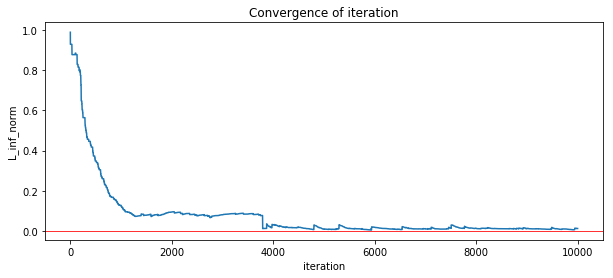

In [71]:
print(policy)
recall_iteration_results(start, stop, Vs, policy, np.array(v_opt), figsize=(10,4))

In [72]:
print(Vs[-1])
print(policy)

[ 0.87626193  0.92993938  0.98396111  0.          0.81775143  0.92766866
  0.          0.77079915  0.81093577  0.87393455  0.82478739]
[0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]


--------------------------------
0.01 0.51
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87884189  0.93186501  0.98655881  0.          0.82256256  0.92497997
  0.          0.77264579  0.74201013  0.87551059  0.82615146]
	 plot convengence of value function: 


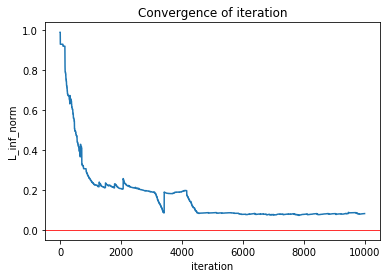

--------------------------------
0.01 0.52
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87064527  0.91869052  0.98082112  0.          0.81859389  0.91976649
  0.          0.76923845  0.73693946  0.84426007  0.81337705]
	 plot convengence of value function: 


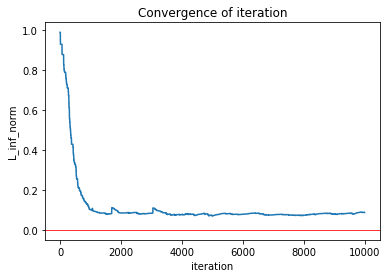

--------------------------------
0.01 0.53
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87571404  0.92915705  0.98956265  0.          0.82033941  0.93447861
  0.          0.77194779  0.74343788  0.86826485  0.81256711]
	 plot convengence of value function: 


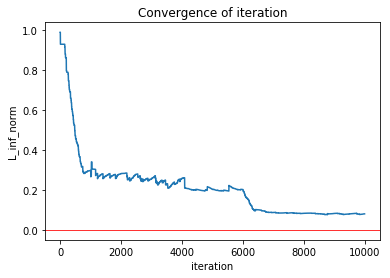

--------------------------------
0.01 0.54
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87530492  0.92707912  0.98796461  0.          0.82058915  0.92800235
  0.          0.77506682  0.74783862  0.8775151   0.82892057]
	 plot convengence of value function: 


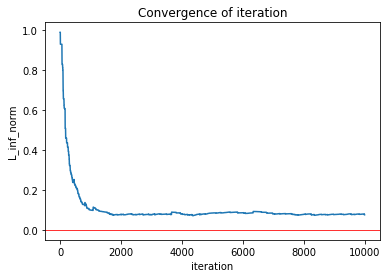

--------------------------------
0.01 0.55
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87316478  0.92335484  0.98866681  0.          0.82440206  0.92450859
  0.          0.7776083   0.7374673   0.87623284  0.8099199 ]
	 plot convengence of value function: 


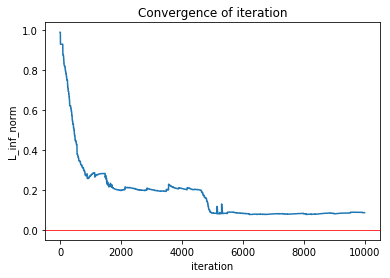

--------------------------------
0.01 0.56
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.875394    0.92577758  0.98963188  0.          0.82328449  0.92227095
  0.          0.77077709  0.81809214  0.87459369  0.81712333]
	 plot convengence of value function: 


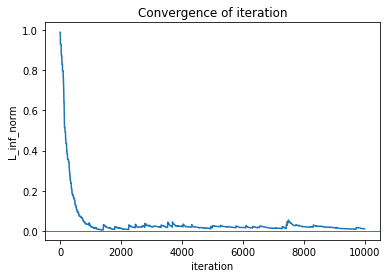

--------------------------------
0.01 0.57
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87480144  0.92455004  0.98809931  0.          0.82411225  0.92543634
  0.          0.77663003  0.74537612  0.87332145  0.81990982]
	 plot convengence of value function: 


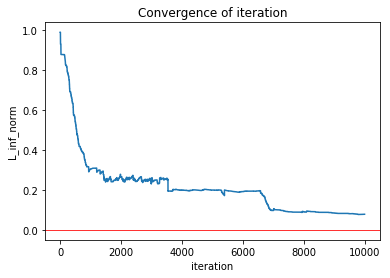

--------------------------------
0.01 0.58
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87421403  0.92461624  0.98958238  0.          0.82174811  0.92510941
  0.          0.77333275  0.73801745  0.87433422  0.79323252]
	 plot convengence of value function: 


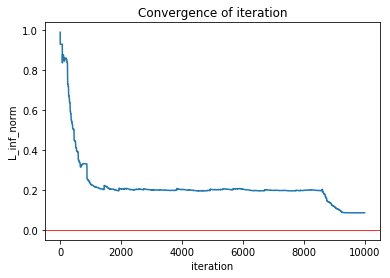

--------------------------------
0.01 0.59
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87386791  0.92766891  0.98877708  0.          0.82044133  0.92732431
  0.          0.77383956  0.7481276   0.8751187   0.81787427]
	 plot convengence of value function: 


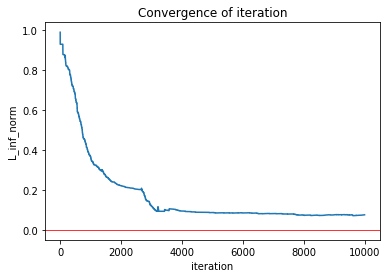

--------------------------------
0.01 0.6
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87509489  0.92664892  0.98956216  0.          0.82264006  0.92544711
  0.          0.77770463  0.74525062  0.87042967  0.8174614 ]
	 plot convengence of value function: 


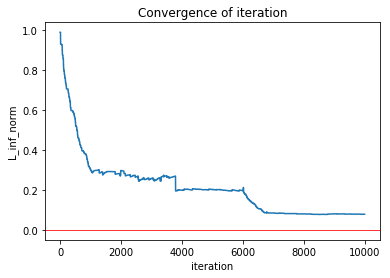

--------------------------------
0.01 0.61
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 1, 0, 3, 2, 2, 2]
	 value function of final iteration:  [ 0.87568082  0.92533335  0.98631273  0.          0.82174786  0.67668106
  0.          0.77718694  0.72760059  0.68334084  0.64341604]
	 plot convengence of value function: 


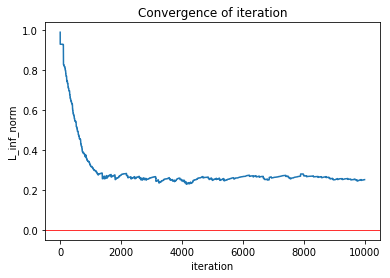

--------------------------------
0.01 0.62
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.87559042  0.93204497  0.98904035  0.          0.8222645   0.92975745
  0.          0.77055681  0.81452108  0.87479549  0.81734037]
	 plot convengence of value function: 


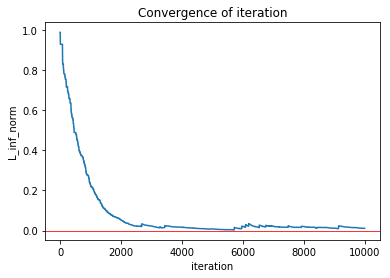

--------------------------------
0.01 0.63
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.8725017   0.92368942  0.98924894  0.          0.82115038  0.93026879
  0.          0.77593857  0.74218563  0.87299781  0.8071295 ]
	 plot convengence of value function: 


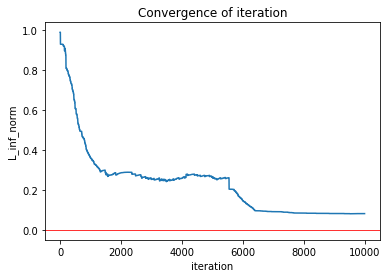

--------------------------------
0.01 0.64
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87674051  0.92773946  0.98805459  0.          0.82143976  0.9242513   0.
  0.77689326  0.80882915  0.86315568  0.80607624]
	 plot convengence of value function: 


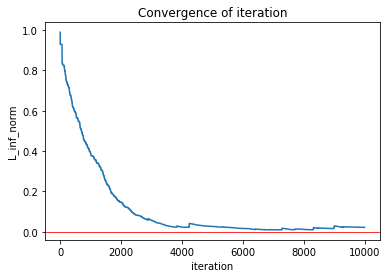

--------------------------------
0.01 0.65
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.87638225  0.92731041  0.98825252  0.          0.82258059  0.92760921
  0.          0.76435303  0.81256519  0.87031829  0.81620127]
	 plot convengence of value function: 


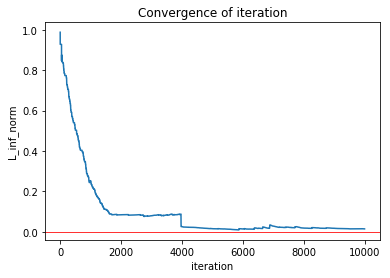

--------------------------------
0.01 0.66
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87677751  0.92845584  0.98761227  0.          0.82428638  0.9284538   0.
  0.77522551  0.73955784  0.87068195  0.80464467]
	 plot convengence of value function: 


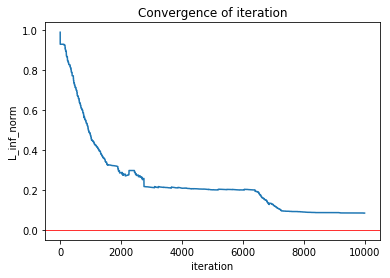

--------------------------------
0.01 0.67
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87765296  0.92898748  0.98793672  0.          0.82097646  0.92601387
  0.          0.77310959  0.73824582  0.87218781  0.81228049]
	 plot convengence of value function: 


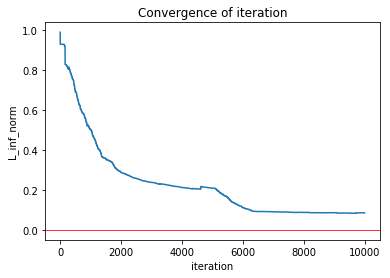

--------------------------------
0.01 0.68
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87536421  0.92682626  0.99031121  0.          0.82122165  0.92626048
  0.          0.77733022  0.74214513  0.86117166  0.79830893]
	 plot convengence of value function: 


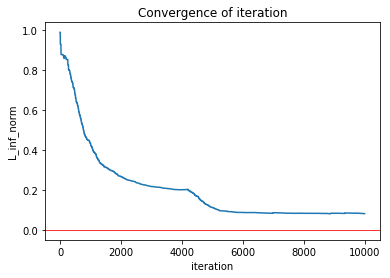

--------------------------------
0.01 0.69
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87530955  0.92938587  0.99038694  0.          0.82200514  0.92587372
  0.          0.77700449  0.81753108  0.86723036  0.81496835]
	 plot convengence of value function: 


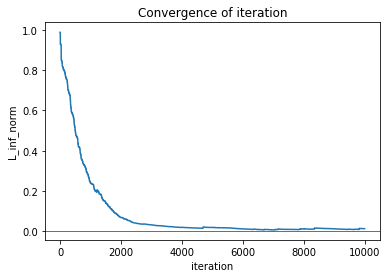

--------------------------------
0.01 0.7
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.87640553  0.92627434  0.98758308  0.          0.81485828  0.92555925
  0.          0.76466108  0.81239408  0.86895362  0.81712687]
	 plot convengence of value function: 


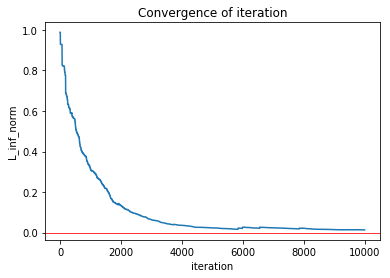

--------------------------------
0.01 0.71
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87537812  0.92867833  0.98858539  0.          0.82117847  0.92805548
  0.          0.77314455  0.74311743  0.87658884  0.8209484 ]
	 plot convengence of value function: 


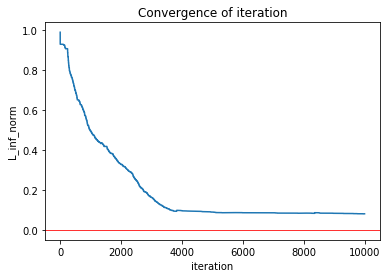

--------------------------------
0.01 0.72
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.87163453  0.92387521  0.98744027  0.          0.81838905  0.92543552
  0.          0.76351573  0.80779779  0.86560482  0.81100584]
	 plot convengence of value function: 


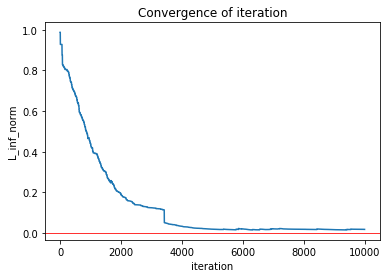

--------------------------------
0.01 0.73
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87472085  0.92639427  0.98751764  0.          0.82116315  0.9303394   0.
  0.77300112  0.72684605  0.87780012  0.7160988 ]
	 plot convengence of value function: 


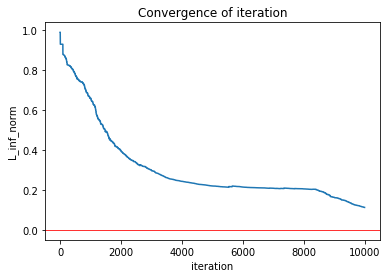

--------------------------------
0.01 0.74
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.87415738  0.92534875  0.98802686  0.          0.82097503  0.92533474
  0.          0.76323134  0.80766609  0.86146065  0.81418023]
	 plot convengence of value function: 


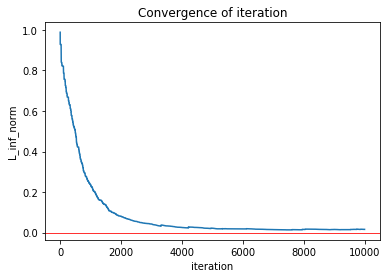

--------------------------------
0.01 0.75
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87411912  0.9268497   0.98776716  0.          0.82140927  0.92660359
  0.          0.77528599  0.74224399  0.86730237  0.81269791]
	 plot convengence of value function: 


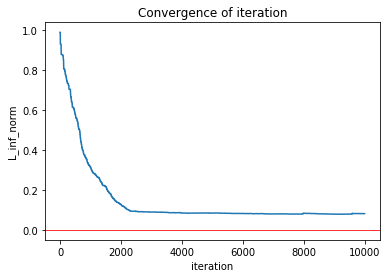

--------------------------------
0.01 0.76
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.87353987  0.92659737  0.98724597  0.          0.81860413  0.92564992
  0.          0.76217305  0.80944097  0.86766915  0.81615932]
	 plot convengence of value function: 


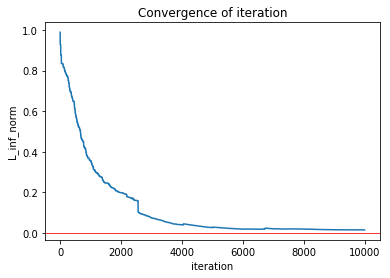

--------------------------------
0.01 0.77
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.8767264   0.92841061  0.98873549  0.          0.82031944  0.9239162   0.
  0.77357751  0.73030843  0.8692293   0.71555612]
	 plot convengence of value function: 


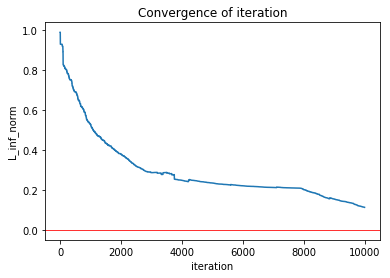

--------------------------------
0.01 0.78
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.87533219  0.92757315  0.9883804   0.          0.81357719  0.92720448
  0.          0.76177848  0.80862541  0.86897695  0.80555549]
	 plot convengence of value function: 


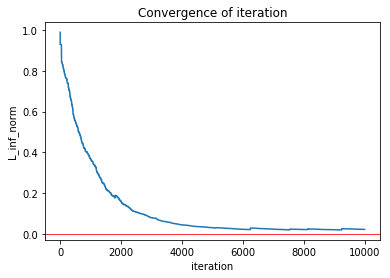

--------------------------------
0.01 0.79
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87605614  0.92696084  0.98852847  0.          0.82043577  0.92566469
  0.          0.77150927  0.79859098  0.86271379  0.77804966]
	 plot convengence of value function: 


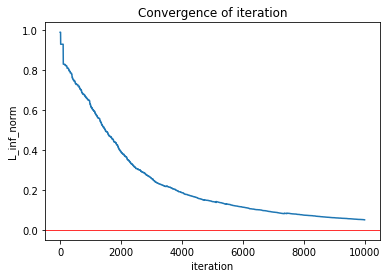

--------------------------------
0.01 0.8
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 2, 2]
	 value function of final iteration:  [ 0.87429719  0.92679162  0.98871361  0.          0.81994618  0.90415846
  0.          0.77112457  0.71668308  0.66051073  0.60311165]
	 plot convengence of value function: 


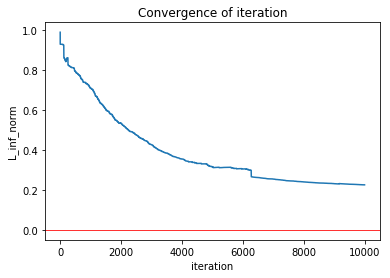

--------------------------------
0.01 0.81
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87596624  0.92876411  0.98890055  0.          0.81999748  0.92704556
  0.          0.77047482  0.72769291  0.86666841  0.72118183]
	 plot convengence of value function: 


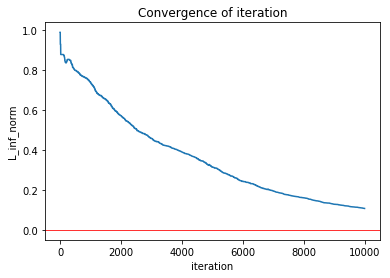

--------------------------------
0.01 0.82
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87492323  0.92783849  0.98856544  0.          0.82092594  0.92536916
  0.          0.77322182  0.71172328  0.86190919  0.80264517]
	 plot convengence of value function: 


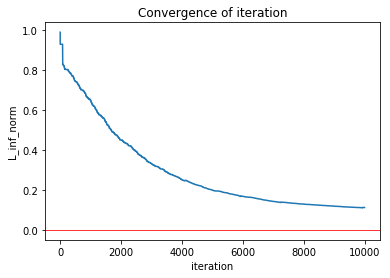

--------------------------------
0.01 0.83
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87624267  0.92729102  0.98850591  0.          0.81468549  0.92528143
  0.          0.75204436  0.79226646  0.86987484  0.7906282 ]
	 plot convengence of value function: 


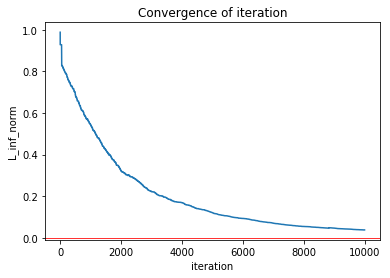

--------------------------------
0.01 0.84
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 2, 2]
	 value function of final iteration:  [ 0.87345937  0.92517352  0.98734473  0.          0.81794964  0.90326631
  0.          0.76893237  0.71254348  0.63700062  0.51900554]
	 plot convengence of value function: 


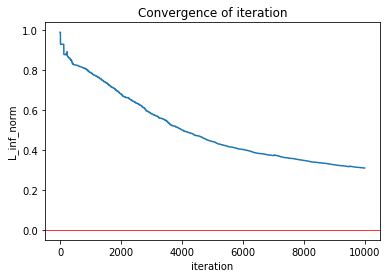

--------------------------------
0.01 0.85
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87568637  0.92789343  0.98915194  0.          0.8208728   0.92118017
  0.          0.76959314  0.72401894  0.843993    0.68710833]
	 plot convengence of value function: 


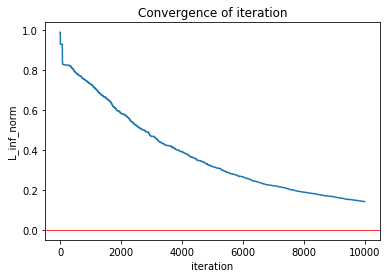

--------------------------------
0.01 0.86
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87605983  0.92829851  0.98780858  0.          0.82227828  0.92348993
  0.          0.77119052  0.77764837  0.86129817  0.71331797]
	 plot convengence of value function: 


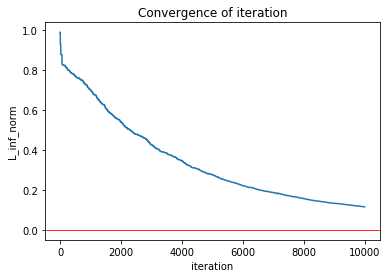

--------------------------------
0.01 0.87
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 2, 2]
	 value function of final iteration:  [ 0.87464989  0.92647408  0.98810493  0.          0.81719091  0.88751032
  0.          0.76564871  0.69915759  0.61591313  0.50088241]
	 plot convengence of value function: 


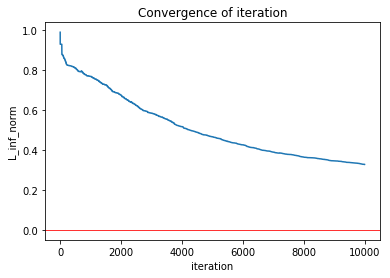

--------------------------------
0.01 0.88
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87542511  0.92748743  0.98770444  0.          0.82015813  0.92426939
  0.          0.76929502  0.73513303  0.86245618  0.66049687]
	 plot convengence of value function: 


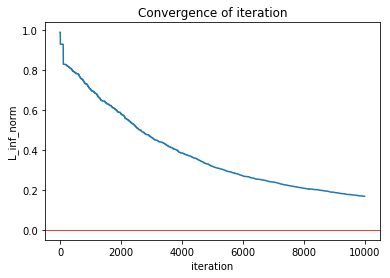

--------------------------------
0.01 0.89
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87561188  0.92784581  0.98828467  0.          0.81809616  0.9187796   0.
  0.76371377  0.7044997   0.82572038  0.70681951]
	 plot convengence of value function: 


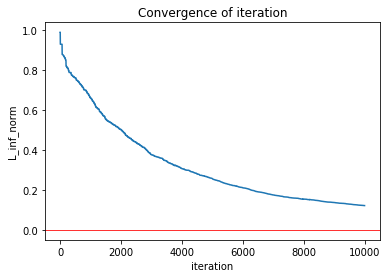

--------------------------------
0.01 0.9
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.8735675   0.92735951  0.98842368  0.          0.80889121  0.92389402
  0.          0.75183295  0.73136581  0.85840663  0.70619819]
	 plot convengence of value function: 


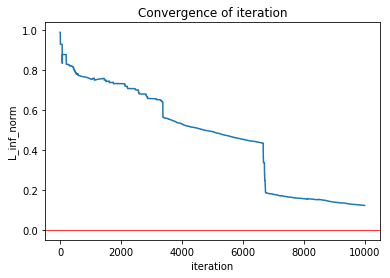

--------------------------------
0.01 0.91
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87424273  0.9265221   0.98803341  0.          0.81736945  0.92517064
  0.          0.76674073  0.78970788  0.86756763  0.61447421]
	 plot convengence of value function: 


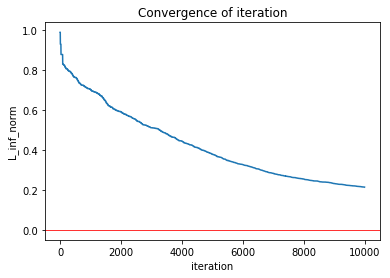

--------------------------------
0.01 0.92
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87241852  0.92637991  0.98812043  0.          0.81193232  0.9241065   0.
  0.75159986  0.59774202  0.86018117  0.5954316 ]
	 plot convengence of value function: 


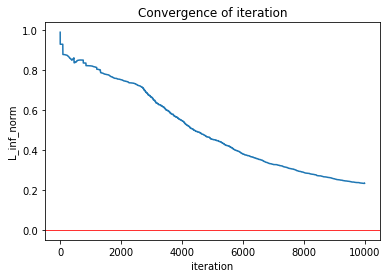

--------------------------------
0.01 0.93
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 2, 2]
	 value function of final iteration:  [ 0.87290702  0.92580964  0.98889251  0.          0.80862426  0.80760057
  0.          0.72990463  0.60697232  0.42122401  0.25776652]
	 plot convengence of value function: 


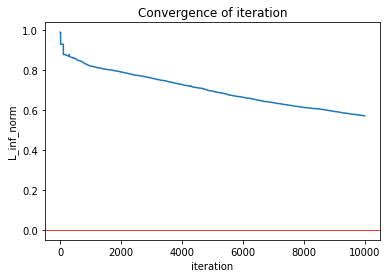

--------------------------------
0.01 0.94
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87239603  0.92591752  0.98697821  0.          0.8088307   0.91431325
  0.          0.72235157  0.58036908  0.81903723  0.59652907]
	 plot convengence of value function: 


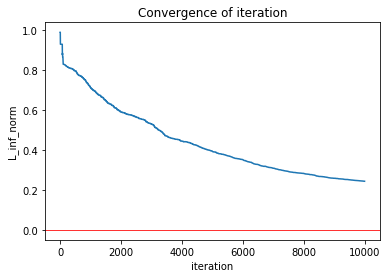

--------------------------------
0.01 0.95
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87363574  0.92697602  0.98796781  0.          0.81122053  0.91799185
  0.          0.74456623  0.68272089  0.828413    0.42501689]
	 plot convengence of value function: 


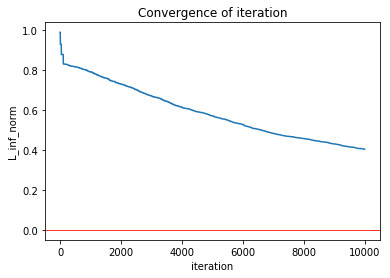

--------------------------------
0.01 0.96
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86892287  0.92473297  0.98733559  0.          0.80039698  0.90852506
  0.          0.72565945  0.45705052  0.78881441  0.48296388]
	 plot convengence of value function: 


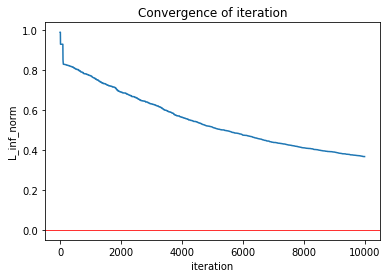

--------------------------------
0.01 0.97
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.859847    0.92053375  0.98663068  0.          0.77643877  0.91438078
  0.          0.54731125  0.696026    0.82931692  0.60864741]
	 plot convengence of value function: 


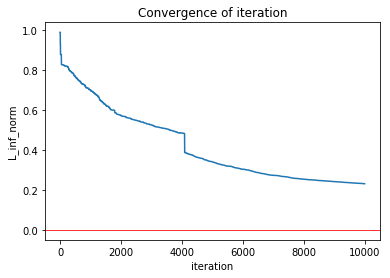

--------------------------------
0.01 0.98
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86959213  0.92326702  0.98717444  0.          0.79565299  0.91356552
  0.          0.66987203  0.47369673  0.84441465  0.27578954]
	 plot convengence of value function: 


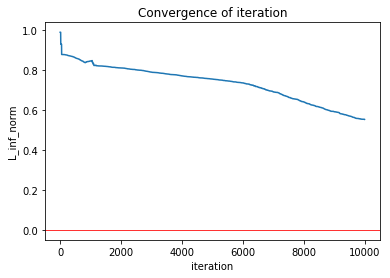

--------------------------------
0.01 0.99
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86983234  0.92457938  0.98702685  0.          0.80207609  0.91325057
  0.          0.70860101  0.43959215  0.82917814  0.57962643]
	 plot convengence of value function: 


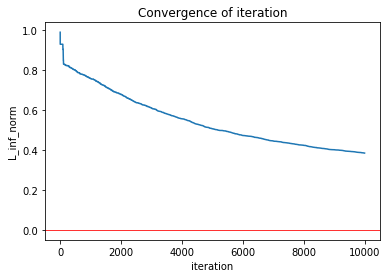

--------------------------------
0.02 0.51
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87287014  0.92866575  0.99083942  0.          0.82077314  0.92628555
  0.          0.77233886  0.80951278  0.86269947  0.81568653]
	 plot convengence of value function: 


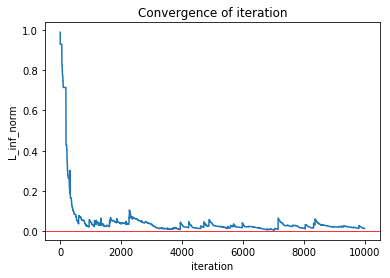

--------------------------------
0.02 0.52
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87723613  0.92994166  0.98982416  0.          0.82285255  0.93182677
  0.          0.77167648  0.74316189  0.85518302  0.81421242]
	 plot convengence of value function: 


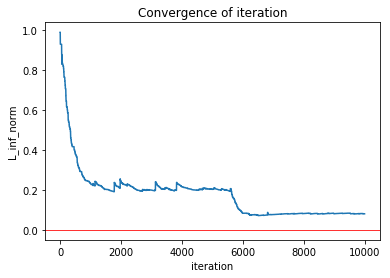

--------------------------------
0.02 0.53
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87305973  0.92741026  0.98982848  0.          0.82087968  0.92924345
  0.          0.77585438  0.74378287  0.86050108  0.81327834]
	 plot convengence of value function: 


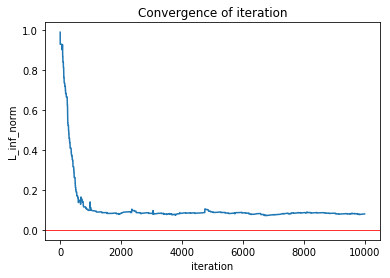

--------------------------------
0.02 0.54
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87614639  0.93008523  0.99026185  0.          0.81752699  0.92155065
  0.          0.77145732  0.73834194  0.84224679  0.80156762]
	 plot convengence of value function: 


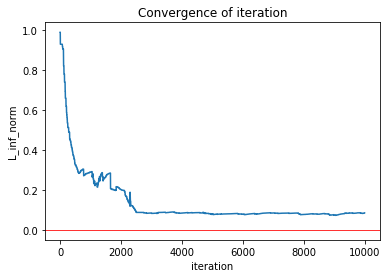

--------------------------------
0.02 0.55
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87230676  0.9244607   0.98785414  0.          0.82431807  0.91980043
  0.          0.78149268  0.79199998  0.84991842  0.80640821]
	 plot convengence of value function: 


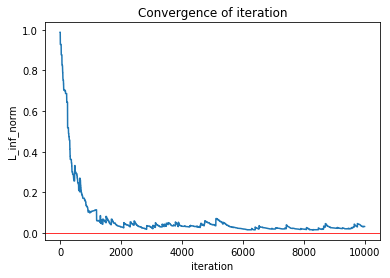

--------------------------------
0.02 0.56
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.8746614   0.9266653   0.98714195  0.          0.81644616  0.92571425
  0.          0.77536951  0.8103718   0.86480678  0.81449759]
	 plot convengence of value function: 


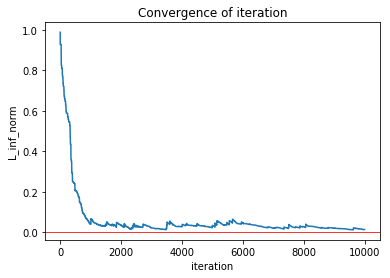

--------------------------------
0.02 0.57
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.874418    0.92499203  0.98756185  0.          0.8196423   0.92562365
  0.          0.77261628  0.73892537  0.86908854  0.8096358 ]
	 plot convengence of value function: 


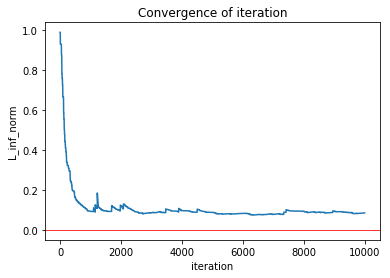

--------------------------------
0.02 0.58
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87507348  0.92514911  0.98599498  0.          0.81990898  0.92864208
  0.          0.77312709  0.73898208  0.87037838  0.81393892]
	 plot convengence of value function: 


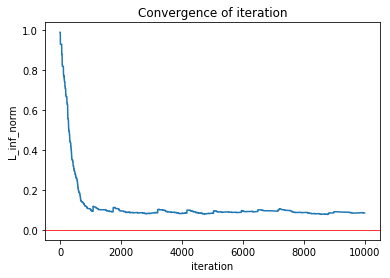

--------------------------------
0.02 0.59
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87642616  0.92845833  0.98695129  0.          0.82260474  0.92409752
  0.          0.77647481  0.73902467  0.8610638   0.81524394]
	 plot convengence of value function: 


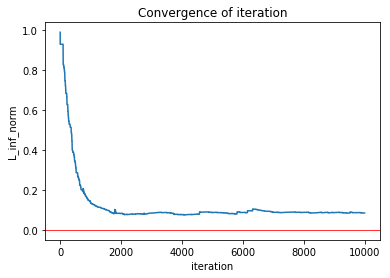

--------------------------------
0.02 0.6
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87760135  0.92649431  0.98736552  0.          0.81506839  0.92713486
  0.          0.77238498  0.73941223  0.86082518  0.78911301]
	 plot convengence of value function: 


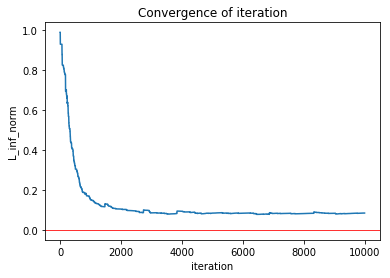

--------------------------------
0.02 0.61
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87496356  0.92567194  0.98583149  0.          0.82286325  0.92693778
  0.          0.77610292  0.7376656   0.8669365   0.80904819]
	 plot convengence of value function: 


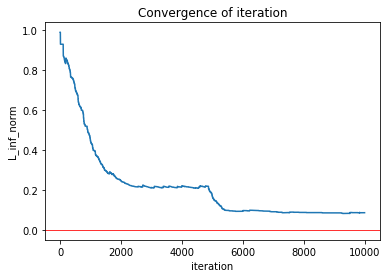

--------------------------------
0.02 0.62
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87091078  0.92439369  0.9858484   0.          0.81522607  0.92513284
  0.          0.76919699  0.73680015  0.86925389  0.82109973]
	 plot convengence of value function: 


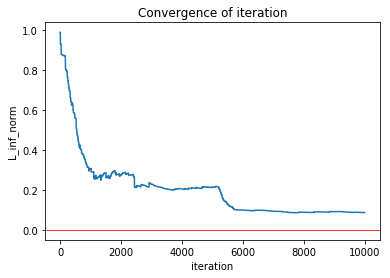

--------------------------------
0.02 0.63
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87380513  0.92546739  0.98651233  0.          0.82467662  0.92252395
  0.          0.77449284  0.80846889  0.85751992  0.81199965]
	 plot convengence of value function: 


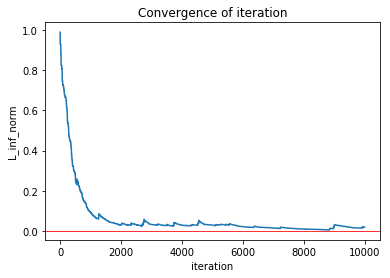

--------------------------------
0.02 0.64
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87624296  0.9254418   0.98797174  0.          0.82270077  0.92477824
  0.          0.77163092  0.80633533  0.86174721  0.80629099]
	 plot convengence of value function: 


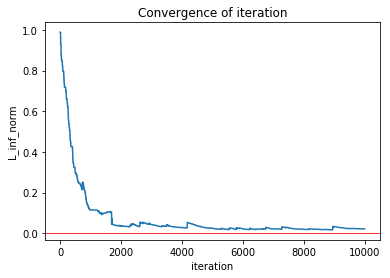

--------------------------------
0.02 0.65
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.87362802  0.92846422  0.98989509  0.          0.8151581   0.9233108   0.
  0.7654576   0.81111308  0.86382014  0.8122098 ]
	 plot convengence of value function: 


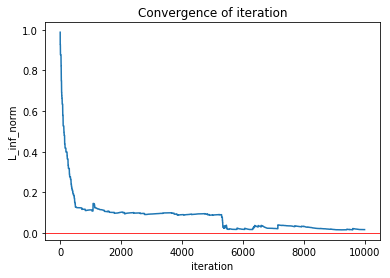

--------------------------------
0.02 0.66
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87548599  0.92698328  0.98822069  0.          0.82087717  0.92198811
  0.          0.77464492  0.74180929  0.86447314  0.80444111]
	 plot convengence of value function: 


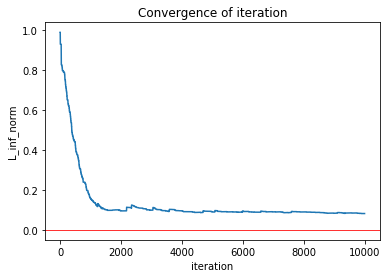

--------------------------------
0.02 0.67
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87202821  0.92335522  0.98712041  0.          0.81859038  0.92813895
  0.          0.77262299  0.74038699  0.85362378  0.81486397]
	 plot convengence of value function: 


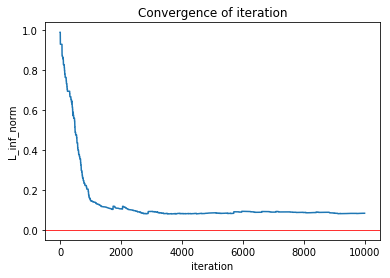

--------------------------------
0.02 0.68
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87579677  0.92796323  0.98833119  0.          0.82020543  0.92431232
  0.          0.77421088  0.79971378  0.86241757  0.80093877]
	 plot convengence of value function: 


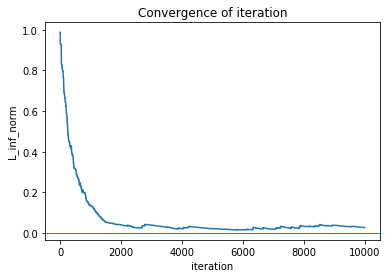

--------------------------------
0.02 0.69
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87717009  0.92691272  0.98807317  0.          0.8208967   0.9256593   0.
  0.77392524  0.74433093  0.8693218   0.81267725]
	 plot convengence of value function: 


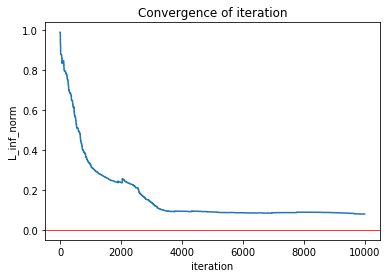

--------------------------------
0.02 0.7
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87413544  0.92350069  0.98773796  0.          0.82195829  0.92417392
  0.          0.77436911  0.7333111   0.84693035  0.79866579]
	 plot convengence of value function: 


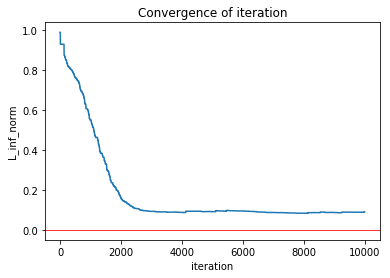

--------------------------------
0.02 0.71
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87480747  0.92688557  0.98726289  0.          0.82245276  0.92170501
  0.          0.77301815  0.73370168  0.8573028   0.7796935 ]
	 plot convengence of value function: 


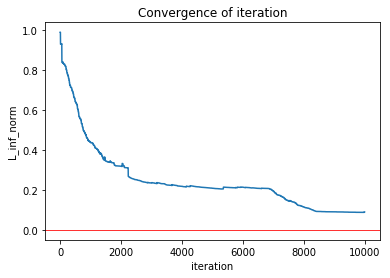

--------------------------------
0.02 0.72
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87271749  0.92588324  0.98818231  0.          0.81915259  0.92611963
  0.          0.77298622  0.79598128  0.86592214  0.81139027]
	 plot convengence of value function: 


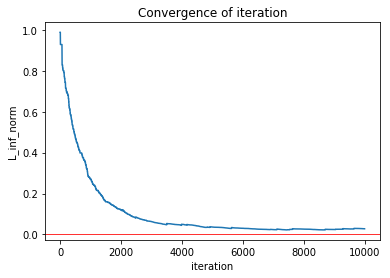

--------------------------------
0.02 0.73
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.8730196   0.92559073  0.98754592  0.          0.81995623  0.92163258
  0.          0.77348579  0.74152845  0.86395976  0.78648407]
	 plot convengence of value function: 


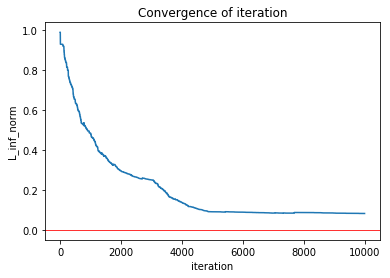

--------------------------------
0.02 0.74
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87606291  0.92599196  0.98900811  0.          0.82230632  0.92600784
  0.          0.77586411  0.74351143  0.86151848  0.81250129]
	 plot convengence of value function: 


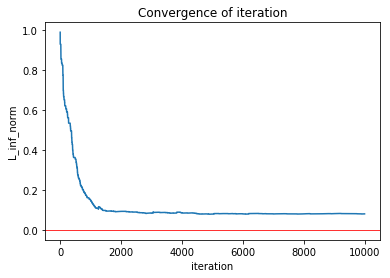

--------------------------------
0.02 0.75
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87235079  0.92606652  0.98961955  0.          0.81573117  0.92395254
  0.          0.76768248  0.79072924  0.8529171   0.79223312]
	 plot convengence of value function: 


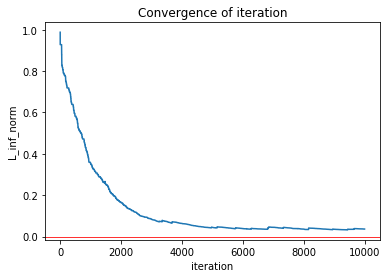

--------------------------------
0.02 0.76
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87581043  0.92801911  0.989398    0.          0.82079792  0.92253937
  0.          0.77521471  0.74235734  0.84461355  0.79502241]
	 plot convengence of value function: 


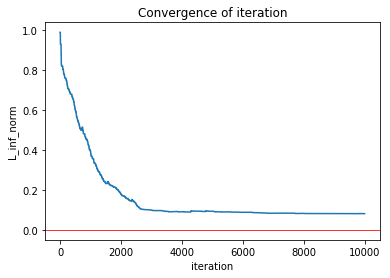

--------------------------------
0.02 0.77
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87448411  0.92691495  0.98716738  0.          0.8189253   0.92678282
  0.          0.77119891  0.79615776  0.86675633  0.79782686]
	 plot convengence of value function: 


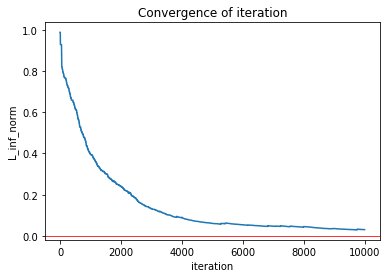

--------------------------------
0.02 0.78
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87497867  0.92769253  0.98864639  0.          0.81709217  0.92341115
  0.          0.76758895  0.72199451  0.85669534  0.79406976]
	 plot convengence of value function: 


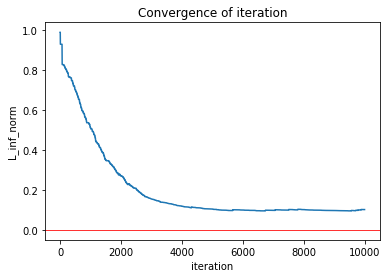

--------------------------------
0.02 0.79
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87304102  0.92531533  0.98795911  0.          0.81638242  0.92486996
  0.          0.7690017   0.73135796  0.85743239  0.78703565]
	 plot convengence of value function: 


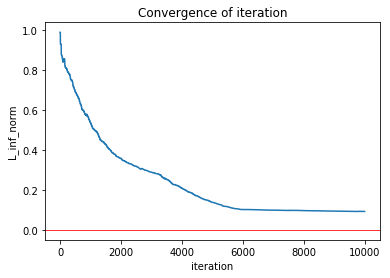

--------------------------------
0.02 0.8
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87403813  0.92506411  0.98696169  0.          0.81778102  0.92424487
  0.          0.77026074  0.73702251  0.86038454  0.80101389]
	 plot convengence of value function: 


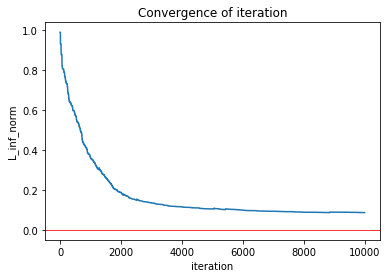

--------------------------------
0.02 0.81
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87236305  0.92502998  0.98907425  0.          0.81720953  0.92560645
  0.          0.76431558  0.72421203  0.85728833  0.75957554]
	 plot convengence of value function: 


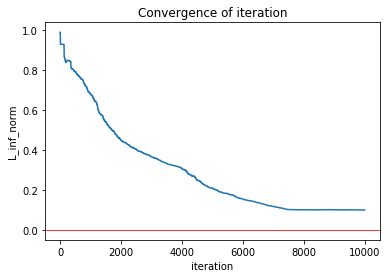

--------------------------------
0.02 0.82
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.8752825   0.92641484  0.98675103  0.          0.81814011  0.92265154
  0.          0.7660385   0.73076542  0.86155704  0.79837042]
	 plot convengence of value function: 


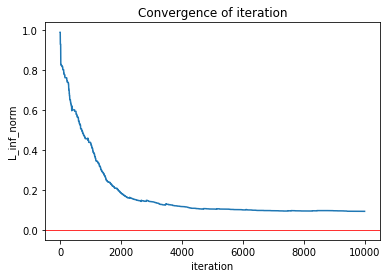

--------------------------------
0.02 0.83
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.87304318  0.92653159  0.98695885  0.          0.81644424  0.92428217
  0.          0.7539873   0.802659    0.85550953  0.79572785]
	 plot convengence of value function: 


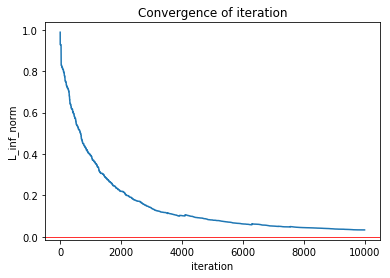

--------------------------------
0.02 0.84
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 2, 2]
	 value function of final iteration:  [ 0.87170562  0.92379106  0.98765873  0.          0.81661794  0.89350112
  0.          0.76474595  0.70471938  0.63795452  0.56256093]
	 plot convengence of value function: 


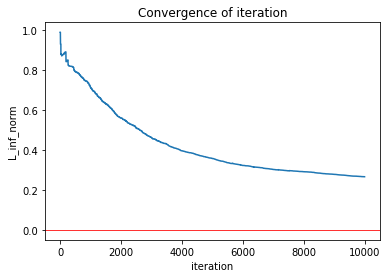

--------------------------------
0.02 0.85
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87449005  0.92830738  0.98814133  0.          0.81853407  0.92447993
  0.          0.76682666  0.72637924  0.85353955  0.77692168]
	 plot convengence of value function: 


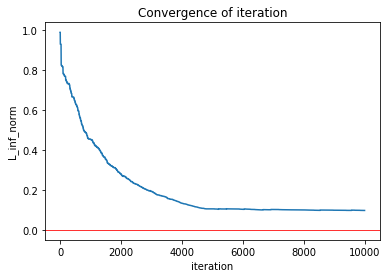

--------------------------------
0.02 0.86
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.87227479  0.92575711  0.98828887  0.          0.81130493  0.92525411
  0.          0.73520073  0.79664969  0.86347905  0.79143856]
	 plot convengence of value function: 


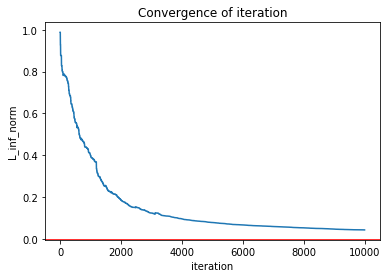

--------------------------------
0.02 0.87
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87281271  0.92525281  0.98782001  0.          0.81661396  0.9227335   0.
  0.76288792  0.78078756  0.85333612  0.77534694]
	 plot convengence of value function: 


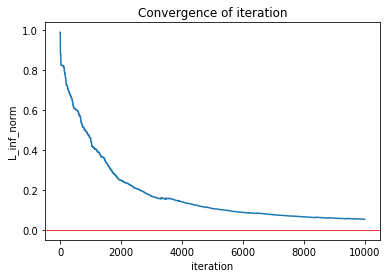

--------------------------------
0.02 0.88
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.87067364  0.92362713  0.98697004  0.          0.80798303  0.92262719
  0.          0.70849963  0.78302058  0.85766414  0.76402653]
	 plot convengence of value function: 


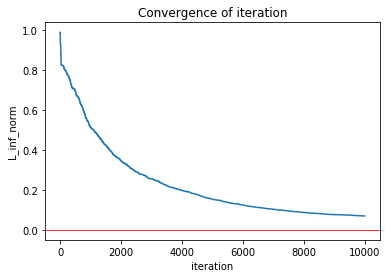

--------------------------------
0.02 0.89
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.87260127  0.92617353  0.98779353  0.          0.80457715  0.92387986
  0.          0.72625337  0.78505412  0.85496233  0.78648281]
	 plot convengence of value function: 


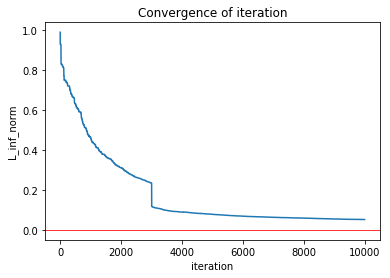

--------------------------------
0.02 0.9
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.87255665  0.92674218  0.98817183  0.          0.81231267  0.92273417
  0.          0.71470067  0.78471093  0.85670672  0.77701658]
	 plot convengence of value function: 


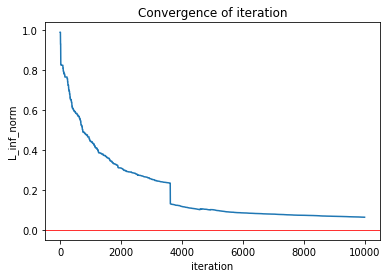

--------------------------------
0.02 0.91
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87280002  0.92546613  0.98717057  0.          0.81353607  0.91997664
  0.          0.7569318   0.64640742  0.84528002  0.74603076]
	 plot convengence of value function: 


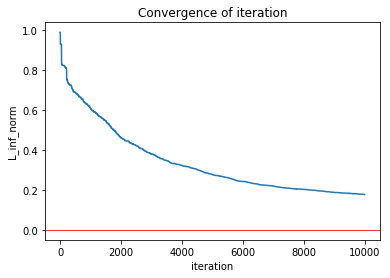

--------------------------------
0.02 0.92
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.8727239   0.9251782   0.98764693  0.          0.81456398  0.92179521
  0.          0.75426487  0.65756674  0.84783954  0.56426046]
	 plot convengence of value function: 


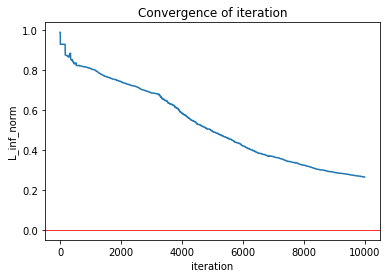

--------------------------------
0.02 0.93
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87071776  0.92507325  0.98755439  0.          0.80545934  0.92104902
  0.          0.73269787  0.66885884  0.85988525  0.70795563]
	 plot convengence of value function: 


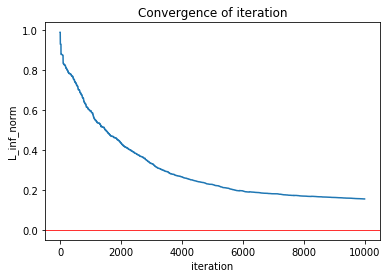

--------------------------------
0.02 0.94
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.8726582   0.92592082  0.98778454  0.          0.8150447   0.92444819
  0.          0.75544691  0.4400222   0.85957509  0.78140648]
	 plot convengence of value function: 


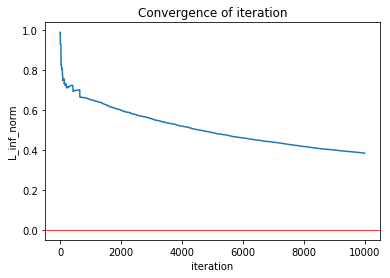

--------------------------------
0.02 0.95
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86522968  0.92227952  0.98723538  0.          0.79576988  0.92045156
  0.          0.717325    0.5759466   0.85338285  0.63517623]
	 plot convengence of value function: 


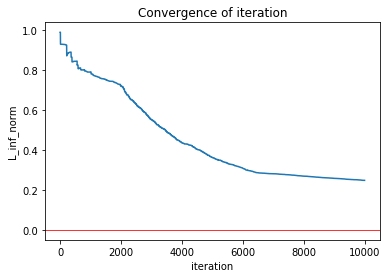

--------------------------------
0.02 0.96
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87384549  0.92664647  0.98803131  0.          0.80537197  0.91644017
  0.          0.74189783  0.57939687  0.82437325  0.5988764 ]
	 plot convengence of value function: 


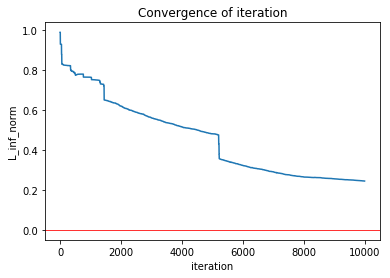

--------------------------------
0.02 0.97
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.8650337   0.92166938  0.98676513  0.          0.79894432  0.91765339
  0.          0.73489876  0.68848408  0.84044168  0.66103697]
	 plot convengence of value function: 


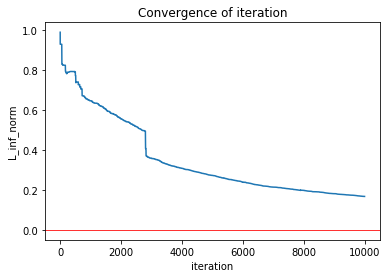

--------------------------------
0.02 0.98
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86213417  0.92119157  0.98718341  0.          0.7732362   0.91879296
  0.          0.62284908  0.43974797  0.84689159  0.65774707]
	 plot convengence of value function: 


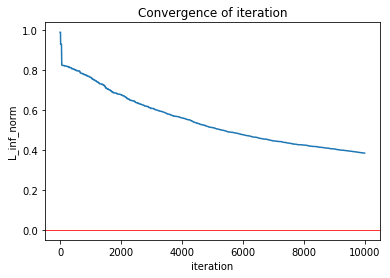

--------------------------------
0.02 0.99
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87434622  0.92683457  0.98810748  0.          0.79559421  0.9206867   0.
  0.63074088  0.59077496  0.84019089  0.58543283]
	 plot convengence of value function: 


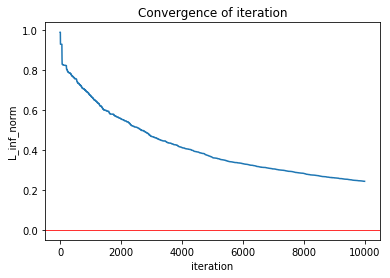

--------------------------------
0.03 0.51
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87046308  0.92771061  0.98350442  0.          0.81917146  0.92454137
  0.          0.77317378  0.73409326  0.82082027  0.76212484]
	 plot convengence of value function: 


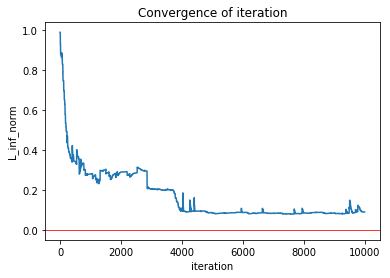

--------------------------------
0.03 0.52
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87707659  0.92501487  0.98674589  0.          0.82125867  0.91917306
  0.          0.77266577  0.79127484  0.82749546  0.79477205]
	 plot convengence of value function: 


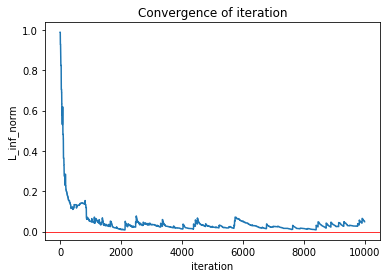

--------------------------------
0.03 0.53
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87297486  0.92896949  0.99134835  0.          0.82001215  0.92892045
  0.          0.7761504   0.80791389  0.86544739  0.81475255]
	 plot convengence of value function: 


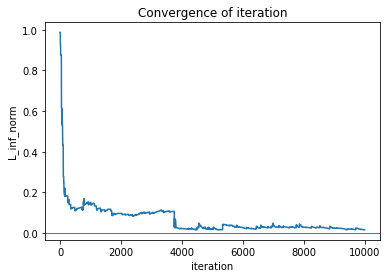

--------------------------------
0.03 0.54
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87244415  0.92565603  0.98896825  0.          0.82148351  0.92310373
  0.          0.7727329   0.79031053  0.84887479  0.79614586]
	 plot convengence of value function: 


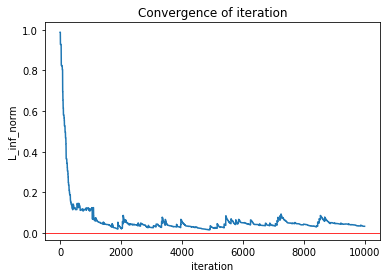

--------------------------------
0.03 0.55
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87302905  0.92687292  0.98976038  0.          0.82058809  0.92215823
  0.          0.77448332  0.74058233  0.85307536  0.79416401]
	 plot convengence of value function: 


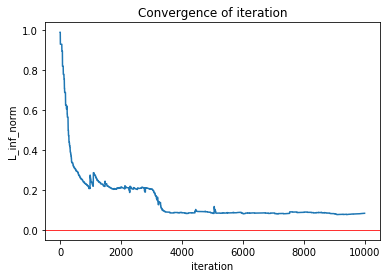

--------------------------------
0.03 0.56
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87098264  0.9191471   0.98470459  0.          0.82104387  0.92756037
  0.          0.77221279  0.74341554  0.86893007  0.79735826]
	 plot convengence of value function: 


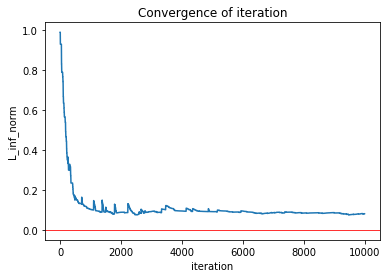

--------------------------------
0.03 0.57
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87236305  0.92400313  0.98428015  0.          0.81464015  0.92766569
  0.          0.77096031  0.73797853  0.86689881  0.80857095]
	 plot convengence of value function: 


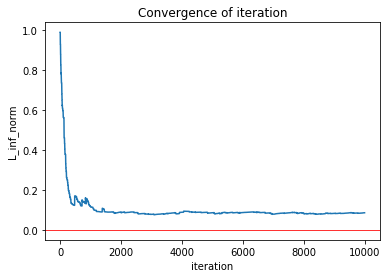

--------------------------------
0.03 0.58
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87334443  0.92554378  0.98671162  0.          0.81756277  0.92923583
  0.          0.77093014  0.74158786  0.87052135  0.79766959]
	 plot convengence of value function: 


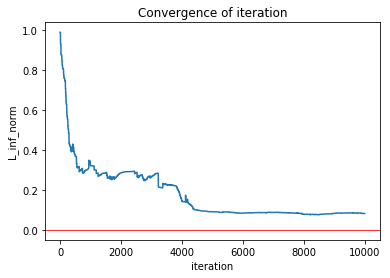

--------------------------------
0.03 0.59
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87277148  0.92388438  0.9867646   0.          0.8180031   0.92253159
  0.          0.77158789  0.7821411   0.84525597  0.78584283]
	 plot convengence of value function: 


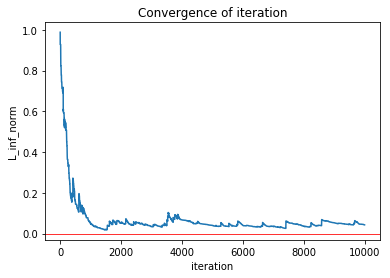

--------------------------------
0.03 0.6
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87129555  0.92056964  0.98600933  0.          0.81446777  0.92305977
  0.          0.77162756  0.73929318  0.8583487   0.81683299]
	 plot convengence of value function: 


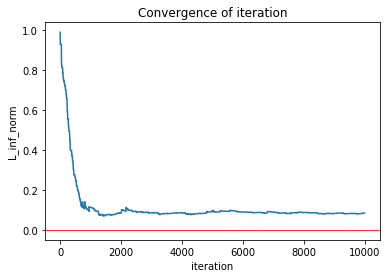

--------------------------------
0.03 0.61
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87412448  0.92611817  0.98994274  0.          0.81735187  0.9278722   0.
  0.77033645  0.73680708  0.85916909  0.78869538]
	 plot convengence of value function: 


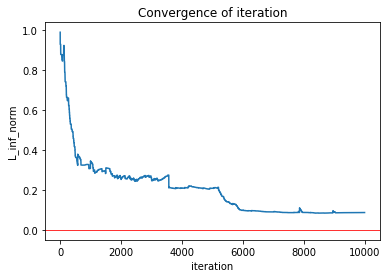

--------------------------------
0.03 0.62
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87489155  0.92780933  0.98731509  0.          0.81836388  0.9272871   0.
  0.77289201  0.73618899  0.84196446  0.76397985]
	 plot convengence of value function: 


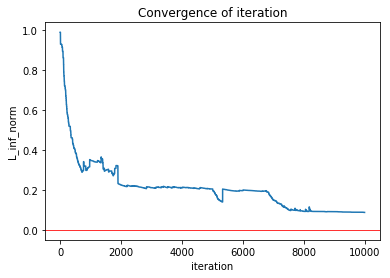

--------------------------------
0.03 0.63
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87407417  0.92782029  0.9882938   0.          0.81870956  0.9254289   0.
  0.76997474  0.80297304  0.86231874  0.80607423]
	 plot convengence of value function: 


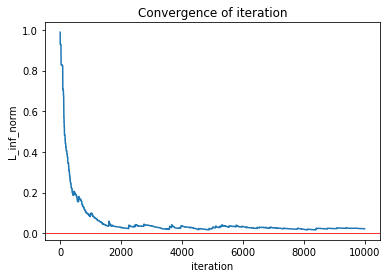

--------------------------------
0.03 0.64
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.8713471   0.92160812  0.98500581  0.          0.81817669  0.92055665
  0.          0.77143265  0.79555282  0.85982565  0.80305805]
	 plot convengence of value function: 


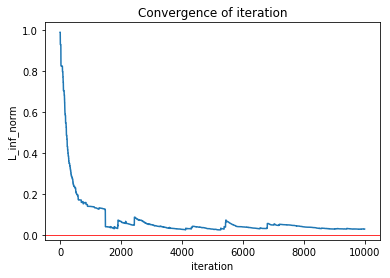

--------------------------------
0.03 0.65
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.8717516   0.92241945  0.98668865  0.          0.81817593  0.92659077
  0.          0.76969992  0.73195774  0.86672047  0.80050628]
	 plot convengence of value function: 


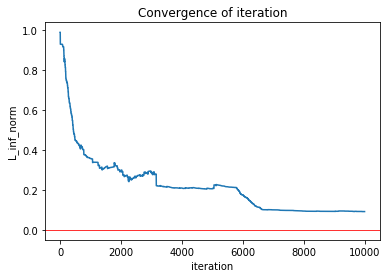

--------------------------------
0.03 0.66
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87319883  0.92398291  0.98848347  0.          0.81965316  0.92725351
  0.          0.77032134  0.73350972  0.82680634  0.79188571]
	 plot convengence of value function: 


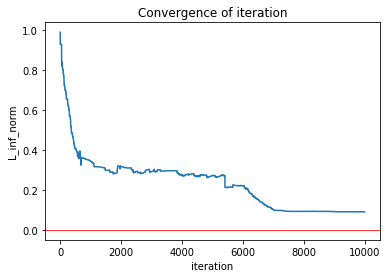

--------------------------------
0.03 0.67
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87221538  0.92589437  0.9882873   0.          0.81833341  0.92372318
  0.          0.77106004  0.73813306  0.86400006  0.8089635 ]
	 plot convengence of value function: 


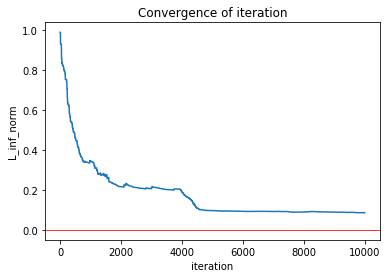

--------------------------------
0.03 0.68
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87237599  0.92414926  0.98545699  0.          0.81810103  0.92050896
  0.          0.7692055   0.73658434  0.84630042  0.79549951]
	 plot convengence of value function: 


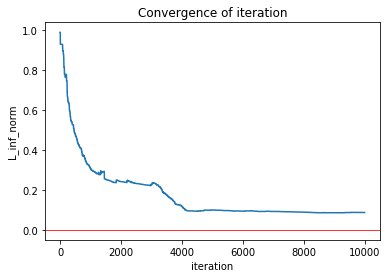

--------------------------------
0.03 0.69
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87538416  0.92698869  0.98939221  0.          0.82105525  0.92213644
  0.          0.7729144   0.73210694  0.83535215  0.76652612]
	 plot convengence of value function: 


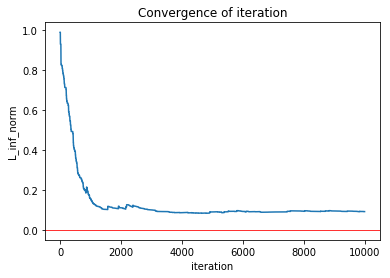

--------------------------------
0.03 0.7
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87444388  0.9276154   0.98864205  0.          0.81574719  0.92594398
  0.          0.76957443  0.73554651  0.8679174   0.80307838]
	 plot convengence of value function: 


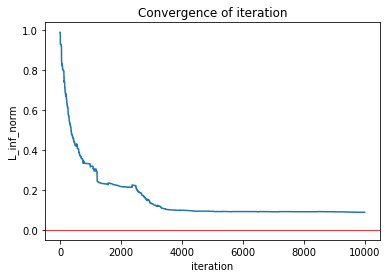

--------------------------------
0.03 0.71
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87251619  0.9258435   0.98845217  0.          0.81840708  0.92413962
  0.          0.77244468  0.73173102  0.86218397  0.71463401]
	 plot convengence of value function: 


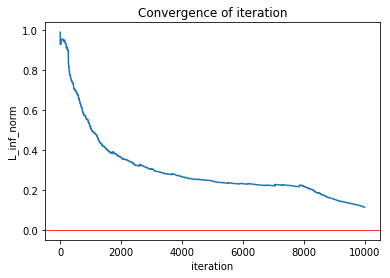

--------------------------------
0.03 0.72
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87227365  0.92430065  0.98671495  0.          0.81642958  0.92080125
  0.          0.76943597  0.73333102  0.85742528  0.78915465]
	 plot convengence of value function: 


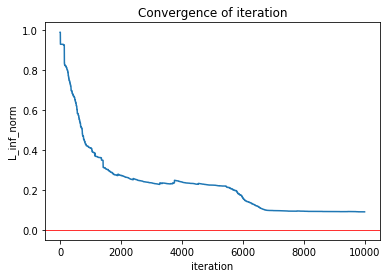

--------------------------------
0.03 0.73
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87108768  0.92300797  0.98762017  0.          0.81701223  0.91955821
  0.          0.76629196  0.72963778  0.85250168  0.78755717]
	 plot convengence of value function: 


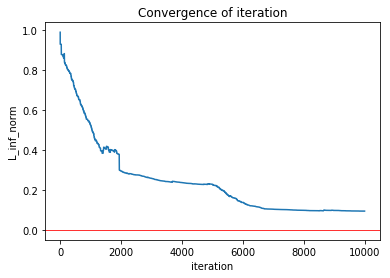

--------------------------------
0.03 0.74
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87320607  0.92673901  0.98975482  0.          0.81842028  0.92526357
  0.          0.76919736  0.73019649  0.86412169  0.80622385]
	 plot convengence of value function: 


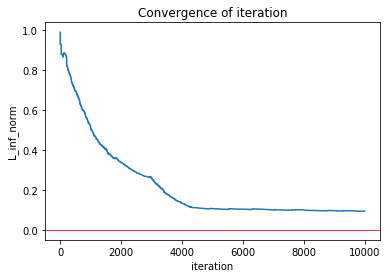

--------------------------------
0.03 0.75
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87350586  0.92675682  0.98795646  0.          0.81757317  0.92278577
  0.          0.76979619  0.72799039  0.84968028  0.77102564]
	 plot convengence of value function: 


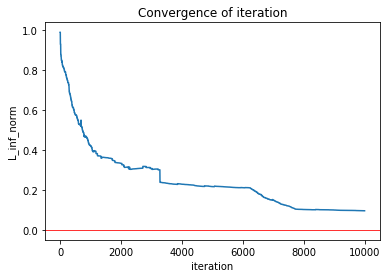

--------------------------------
0.03 0.76
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87458926  0.92549947  0.9875075   0.          0.81714694  0.92266171
  0.          0.76845502  0.79460155  0.85411743  0.80103122]
	 plot convengence of value function: 


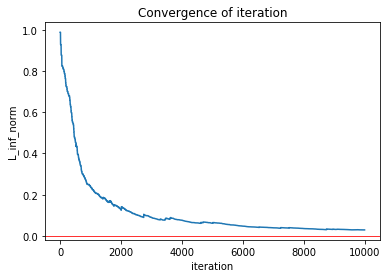

--------------------------------
0.03 0.77
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.87174754  0.92360415  0.98684516  0.          0.81102533  0.92324127
  0.          0.74884453  0.79468121  0.85362379  0.79810941]
	 plot convengence of value function: 


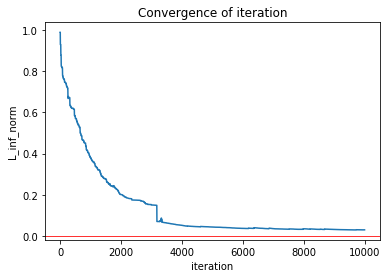

--------------------------------
0.03 0.78
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87216995  0.92525418  0.98638378  0.          0.81718301  0.92087927
  0.          0.76646195  0.72465828  0.85873866  0.79116427]
	 plot convengence of value function: 


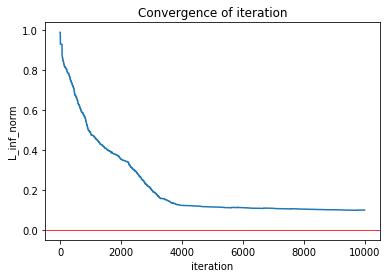

--------------------------------
0.03 0.79
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.8728532   0.92649095  0.98810803  0.          0.81703264  0.92148707
  0.          0.76350181  0.72184531  0.8541788   0.78176143]
	 plot convengence of value function: 


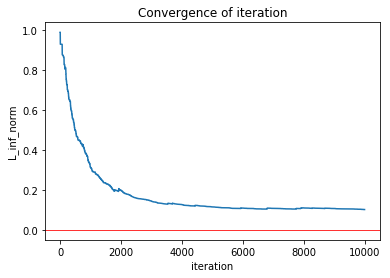

--------------------------------
0.03 0.8
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87001159  0.92286575  0.98708543  0.          0.81193582  0.9182657   0.
  0.76483094  0.71711339  0.8467821   0.78819538]
	 plot convengence of value function: 


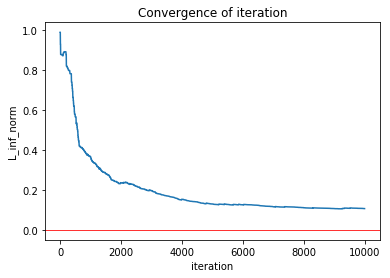

--------------------------------
0.03 0.81
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87246603  0.92608525  0.98871536  0.          0.816149    0.92374776
  0.          0.76802507  0.79606625  0.86164831  0.79990475]
	 plot convengence of value function: 


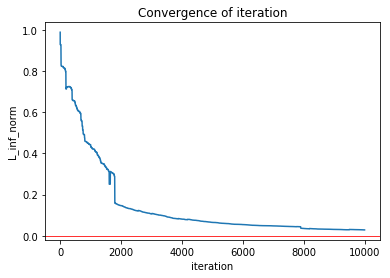

--------------------------------
0.03 0.82
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87202762  0.92492431  0.98867157  0.          0.81740891  0.92193017
  0.          0.76111678  0.71875654  0.85619306  0.78097823]
	 plot convengence of value function: 


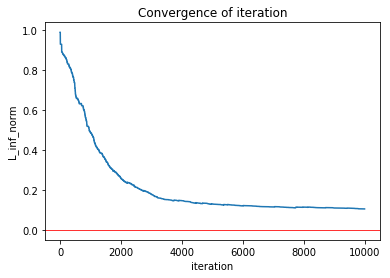

--------------------------------
0.03 0.83
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.87202814  0.92453813  0.9877053   0.          0.80985469  0.92471263
  0.          0.74577728  0.79284678  0.85474068  0.78783596]
	 plot convengence of value function: 


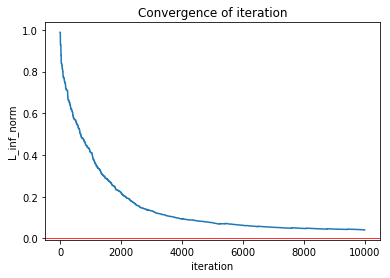

--------------------------------
0.03 0.84
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.87212193  0.92605389  0.98856005  0.          0.81335248  0.92381848
  0.          0.73698828  0.78672973  0.85191999  0.77818571]
	 plot convengence of value function: 


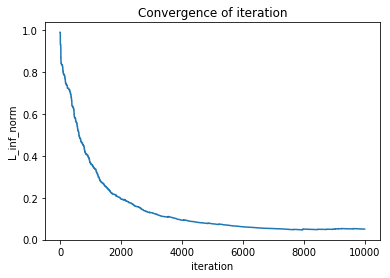

--------------------------------
0.03 0.85
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87241271  0.92442649  0.98754842  0.          0.81642198  0.91319195
  0.          0.76663889  0.70633071  0.83321     0.58482128]
	 plot convengence of value function: 


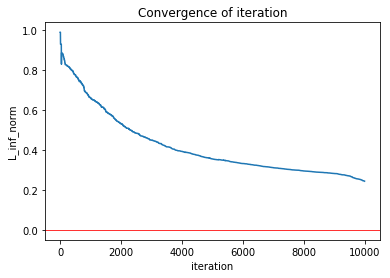

--------------------------------
0.03 0.86
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87268653  0.92501571  0.98865802  0.          0.8153401   0.92101281
  0.          0.76445001  0.68284558  0.84139362  0.7283677 ]
	 plot convengence of value function: 


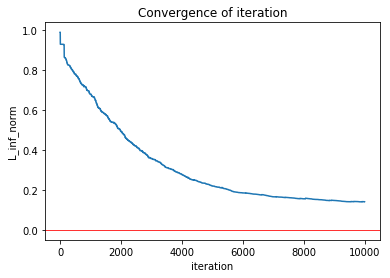

--------------------------------
0.03 0.87
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87165585  0.92453566  0.98756745  0.          0.81349554  0.92187231
  0.          0.75750097  0.70358128  0.83961615  0.77628072]
	 plot convengence of value function: 


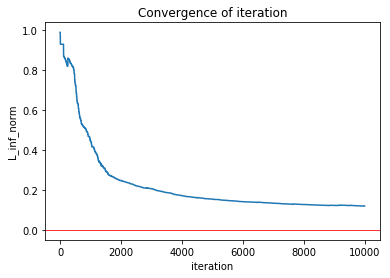

--------------------------------
0.03 0.88
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87097723  0.92482511  0.98793612  0.          0.80910509  0.92211139
  0.          0.74863724  0.67289052  0.85558988  0.73688064]
	 plot convengence of value function: 


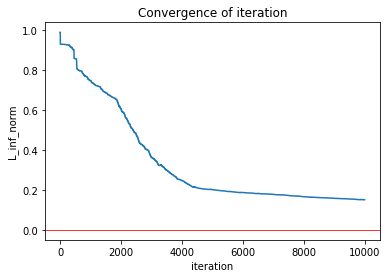

--------------------------------
0.03 0.89
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87202025  0.92524516  0.9875447   0.          0.81238788  0.92194337
  0.          0.76142822  0.77915211  0.85302161  0.77190461]
	 plot convengence of value function: 


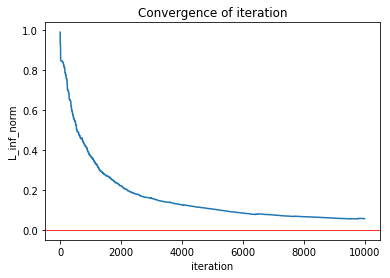

--------------------------------
0.03 0.9
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.8713018   0.92535585  0.98830981  0.          0.81560689  0.92048312
  0.          0.76020446  0.73262466  0.83849737  0.7405187 ]
	 plot convengence of value function: 


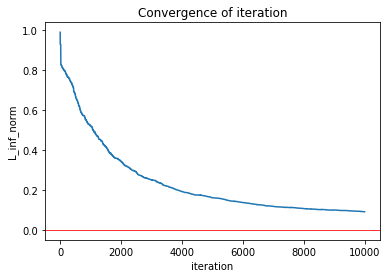

--------------------------------
0.03 0.91
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86929766  0.92332917  0.98742228  0.          0.81163438  0.89647724
  0.          0.76069875  0.68256272  0.79568479  0.46315829]
	 plot convengence of value function: 


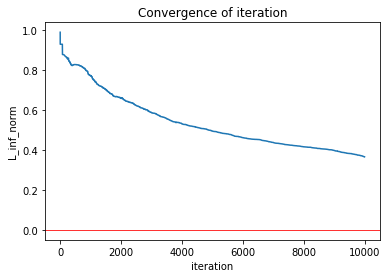

--------------------------------
0.03 0.92
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87069766  0.9245266   0.98767166  0.          0.81070478  0.9192856   0.
  0.7472346   0.67277224  0.83843329  0.68508497]
	 plot convengence of value function: 


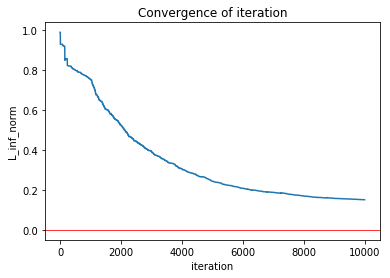

--------------------------------
0.03 0.93
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.86627647  0.92409669  0.98740928  0.          0.79566803  0.92178682
  0.          0.72006365  0.78455373  0.8533644   0.77571119]
	 plot convengence of value function: 


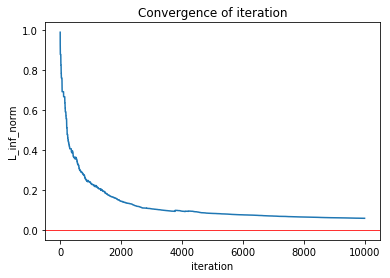

--------------------------------
0.03 0.94
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86963386  0.92325762  0.98733123  0.          0.80404671  0.92030964
  0.          0.73157673  0.63846123  0.8446903   0.70345131]
	 plot convengence of value function: 


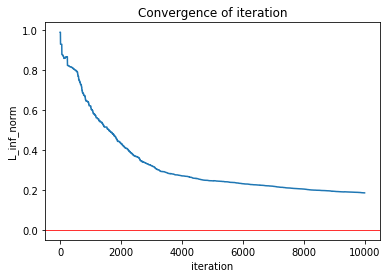

--------------------------------
0.03 0.95
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.8664242   0.92346068  0.98745772  0.          0.78722978  0.91830197
  0.          0.64467438  0.7476151   0.83283243  0.67490862]
	 plot convengence of value function: 


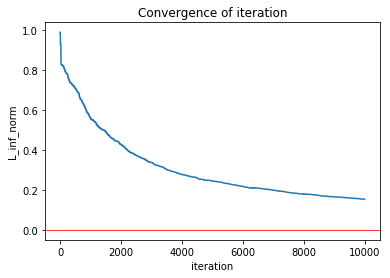

--------------------------------
0.03 0.96
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86471017  0.92026861  0.98690106  0.          0.79678463  0.89733526
  0.          0.72501895  0.62053069  0.7967519   0.36101416]
	 plot convengence of value function: 


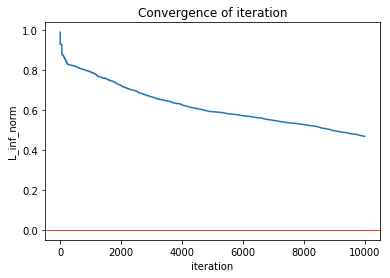

--------------------------------
0.03 0.97
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86210368  0.92075537  0.98659567  0.          0.79313743  0.91239233
  0.          0.72347792  0.66522765  0.81973448  0.70946372]
	 plot convengence of value function: 


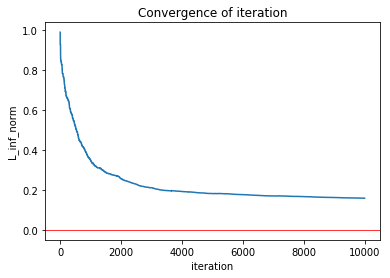

--------------------------------
0.03 0.98
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86411801  0.92026106  0.98653755  0.          0.79289956  0.91762525
  0.          0.7087918   0.59695837  0.83888376  0.69027722]
	 plot convengence of value function: 


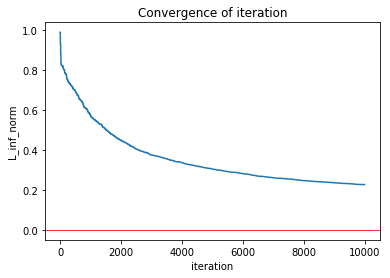

--------------------------------
0.03 0.99
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 2, 2]
	 value function of final iteration:  [ 0.86068742  0.91746826  0.98705141  0.          0.79295796  0.86729197
  0.          0.72480797  0.6247575   0.48688652  0.3513357 ]
	 plot convengence of value function: 


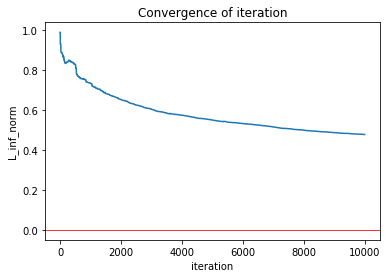

--------------------------------
0.04 0.51
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87321325  0.92629802  0.98625891  0.          0.81777716  0.9223972   0.
  0.76981555  0.73199202  0.84225237  0.78918476]
	 plot convengence of value function: 


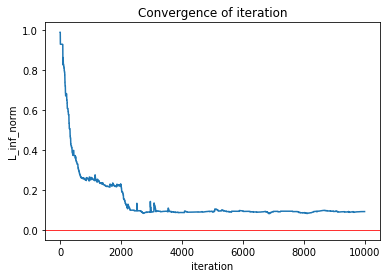

--------------------------------
0.04 0.52
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87011809  0.91821795  0.98691769  0.          0.81602534  0.92364364
  0.          0.77136437  0.80075998  0.84767648  0.7974871 ]
	 plot convengence of value function: 


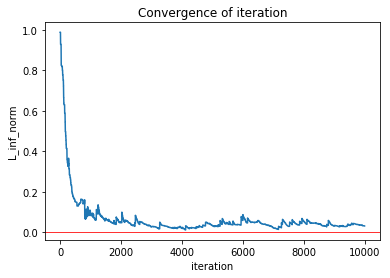

--------------------------------
0.04 0.53
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87416486  0.92389417  0.98736762  0.          0.81084853  0.92200911
  0.          0.76346368  0.80215265  0.86090706  0.80429002]
	 plot convengence of value function: 


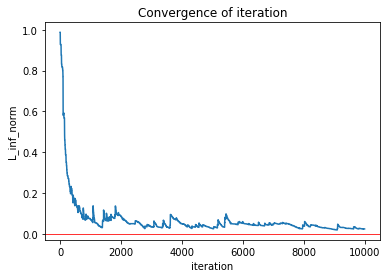

--------------------------------
0.04 0.54
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86871704  0.9251129   0.98947297  0.          0.81302426  0.93042248
  0.          0.76785277  0.79076896  0.84587194  0.77051761]
	 plot convengence of value function: 


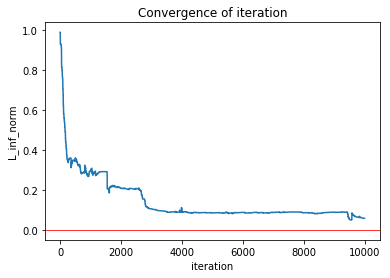

--------------------------------
0.04 0.55
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86895046  0.92404659  0.98993237  0.          0.81254915  0.92447989
  0.          0.76960265  0.72922269  0.86365414  0.79543021]
	 plot convengence of value function: 


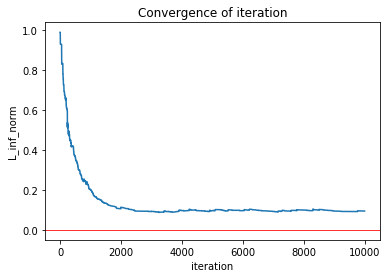

--------------------------------
0.04 0.56
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87182871  0.92137601  0.98938711  0.          0.81987379  0.91091087
  0.          0.76933316  0.76800835  0.82646441  0.76733214]
	 plot convengence of value function: 


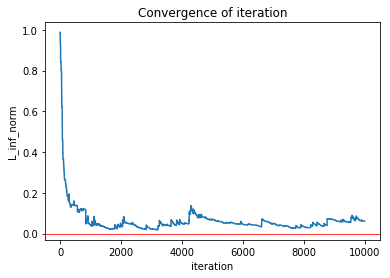

--------------------------------
0.04 0.57
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87018148  0.92337995  0.98769527  0.          0.81651553  0.91900341
  0.          0.77009898  0.8055892   0.85467209  0.78792881]
	 plot convengence of value function: 


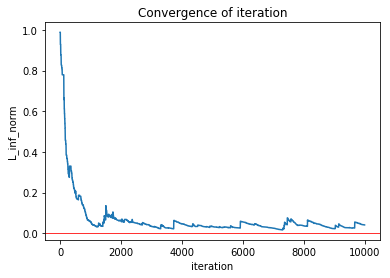

--------------------------------
0.04 0.58
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87267623  0.92645073  0.98715626  0.          0.81530112  0.92589327
  0.          0.76847414  0.79777931  0.86833635  0.79215128]
	 plot convengence of value function: 


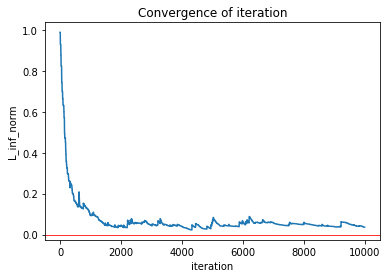

--------------------------------
0.04 0.59
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87067143  0.92490948  0.99016864  0.          0.81662467  0.92704468
  0.          0.76845901  0.79589592  0.85196146  0.79593386]
	 plot convengence of value function: 


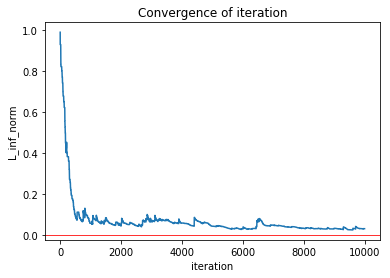

--------------------------------
0.04 0.6
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87046897  0.92369994  0.9876612   0.          0.81726735  0.92700743
  0.          0.76718965  0.73486564  0.84459737  0.79980516]
	 plot convengence of value function: 


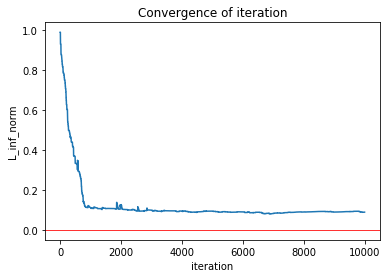

--------------------------------
0.04 0.61
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87268178  0.92501721  0.9854394   0.          0.81978201  0.92070646
  0.          0.77204203  0.80747018  0.85298248  0.80518699]
	 plot convengence of value function: 


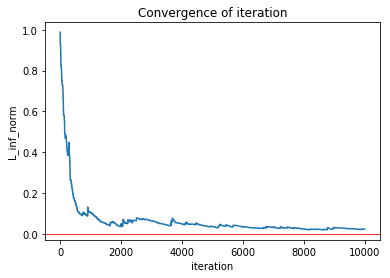

--------------------------------
0.04 0.62
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87014     0.92383399  0.98772818  0.          0.81920126  0.92276748
  0.          0.7734517   0.79542356  0.84971446  0.7870595 ]
	 plot convengence of value function: 


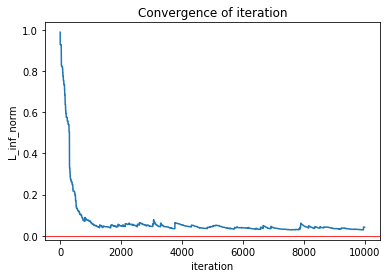

--------------------------------
0.04 0.63
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87263895  0.92875323  0.98786336  0.          0.81706414  0.92269282
  0.          0.76768321  0.73501541  0.84448699  0.78272264]
	 plot convengence of value function: 


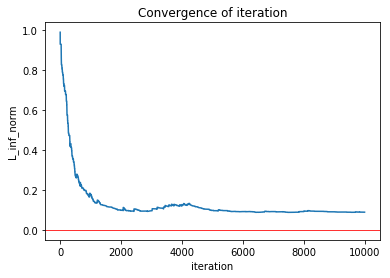

--------------------------------
0.04 0.64
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87157611  0.92290798  0.9875971   0.          0.81689733  0.92055984
  0.          0.76732379  0.77702877  0.83548249  0.77814685]
	 plot convengence of value function: 


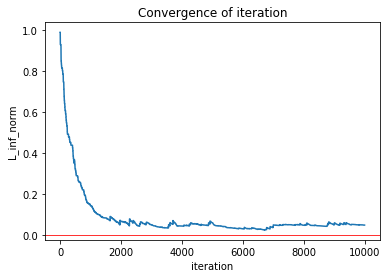

--------------------------------
0.04 0.65
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86731361  0.92117029  0.98757423  0.          0.81402797  0.92414542
  0.          0.767606    0.79346499  0.85376678  0.79379035]
	 plot convengence of value function: 


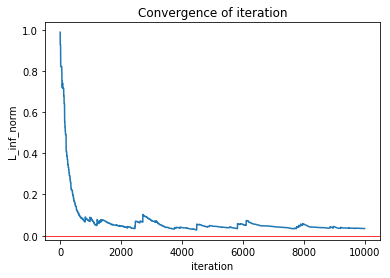

--------------------------------
0.04 0.66
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87045428  0.92341929  0.98756888  0.          0.81442694  0.91889375
  0.          0.76979402  0.73147985  0.84569336  0.79004674]
	 plot convengence of value function: 


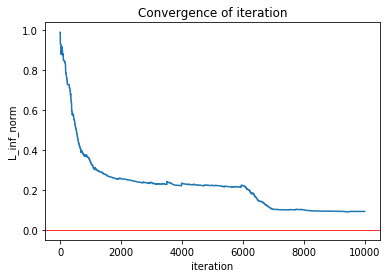

--------------------------------
0.04 0.67
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87215449  0.92144689  0.98733413  0.          0.81880652  0.92127284
  0.          0.77213171  0.73494202  0.85172961  0.78913024]
	 plot convengence of value function: 


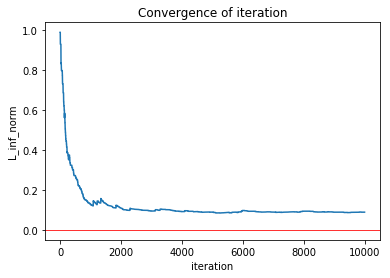

--------------------------------
0.04 0.68
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87291789  0.92850236  0.98905818  0.          0.82029861  0.92476167
  0.          0.77690796  0.78845506  0.85492288  0.79226959]
	 plot convengence of value function: 


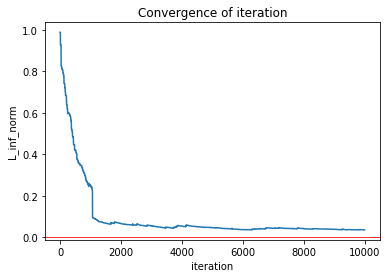

--------------------------------
0.04 0.69
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87140217  0.92741169  0.98831197  0.          0.81503199  0.92299204
  0.          0.76799262  0.79220818  0.83818508  0.78333232]
	 plot convengence of value function: 


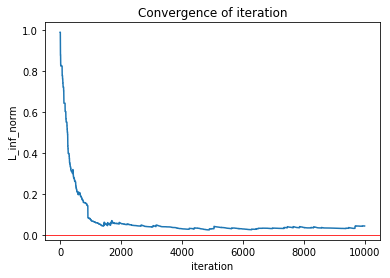

--------------------------------
0.04 0.7
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87084511  0.92465223  0.98687854  0.          0.81424405  0.92093587
  0.          0.75962603  0.79083638  0.85913096  0.7842785 ]
	 plot convengence of value function: 


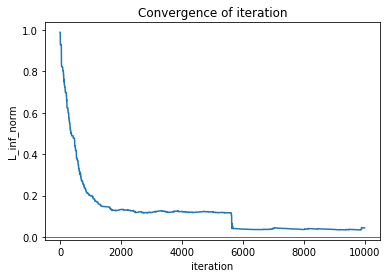

--------------------------------
0.04 0.71
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87274014  0.92636114  0.98848875  0.          0.81878855  0.92028511
  0.          0.7702407   0.73327834  0.83350145  0.77540121]
	 plot convengence of value function: 


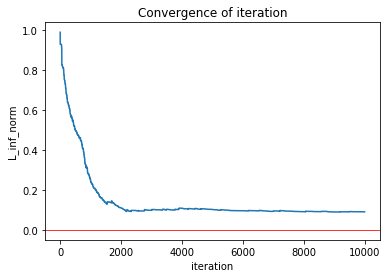

--------------------------------
0.04 0.72
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87154404  0.92343547  0.9890557   0.          0.81639777  0.92451284
  0.          0.76857633  0.79115763  0.85556552  0.79312934]
	 plot convengence of value function: 


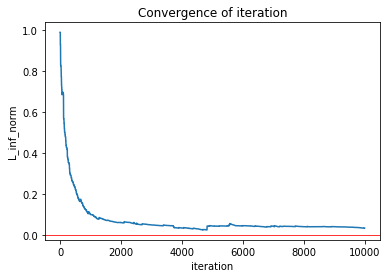

--------------------------------
0.04 0.73
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87174974  0.92444826  0.98724635  0.          0.81566968  0.92128722
  0.          0.76838581  0.73724066  0.85416489  0.79015891]
	 plot convengence of value function: 


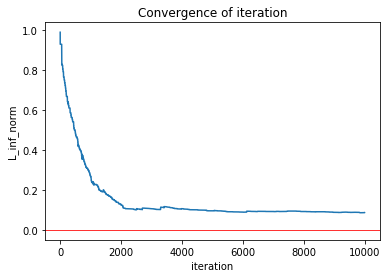

--------------------------------
0.04 0.74
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87468649  0.92769337  0.98944299  0.          0.82146982  0.92315038
  0.          0.76933883  0.77808261  0.84061073  0.79085029]
	 plot convengence of value function: 


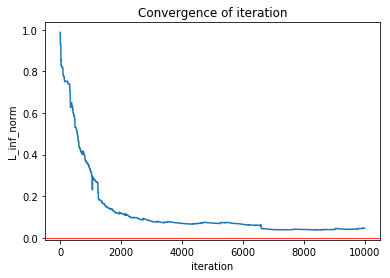

--------------------------------
0.04 0.75
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87288445  0.92556207  0.98763029  0.          0.81837533  0.92208015
  0.          0.77061574  0.78506899  0.84344921  0.77686343]
	 plot convengence of value function: 


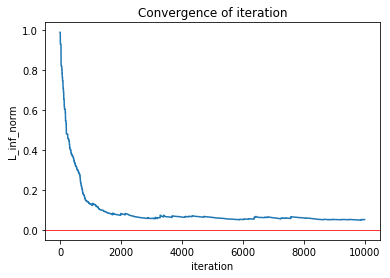

--------------------------------
0.04 0.76
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.8729891   0.92368026  0.9866323   0.          0.81840215  0.91985459
  0.          0.7719887   0.79148217  0.83989928  0.79241037]
	 plot convengence of value function: 


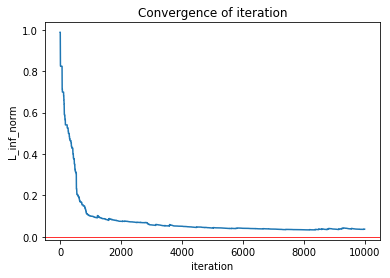

--------------------------------
0.04 0.77
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87274052  0.92513434  0.98804505  0.          0.81529287  0.92237687
  0.          0.7687191   0.78501732  0.84552206  0.78868009]
	 plot convengence of value function: 


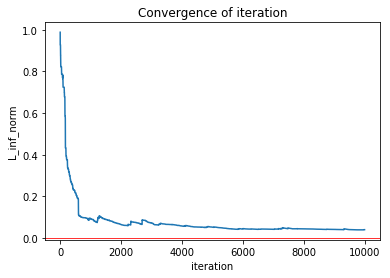

--------------------------------
0.04 0.78
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87290195  0.92554188  0.98723235  0.          0.81699335  0.92187913
  0.          0.76717786  0.78676236  0.85212502  0.79089923]
	 plot convengence of value function: 


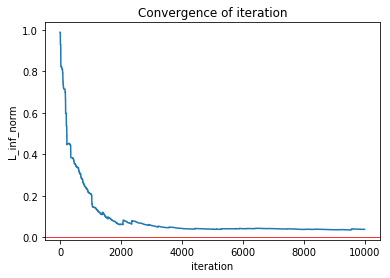

--------------------------------
0.04 0.79
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87024184  0.92360568  0.98683704  0.          0.81416093  0.92300165
  0.          0.76582217  0.78695631  0.83792323  0.78831853]
	 plot convengence of value function: 


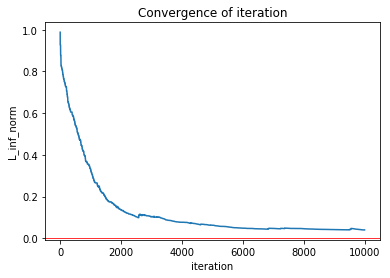

--------------------------------
0.04 0.8
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87257125  0.9260385   0.98849876  0.          0.81700315  0.92027263
  0.          0.76741981  0.72410876  0.84386343  0.7793785 ]
	 plot convengence of value function: 


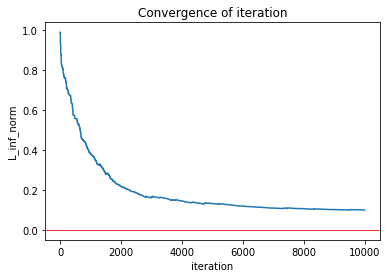

--------------------------------
0.04 0.81
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87220646  0.92504992  0.98792059  0.          0.81448073  0.91898333
  0.          0.76565364  0.72681747  0.84946583  0.78288337]
	 plot convengence of value function: 


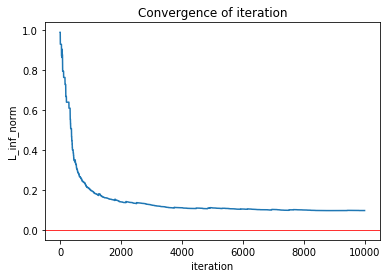

--------------------------------
0.04 0.82
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86997179  0.92276795  0.98724685  0.          0.81445786  0.91891622
  0.          0.76159848  0.77898079  0.84282235  0.77471031]
	 plot convengence of value function: 


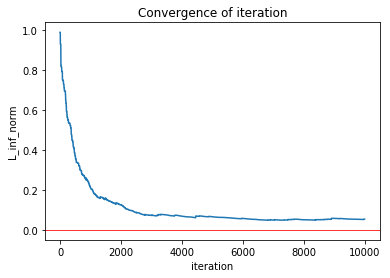

--------------------------------
0.04 0.83
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87113161  0.92440163  0.98743083  0.          0.81347502  0.91814109
  0.          0.76594875  0.72471027  0.84076348  0.76616081]
	 plot convengence of value function: 


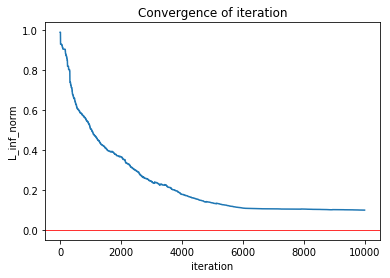

--------------------------------
0.04 0.84
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87238289  0.92508744  0.98794761  0.          0.81652517  0.91980282
  0.          0.76012613  0.70817413  0.83477213  0.75364743]
	 plot convengence of value function: 


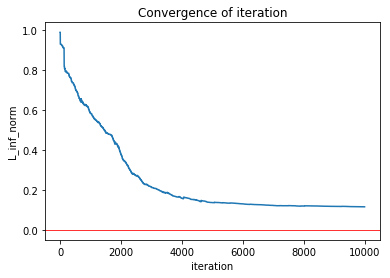

--------------------------------
0.04 0.85
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.87141582  0.92448108  0.98661895  0.          0.80897296  0.9193649   0.
  0.73758451  0.78662653  0.84246383  0.78728816]
	 plot convengence of value function: 


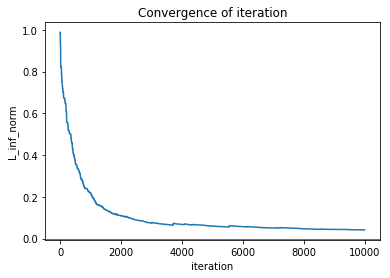

--------------------------------
0.04 0.86
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86887126  0.92234077  0.98601709  0.          0.80957839  0.9188063   0.
  0.75804163  0.70480133  0.84461531  0.71757155]
	 plot convengence of value function: 


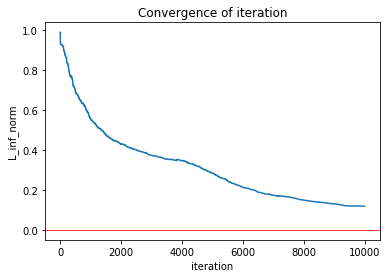

--------------------------------
0.04 0.87
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87025804  0.9234775   0.98771136  0.          0.81144766  0.91803702
  0.          0.7561426   0.75951939  0.84127952  0.755642  ]
	 plot convengence of value function: 


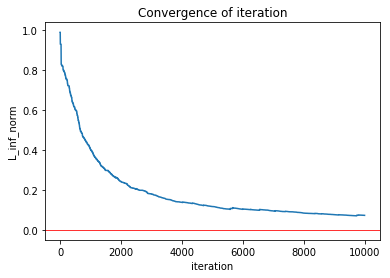

--------------------------------
0.04 0.88
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.87134094  0.92529532  0.98857409  0.          0.80365858  0.92187123
  0.          0.66866113  0.76857024  0.84452529  0.75915579]
	 plot convengence of value function: 


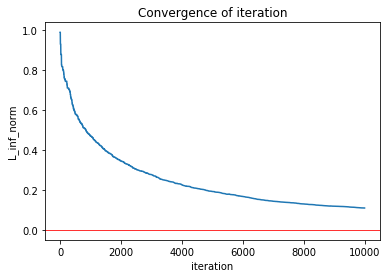

--------------------------------
0.04 0.89
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86969215  0.92477768  0.98723823  0.          0.80506721  0.91957191
  0.          0.73856111  0.76297935  0.8384494   0.73720092]
	 plot convengence of value function: 


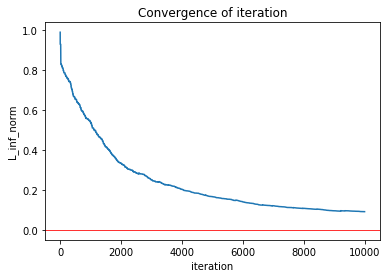

--------------------------------
0.04 0.9
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.86977807  0.92465404  0.9876454   0.          0.7764613   0.91832734
  0.          0.4955987   0.73994696  0.83794786  0.75689423]
	 plot convengence of value function: 


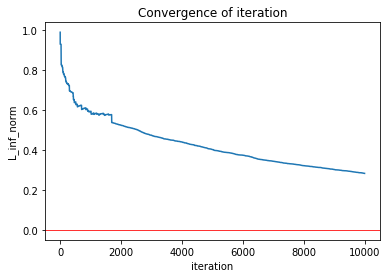

--------------------------------
0.04 0.91
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86914454  0.92331138  0.98717656  0.          0.80632628  0.91360704
  0.          0.74684758  0.66882228  0.80464692  0.69125516]
	 plot convengence of value function: 


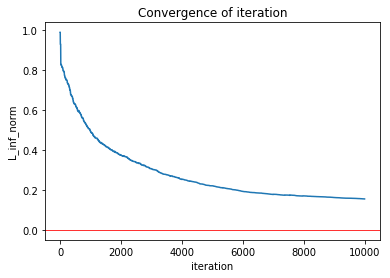

--------------------------------
0.04 0.92
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87142679  0.92442735  0.9881602   0.          0.81423018  0.91926524
  0.          0.76088515  0.7116803   0.84158663  0.73603317]
	 plot convengence of value function: 


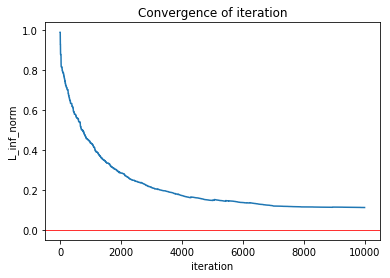

--------------------------------
0.04 0.93
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86892113  0.92317143  0.98737695  0.          0.80833339  0.91839596
  0.          0.75262799  0.68722228  0.83897813  0.72631001]
	 plot convengence of value function: 


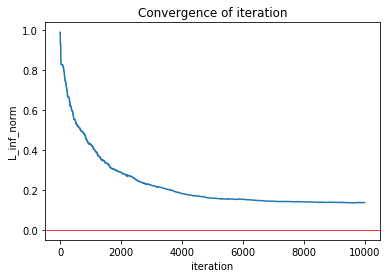

--------------------------------
0.04 0.94
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86648484  0.92218348  0.98748161  0.          0.80017042  0.9166394   0.
  0.72590737  0.62639099  0.82381235  0.62853468]
	 plot convengence of value function: 


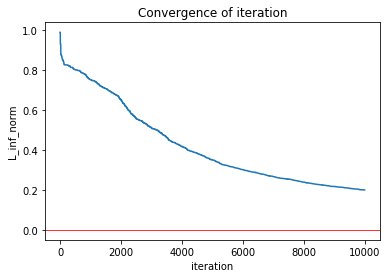

--------------------------------
0.04 0.95
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.8612715   0.92064478  0.98658909  0.          0.78207883  0.91875241
  0.          0.70054573  0.61407485  0.83730227  0.71029699]
	 plot convengence of value function: 


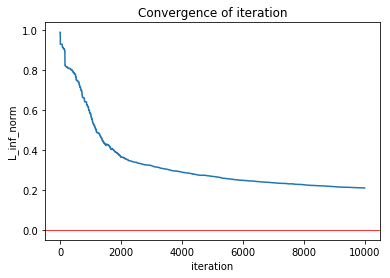

--------------------------------
0.04 0.96
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85768057  0.91820683  0.98651124  0.          0.78439937  0.91287869
  0.          0.71632061  0.71021807  0.81886959  0.71459866]
	 plot convengence of value function: 


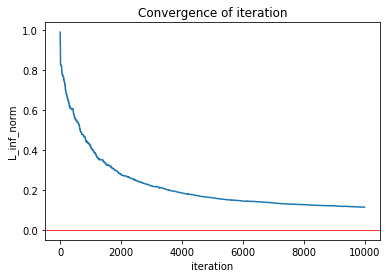

--------------------------------
0.04 0.97
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86607309  0.9231582   0.98700016  0.          0.80253583  0.9179775   0.
  0.73841356  0.74843262  0.83464238  0.74904066]
	 plot convengence of value function: 


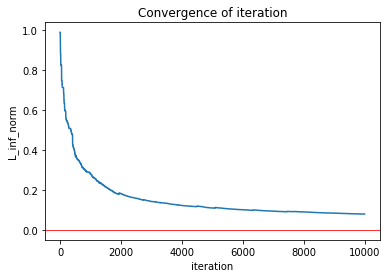

--------------------------------
0.04 0.98
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86227872  0.92018093  0.98705586  0.          0.79627478  0.91381033
  0.          0.72930106  0.68957694  0.82073194  0.71492955]
	 plot convengence of value function: 


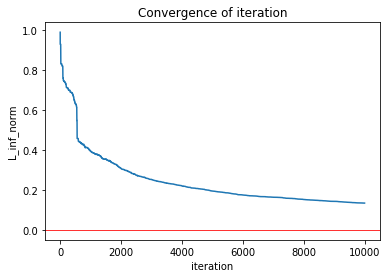

--------------------------------
0.04 0.99
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86856088  0.92268369  0.98776195  0.          0.8024772   0.91351294
  0.          0.71449903  0.57098016  0.81337694  0.49975883]
	 plot convengence of value function: 


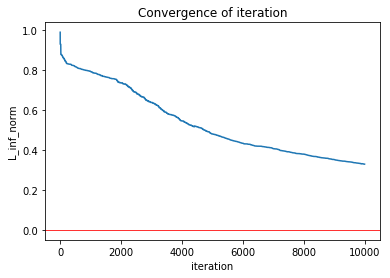

--------------------------------
0.05 0.51
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87677048  0.92878275  0.988091    0.          0.81691778  0.91909709
  0.          0.76523258  0.80344843  0.85034089  0.79294501]
	 plot convengence of value function: 


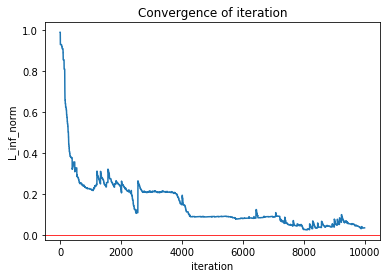

--------------------------------
0.05 0.52
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87601801  0.92830534  0.98632885  0.          0.82226131  0.9192754   0.
  0.77601897  0.73277402  0.85528298  0.79259052]
	 plot convengence of value function: 


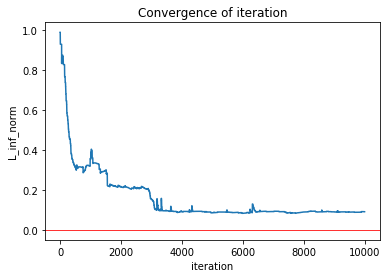

--------------------------------
0.05 0.53
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87275202  0.9207675   0.98720653  0.          0.81152824  0.92489666
  0.          0.76805512  0.7996671   0.87083717  0.8100076 ]
	 plot convengence of value function: 


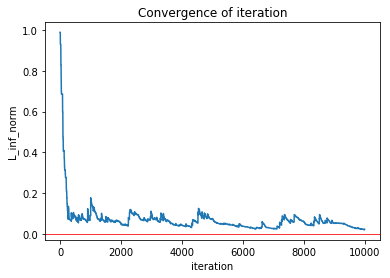

--------------------------------
0.05 0.54
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.8666754   0.92295596  0.9885596   0.          0.810858    0.92414932
  0.          0.76840016  0.79245911  0.82654253  0.79360738]
	 plot convengence of value function: 


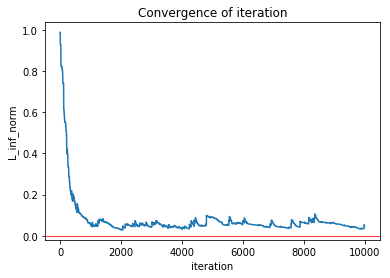

--------------------------------
0.05 0.55
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86890836  0.92095552  0.98533658  0.          0.81569279  0.91753887
  0.          0.76801424  0.76967388  0.82091554  0.77503771]
	 plot convengence of value function: 


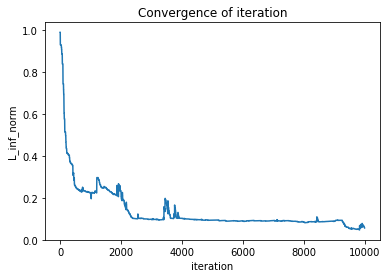

--------------------------------
0.05 0.56
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86761726  0.91953293  0.98602359  0.          0.81340848  0.91315479
  0.          0.76956881  0.73242879  0.83417286  0.77641187]
	 plot convengence of value function: 


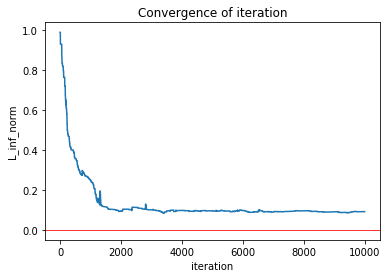

--------------------------------
0.05 0.57
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86845735  0.92442626  0.98827315  0.          0.81568521  0.91358061
  0.          0.77235026  0.78719567  0.84399362  0.78784841]
	 plot convengence of value function: 


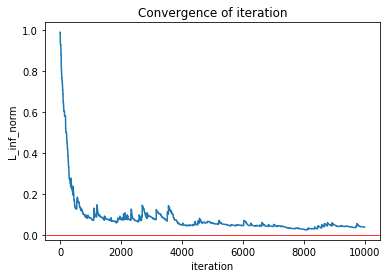

--------------------------------
0.05 0.58
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87039041  0.92109212  0.986478    0.          0.81575045  0.92105087
  0.          0.77122126  0.79376117  0.84504571  0.79543733]
	 plot convengence of value function: 


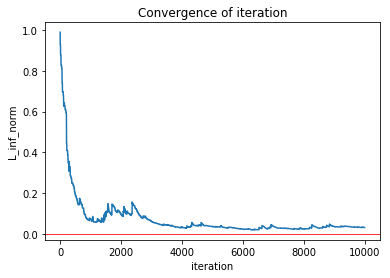

--------------------------------
0.05 0.59
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86679054  0.92269484  0.98723559  0.          0.81128268  0.91906367
  0.          0.76567278  0.73237956  0.83703616  0.77142718]
	 plot convengence of value function: 


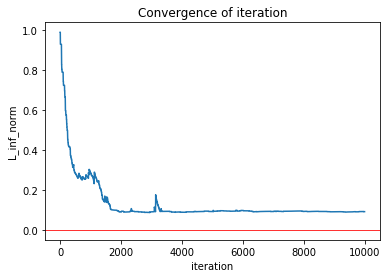

--------------------------------
0.05 0.6
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86857336  0.92410891  0.98845327  0.          0.81844717  0.91976416
  0.          0.77323165  0.79675192  0.84871283  0.80115452]
	 plot convengence of value function: 


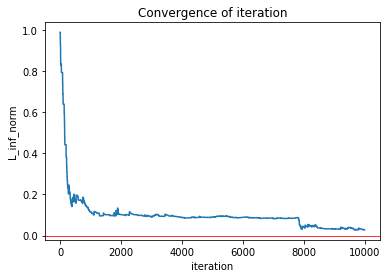

--------------------------------
0.05 0.61
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.8731066   0.9241643   0.98894369  0.          0.81781766  0.9210938   0.
  0.76838086  0.73622484  0.84081985  0.7667538 ]
	 plot convengence of value function: 


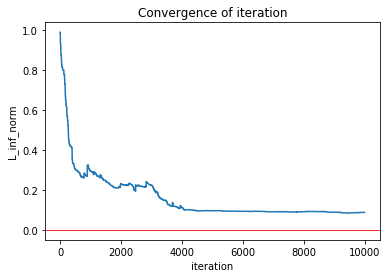

--------------------------------
0.05 0.62
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86962871  0.91992707  0.98785255  0.          0.81553629  0.91742     0.
  0.76677735  0.73297999  0.82953935  0.771343  ]
	 plot convengence of value function: 


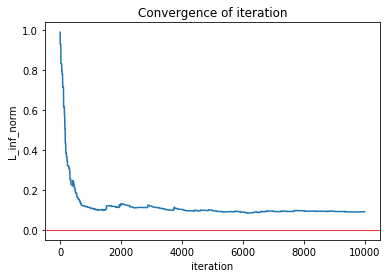

--------------------------------
0.05 0.63
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87220802  0.92261066  0.98565834  0.          0.81367821  0.91477951
  0.          0.76784208  0.73154838  0.8362538   0.77867152]
	 plot convengence of value function: 


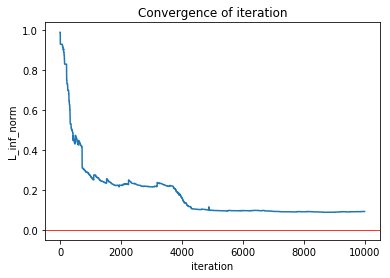

--------------------------------
0.05 0.64
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87293606  0.92434931  0.98698298  0.          0.81413945  0.92139044
  0.          0.76462666  0.78717986  0.85135967  0.79207964]
	 plot convengence of value function: 


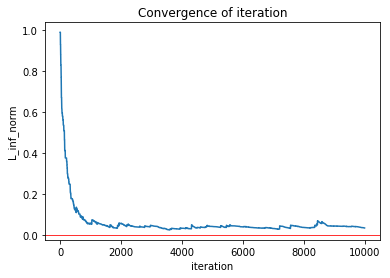

--------------------------------
0.05 0.65
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87122872  0.92777622  0.98763131  0.          0.81537895  0.9194517   0.
  0.76739935  0.72974699  0.80698867  0.77351866]
	 plot convengence of value function: 


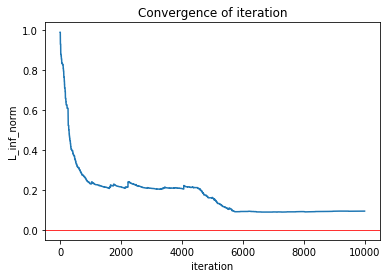

--------------------------------
0.05 0.66
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86919669  0.92153588  0.98809504  0.          0.81624391  0.91973582
  0.          0.76571573  0.73007531  0.84587212  0.78624521]
	 plot convengence of value function: 


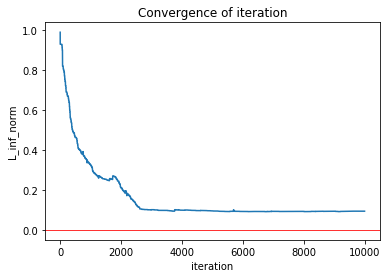

--------------------------------
0.05 0.67
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87063556  0.9246277   0.98776642  0.          0.81703788  0.91706887
  0.          0.76988231  0.78193855  0.82490256  0.78105723]
	 plot convengence of value function: 


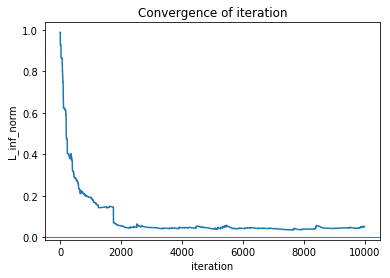

--------------------------------
0.05 0.68
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86899128  0.92222183  0.98769377  0.          0.81637708  0.91939136
  0.          0.76984234  0.73565116  0.83575074  0.77883118]
	 plot convengence of value function: 


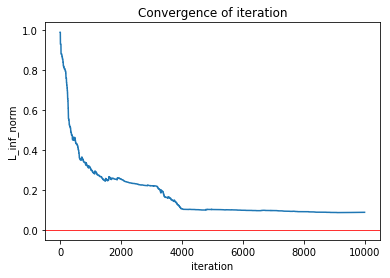

--------------------------------
0.05 0.69
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86728128  0.92065035  0.98640134  0.          0.81403458  0.91697221
  0.          0.76558617  0.7346412   0.84176631  0.78087648]
	 plot convengence of value function: 


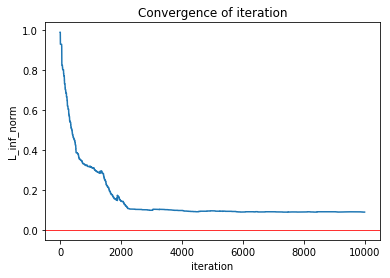

--------------------------------
0.05 0.7
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87183661  0.92525721  0.9880677   0.          0.8150471   0.92052614
  0.          0.76347616  0.78571589  0.81353792  0.78512514]
	 plot convengence of value function: 


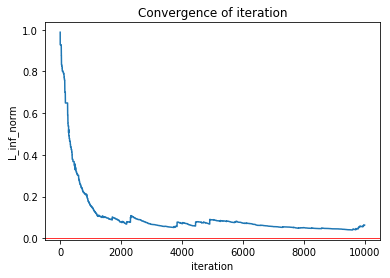

--------------------------------
0.05 0.71
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87078289  0.92185261  0.98679276  0.          0.81434322  0.92069653
  0.          0.76781028  0.73464276  0.84368933  0.77876714]
	 plot convengence of value function: 


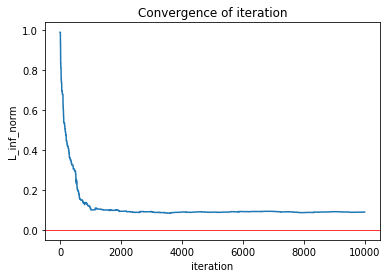

--------------------------------
0.05 0.72
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86912924  0.92148785  0.9874273   0.          0.81476099  0.92269444
  0.          0.76674064  0.72902478  0.82678632  0.77770596]
	 plot convengence of value function: 


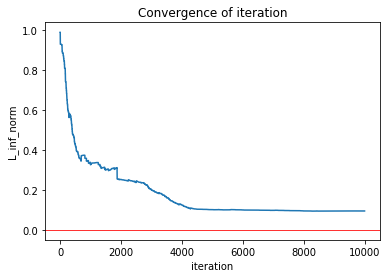

--------------------------------
0.05 0.73
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87001238  0.92313496  0.98726034  0.          0.80854774  0.91907856
  0.          0.7583034   0.75701581  0.83790466  0.77642056]
	 plot convengence of value function: 


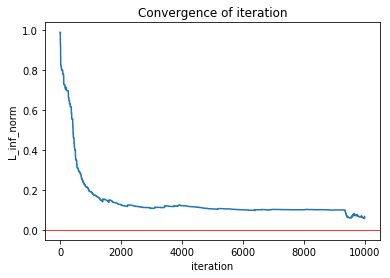

--------------------------------
0.05 0.74
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87062015  0.92293742  0.98636444  0.          0.81400305  0.91781105
  0.          0.76570407  0.78487094  0.83821256  0.79084609]
	 plot convengence of value function: 


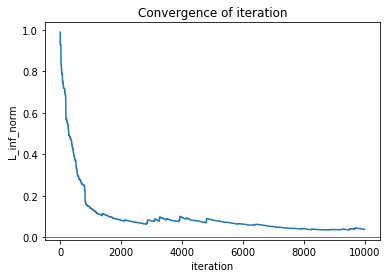

--------------------------------
0.05 0.75
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.8694529   0.92305198  0.98794936  0.          0.81538485  0.91949345
  0.          0.76653928  0.73160653  0.8454803   0.77468062]
	 plot convengence of value function: 


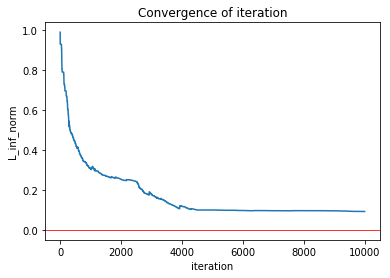

--------------------------------
0.05 0.76
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87019248  0.92311242  0.9869057   0.          0.81605228  0.9194886   0.
  0.76585116  0.77659073  0.83144495  0.77549635]
	 plot convengence of value function: 


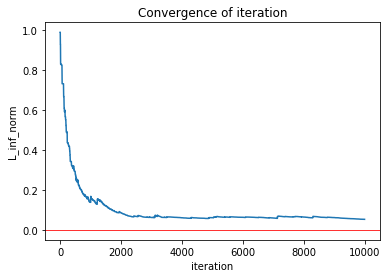

--------------------------------
0.05 0.77
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.8707769   0.92429843  0.9873793   0.          0.81238677  0.91597671
  0.          0.75992891  0.71905983  0.81726016  0.7603681 ]
	 plot convengence of value function: 


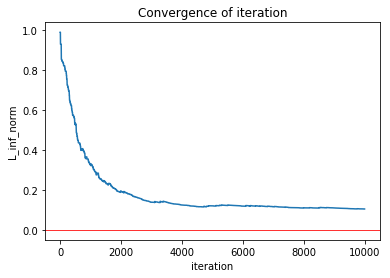

--------------------------------
0.05 0.78
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87056728  0.92347084  0.98621287  0.          0.81108034  0.92071597
  0.          0.75706944  0.71799652  0.84806266  0.77601262]
	 plot convengence of value function: 


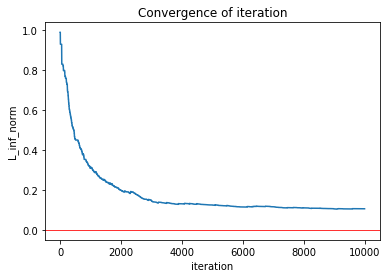

--------------------------------
0.05 0.79
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87064934  0.92361757  0.98758489  0.          0.81345748  0.92099332
  0.          0.75935429  0.72023697  0.83905695  0.77113715]
	 plot convengence of value function: 


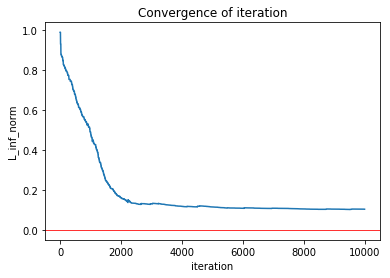

--------------------------------
0.05 0.8
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86986129  0.92191562  0.98566158  0.          0.81267548  0.91727764
  0.          0.7640002   0.77860583  0.8360172   0.77976921]
	 plot convengence of value function: 


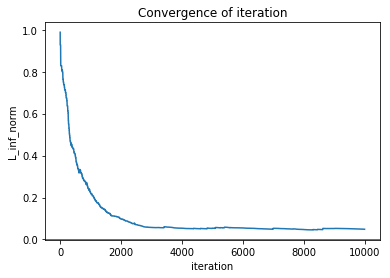

--------------------------------
0.05 0.81
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87010056  0.92250323  0.98854208  0.          0.81374151  0.9183587   0.
  0.76496649  0.72654222  0.83040932  0.7628512 ]
	 plot convengence of value function: 


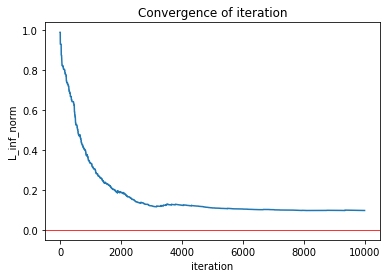

--------------------------------
0.05 0.82
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86883863  0.92167328  0.98643927  0.          0.81244959  0.91626829
  0.          0.76462168  0.71289899  0.83506139  0.76166896]
	 plot convengence of value function: 


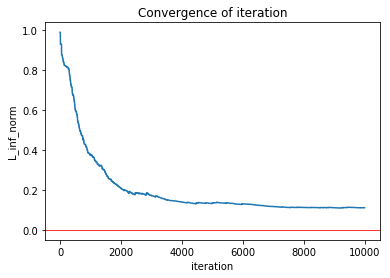

--------------------------------
0.05 0.83
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87116797  0.92457515  0.98804961  0.          0.81490002  0.91722006
  0.          0.76703019  0.72606434  0.8309875   0.7699686 ]
	 plot convengence of value function: 


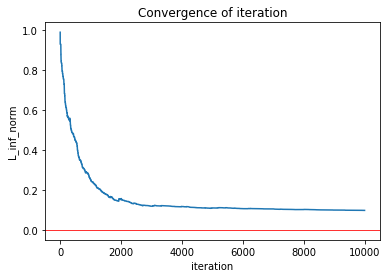

--------------------------------
0.05 0.84
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86983376  0.92359093  0.98744209  0.          0.81392154  0.92051118
  0.          0.76410903  0.78308283  0.84144626  0.78356959]
	 plot convengence of value function: 


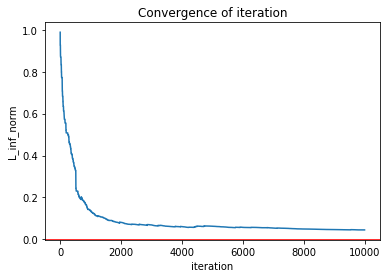

--------------------------------
0.05 0.85
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87104628  0.92396425  0.98828432  0.          0.81291952  0.91679477
  0.          0.75637506  0.75880471  0.82634917  0.75798963]
	 plot convengence of value function: 


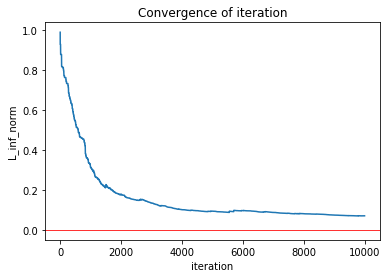

--------------------------------
0.05 0.86
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86690568  0.92166574  0.98764172  0.          0.80921511  0.91617588
  0.          0.75782027  0.76720168  0.83549186  0.76559805]
	 plot convengence of value function: 


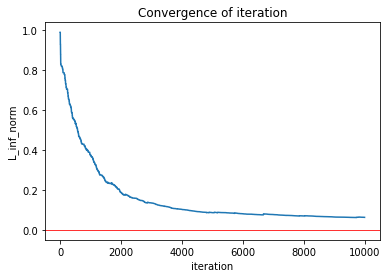

--------------------------------
0.05 0.87
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86798832  0.92158081  0.98644354  0.          0.80999299  0.91921746
  0.          0.75708903  0.70955319  0.84117797  0.75674629]
	 plot convengence of value function: 


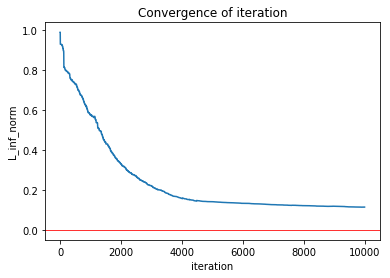

--------------------------------
0.05 0.88
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86521887  0.92147087  0.98756256  0.          0.80241951  0.91377531
  0.          0.74049983  0.66874678  0.81779991  0.6900173 ]
	 plot convengence of value function: 


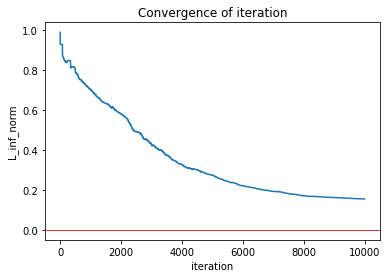

--------------------------------
0.05 0.89
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86821544  0.92243712  0.98723021  0.          0.80592635  0.91652165
  0.          0.75004056  0.69772188  0.84196443  0.72485445]
	 plot convengence of value function: 


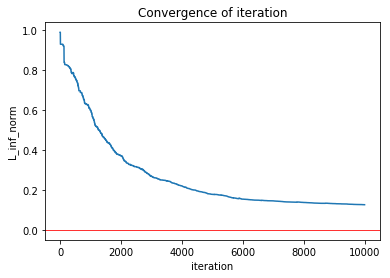

--------------------------------
0.05 0.9
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86467829  0.92100761  0.98708557  0.          0.80286485  0.91502603
  0.          0.74421309  0.679835    0.82541171  0.66535564]
	 plot convengence of value function: 


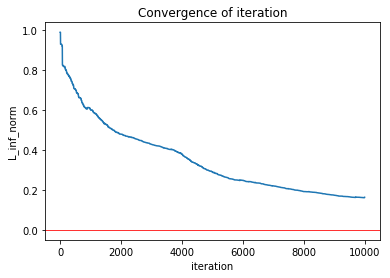

--------------------------------
0.05 0.91
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86883791  0.92345436  0.98741865  0.          0.7997367   0.91399629
  0.          0.70882026  0.61384171  0.80793564  0.69989257]
	 plot convengence of value function: 


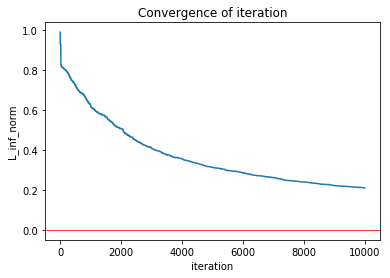

--------------------------------
0.05 0.92
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.864931    0.92121715  0.98709436  0.          0.80490436  0.91383073
  0.          0.74780288  0.69381047  0.80227346  0.66053707]
	 plot convengence of value function: 


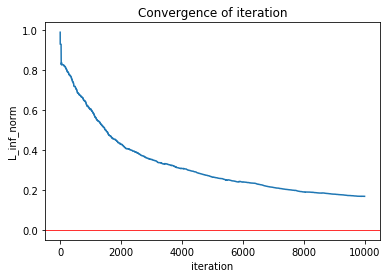

--------------------------------
0.05 0.93
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86606011  0.92165626  0.98683607  0.          0.80334165  0.90020307
  0.          0.74715406  0.67244278  0.79841181  0.50395552]
	 plot convengence of value function: 


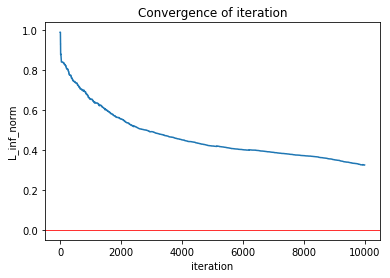

--------------------------------
0.05 0.94
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85945048  0.91801064  0.98728598  0.          0.7934623   0.90108488
  0.          0.72191827  0.6259033   0.79275237  0.42793835]
	 plot convengence of value function: 


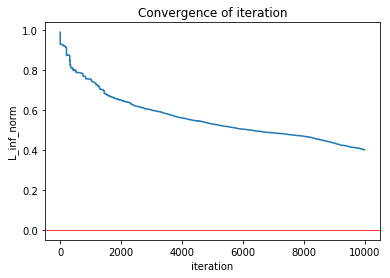

--------------------------------
0.05 0.95
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86822632  0.92237039  0.98653215  0.          0.80929783  0.91181853
  0.          0.75159156  0.71583804  0.81229426  0.63688685]
	 plot convengence of value function: 


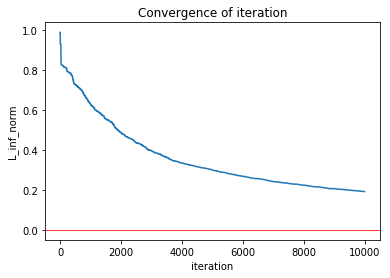

--------------------------------
0.05 0.96
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86720171  0.92272403  0.98742422  0.          0.80357562  0.91497744
  0.          0.73502428  0.65555306  0.81672382  0.67013836]
	 plot convengence of value function: 


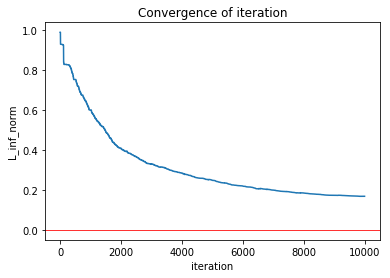

--------------------------------
0.05 0.97
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85785802  0.9172593   0.98542044  0.          0.77984705  0.90370867
  0.          0.69680032  0.59156932  0.78232087  0.60788062]
	 plot convengence of value function: 


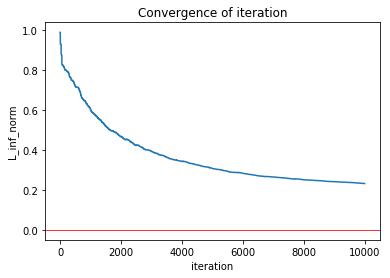

--------------------------------
0.05 0.98
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86295338  0.92112002  0.98743237  0.          0.78679818  0.9175191   0.
  0.70309789  0.61431821  0.82478135  0.62014167]
	 plot convengence of value function: 


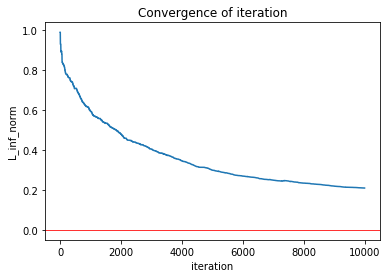

--------------------------------
0.05 0.99
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.84335143  0.9110565   0.98513637  0.          0.75084507  0.88308899
  0.          0.65229039  0.52549642  0.67453174  0.47975775]
	 plot convengence of value function: 


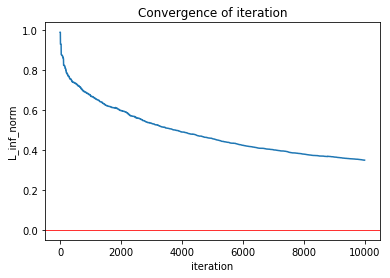

--------------------------------
0.06 0.51
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86207769  0.92007034  0.98913112  0.          0.80847263  0.90948744
  0.          0.76191279  0.77242521  0.82054047  0.7718027 ]
	 plot convengence of value function: 


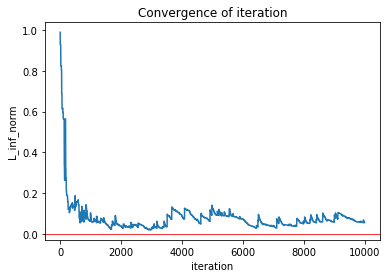

--------------------------------
0.06 0.52
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86385468  0.91882319  0.98804764  0.          0.80941103  0.92113411
  0.          0.76583998  0.78895561  0.83992997  0.78972968]
	 plot convengence of value function: 


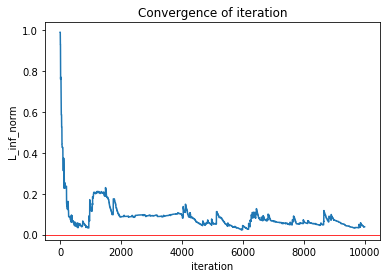

--------------------------------
0.06 0.53
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87237346  0.92307602  0.9901552   0.          0.81240264  0.91794955
  0.          0.76375142  0.73037099  0.80779052  0.74958535]
	 plot convengence of value function: 


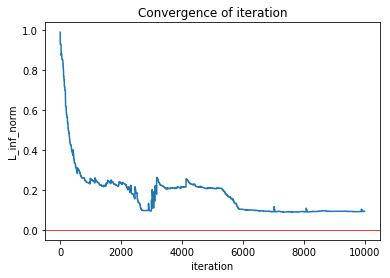

--------------------------------
0.06 0.54
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87154145  0.92301408  0.98645982  0.          0.81419897  0.92273787
  0.          0.77102735  0.76232431  0.82655187  0.76494865]
	 plot convengence of value function: 


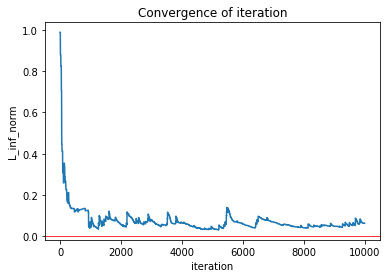

--------------------------------
0.06 0.55
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86076278  0.91426455  0.984394    0.          0.804915    0.9151654   0.
  0.76351012  0.7897172   0.84960389  0.79448902]
	 plot convengence of value function: 


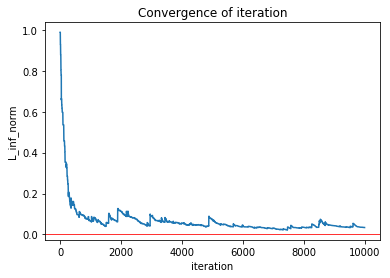

--------------------------------
0.06 0.56
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86771045  0.92107516  0.99059328  0.          0.80903394  0.92382916
  0.          0.76164961  0.73120223  0.86592215  0.80849778]
	 plot convengence of value function: 


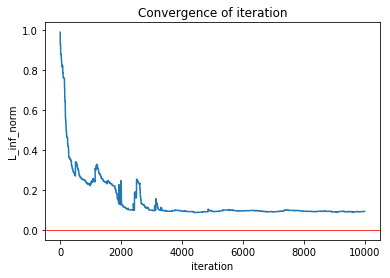

--------------------------------
0.06 0.57
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86541684  0.91964137  0.98672651  0.          0.8087773   0.9120161   0.
  0.76291573  0.72623623  0.82872778  0.75201897]
	 plot convengence of value function: 


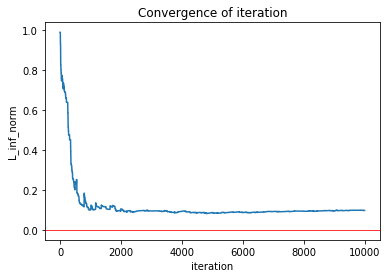

--------------------------------
0.06 0.58
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87031984  0.9229581   0.98803315  0.          0.81597634  0.91881338
  0.          0.76265378  0.79857103  0.82544354  0.79099355]
	 plot convengence of value function: 


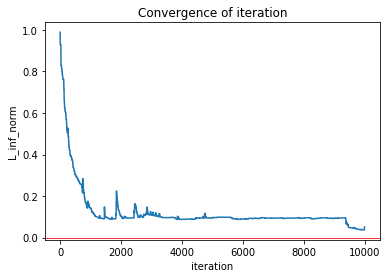

--------------------------------
0.06 0.59
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86919349  0.92029106  0.98816483  0.          0.81256977  0.91858198
  0.          0.76442873  0.77540849  0.83830424  0.75924612]
	 plot convengence of value function: 


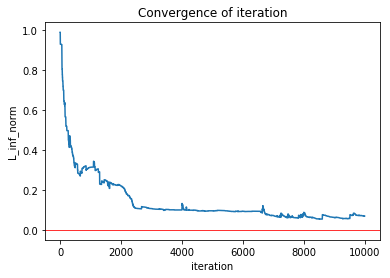

--------------------------------
0.06 0.6
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86893734  0.92116139  0.98805865  0.          0.81442578  0.92612914
  0.          0.76680339  0.77209789  0.80156061  0.77901619]
	 plot convengence of value function: 


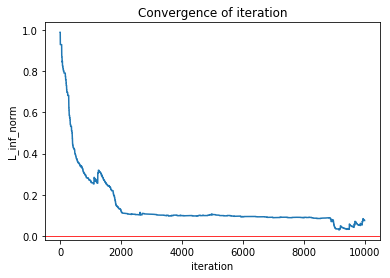

--------------------------------
0.06 0.61
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86432258  0.92178091  0.98717397  0.          0.80927913  0.92437911
  0.          0.76182227  0.78640715  0.83226888  0.79153407]
	 plot convengence of value function: 


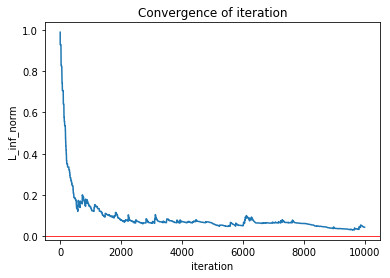

--------------------------------
0.06 0.62
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.8700849   0.92261028  0.98835103  0.          0.81344708  0.91868014
  0.          0.76627139  0.76827559  0.84112097  0.77084458]
	 plot convengence of value function: 


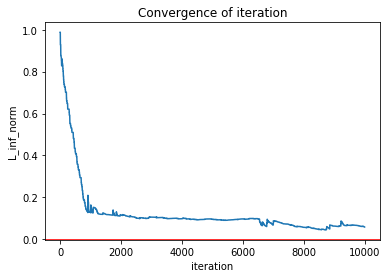

--------------------------------
0.06 0.63
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86598446  0.92264116  0.98652852  0.          0.81327154  0.91924439
  0.          0.76576728  0.79151099  0.82834901  0.78944452]
	 plot convengence of value function: 


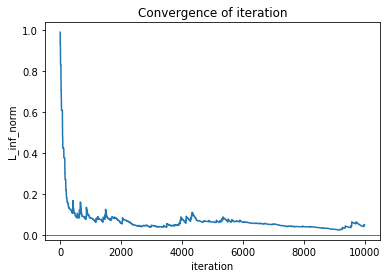

--------------------------------
0.06 0.64
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86941693  0.92344752  0.99022848  0.          0.81282636  0.91932505
  0.          0.76517972  0.72944067  0.84001633  0.78502308]
	 plot convengence of value function: 


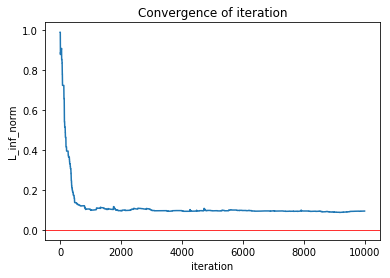

--------------------------------
0.06 0.65
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86667932  0.91925211  0.98565262  0.          0.80398303  0.91051718
  0.          0.76313596  0.77034385  0.81683266  0.76334202]
	 plot convengence of value function: 


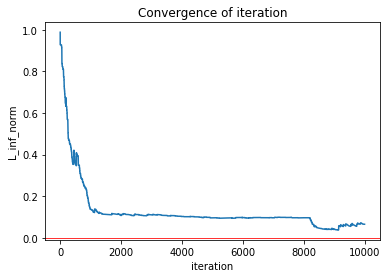

--------------------------------
0.06 0.66
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87155548  0.92289004  0.98905237  0.          0.81641886  0.92165727
  0.          0.76882638  0.7877543   0.83121768  0.79116244]
	 plot convengence of value function: 


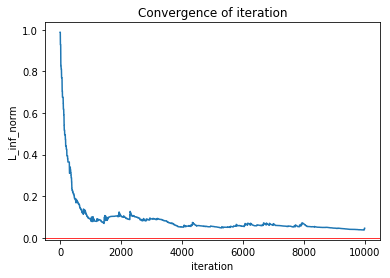

--------------------------------
0.06 0.67
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86679045  0.92159244  0.98975893  0.          0.80982498  0.91493921
  0.          0.76109577  0.73103626  0.82963541  0.77451367]
	 plot convengence of value function: 


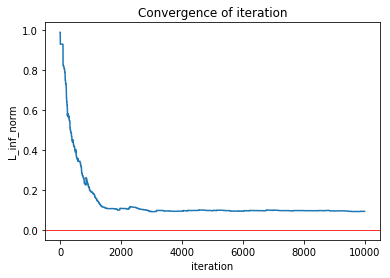

--------------------------------
0.06 0.68
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86847631  0.91972432  0.98459579  0.          0.81193303  0.91385618
  0.          0.76551784  0.73159205  0.84460862  0.76916001]
	 plot convengence of value function: 


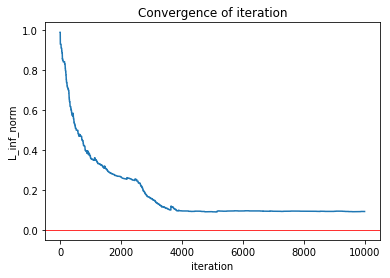

--------------------------------
0.06 0.69
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 2, 2]
	 value function of final iteration:  [ 0.86702851  0.92106246  0.98741999  0.          0.81300798  0.90670155
  0.          0.76413623  0.71303266  0.6567404   0.60718473]
	 plot convengence of value function: 


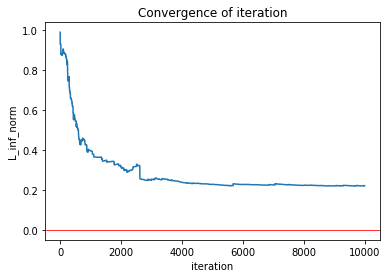

--------------------------------
0.06 0.7
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86615178  0.9201996   0.98683193  0.          0.81093398  0.92147023
  0.          0.76444222  0.73083908  0.82981175  0.78174166]
	 plot convengence of value function: 


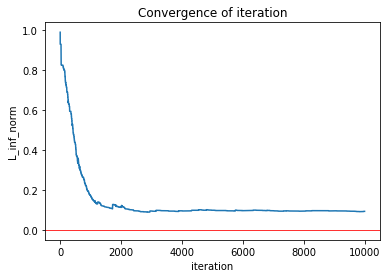

--------------------------------
0.06 0.71
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86952401  0.92293482  0.98759393  0.          0.81797072  0.91923197
  0.          0.76732226  0.78497897  0.85113496  0.78564358]
	 plot convengence of value function: 


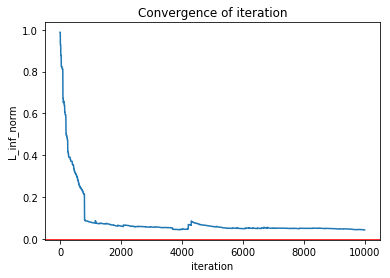

--------------------------------
0.06 0.72
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86825229  0.9222859   0.98598533  0.          0.81444467  0.91394353
  0.          0.76570093  0.73196166  0.83733881  0.76720803]
	 plot convengence of value function: 


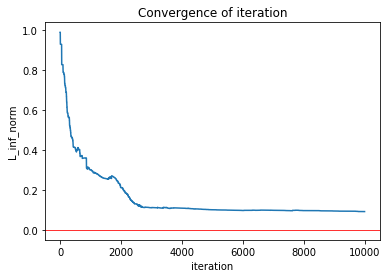

--------------------------------
0.06 0.73
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86929587  0.92268103  0.98694594  0.          0.81342537  0.9201359   0.
  0.76443506  0.79036659  0.85351702  0.79451149]
	 plot convengence of value function: 


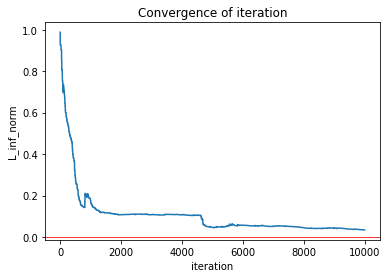

--------------------------------
0.06 0.74
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87001405  0.9244724   0.98779907  0.          0.81585287  0.9188978   0.
  0.7644934   0.77592056  0.82737972  0.7805994 ]
	 plot convengence of value function: 


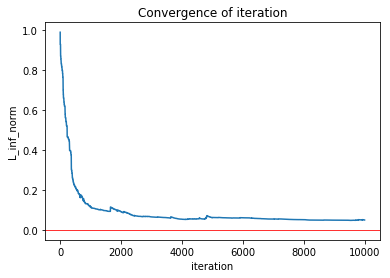

--------------------------------
0.06 0.75
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86846849  0.919874    0.98613704  0.          0.81339288  0.91752117
  0.          0.76460027  0.72481202  0.8233819   0.76331282]
	 plot convengence of value function: 


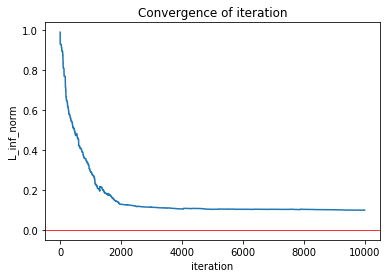

--------------------------------
0.06 0.76
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.8672077   0.9220584   0.98642615  0.          0.81048118  0.91941575
  0.          0.76251984  0.72751448  0.83704911  0.76779162]
	 plot convengence of value function: 


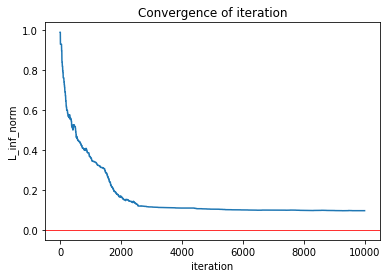

--------------------------------
0.06 0.77
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86729556  0.92289345  0.98737612  0.          0.81287874  0.91683083
  0.          0.76406047  0.76219652  0.81390121  0.76238667]
	 plot convengence of value function: 


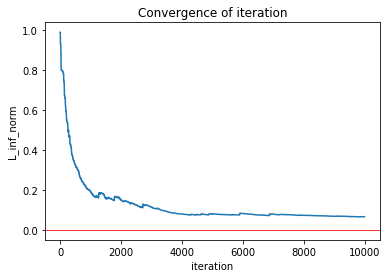

--------------------------------
0.06 0.78
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86883736  0.92473445  0.9882234   0.          0.81130644  0.91728776
  0.          0.76084361  0.7719705   0.82277329  0.76760541]
	 plot convengence of value function: 


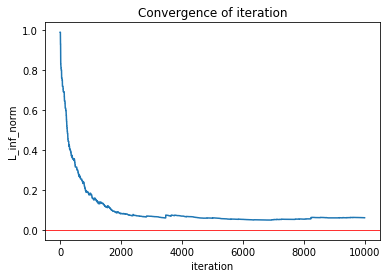

--------------------------------
0.06 0.79
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86766598  0.92163773  0.98598614  0.          0.81191779  0.91605884
  0.          0.76528166  0.72664595  0.81091069  0.7520927 ]
	 plot convengence of value function: 


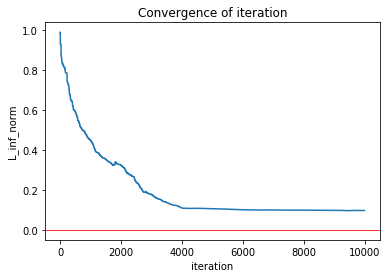

--------------------------------
0.06 0.8
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86851453  0.92377443  0.98685247  0.          0.81232875  0.91940349
  0.          0.76405948  0.774475    0.83623952  0.7713862 ]
	 plot convengence of value function: 


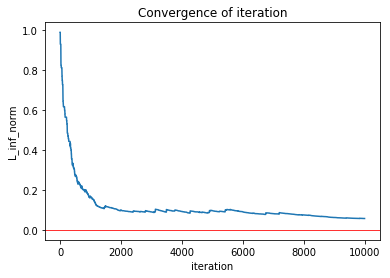

--------------------------------
0.06 0.81
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86933834  0.92178792  0.98651236  0.          0.80899273  0.91440083
  0.          0.75232674  0.76755882  0.8292075   0.75873474]
	 plot convengence of value function: 


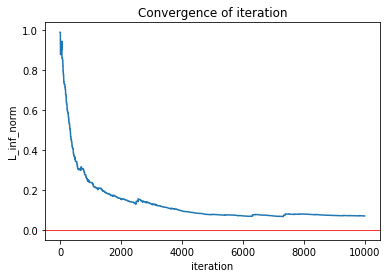

--------------------------------
0.06 0.82
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86675452  0.92163308  0.98652653  0.          0.81055039  0.91716957
  0.          0.75988552  0.71297068  0.8247282   0.7542974 ]
	 plot convengence of value function: 


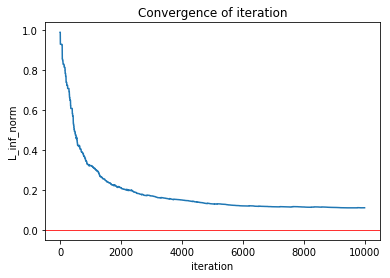

--------------------------------
0.06 0.83
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86704565  0.92018676  0.98588395  0.          0.80888985  0.91712721
  0.          0.75397283  0.77424518  0.83260853  0.75743437]
	 plot convengence of value function: 


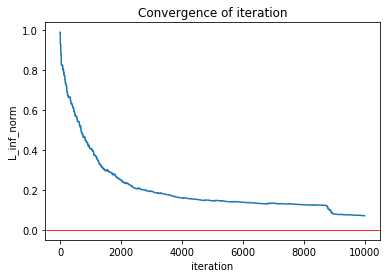

--------------------------------
0.06 0.84
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86666987  0.92183051  0.9882796   0.          0.80614313  0.91312127
  0.          0.7488082   0.69151323  0.82172331  0.74966216]
	 plot convengence of value function: 


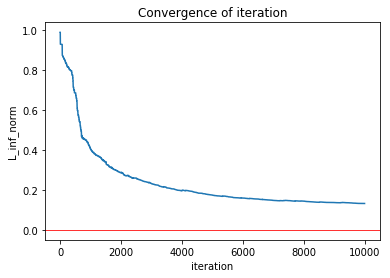

--------------------------------
0.06 0.85
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.86902233  0.92276977  0.98743275  0.          0.8044204   0.91728398
  0.          0.69105823  0.75708696  0.82626369  0.75192276]
	 plot convengence of value function: 


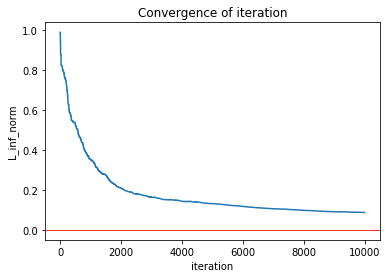

--------------------------------
0.06 0.86
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86789029  0.92256468  0.98726712  0.          0.81081781  0.91508434
  0.          0.74597037  0.7618549   0.83276615  0.76396291]
	 plot convengence of value function: 


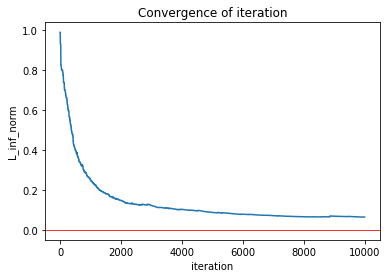

--------------------------------
0.06 0.87
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.8685182   0.92224045  0.98668228  0.          0.8117914   0.91466511
  0.          0.76031589  0.74944472  0.8196135   0.75250287]
	 plot convengence of value function: 


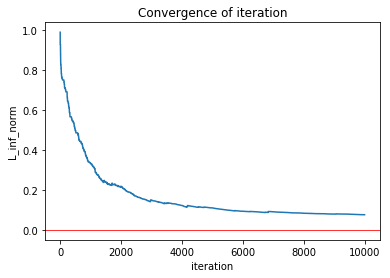

--------------------------------
0.06 0.88
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86371995  0.91971535  0.98697376  0.          0.80192388  0.91539971
  0.          0.74053087  0.68372358  0.8217018   0.74698788]
	 plot convengence of value function: 


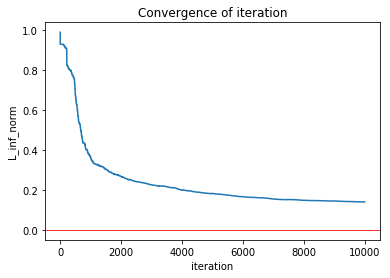

--------------------------------
0.06 0.89
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86653751  0.92101859  0.9873653   0.          0.80489794  0.91644203
  0.          0.74918274  0.69208771  0.82772171  0.75721647]
	 plot convengence of value function: 


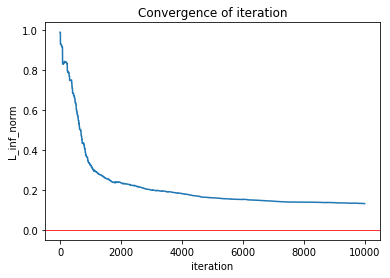

--------------------------------
0.06 0.9
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86699087  0.92087887  0.98771472  0.          0.8061575   0.91146694
  0.          0.74715434  0.73944551  0.81046955  0.73568088]
	 plot convengence of value function: 


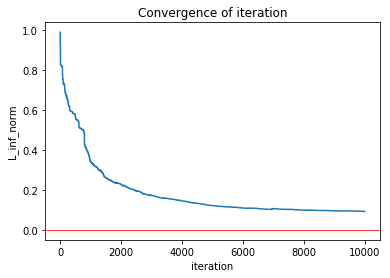

--------------------------------
0.06 0.91
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86185706  0.91996042  0.98645367  0.          0.79503892  0.91515577
  0.          0.73291955  0.65998785  0.81548517  0.65804498]
	 plot convengence of value function: 


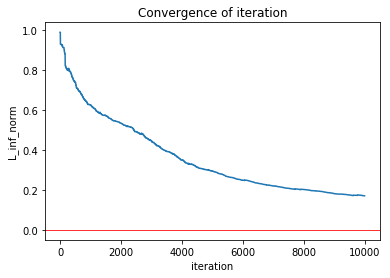

--------------------------------
0.06 0.92
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86316571  0.91921243  0.98692676  0.          0.79989565  0.91590642
  0.          0.7360418   0.75548348  0.82633669  0.75352858]
	 plot convengence of value function: 


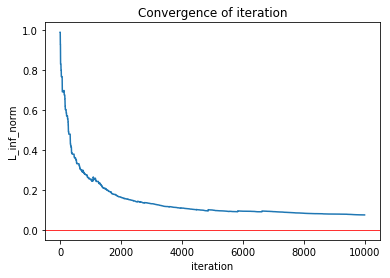

--------------------------------
0.06 0.93
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86527784  0.92014502  0.98701789  0.          0.80423098  0.91194746
  0.          0.74183986  0.68810628  0.81103867  0.70011755]
	 plot convengence of value function: 


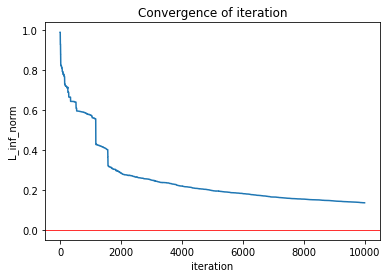

--------------------------------
0.06 0.94
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.85495252  0.91772868  0.98730716  0.          0.75406944  0.91324339
  0.          0.51228961  0.70593999  0.81517426  0.71776674]
	 plot convengence of value function: 


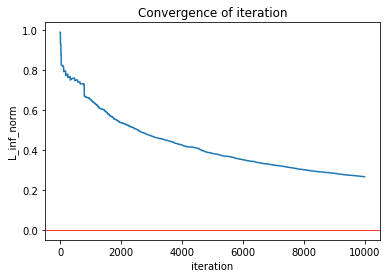

--------------------------------
0.06 0.95
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85559593  0.91694637  0.98643612  0.          0.77812224  0.91245684
  0.          0.68990439  0.58820524  0.81497055  0.70274463]
	 plot convengence of value function: 


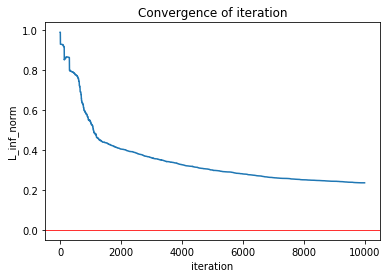

--------------------------------
0.06 0.96
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85541403  0.9178754   0.98662354  0.          0.7760374   0.91236411
  0.          0.68409052  0.70292104  0.805468    0.66923885]
	 plot convengence of value function: 


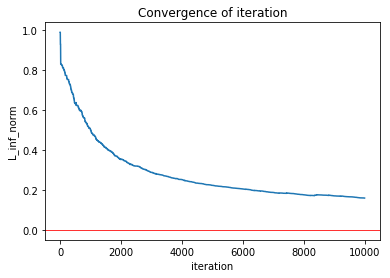

--------------------------------
0.06 0.97
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85347255  0.91537343  0.98609204  0.          0.77568385  0.90800264
  0.          0.67942353  0.56826092  0.79886394  0.64279048]
	 plot convengence of value function: 


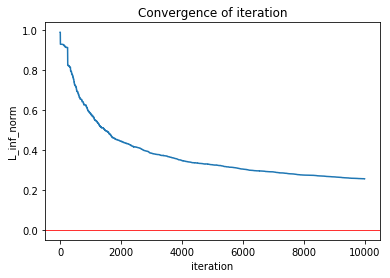

--------------------------------
0.06 0.98
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.8532146   0.91529588  0.98555156  0.          0.76760293  0.90658596
  0.          0.66089416  0.66677703  0.80242944  0.63957627]
	 plot convengence of value function: 


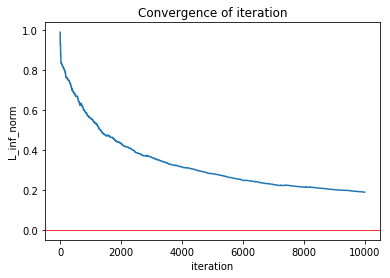

--------------------------------
0.06 0.99
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85425581  0.91703667  0.98612999  0.          0.76394163  0.90326279
  0.          0.64552652  0.49978016  0.77001157  0.62327221]
	 plot convengence of value function: 


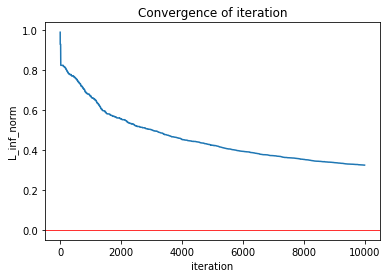

--------------------------------
0.07 0.51
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85918181  0.91307045  0.98739271  0.          0.80364741  0.91837142
  0.          0.76103323  0.77441219  0.81993254  0.77224212]
	 plot convengence of value function: 


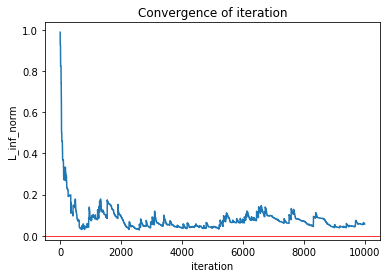

--------------------------------
0.07 0.52
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86272985  0.91918335  0.98564066  0.          0.8039146   0.91008231
  0.          0.758358    0.76366153  0.82011843  0.77215668]
	 plot convengence of value function: 


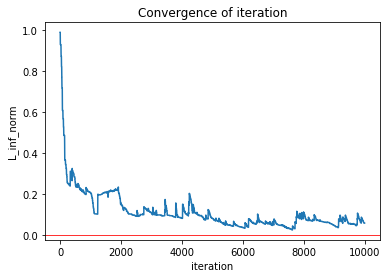

--------------------------------
0.07 0.53
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87185333  0.93167725  0.99053309  0.          0.80903124  0.91734542
  0.          0.7665134   0.78876715  0.85491527  0.75617703]
	 plot convengence of value function: 


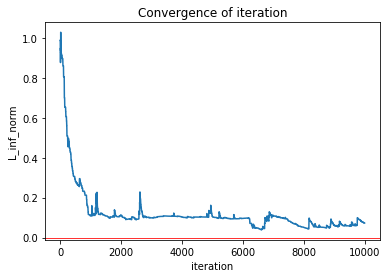

--------------------------------
0.07 0.54
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87079397  0.92215272  0.98940552  0.          0.81504242  0.92559491
  0.          0.76944328  0.77250124  0.83967596  0.78034416]
	 plot convengence of value function: 


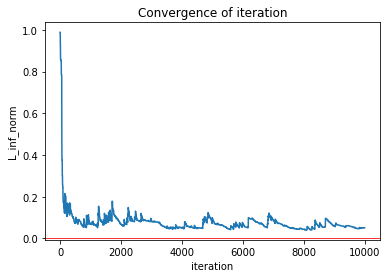

--------------------------------
0.07 0.55
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86501743  0.92215544  0.98719224  0.          0.80430291  0.91090956
  0.          0.75720972  0.75314733  0.80546313  0.75187496]
	 plot convengence of value function: 


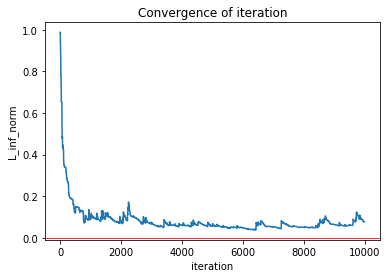

--------------------------------
0.07 0.56
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.8687405   0.92600816  0.98965532  0.          0.81285138  0.91292861
  0.          0.76339439  0.76141443  0.81503584  0.76621719]
	 plot convengence of value function: 


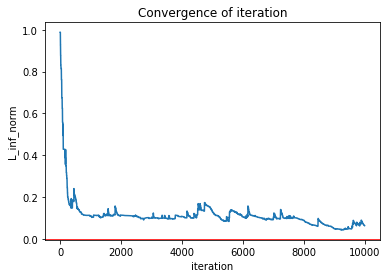

--------------------------------
0.07 0.57
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86802318  0.92048284  0.98384077  0.          0.81370411  0.91612645
  0.          0.76632567  0.72631308  0.79741839  0.75547504]
	 plot convengence of value function: 


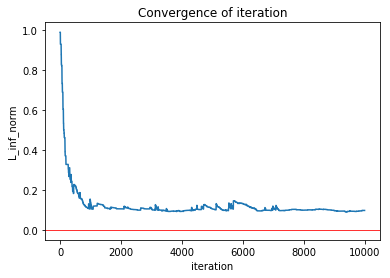

--------------------------------
0.07 0.58
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86552691  0.9208581   0.98830414  0.          0.80689809  0.91318983
  0.          0.761625    0.76991585  0.81085482  0.7525844 ]
	 plot convengence of value function: 


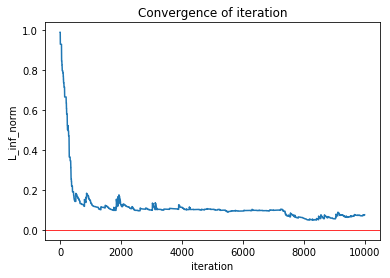

--------------------------------
0.07 0.59
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86730626  0.92153644  0.98842061  0.          0.8102109   0.91726818
  0.          0.76032863  0.76483775  0.81947199  0.77193437]
	 plot convengence of value function: 


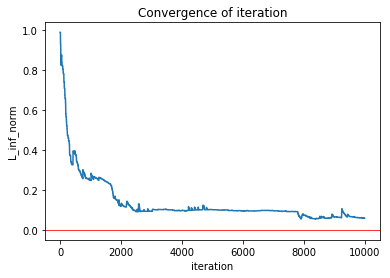

--------------------------------
0.07 0.6
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86341682  0.92019851  0.98912205  0.          0.80917117  0.91562129
  0.          0.75845685  0.77639336  0.83410136  0.7727652 ]
	 plot convengence of value function: 


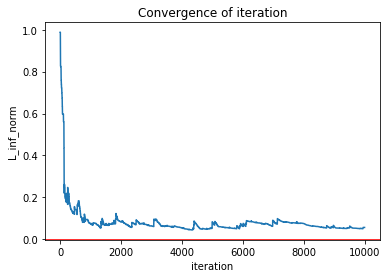

--------------------------------
0.07 0.61
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86804795  0.92005591  0.98777673  0.          0.81469752  0.92027455
  0.          0.76581802  0.72838764  0.79822785  0.73335709]
	 plot convengence of value function: 


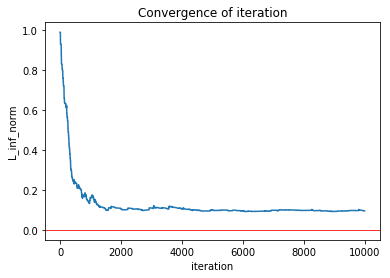

--------------------------------
0.07 0.62
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86785889  0.92113746  0.98818075  0.          0.81378922  0.91583543
  0.          0.76632002  0.77135418  0.82787932  0.77194499]
	 plot convengence of value function: 


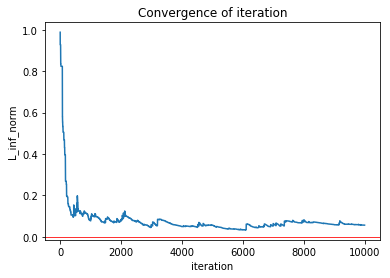

--------------------------------
0.07 0.63
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86656241  0.92527401  0.98852259  0.          0.81059185  0.92167999
  0.          0.7622188   0.78608051  0.84555586  0.78776082]
	 plot convengence of value function: 


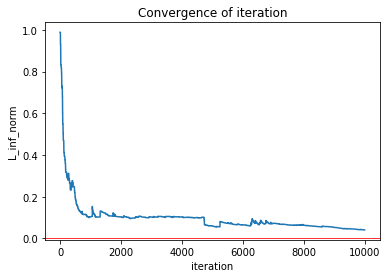

--------------------------------
0.07 0.64
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86960983  0.92609562  0.98818339  0.          0.81199325  0.9143044   0.
  0.76289196  0.72705094  0.81110542  0.7524752 ]
	 plot convengence of value function: 


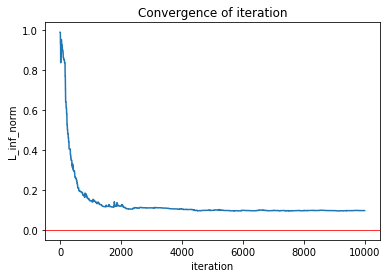

--------------------------------
0.07 0.65
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86484146  0.92205794  0.98804665  0.          0.81034667  0.91204966
  0.          0.76447392  0.77082654  0.80178689  0.77211646]
	 plot convengence of value function: 


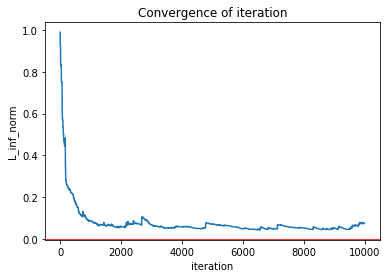

--------------------------------
0.07 0.66
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86903177  0.92033738  0.98669747  0.          0.81292526  0.91303863
  0.          0.76378008  0.7248859   0.81195779  0.75753468]
	 plot convengence of value function: 


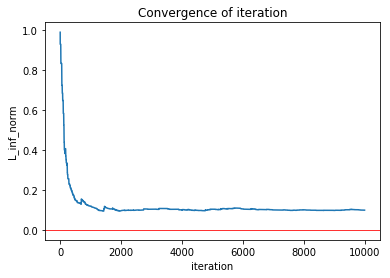

--------------------------------
0.07 0.67
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86902887  0.92009411  0.98678395  0.          0.80886204  0.91494941
  0.          0.76473143  0.77468991  0.8238749   0.77607577]
	 plot convengence of value function: 


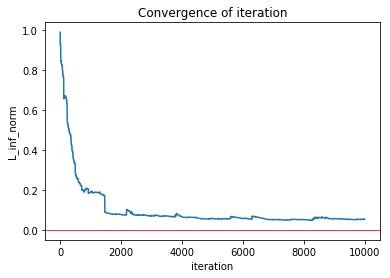

--------------------------------
0.07 0.68
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86737126  0.9240784   0.98655063  0.          0.80941987  0.92237647
  0.          0.76390324  0.76670214  0.82871844  0.75730105]
	 plot convengence of value function: 


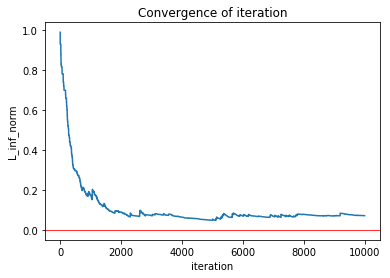

--------------------------------
0.07 0.69
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86618994  0.92222754  0.98783253  0.          0.80732091  0.9191557   0.
  0.75704192  0.72516823  0.83678024  0.78608228]
	 plot convengence of value function: 


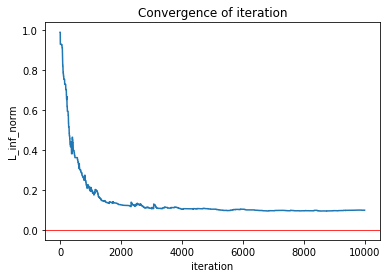

--------------------------------
0.07 0.7
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86469513  0.9201245   0.98714073  0.          0.80824293  0.91608368
  0.          0.75893322  0.72542535  0.82582238  0.75770083]
	 plot convengence of value function: 


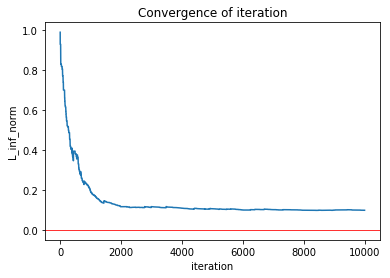

--------------------------------
0.07 0.71
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86766805  0.92116858  0.98833138  0.          0.8119951   0.91572202
  0.          0.75959843  0.76892923  0.82678445  0.7653607 ]
	 plot convengence of value function: 


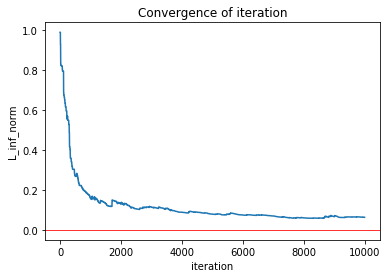

--------------------------------
0.07 0.72
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86793166  0.92197268  0.98638796  0.          0.81165308  0.91809895
  0.          0.76360003  0.76102169  0.81008257  0.75779109]
	 plot convengence of value function: 


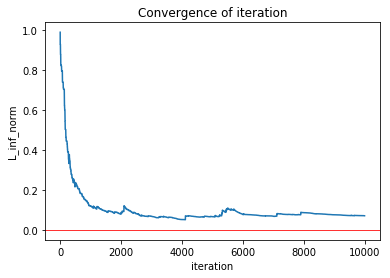

--------------------------------
0.07 0.73
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86590495  0.92085968  0.98699605  0.          0.80924855  0.91342421
  0.          0.75930356  0.72160976  0.80145736  0.7634047 ]
	 plot convengence of value function: 


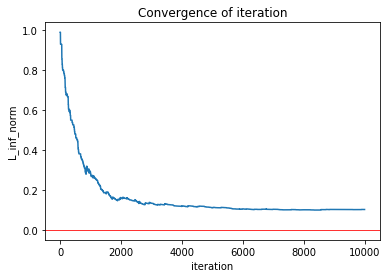

--------------------------------
0.07 0.74
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86789135  0.92102239  0.98699177  0.          0.81106022  0.9172575   0.
  0.76336839  0.72684522  0.83786106  0.77172982]
	 plot convengence of value function: 


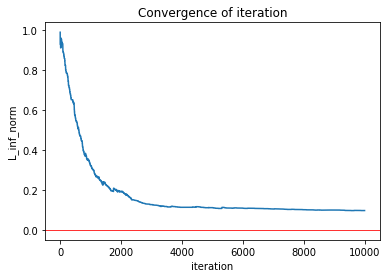

--------------------------------
0.07 0.75
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86519522  0.91949388  0.98730679  0.          0.80900177  0.91857711
  0.          0.76534473  0.77381144  0.82667803  0.77345354]
	 plot convengence of value function: 


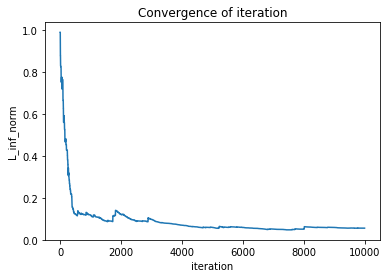

--------------------------------
0.07 0.76
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86722381  0.92074948  0.98750344  0.          0.80988932  0.91557199
  0.          0.75868482  0.75985794  0.80694153  0.75900542]
	 plot convengence of value function: 


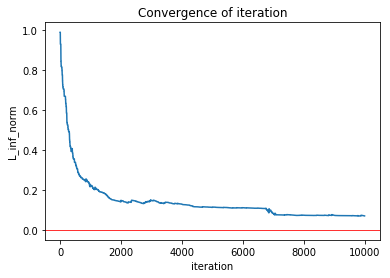

--------------------------------
0.07 0.77
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86321942  0.91753657  0.98717926  0.          0.80658012  0.91429299
  0.          0.75665327  0.70912531  0.80252576  0.69991443]
	 plot convengence of value function: 


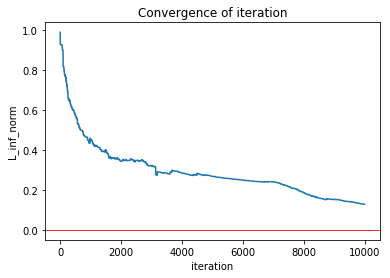

--------------------------------
0.07 0.78
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86682608  0.92007968  0.98725044  0.          0.80921357  0.91815473
  0.          0.76079238  0.72193578  0.81450141  0.75871161]
	 plot convengence of value function: 


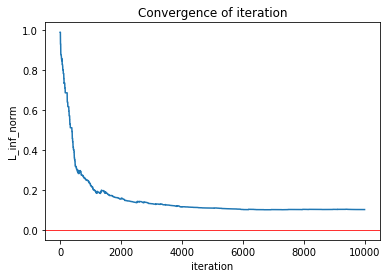

--------------------------------
0.07 0.79
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86651631  0.92151372  0.98728226  0.          0.81033315  0.91246004
  0.          0.76041727  0.76438549  0.81676027  0.75809413]
	 plot convengence of value function: 


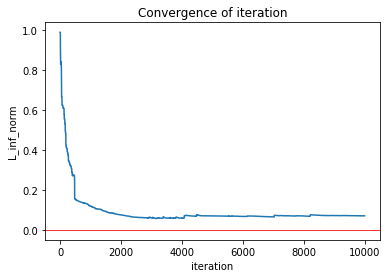

--------------------------------
0.07 0.8
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86842597  0.92076847  0.98684615  0.          0.81348144  0.91656546
  0.          0.76150503  0.71554712  0.81357658  0.75233273]
	 plot convengence of value function: 


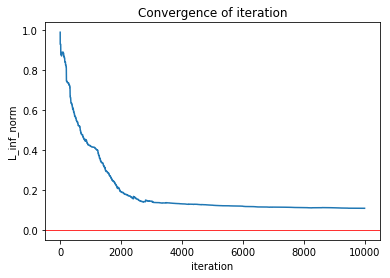

--------------------------------
0.07 0.81
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86561465  0.92148388  0.98802717  0.          0.80804844  0.91418917
  0.          0.76095618  0.71621007  0.81097201  0.74332233]
	 plot convengence of value function: 


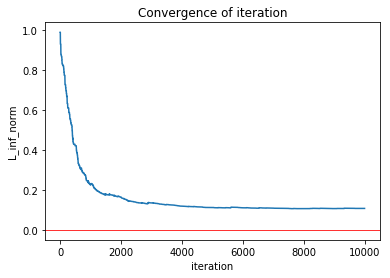

--------------------------------
0.07 0.82
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86643261  0.92102984  0.98808916  0.          0.80865469  0.91579978
  0.          0.75640754  0.71271555  0.814555    0.74363411]
	 plot convengence of value function: 


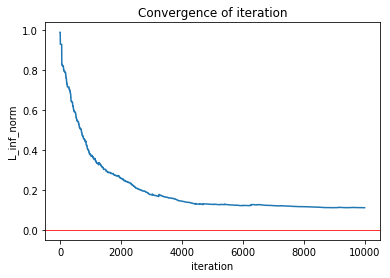

--------------------------------
0.07 0.83
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86722584  0.92096628  0.98846252  0.          0.80797164  0.91459997
  0.          0.75924596  0.71165547  0.81037514  0.75221934]
	 plot convengence of value function: 


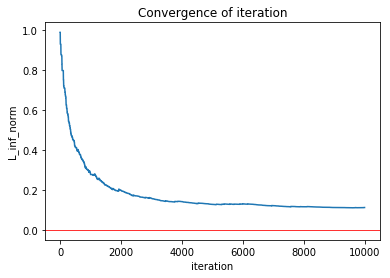

--------------------------------
0.07 0.84
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86756344  0.92125934  0.98730396  0.          0.8086547   0.91538804
  0.          0.75696584  0.74692786  0.80389784  0.74010827]
	 plot convengence of value function: 


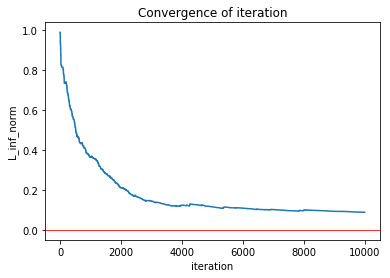

--------------------------------
0.07 0.85
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86652591  0.92214744  0.98666948  0.          0.80993943  0.91733129
  0.          0.75955185  0.76899178  0.8217598   0.76319572]
	 plot convengence of value function: 


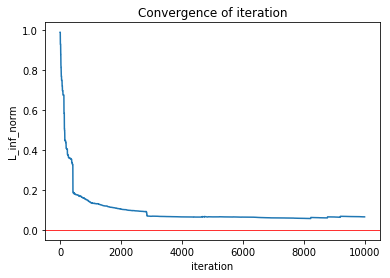

--------------------------------
0.07 0.86
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86479245  0.92067534  0.98636757  0.          0.80461728  0.9139451   0.
  0.75099209  0.69599762  0.81590279  0.72990455]
	 plot convengence of value function: 


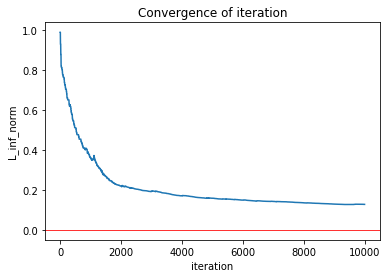

--------------------------------
0.07 0.87
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86586302  0.92050394  0.98642215  0.          0.80556514  0.91456078
  0.          0.75190406  0.74213138  0.81777915  0.74317071]
	 plot convengence of value function: 


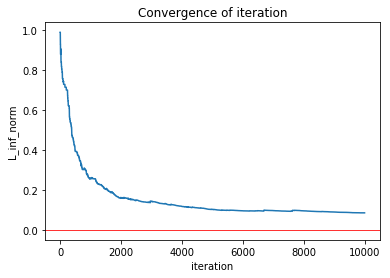

--------------------------------
0.07 0.88
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86368068  0.92026088  0.98675076  0.          0.79916603  0.91182878
  0.          0.74050487  0.68134559  0.80851086  0.7174424 ]
	 plot convengence of value function: 


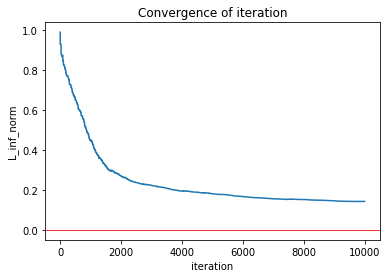

--------------------------------
0.07 0.89
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86312636  0.91920288  0.98615639  0.          0.80135244  0.91298385
  0.          0.74187258  0.74054348  0.7995278   0.71795288]
	 plot convengence of value function: 


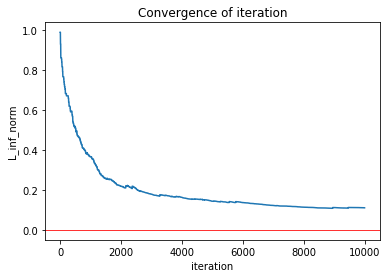

--------------------------------
0.07 0.9
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86529362  0.91977578  0.98751872  0.          0.80825464  0.91528908
  0.          0.75087028  0.74681134  0.81394759  0.74543837]
	 plot convengence of value function: 


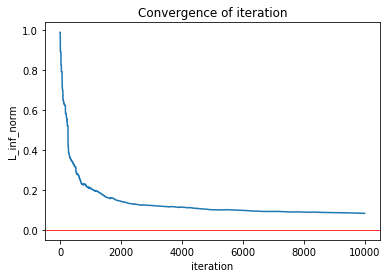

--------------------------------
0.07 0.91
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.8661673   0.92042133  0.98680584  0.          0.80423976  0.91261919
  0.          0.74933679  0.72207485  0.81342447  0.71924888]
	 plot convengence of value function: 


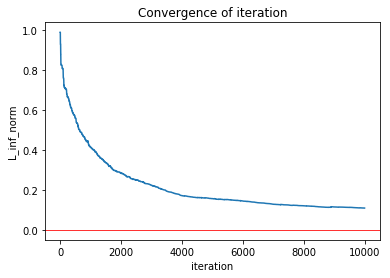

--------------------------------
0.07 0.92
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86104135  0.91909363  0.9869817   0.          0.79328604  0.91293712
  0.          0.72657     0.65242534  0.81900105  0.70911088]
	 plot convengence of value function: 


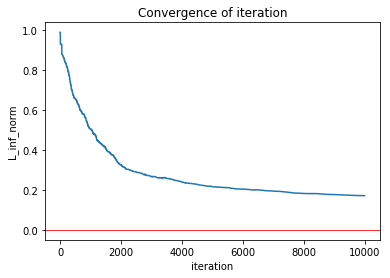

--------------------------------
0.07 0.93
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86195079  0.91930314  0.98678502  0.          0.79440125  0.9140826   0.
  0.72793093  0.72061469  0.82217714  0.73013901]
	 plot convengence of value function: 


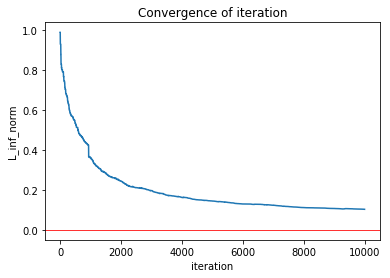

--------------------------------
0.07 0.94
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85181149  0.91489269  0.98590864  0.          0.76993905  0.90479969
  0.          0.68578708  0.58816084  0.80171602  0.63019571]
	 plot convengence of value function: 


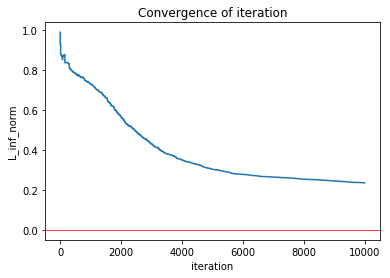

--------------------------------
0.07 0.95
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.8678814   0.92104665  0.98722511  0.          0.80839201  0.91049314
  0.          0.75022657  0.73551861  0.81213281  0.69889662]
	 plot convengence of value function: 


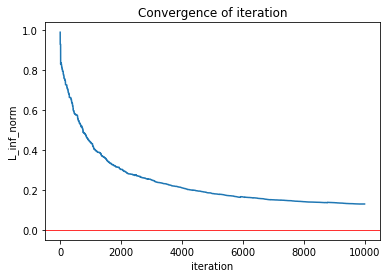

--------------------------------
0.07 0.96
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86045375  0.91808392  0.98676194  0.          0.78471618  0.91180865
  0.          0.69172312  0.70795436  0.80741805  0.70383312]
	 plot convengence of value function: 


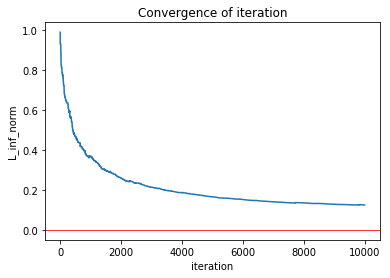

--------------------------------
0.07 0.97
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85941066  0.91778248  0.98587677  0.          0.78367775  0.90623165
  0.          0.69484744  0.66853939  0.79401267  0.67374637]
	 plot convengence of value function: 


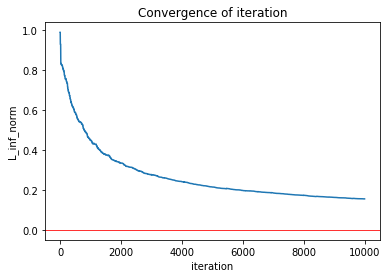

--------------------------------
0.07 0.98
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85842754  0.91691628  0.98636977  0.          0.78597492  0.90911694
  0.          0.7082162   0.66759493  0.80534777  0.66816093]
	 plot convengence of value function: 


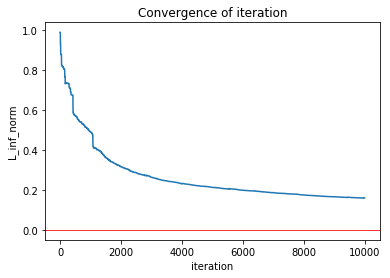

--------------------------------
0.07 0.99
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.84010446  0.90800916  0.98540442  0.          0.75210184  0.89976025
  0.          0.64969837  0.49952874  0.7769835   0.52708929]
	 plot convengence of value function: 


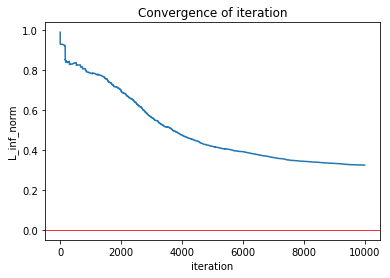

--------------------------------
0.08 0.51
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86722363  0.92193454  0.9892275   0.          0.81210257  0.91678538
  0.          0.76177009  0.75973677  0.83096793  0.7693809 ]
	 plot convengence of value function: 


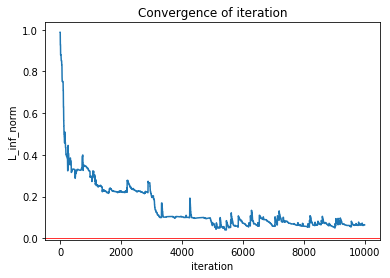

--------------------------------
0.08 0.52
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86232315  0.91301744  0.98903189  0.          0.80695172  0.91869382
  0.          0.75911465  0.76956085  0.83256241  0.775593  ]
	 plot convengence of value function: 


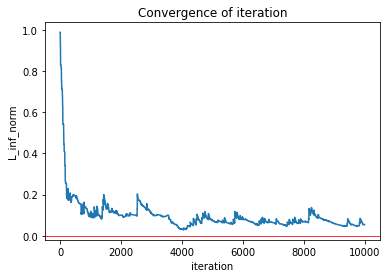

--------------------------------
0.08 0.53
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.8693959   0.92703649  0.98681359  0.          0.81154828  0.91399225
  0.          0.76197699  0.77762532  0.84656435  0.74618751]
	 plot convengence of value function: 


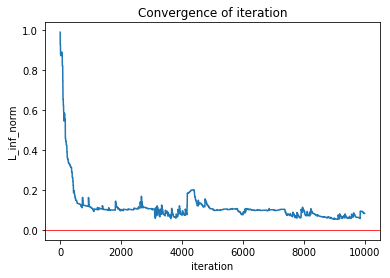

--------------------------------
0.08 0.54
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86464454  0.92188198  0.98511418  0.          0.80301425  0.92195366
  0.          0.75835367  0.76427876  0.833178    0.73973572]
	 plot convengence of value function: 


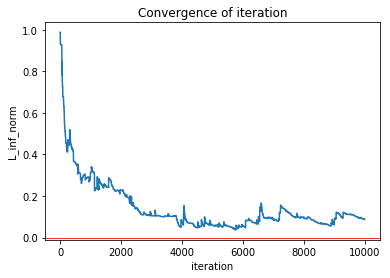

--------------------------------
0.08 0.55
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86183271  0.91858502  0.98441076  0.          0.80150865  0.91362837
  0.          0.75863466  0.75438062  0.80909403  0.74703059]
	 plot convengence of value function: 


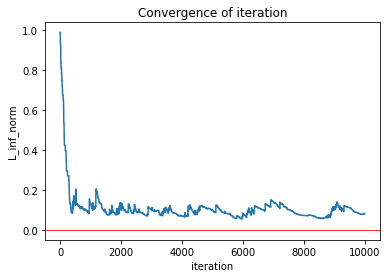

--------------------------------
0.08 0.56
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87011399  0.92548867  0.99000347  0.          0.81287948  0.92491828
  0.          0.75959538  0.78390566  0.83472049  0.76775749]
	 plot convengence of value function: 


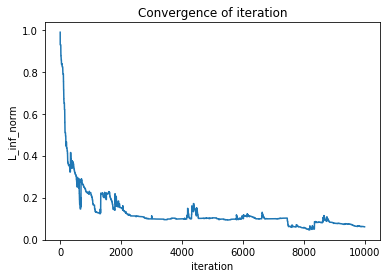

--------------------------------
0.08 0.57
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.8677207   0.92449765  0.98663381  0.          0.80927093  0.91624139
  0.          0.76063242  0.77185636  0.83328445  0.7629635 ]
	 plot convengence of value function: 


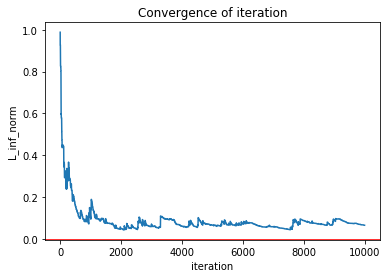

--------------------------------
0.08 0.58
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86517483  0.91653345  0.98750149  0.          0.80933618  0.9152954   0.
  0.75855931  0.75924788  0.79948593  0.74785456]
	 plot convengence of value function: 


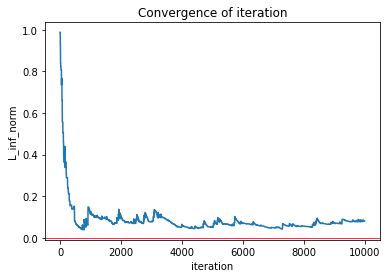

--------------------------------
0.08 0.59
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86716914  0.91973326  0.98596758  0.          0.81267796  0.91189431
  0.          0.75895876  0.7550625   0.80714891  0.73197165]
	 plot convengence of value function: 


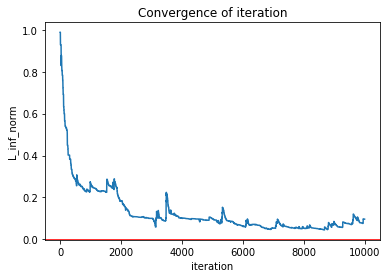

--------------------------------
0.08 0.6
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86664627  0.91975999  0.98541112  0.          0.81022212  0.91687001
  0.          0.7583238   0.77784242  0.82973595  0.77999409]
	 plot convengence of value function: 


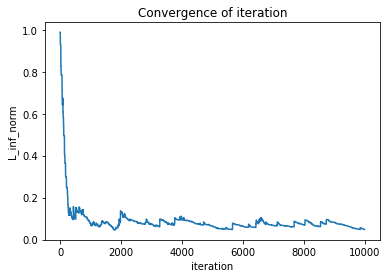

--------------------------------
0.08 0.61
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.863642    0.91997184  0.98616579  0.          0.81263666  0.91012969
  0.          0.76284862  0.72396783  0.8167445   0.75836886]
	 plot convengence of value function: 


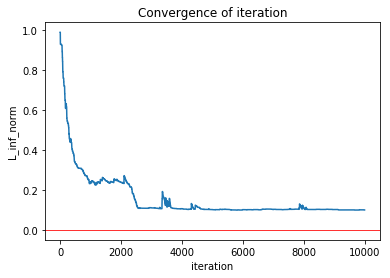

--------------------------------
0.08 0.62
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86434417  0.92084752  0.98978309  0.          0.8113526   0.91707109
  0.          0.76325178  0.76268894  0.8256373   0.75957151]
	 plot convengence of value function: 


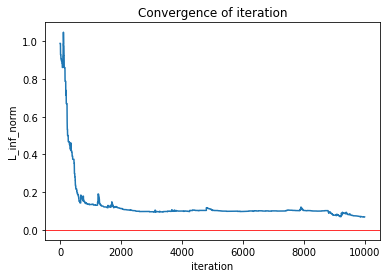

--------------------------------
0.08 0.63
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86346854  0.92129215  0.98830054  0.          0.80334515  0.91441583
  0.          0.75706065  0.76802213  0.80272901  0.76056233]
	 plot convengence of value function: 


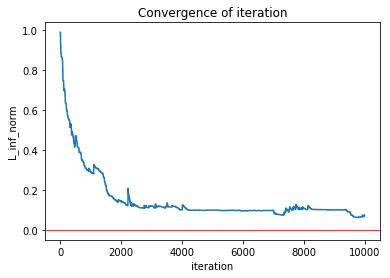

--------------------------------
0.08 0.64
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86511077  0.91870695  0.98596146  0.          0.81006497  0.9166439   0.
  0.75891026  0.76014859  0.81260042  0.75785962]
	 plot convengence of value function: 


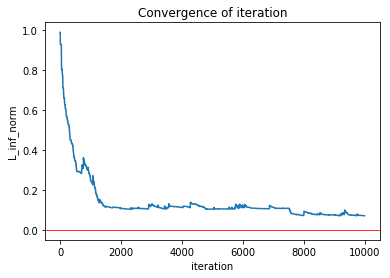

--------------------------------
0.08 0.65
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86378653  0.91931893  0.98934679  0.          0.80627309  0.91650342
  0.          0.76080035  0.7593118   0.80798743  0.75355579]
	 plot convengence of value function: 


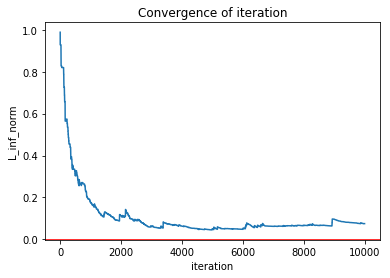

--------------------------------
0.08 0.66
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86474654  0.91748747  0.98647056  0.          0.80603137  0.9180112   0.
  0.75862778  0.72308052  0.81264981  0.74184403]
	 plot convengence of value function: 


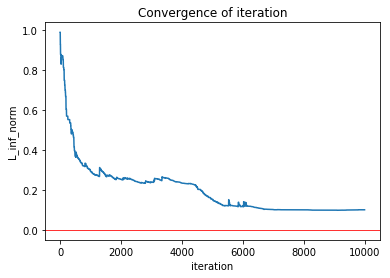

--------------------------------
0.08 0.67
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86800715  0.92110649  0.98740408  0.          0.81044598  0.91803667
  0.          0.76004457  0.77529822  0.83155968  0.74903387]
	 plot convengence of value function: 


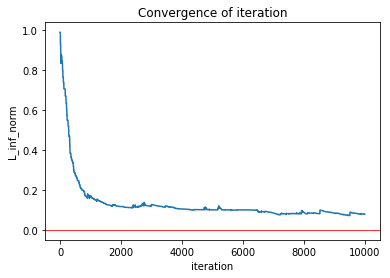

--------------------------------
0.08 0.68
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86305906  0.91924351  0.98829654  0.          0.80522481  0.91534645
  0.          0.75865697  0.75792535  0.8095835   0.74342852]
	 plot convengence of value function: 


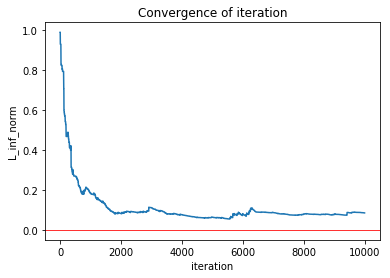

--------------------------------
0.08 0.69
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86494022  0.92248492  0.98797228  0.          0.80514065  0.91308101
  0.          0.75805505  0.75777021  0.81879347  0.75467626]
	 plot convengence of value function: 


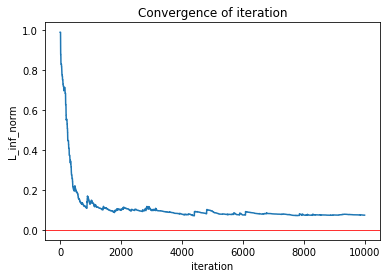

--------------------------------
0.08 0.7
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.8657946   0.9217217   0.98834092  0.          0.80748946  0.91280787
  0.          0.76039892  0.7204155   0.81145092  0.72388768]
	 plot convengence of value function: 


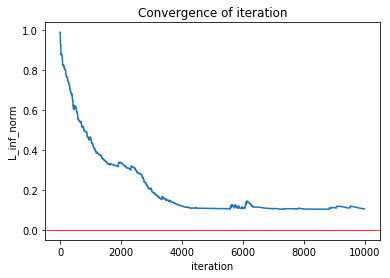

--------------------------------
0.08 0.71
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86620883  0.91976352  0.98714087  0.          0.81131076  0.91661309
  0.          0.76201538  0.77505841  0.8299816   0.76285899]
	 plot convengence of value function: 


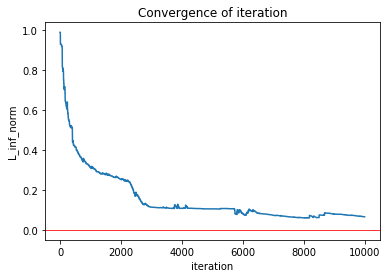

--------------------------------
0.08 0.72
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86477529  0.91956521  0.98714366  0.          0.81032739  0.91066758
  0.          0.76186822  0.75988351  0.80405474  0.74144647]
	 plot convengence of value function: 


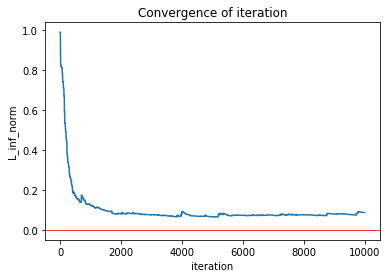

--------------------------------
0.08 0.73
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86551545  0.91834744  0.98717592  0.          0.80647255  0.91612427
  0.          0.75848663  0.76091285  0.82994324  0.76386934]
	 plot convengence of value function: 


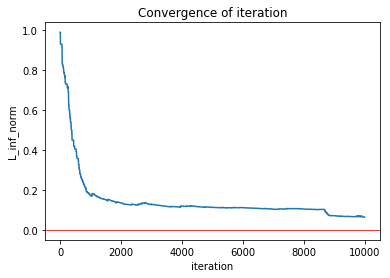

--------------------------------
0.08 0.74
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86555713  0.920833    0.9870348   0.          0.80978778  0.91575392
  0.          0.76339332  0.72581928  0.82479658  0.76593228]
	 plot convengence of value function: 


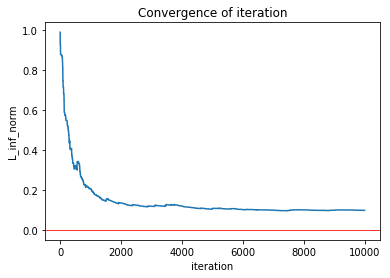

--------------------------------
0.08 0.75
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86314377  0.91784491  0.98665382  0.          0.80547572  0.91014561
  0.          0.75604608  0.76590375  0.80726598  0.76438783]
	 plot convengence of value function: 


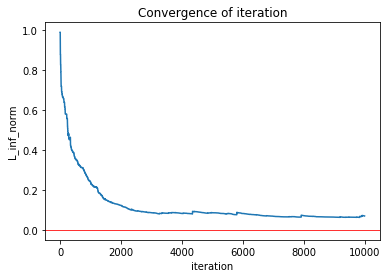

--------------------------------
0.08 0.76
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86571511  0.91973156  0.98801704  0.          0.80771084  0.91424058
  0.          0.76044621  0.71298809  0.81201372  0.68878342]
	 plot convengence of value function: 


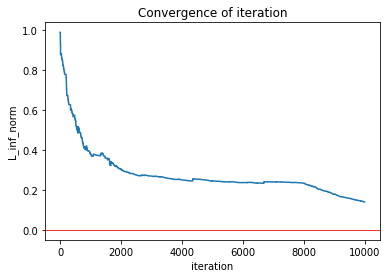

--------------------------------
0.08 0.77
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86283659  0.91880505  0.98656846  0.          0.80401827  0.91239451
  0.          0.75457882  0.71429456  0.80457346  0.74165505]
	 plot convengence of value function: 


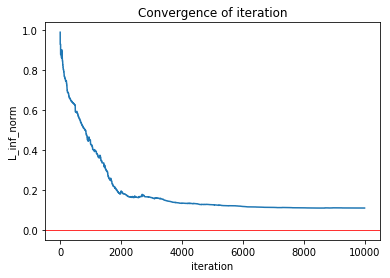

--------------------------------
0.08 0.78
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86320586  0.91761795  0.98684513  0.          0.80783463  0.91411385
  0.          0.76005152  0.76429231  0.82121045  0.76726626]
	 plot convengence of value function: 


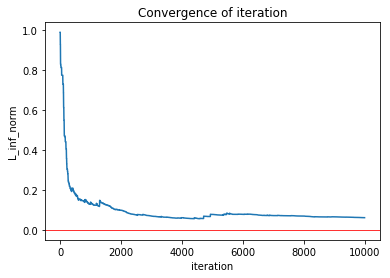

--------------------------------
0.08 0.79
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86537772  0.91935828  0.98580423  0.          0.80914383  0.91474667
  0.          0.75919744  0.7194113   0.78557382  0.74173927]
	 plot convengence of value function: 


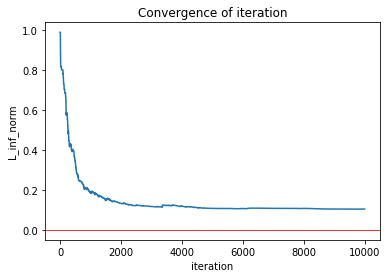

--------------------------------
0.08 0.8
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86482121  0.9193829   0.98779381  0.          0.80777542  0.91332792
  0.          0.75656579  0.71237469  0.81226489  0.71961257]
	 plot convengence of value function: 


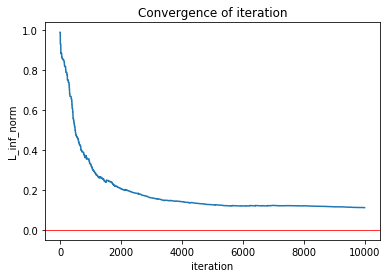

--------------------------------
0.08 0.81
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86495212  0.92043399  0.98753063  0.          0.80697062  0.91422272
  0.          0.75911665  0.71915045  0.80865475  0.74351932]
	 plot convengence of value function: 


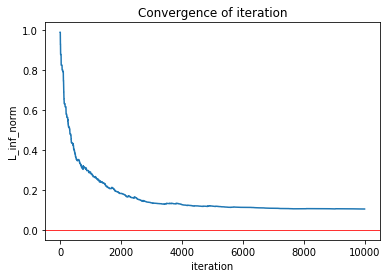

--------------------------------
0.08 0.82
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86377207  0.91936849  0.98584891  0.          0.80483432  0.91419937
  0.          0.7502048   0.70409775  0.81894951  0.74784741]
	 plot convengence of value function: 


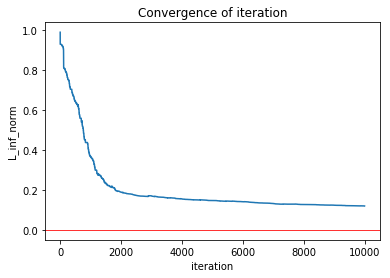

--------------------------------
0.08 0.83
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86396023  0.91851136  0.98595375  0.          0.80561612  0.91078553
  0.          0.75085376  0.70326162  0.80648713  0.74233895]
	 plot convengence of value function: 


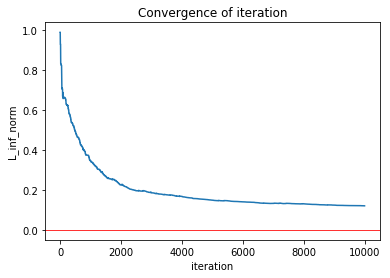

--------------------------------
0.08 0.84
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.862008    0.91831865  0.98620481  0.          0.80485336  0.91426204
  0.          0.74731542  0.74715486  0.81426204  0.74657038]
	 plot convengence of value function: 


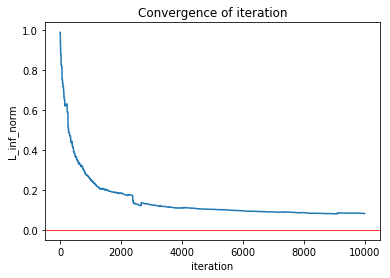

--------------------------------
0.08 0.85
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86377972  0.91895965  0.9876086   0.          0.80189992  0.91373838
  0.          0.74395138  0.68858104  0.81296491  0.73003328]
	 plot convengence of value function: 


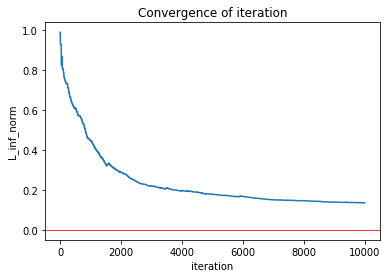

--------------------------------
0.08 0.86
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86228399  0.91855082  0.98715483  0.          0.80159477  0.91178766
  0.          0.73470011  0.74388498  0.81585402  0.7380586 ]
	 plot convengence of value function: 


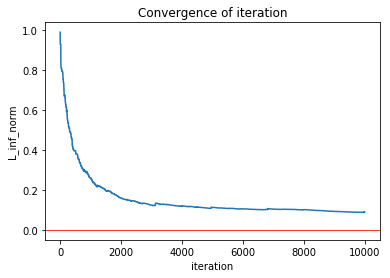

--------------------------------
0.08 0.87
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86222418  0.91850994  0.98719092  0.          0.79757844  0.90589539
  0.          0.73566585  0.67761542  0.80729258  0.71494317]
	 plot convengence of value function: 


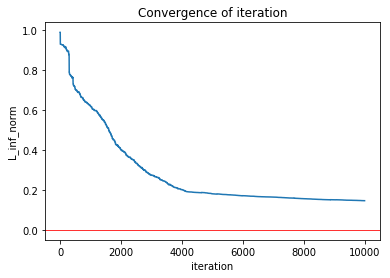

--------------------------------
0.08 0.88
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.8641699   0.91882865  0.9865116   0.          0.80420542  0.91329099
  0.          0.74121196  0.74244539  0.81148801  0.73282968]
	 plot convengence of value function: 


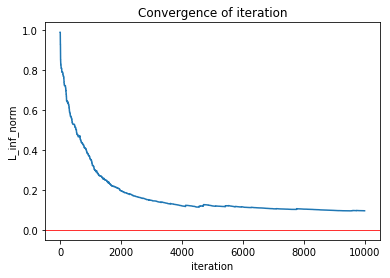

--------------------------------
0.08 0.89
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86452835  0.91850677  0.98675464  0.          0.80419774  0.91227366
  0.          0.7479921   0.68192252  0.80332051  0.67579368]
	 plot convengence of value function: 


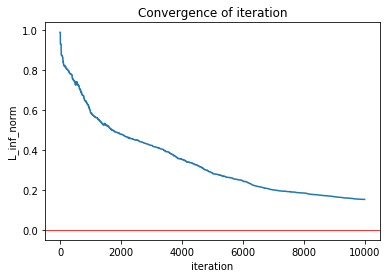

--------------------------------
0.08 0.9
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86048231  0.91842595  0.98701974  0.          0.79833756  0.90220501
  0.          0.743682    0.67426981  0.79004345  0.60598127]
	 plot convengence of value function: 


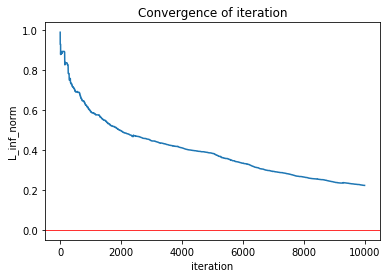

--------------------------------
0.08 0.91
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85948049  0.91791959  0.9870636   0.          0.78638853  0.9126544   0.
  0.70441448  0.72501505  0.81099329  0.72743841]
	 plot convengence of value function: 


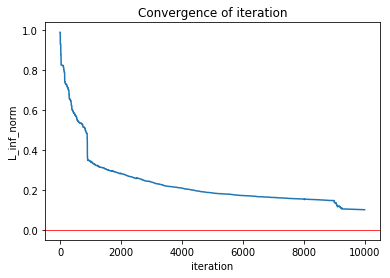

--------------------------------
0.08 0.92
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85833126  0.91725685  0.9865296   0.          0.79255517  0.90949457
  0.          0.72683657  0.66243679  0.80507347  0.70754418]
	 plot convengence of value function: 


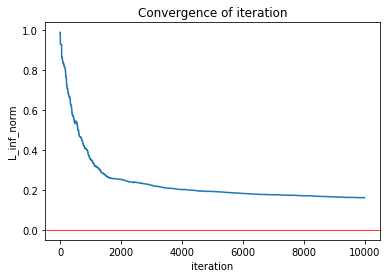

--------------------------------
0.08 0.93
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86104719  0.91885717  0.98764583  0.          0.79418877  0.91177361
  0.          0.72998935  0.71149366  0.80240008  0.71112023]
	 plot convengence of value function: 


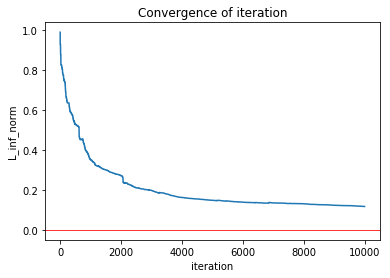

--------------------------------
0.08 0.94
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86035726  0.91747491  0.9868151   0.          0.7895026   0.90685088
  0.          0.69956093  0.60650042  0.78558393  0.68061227]
	 plot convengence of value function: 


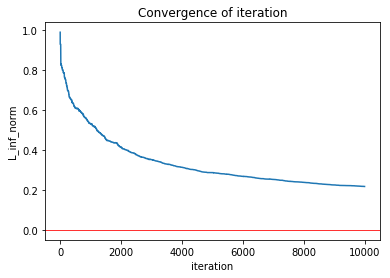

--------------------------------
0.08 0.95
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86321018  0.91885566  0.98750756  0.          0.79667339  0.91225104
  0.          0.73309981  0.72751113  0.81435444  0.70673301]
	 plot convengence of value function: 


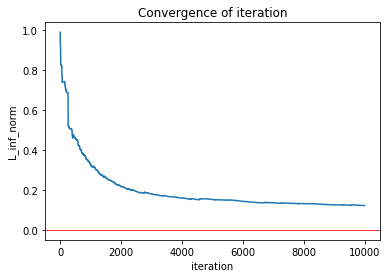

--------------------------------
0.08 0.96
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.84880285  0.91327453  0.98624517  0.          0.76134771  0.90650088
  0.          0.67348328  0.57453071  0.79885042  0.63293171]
	 plot convengence of value function: 


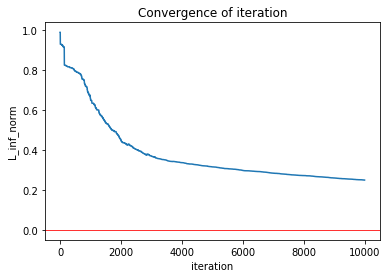

--------------------------------
0.08 0.97
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.856658    0.91595649  0.98649242  0.          0.78314928  0.90787031
  0.          0.70681375  0.70407331  0.79619001  0.67529151]
	 plot convengence of value function: 


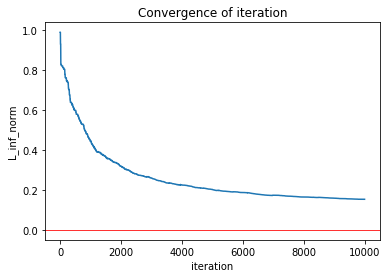

--------------------------------
0.08 0.98
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85689368  0.9158666   0.98618006  0.          0.78215017  0.90844299
  0.          0.69239932  0.57988843  0.79173315  0.6158953 ]
	 plot convengence of value function: 


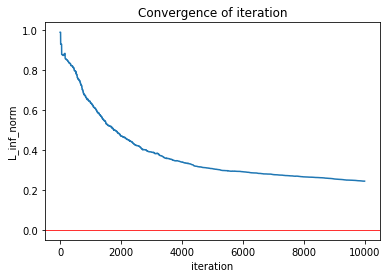

--------------------------------
0.08 0.99
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85121196  0.91163702  0.98513853  0.          0.77304777  0.89598459
  0.          0.68247692  0.56198774  0.76770859  0.54181913]
	 plot convengence of value function: 


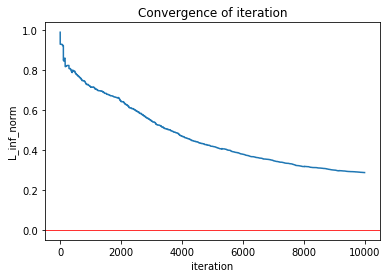

--------------------------------
0.09 0.51
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85866955  0.91800685  0.98597859  0.          0.80828147  0.90701409
  0.          0.76146401  0.77721619  0.83472594  0.7669202 ]
	 plot convengence of value function: 


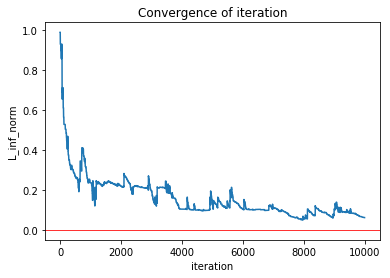

--------------------------------
0.09 0.52
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86520978  0.91760712  0.98394427  0.          0.80906941  0.91207116
  0.          0.75977472  0.75247216  0.76237346  0.71160863]
	 plot convengence of value function: 


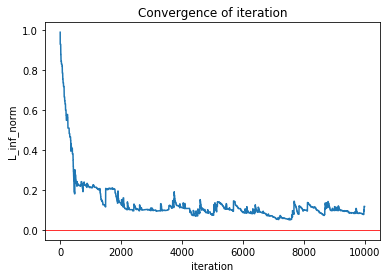

--------------------------------
0.09 0.53
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86681437  0.91745965  0.99020443  0.          0.80602372  0.90697532
  0.          0.75969764  0.72382192  0.7800485   0.7202737 ]
	 plot convengence of value function: 


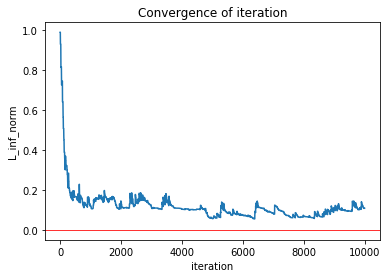

--------------------------------
0.09 0.54
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86234834  0.91898333  0.9854105   0.          0.80257593  0.9141773   0.
  0.75621069  0.72621054  0.8382412   0.77174149]
	 plot convengence of value function: 


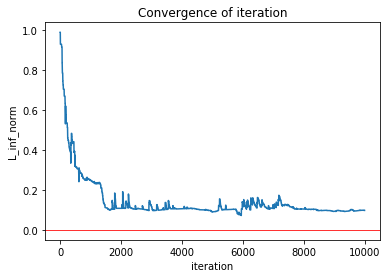

--------------------------------
0.09 0.55
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86599628  0.92283284  0.98610969  0.          0.81129803  0.91671713
  0.          0.75611982  0.76767116  0.81743359  0.74349451]
	 plot convengence of value function: 


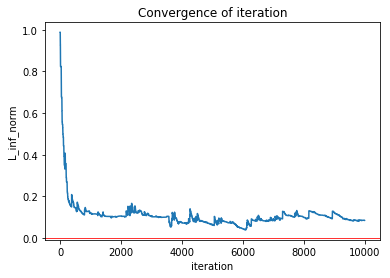

--------------------------------
0.09 0.56
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86305604  0.91735828  0.98785664  0.          0.80503832  0.91054349
  0.          0.75815834  0.75695558  0.79002667  0.75915261]
	 plot convengence of value function: 


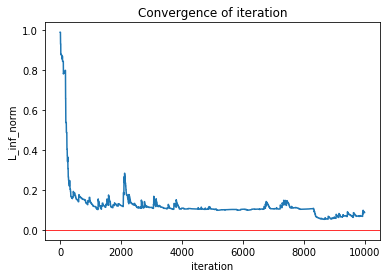

--------------------------------
0.09 0.57
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85907209  0.91243383  0.98431175  0.          0.80482039  0.91025967
  0.          0.75838318  0.75302319  0.78441894  0.74561377]
	 plot convengence of value function: 


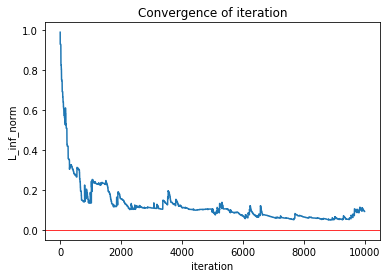

--------------------------------
0.09 0.58
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86148196  0.91561251  0.98894316  0.          0.8057841   0.91266301
  0.          0.75763912  0.75490652  0.80386619  0.69375183]
	 plot convengence of value function: 


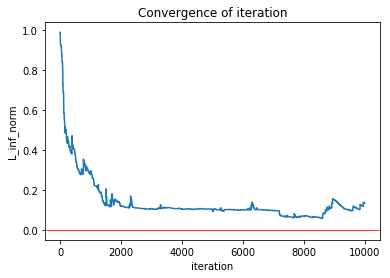

--------------------------------
0.09 0.59
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86226864  0.91942413  0.98771945  0.          0.80761961  0.9091797   0.
  0.75717271  0.75114241  0.78142567  0.75452171]
	 plot convengence of value function: 


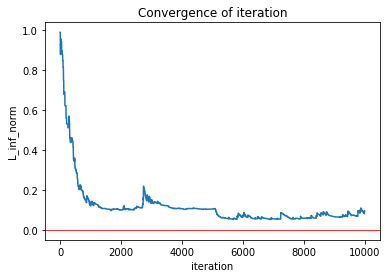

--------------------------------
0.09 0.6
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.8549649   0.91250997  0.98504315  0.          0.79681046  0.90647422
  0.          0.75480629  0.75795142  0.824477    0.73655146]
	 plot convengence of value function: 


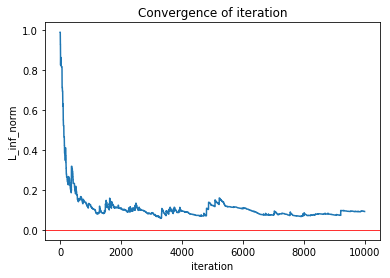

--------------------------------
0.09 0.61
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86557259  0.91829824  0.98821249  0.          0.80954522  0.91437599
  0.          0.76297825  0.7502328   0.80610607  0.74983351]
	 plot convengence of value function: 


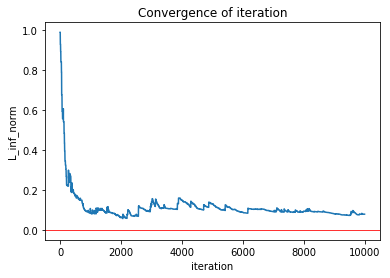

--------------------------------
0.09 0.62
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86168043  0.91787892  0.98691607  0.          0.8012016   0.91245144
  0.          0.75434749  0.75770153  0.79740415  0.75387878]
	 plot convengence of value function: 


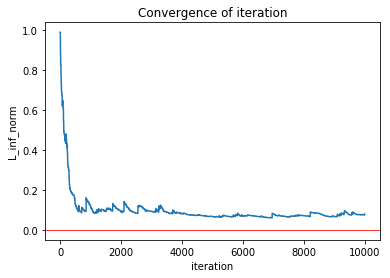

--------------------------------
0.09 0.63
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86260911  0.9191707   0.98862749  0.          0.80687845  0.91123451
  0.          0.76018833  0.76513173  0.7940295   0.74920523]
	 plot convengence of value function: 


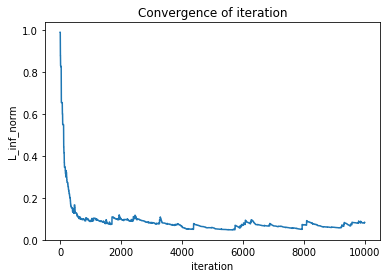

--------------------------------
0.09 0.64
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86591105  0.92188986  0.98841546  0.          0.81121949  0.9189197   0.
  0.76146038  0.75048505  0.80477976  0.73723754]
	 plot convengence of value function: 


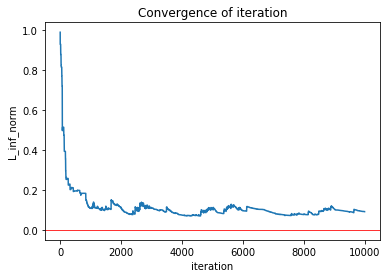

--------------------------------
0.09 0.65
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86469566  0.92129596  0.98617625  0.          0.80499881  0.91455743
  0.          0.75648856  0.7558705   0.81932251  0.74276401]
	 plot convengence of value function: 


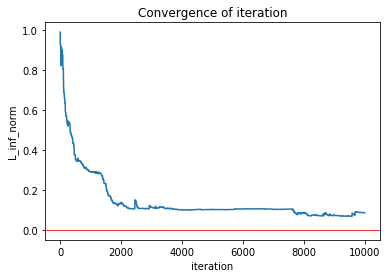

--------------------------------
0.09 0.66
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85833833  0.91497843  0.98518044  0.          0.79876847  0.91080062
  0.          0.75307692  0.76375718  0.81562239  0.74702364]
	 plot convengence of value function: 


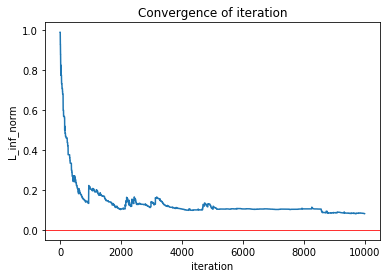

--------------------------------
0.09 0.67
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86210268  0.92048932  0.987503    0.          0.80906214  0.91723925
  0.          0.76058918  0.7571721   0.81269803  0.75504597]
	 plot convengence of value function: 


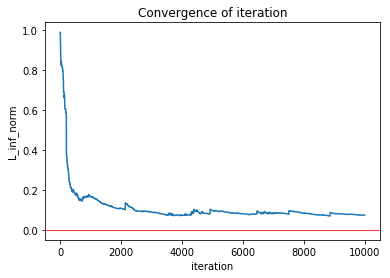

--------------------------------
0.09 0.68
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86262197  0.91757096  0.98886981  0.          0.80640799  0.90780023
  0.          0.75637664  0.71869959  0.81335145  0.73557961]
	 plot convengence of value function: 


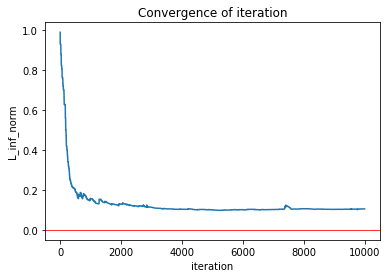

--------------------------------
0.09 0.69
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86327984  0.9192984   0.98744108  0.          0.8054043   0.90967566
  0.          0.75675068  0.75058555  0.79878694  0.75292177]
	 plot convengence of value function: 


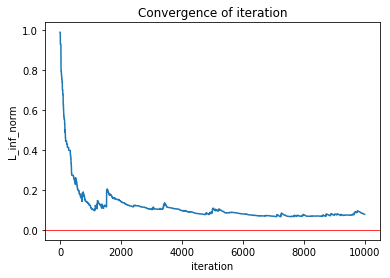

--------------------------------
0.09 0.7
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.8622861   0.91987018  0.98831778  0.          0.80589258  0.91406578
  0.          0.7568475   0.74491267  0.79934595  0.73916516]
	 plot convengence of value function: 


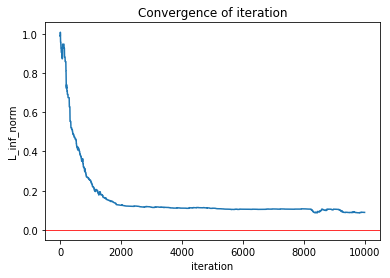

--------------------------------
0.09 0.71
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.8662738   0.91792663  0.9879458   0.          0.80935577  0.90993079
  0.          0.75746107  0.75752218  0.79936201  0.75945703]
	 plot convengence of value function: 


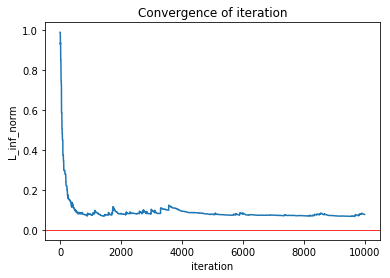

--------------------------------
0.09 0.72
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86243039  0.91709896  0.98500954  0.          0.80348879  0.90752769
  0.          0.7557583   0.71875272  0.81737335  0.74751529]
	 plot convengence of value function: 


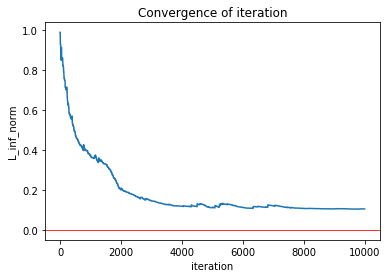

--------------------------------
0.09 0.73
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86350983  0.91830303  0.98651952  0.          0.80656843  0.91529856
  0.          0.75738312  0.75693762  0.82821541  0.76087685]
	 plot convengence of value function: 


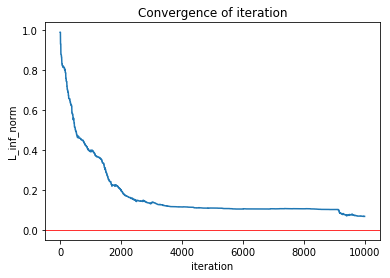

--------------------------------
0.09 0.74
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86403133  0.91620227  0.98537665  0.          0.80742464  0.90855525
  0.          0.75590776  0.71555324  0.81962851  0.75228261]
	 plot convengence of value function: 


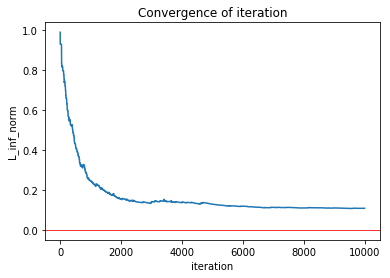

--------------------------------
0.09 0.75
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86328747  0.91719914  0.98466499  0.          0.80562049  0.91492446
  0.          0.75678818  0.71483956  0.80155255  0.71672753]
	 plot convengence of value function: 


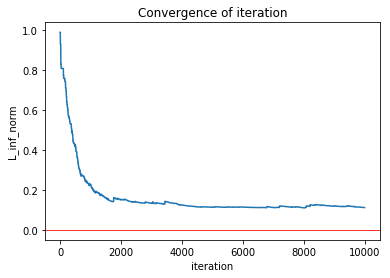

--------------------------------
0.09 0.76
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86398052  0.92044601  0.98844748  0.          0.80693391  0.91164152
  0.          0.75726027  0.76916393  0.81718049  0.76568368]
	 plot convengence of value function: 


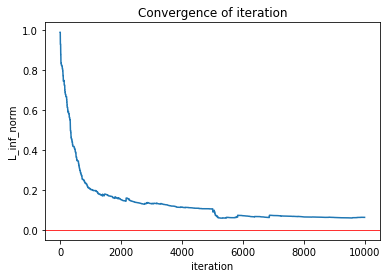

--------------------------------
0.09 0.77
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86118629  0.91461222  0.98634848  0.          0.80083334  0.9143707   0.
  0.75185608  0.75378545  0.8083498   0.74580715]
	 plot convengence of value function: 


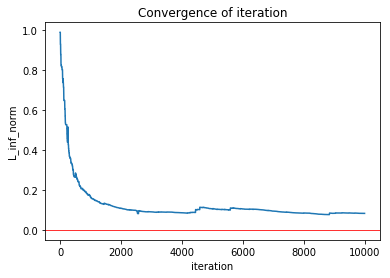

--------------------------------
0.09 0.78
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86377147  0.91728132  0.98622695  0.          0.80593904  0.91156727
  0.          0.75716548  0.71681108  0.7926665   0.73237912]
	 plot convengence of value function: 


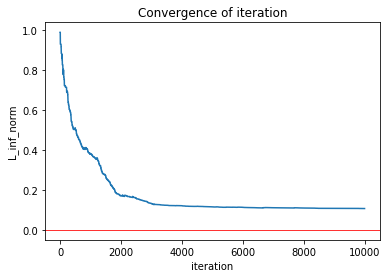

--------------------------------
0.09 0.79
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86406937  0.9195412   0.98861725  0.          0.8056248   0.91172118
  0.          0.75341527  0.70401732  0.81174349  0.72559326]
	 plot convengence of value function: 


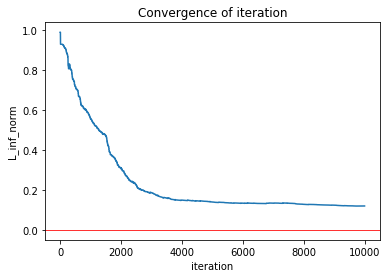

--------------------------------
0.09 0.8
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86257367  0.91703083  0.98733403  0.          0.80591601  0.91194533
  0.          0.7537111   0.75205027  0.81333704  0.73892206]
	 plot convengence of value function: 


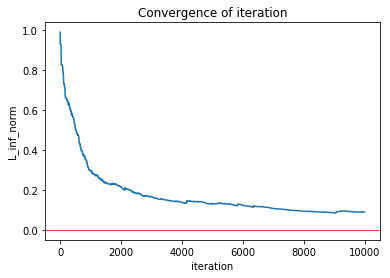

--------------------------------
0.09 0.81
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86465079  0.91985466  0.98707744  0.          0.80560616  0.91297218
  0.          0.75295266  0.7102687   0.80460683  0.73937625]
	 plot convengence of value function: 


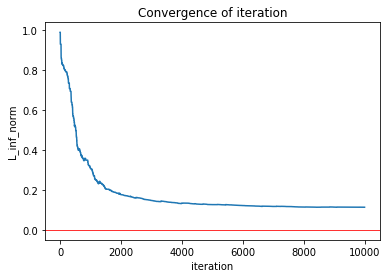

--------------------------------
0.09 0.82
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86126694  0.91788999  0.98765589  0.          0.80131257  0.91097892
  0.          0.74822177  0.70027455  0.79927278  0.72932929]
	 plot convengence of value function: 


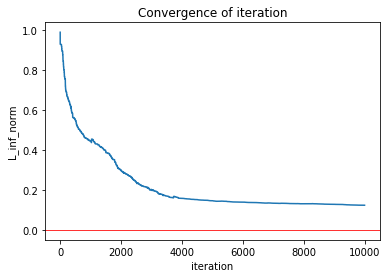

--------------------------------
0.09 0.83
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86395341  0.9192371   0.98739716  0.          0.80789493  0.90926005
  0.          0.75788269  0.71468879  0.79442008  0.7318681 ]
	 plot convengence of value function: 


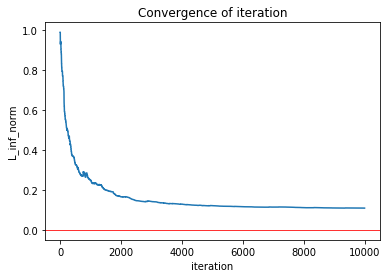

--------------------------------
0.09 0.84
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86363185  0.91969091  0.98690846  0.          0.80514889  0.91528774
  0.          0.75039282  0.70238787  0.80315596  0.73795346]
	 plot convengence of value function: 


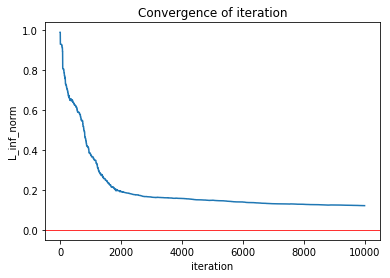

--------------------------------
0.09 0.85
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86171432  0.91745844  0.98728577  0.          0.8034267   0.91513902
  0.          0.74879665  0.74976432  0.80831845  0.7327027 ]
	 plot convengence of value function: 


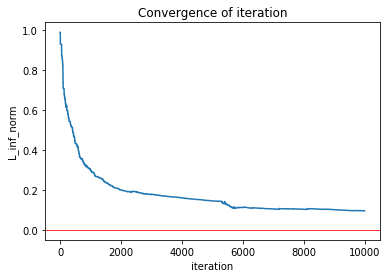

--------------------------------
0.09 0.86
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86376914  0.91832168  0.98750175  0.          0.803503    0.91425649
  0.          0.75074967  0.70422036  0.81324477  0.72276387]
	 plot convengence of value function: 


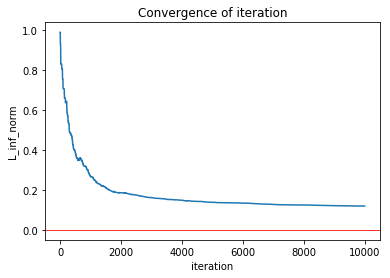

--------------------------------
0.09 0.87
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86188435  0.91732976  0.98732059  0.          0.80270595  0.91055925
  0.          0.74501188  0.69722964  0.80365913  0.72707451]
	 plot convengence of value function: 


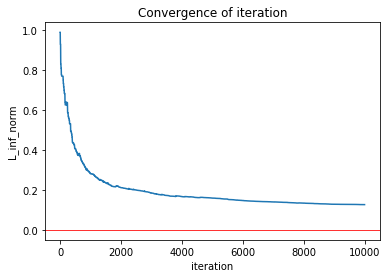

--------------------------------
0.09 0.88
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.8623339   0.91853573  0.98627753  0.          0.80123106  0.90885903
  0.          0.74086041  0.6772728   0.8014823   0.69022349]
	 plot convengence of value function: 


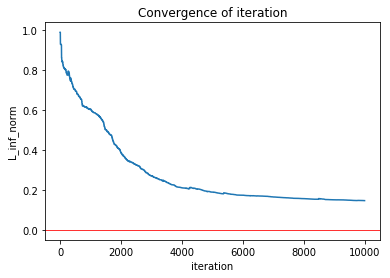

--------------------------------
0.09 0.89
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86018238  0.91717032  0.98652159  0.          0.79489344  0.90524056
  0.          0.733699    0.67409893  0.78477484  0.70785085]
	 plot convengence of value function: 


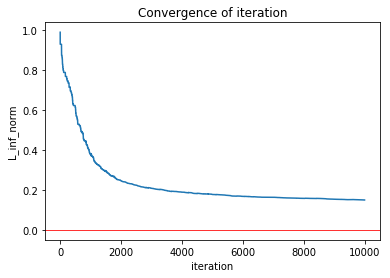

--------------------------------
0.09 0.9
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86072359  0.91704683  0.98678324  0.          0.79824     0.90796818
  0.          0.73909048  0.68333315  0.79014067  0.71681223]
	 plot convengence of value function: 


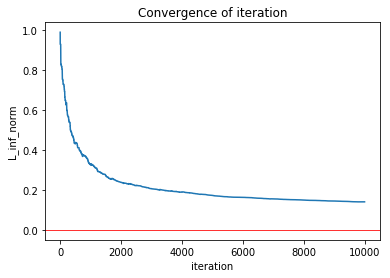

--------------------------------
0.09 0.91
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.8558838   0.91568583  0.98545528  0.          0.79029089  0.91059605
  0.          0.72460247  0.64593161  0.78949723  0.65192111]
	 plot convengence of value function: 


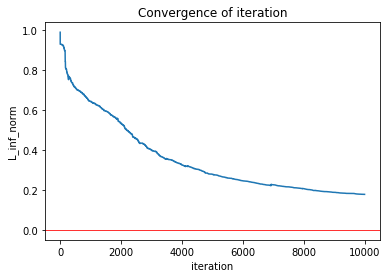

--------------------------------
0.09 0.92
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85343883  0.9144602   0.98604613  0.          0.78041001  0.90836061
  0.          0.71147421  0.63404733  0.78151586  0.69660972]
	 plot convengence of value function: 


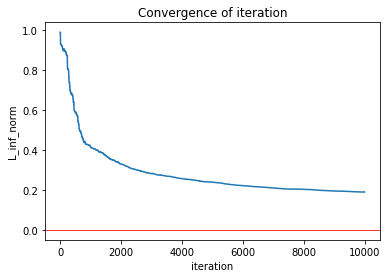

--------------------------------
0.09 0.93
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85967638  0.91702941  0.98604906  0.          0.79250747  0.90954768
  0.          0.72858276  0.70438303  0.79096831  0.69485052]
	 plot convengence of value function: 


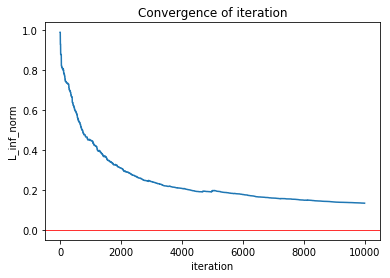

--------------------------------
0.09 0.94
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.84481014  0.91036298  0.98521962  0.          0.76321553  0.8996268   0.
  0.66775837  0.56606345  0.77474432  0.61243605]
	 plot convengence of value function: 


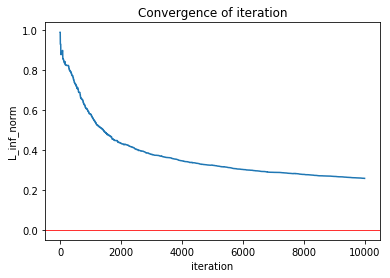

--------------------------------
0.09 0.95
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85044819  0.91375927  0.98578699  0.          0.77346598  0.90385591
  0.          0.69127166  0.67180497  0.78674663  0.67189614]
	 plot convengence of value function: 


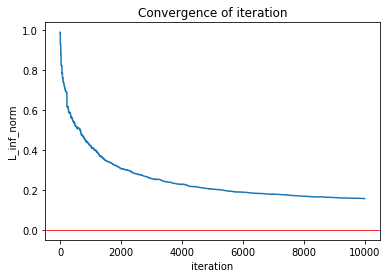

--------------------------------
0.09 0.96
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85522899  0.91482865  0.98592201  0.          0.78465367  0.90251263
  0.          0.70927388  0.62531559  0.76995029  0.64550199]
	 plot convengence of value function: 


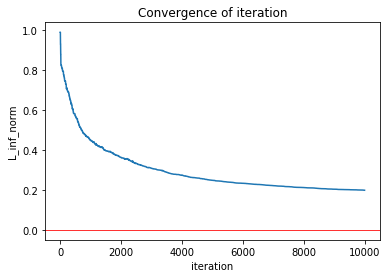

--------------------------------
0.09 0.97
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85334909  0.91524025  0.98586314  0.          0.77434515  0.89998896
  0.          0.69550061  0.61056146  0.759582    0.61525956]
	 plot convengence of value function: 


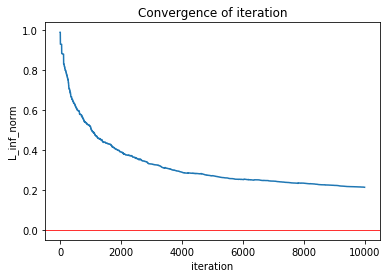

--------------------------------
0.09 0.98
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.84833624  0.91238455  0.98641982  0.          0.76303109  0.89907901
  0.          0.66722954  0.56757629  0.76865924  0.63611049]
	 plot convengence of value function: 


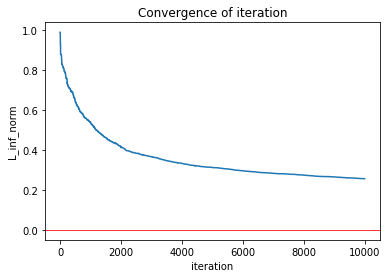

--------------------------------
0.09 0.99
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.8358948   0.90637761  0.98455716  0.          0.7424635   0.90073519
  0.          0.62185908  0.50556307  0.76575993  0.61214914]
	 plot convengence of value function: 


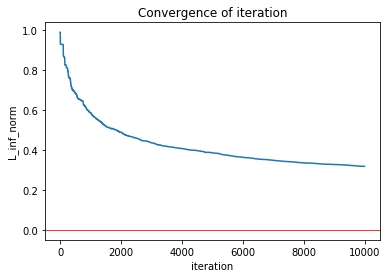

--------------------------------
0.1 0.51
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86235739  0.92020663  0.98955382  0.          0.80576997  0.91819399
  0.          0.7572211   0.74299028  0.76991383  0.73891906]
	 plot convengence of value function: 


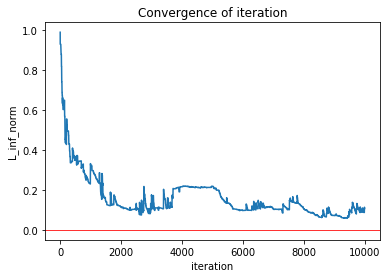

--------------------------------
0.1 0.52
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.8661367   0.91985006  0.98779951  0.          0.79854773  0.90987963
  0.          0.75257893  0.77716762  0.82702512  0.78212559]
	 plot convengence of value function: 


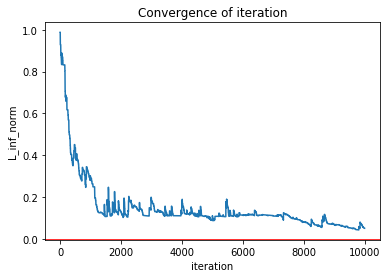

--------------------------------
0.1 0.53
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86082042  0.92084063  0.98756949  0.          0.8083362   0.91581389
  0.          0.7565662   0.7681225   0.81971615  0.74720007]
	 plot convengence of value function: 


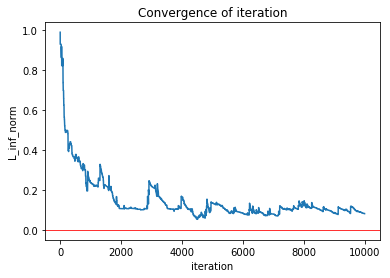

--------------------------------
0.1 0.54
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86203034  0.91743599  0.98432261  0.          0.79743981  0.9167482   0.
  0.75179977  0.72374526  0.77474337  0.73766119]
	 plot convengence of value function: 


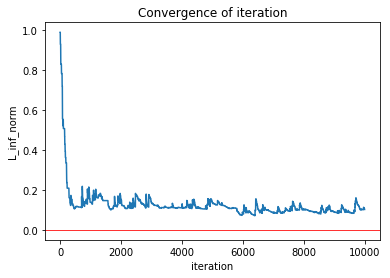

--------------------------------
0.1 0.55
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85141667  0.9085379   0.9856358   0.          0.79593613  0.90372858
  0.          0.75337875  0.73597594  0.80154782  0.73194738]
	 plot convengence of value function: 


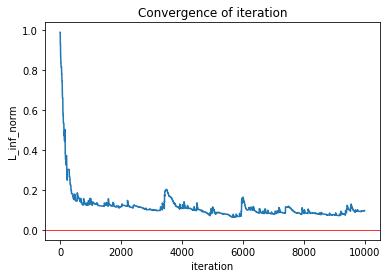

--------------------------------
0.1 0.56
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86558258  0.9150193   0.98518793  0.          0.80869393  0.91093641
  0.          0.75787674  0.76624832  0.83206061  0.75686255]
	 plot convengence of value function: 


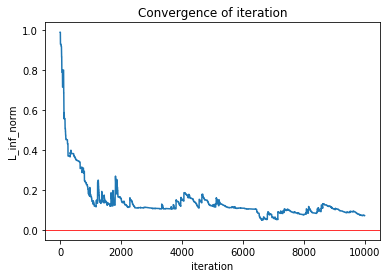

--------------------------------
0.1 0.57
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86014415  0.91581351  0.98989578  0.          0.80499131  0.91639209
  0.          0.75610283  0.74405504  0.78913758  0.71983966]
	 plot convengence of value function: 


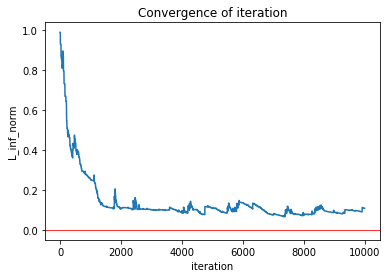

--------------------------------
0.1 0.58
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86599587  0.92149952  0.98629119  0.          0.80815803  0.91544472
  0.          0.75898796  0.74549645  0.7693285   0.74435465]
	 plot convengence of value function: 


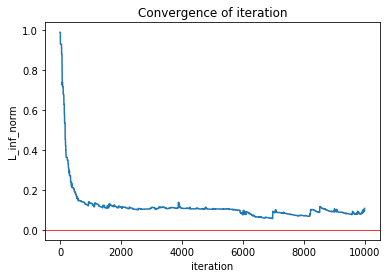

--------------------------------
0.1 0.59
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85962795  0.92101604  0.98652071  0.          0.80153126  0.91286596
  0.          0.75180755  0.73987741  0.77387154  0.7386862 ]
	 plot convengence of value function: 


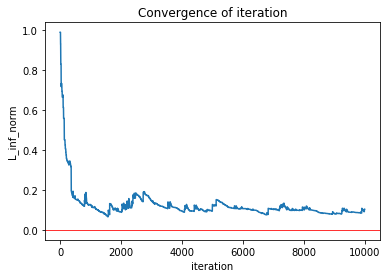

--------------------------------
0.1 0.6
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85988405  0.91301598  0.98871759  0.          0.80212626  0.91205529
  0.          0.7550264   0.75255222  0.81016552  0.73047681]
	 plot convengence of value function: 


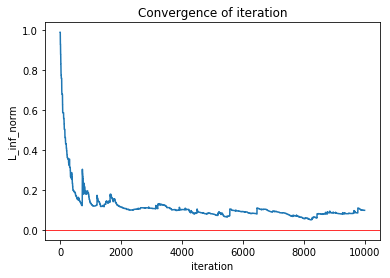

--------------------------------
0.1 0.61
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86305972  0.9175498   0.988181    0.          0.80342771  0.91446484
  0.          0.75501055  0.75515758  0.8159063   0.73970941]
	 plot convengence of value function: 


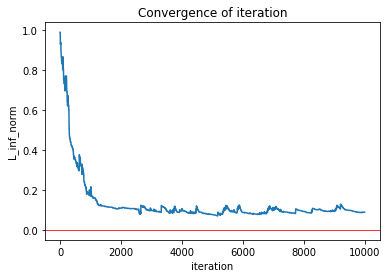

--------------------------------
0.1 0.62
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86281592  0.91634827  0.98645915  0.          0.80433244  0.91778511
  0.          0.75452748  0.76385182  0.82301812  0.76541351]
	 plot convengence of value function: 


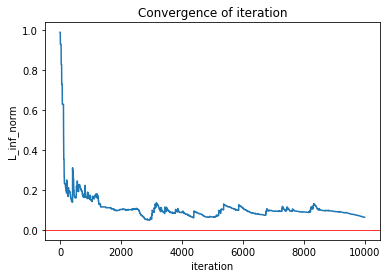

--------------------------------
0.1 0.63
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86086344  0.91885803  0.98836527  0.          0.79946625  0.91675202
  0.          0.75253538  0.75855683  0.79914119  0.72545289]
	 plot convengence of value function: 


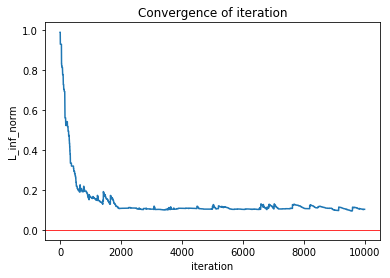

--------------------------------
0.1 0.64
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86151373  0.9154835   0.98771753  0.          0.80518977  0.90926604
  0.          0.75724035  0.74507328  0.79638687  0.74622487]
	 plot convengence of value function: 


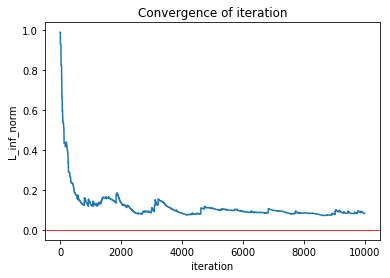

--------------------------------
0.1 0.65
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86375501  0.91950858  0.98640564  0.          0.80563961  0.91729232
  0.          0.75407197  0.75743052  0.8130825   0.74686451]
	 plot convengence of value function: 


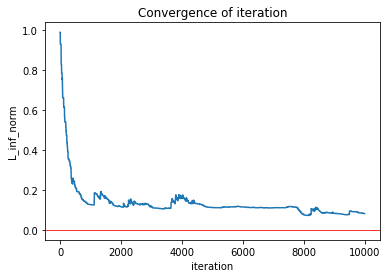

--------------------------------
0.1 0.66
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86123362  0.91569011  0.9852115   0.          0.80429386  0.91100359
  0.          0.75532019  0.7335285   0.79658632  0.72258597]
	 plot convengence of value function: 


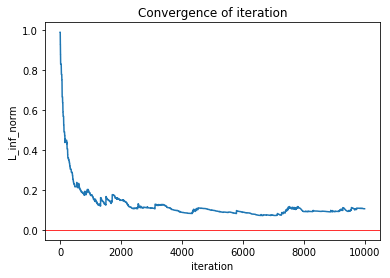

--------------------------------
0.1 0.67
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85719046  0.91610659  0.98483121  0.          0.8035678   0.91352398
  0.          0.75463774  0.72092224  0.82612493  0.75455183]
	 plot convengence of value function: 


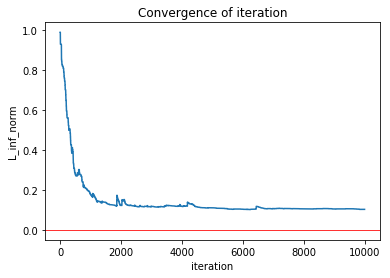

--------------------------------
0.1 0.68
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85953526  0.91724691  0.98640232  0.          0.80398823  0.91108518
  0.          0.75099175  0.75074552  0.79559768  0.75388354]
	 plot convengence of value function: 


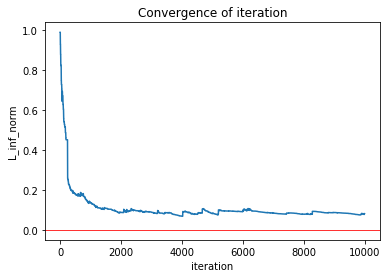

--------------------------------
0.1 0.69
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85824102  0.91457197  0.98629285  0.          0.8026185   0.90928371
  0.          0.75346837  0.74262909  0.79774086  0.74186047]
	 plot convengence of value function: 


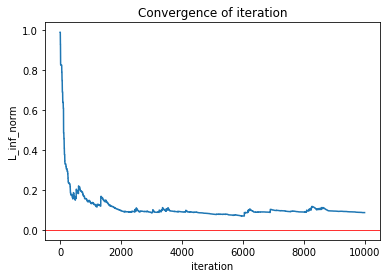

--------------------------------
0.1 0.7
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85999016  0.91541672  0.98645495  0.          0.80262345  0.90976948
  0.          0.75582511  0.74717141  0.79032218  0.73742651]
	 plot convengence of value function: 


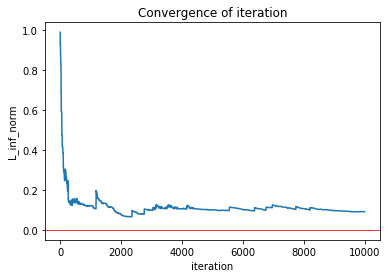

--------------------------------
0.1 0.71
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85984689  0.91464681  0.98453738  0.          0.80123738  0.90695327
  0.          0.74971317  0.7138448   0.80376239  0.73995729]
	 plot convengence of value function: 


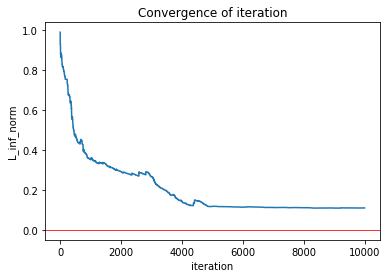

--------------------------------
0.1 0.72
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86115307  0.91658459  0.98457333  0.          0.8059934   0.90842201
  0.          0.75733411  0.74606624  0.78724257  0.73249359]
	 plot convengence of value function: 


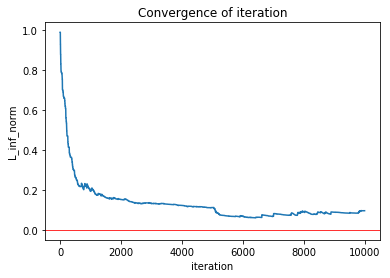

--------------------------------
0.1 0.73
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86164802  0.91530727  0.98448017  0.          0.80192723  0.90809091
  0.          0.75261337  0.75773989  0.81399501  0.74637685]
	 plot convengence of value function: 


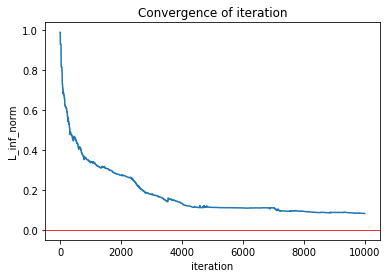

--------------------------------
0.1 0.74
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86037619  0.91742479  0.98819724  0.          0.80474092  0.91355449
  0.          0.75634751  0.7488522   0.78616425  0.73258674]
	 plot convengence of value function: 


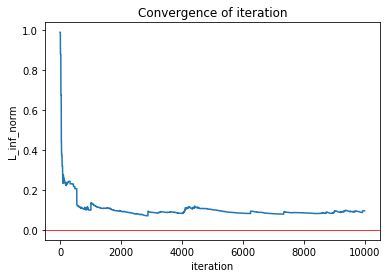

--------------------------------
0.1 0.75
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86039459  0.91590036  0.98591659  0.          0.80298675  0.90928951
  0.          0.75218979  0.74338018  0.7985494   0.74405631]
	 plot convengence of value function: 


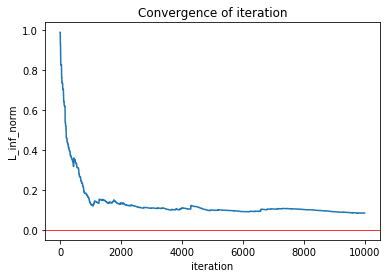

--------------------------------
0.1 0.76
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86050596  0.91829584  0.98653166  0.          0.80302009  0.91046243
  0.          0.75492419  0.7442385   0.80130727  0.73961377]
	 plot convengence of value function: 


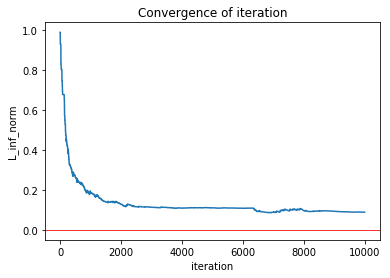

--------------------------------
0.1 0.77
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85875264  0.91325478  0.98582637  0.          0.79679349  0.91130544
  0.          0.75130374  0.74266341  0.79446249  0.7384301 ]
	 plot convengence of value function: 


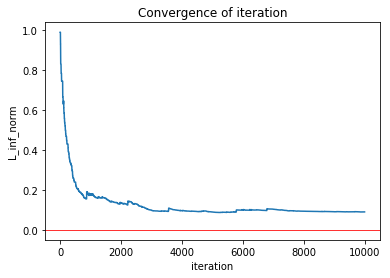

--------------------------------
0.1 0.78
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86204642  0.91755872  0.98713139  0.          0.80446396  0.90704491
  0.          0.75598888  0.71653363  0.80782522  0.73806438]
	 plot convengence of value function: 


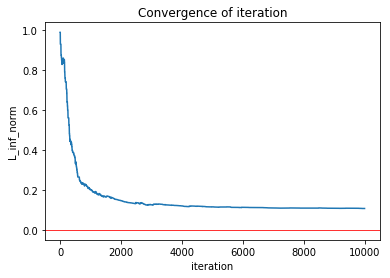

--------------------------------
0.1 0.79
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86136746  0.91569395  0.98592601  0.          0.80649776  0.91092445
  0.          0.75308393  0.74042362  0.79488782  0.73842614]
	 plot convengence of value function: 


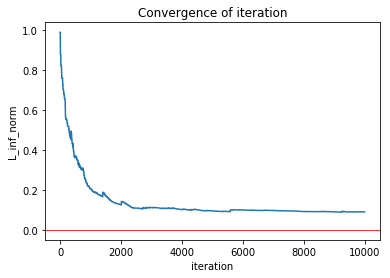

--------------------------------
0.1 0.8
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86173372  0.91717076  0.98744072  0.          0.80345836  0.91084797
  0.          0.75075269  0.70370304  0.81320306  0.72043426]
	 plot convengence of value function: 


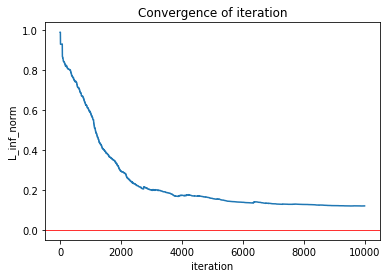

--------------------------------
0.1 0.81
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86260737  0.91753139  0.9863819   0.          0.80295417  0.91060577
  0.          0.75056958  0.7037502   0.78561493  0.70986724]
	 plot convengence of value function: 


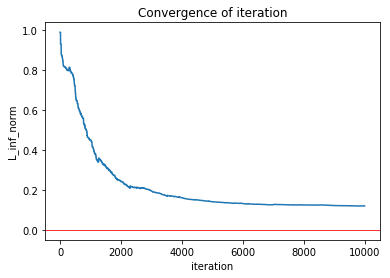

--------------------------------
0.1 0.82
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86009408  0.91695779  0.98733525  0.          0.80038276  0.91159051
  0.          0.74811231  0.70361     0.82105962  0.72906361]
	 plot convengence of value function: 


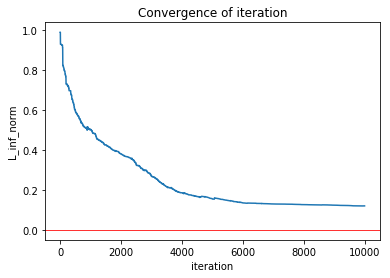

--------------------------------
0.1 0.83
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85906836  0.91457492  0.98702139  0.          0.79955797  0.90158776
  0.          0.75094557  0.70151776  0.77512185  0.68234826]
	 plot convengence of value function: 


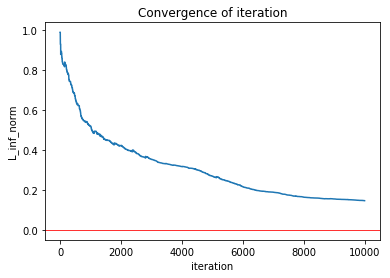

--------------------------------
0.1 0.84
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85921147  0.91518583  0.98634854  0.          0.79958798  0.908718    0.
  0.746447    0.69642776  0.79209948  0.71581535]
	 plot convengence of value function: 


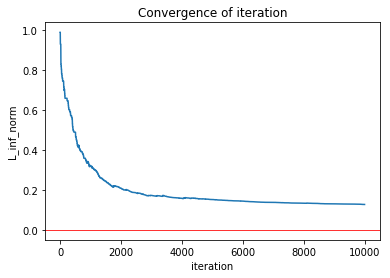

--------------------------------
0.1 0.85
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86068137  0.91686319  0.98562569  0.          0.79935913  0.90972265
  0.          0.73759741  0.67763509  0.8058598   0.7245007 ]
	 plot convengence of value function: 


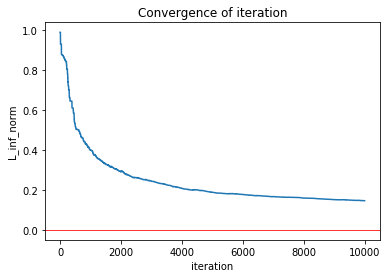

--------------------------------
0.1 0.86
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86017453  0.91512723  0.98670298  0.          0.80122107  0.90870948
  0.          0.74728837  0.6973619   0.77424165  0.69304212]
	 plot convengence of value function: 


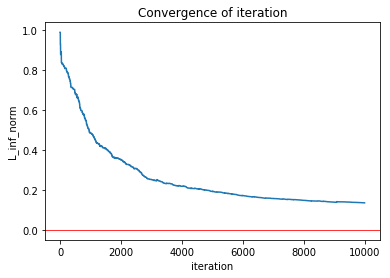

--------------------------------
0.1 0.87
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.8564889   0.91414961  0.98584811  0.          0.79082092  0.90724147
  0.          0.73423762  0.72101526  0.79057635  0.71072263]
	 plot convengence of value function: 


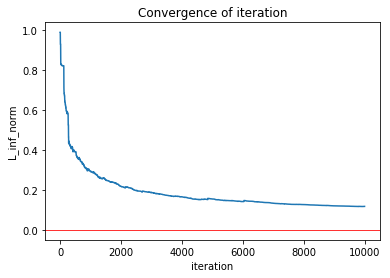

--------------------------------
0.1 0.88
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86053362  0.91704463  0.98635012  0.          0.79886491  0.9106941   0.
  0.73961547  0.68938414  0.80243172  0.71222788]
	 plot convengence of value function: 


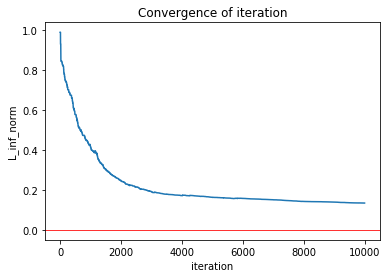

--------------------------------
0.1 0.89
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86101929  0.91651474  0.98635837  0.          0.79838372  0.90806269
  0.          0.73626513  0.67755262  0.79352219  0.72236788]
	 plot convengence of value function: 


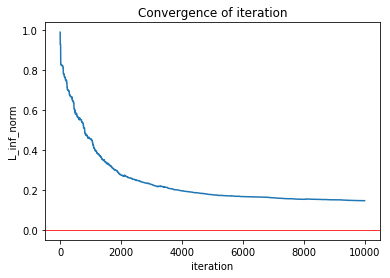

--------------------------------
0.1 0.9
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85899229  0.91507764  0.98687604  0.          0.79677687  0.90458917
  0.          0.73782499  0.66267791  0.7801145   0.68133705]
	 plot convengence of value function: 


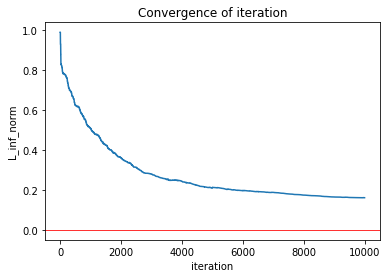

--------------------------------
0.1 0.91
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85967435  0.91661487  0.98627085  0.          0.7881429   0.90977304
  0.          0.71875012  0.64527754  0.79471734  0.7004511 ]
	 plot convengence of value function: 


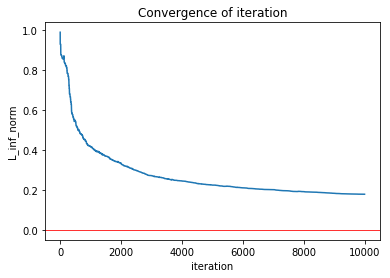

--------------------------------
0.1 0.92
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85297461  0.91264503  0.98535188  0.          0.7777574   0.90373807
  0.          0.70733137  0.62964416  0.77388164  0.6801074 ]
	 plot convengence of value function: 


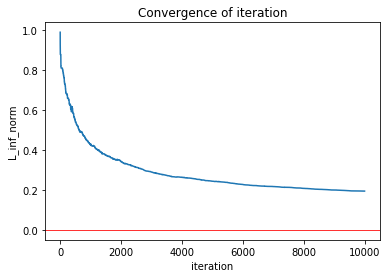

--------------------------------
0.1 0.93
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85401779  0.91254336  0.98606367  0.          0.78566106  0.90539511
  0.          0.72056111  0.6707313   0.76990459  0.66102843]
	 plot convengence of value function: 


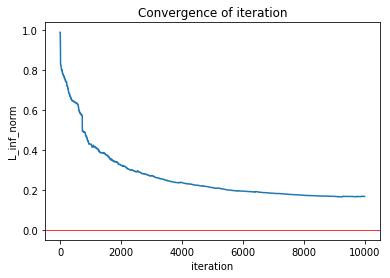

--------------------------------
0.1 0.94
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85687216  0.91408167  0.98600298  0.          0.78994558  0.90359819
  0.          0.72342263  0.67776772  0.78055232  0.66221968]
	 plot convengence of value function: 


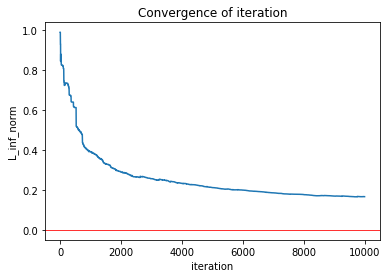

--------------------------------
0.1 0.95
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85546224  0.9150366   0.98687382  0.          0.78420075  0.9081107   0.
  0.71570306  0.71349814  0.78840309  0.71053652]
	 plot convengence of value function: 


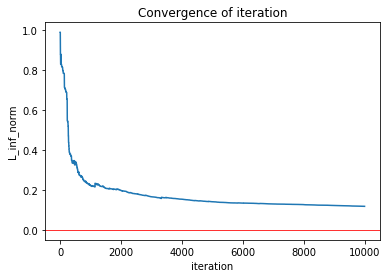

--------------------------------
0.1 0.96
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.84244132  0.90964985  0.98560139  0.          0.75024773  0.90183517
  0.          0.65107347  0.70111464  0.77956436  0.66778865]
	 plot convengence of value function: 


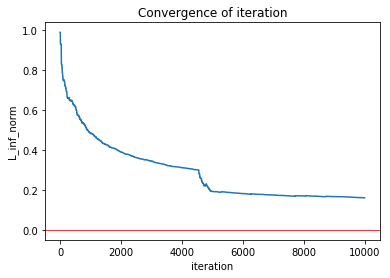

--------------------------------
0.1 0.97
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85312791  0.91287333  0.98577434  0.          0.78036198  0.90207103
  0.          0.70724739  0.62337258  0.79053069  0.68876673]
	 plot convengence of value function: 


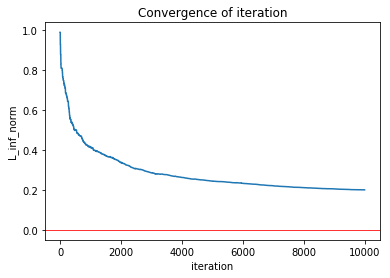

--------------------------------
0.1 0.98
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85182029  0.91200811  0.98523328  0.          0.7750812   0.9061732   0.
  0.70232466  0.72181848  0.78950381  0.71505453]
	 plot convengence of value function: 


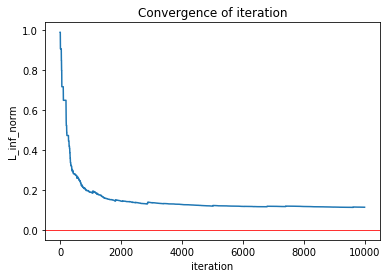

--------------------------------
0.1 0.99
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85081766  0.91204816  0.98610783  0.          0.77579321  0.89495471
  0.          0.70162729  0.61062498  0.76647125  0.61773139]
	 plot convengence of value function: 


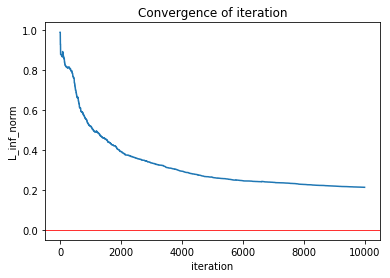

--------------------------------
0.11 0.51
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85476739  0.90786463  0.98455407  0.          0.79974602  0.91467008
  0.          0.75273595  0.782288    0.84729063  0.7573403 ]
	 plot convengence of value function: 


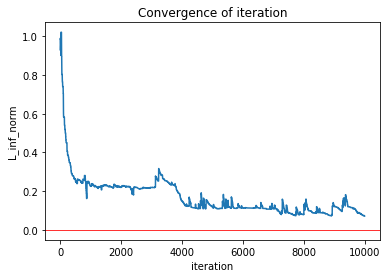

--------------------------------
0.11 0.52
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86343532  0.91811646  0.99022555  0.          0.80398551  0.9064495   0.
  0.75496994  0.7161857   0.79443703  0.71545269]
	 plot convengence of value function: 


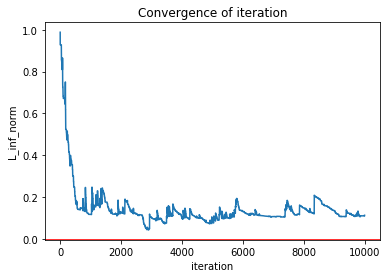

--------------------------------
0.11 0.53
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85922313  0.91292666  0.98675424  0.          0.79534526  0.91004141
  0.          0.74774842  0.73955113  0.79791218  0.66513652]
	 plot convengence of value function: 


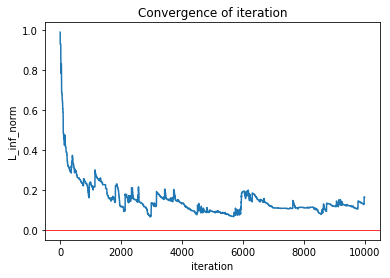

--------------------------------
0.11 0.54
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85854642  0.91525134  0.98760735  0.          0.79968387  0.91128306
  0.          0.75212584  0.73832627  0.81396885  0.70541725]
	 plot convengence of value function: 


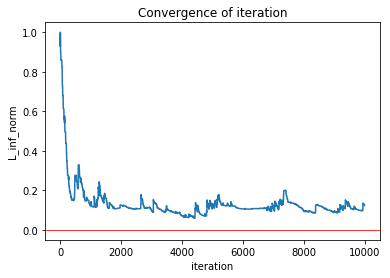

--------------------------------
0.11 0.55
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85766627  0.91096208  0.98628691  0.          0.79732963  0.90993153
  0.          0.74726894  0.73479652  0.80068172  0.72725903]
	 plot convengence of value function: 


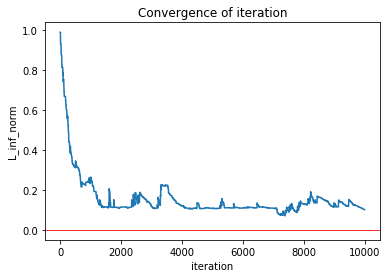

--------------------------------
0.11 0.56
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85953611  0.91570264  0.98310475  0.          0.79969147  0.90723779
  0.          0.75128465  0.73046668  0.75069021  0.73568645]
	 plot convengence of value function: 


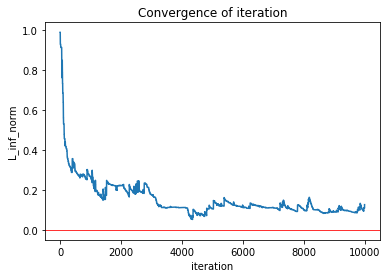

--------------------------------
0.11 0.57
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86094886  0.91025845  0.98211148  0.          0.80101037  0.90887544
  0.          0.7520727   0.72578896  0.77322053  0.73425733]
	 plot convengence of value function: 


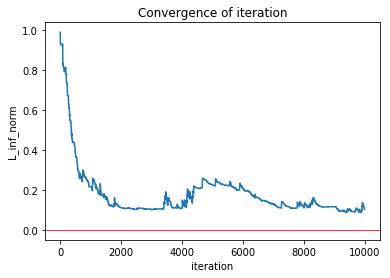

--------------------------------
0.11 0.58
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86200588  0.91541656  0.98177979  0.          0.79640043  0.90925936
  0.          0.75149233  0.73730412  0.8010238   0.72741679]
	 plot convengence of value function: 


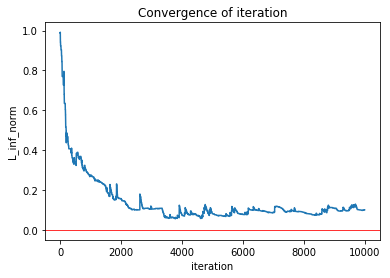

--------------------------------
0.11 0.59
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85937329  0.91707285  0.98652689  0.          0.80186309  0.91434407
  0.          0.7501406   0.75647808  0.79067321  0.75306149]
	 plot convengence of value function: 


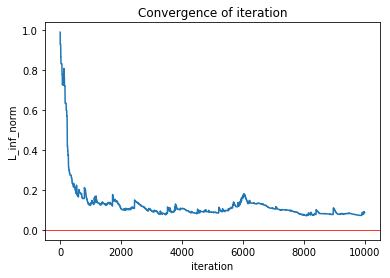

--------------------------------
0.11 0.6
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85486343  0.91723979  0.98835362  0.          0.79909424  0.90757411
  0.          0.75287317  0.73769675  0.81101329  0.72384093]
	 plot convengence of value function: 


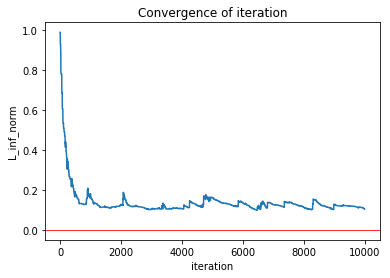

--------------------------------
0.11 0.61
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85572627  0.90818254  0.98590016  0.          0.80414436  0.91363242
  0.          0.75335187  0.73111861  0.79434031  0.72924272]
	 plot convengence of value function: 


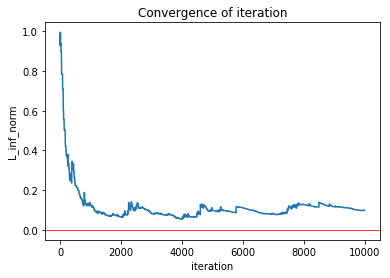

--------------------------------
0.11 0.62
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85614591  0.91298111  0.98782019  0.          0.7999991   0.9093956   0.
  0.75114891  0.74975435  0.80635263  0.73270816]
	 plot convengence of value function: 


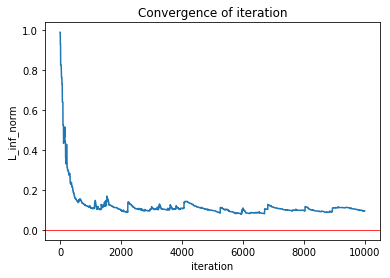

--------------------------------
0.11 0.63
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85973964  0.91542757  0.98467785  0.          0.79915835  0.91331947
  0.          0.74878333  0.74943629  0.81934597  0.71229456]
	 plot convengence of value function: 


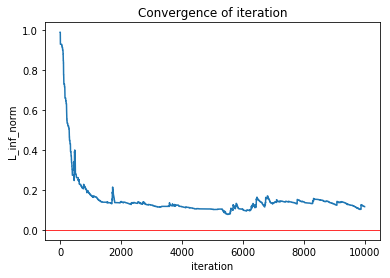

--------------------------------
0.11 0.64
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86049181  0.9150464   0.98358421  0.          0.80449311  0.90887215
  0.          0.75535762  0.71541559  0.79543027  0.72543193]
	 plot convengence of value function: 


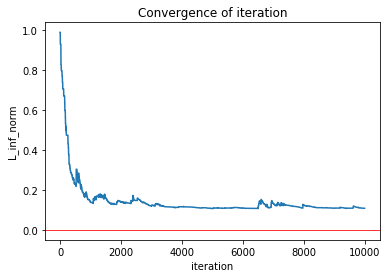

--------------------------------
0.11 0.65
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86095564  0.9186671   0.98832066  0.          0.80128578  0.90925018
  0.          0.74800675  0.72018859  0.78878735  0.71373302]
	 plot convengence of value function: 


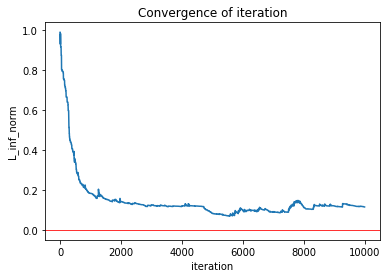

--------------------------------
0.11 0.66
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85692403  0.91309487  0.98702584  0.          0.79778435  0.91339851
  0.          0.75142482  0.73889203  0.79053211  0.72682286]
	 plot convengence of value function: 


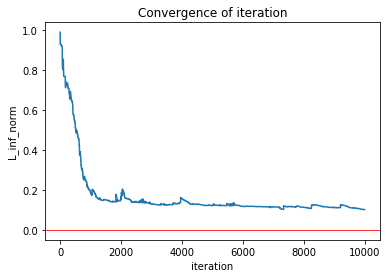

--------------------------------
0.11 0.67
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85473059  0.91349736  0.98644208  0.          0.79579059  0.90949672
  0.          0.74515428  0.73907175  0.80497129  0.71527911]
	 plot convengence of value function: 


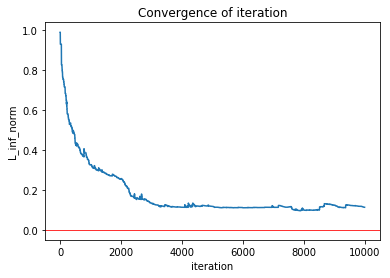

--------------------------------
0.11 0.68
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85905767  0.91905481  0.9855611   0.          0.80426244  0.90242234
  0.          0.75369333  0.73567696  0.7851573   0.72391804]
	 plot convengence of value function: 


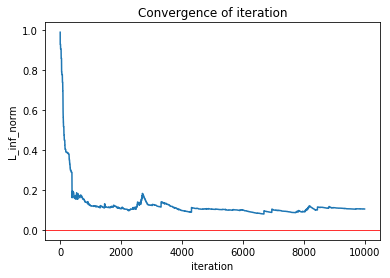

--------------------------------
0.11 0.69
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86044309  0.91803304  0.9854666   0.          0.80354584  0.9062705   0.
  0.75289921  0.73256625  0.78763767  0.72153153]
	 plot convengence of value function: 


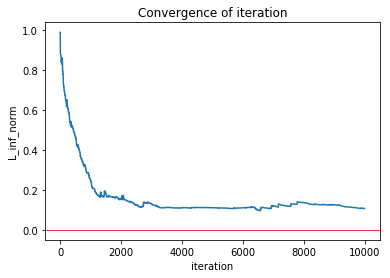

--------------------------------
0.11 0.7
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86029059  0.9161123   0.98477334  0.          0.80272371  0.9123921   0.
  0.75027566  0.75252267  0.80248374  0.74917647]
	 plot convengence of value function: 


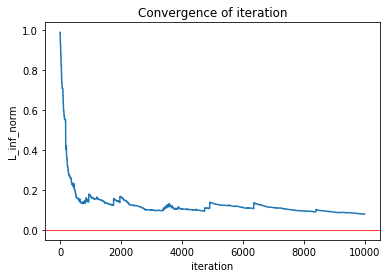

--------------------------------
0.11 0.71
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86103843  0.91634989  0.98741568  0.          0.80397966  0.91092472
  0.          0.75494858  0.71325367  0.74731827  0.71337649]
	 plot convengence of value function: 


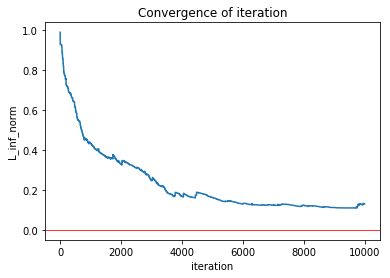

--------------------------------
0.11 0.72
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85859646  0.91518523  0.98584598  0.          0.80143849  0.90842889
  0.          0.75184715  0.74103969  0.78821213  0.73247768]
	 plot convengence of value function: 


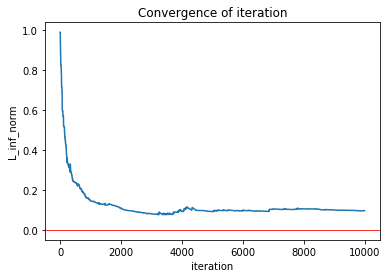

--------------------------------
0.11 0.73
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85813141  0.91489989  0.98473197  0.          0.8040269   0.90678998
  0.          0.75583293  0.73898737  0.79233095  0.72103538]
	 plot convengence of value function: 


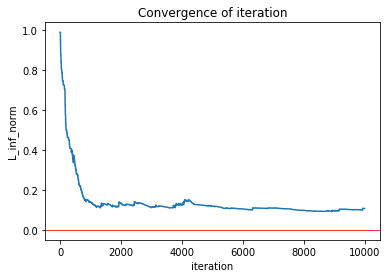

--------------------------------
0.11 0.74
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85911361  0.91505243  0.98771141  0.          0.80055613  0.91137894
  0.          0.75169507  0.7455625   0.79662211  0.74833503]
	 plot convengence of value function: 


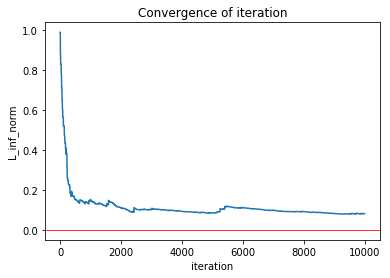

--------------------------------
0.11 0.75
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86005235  0.91588758  0.98450902  0.          0.79916487  0.90490683
  0.          0.74861384  0.72811807  0.76809174  0.71924167]
	 plot convengence of value function: 


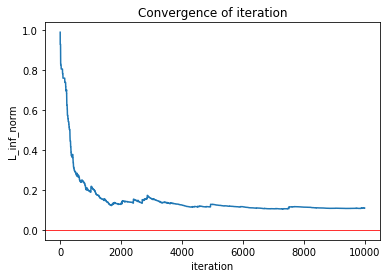

--------------------------------
0.11 0.76
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86084519  0.91784788  0.98710247  0.          0.80482203  0.9094148   0.
  0.7546647   0.71411089  0.79033535  0.71610175]
	 plot convengence of value function: 


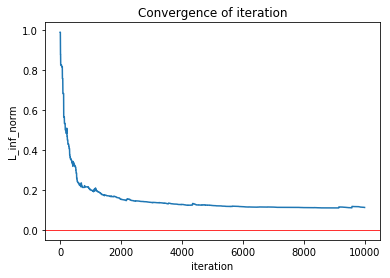

--------------------------------
0.11 0.77
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85916979  0.91764902  0.98757724  0.          0.80012867  0.90866939
  0.          0.75115638  0.74519927  0.80104522  0.74590039]
	 plot convengence of value function: 


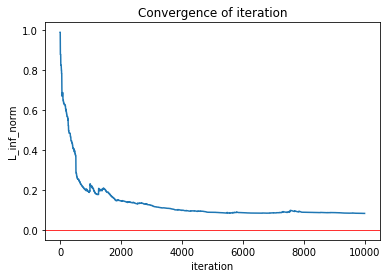

--------------------------------
0.11 0.78
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85851612  0.91527059  0.98734218  0.          0.80123846  0.90901965
  0.          0.74971412  0.70360437  0.76128281  0.72043115]
	 plot convengence of value function: 


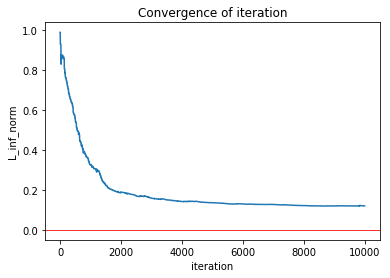

--------------------------------
0.11 0.79
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86077392  0.91626059  0.98662705  0.          0.79910375  0.90977534
  0.          0.75000229  0.72210996  0.78347854  0.70265741]
	 plot convengence of value function: 


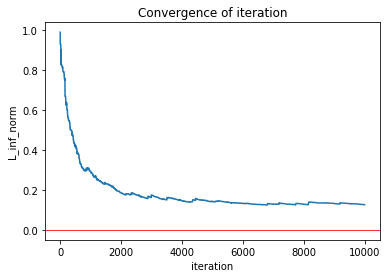

--------------------------------
0.11 0.8
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85730538  0.91271054  0.98644939  0.          0.79650097  0.90386216
  0.          0.74376024  0.72127009  0.78306659  0.70588881]
	 plot convengence of value function: 


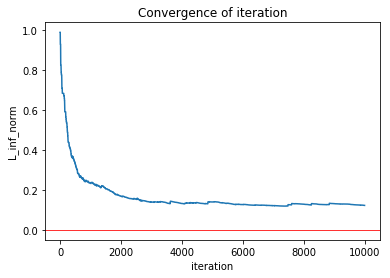

--------------------------------
0.11 0.81
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85867678  0.91461821  0.98534475  0.          0.80062581  0.90756471
  0.          0.74871818  0.73470178  0.78554333  0.72781473]
	 plot convengence of value function: 


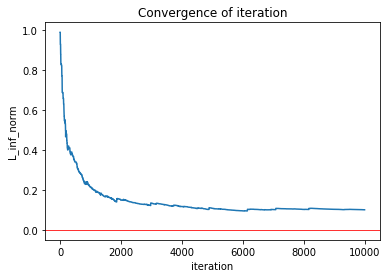

--------------------------------
0.11 0.82
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85989441  0.91661455  0.98645025  0.          0.79986046  0.9090049   0.
  0.74546035  0.69690217  0.79698588  0.70443989]
	 plot convengence of value function: 


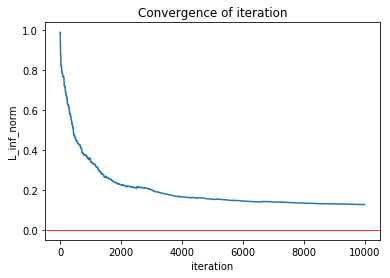

--------------------------------
0.11 0.83
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86035163  0.91647778  0.98640709  0.          0.79924437  0.90810177
  0.          0.74619863  0.70366363  0.79629088  0.72253556]
	 plot convengence of value function: 


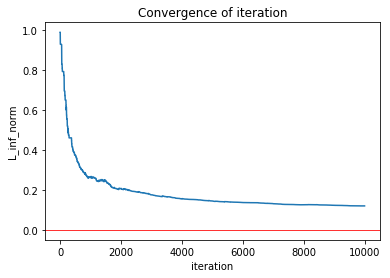

--------------------------------
0.11 0.84
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85783491  0.9137638   0.98579732  0.          0.79803887  0.90497415
  0.          0.74195929  0.69252212  0.77940205  0.71555144]
	 plot convengence of value function: 


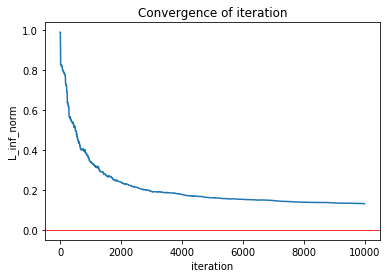

--------------------------------
0.11 0.85
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85678703  0.91292891  0.98596988  0.          0.79580364  0.90987083
  0.          0.73868072  0.72556045  0.78905264  0.71792288]
	 plot convengence of value function: 


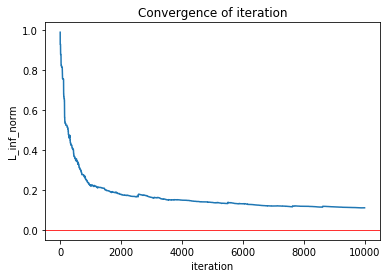

--------------------------------
0.11 0.86
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85749269  0.91633682  0.98676421  0.          0.79603279  0.90822565
  0.          0.74108349  0.73430182  0.80245729  0.73428912]
	 plot convengence of value function: 


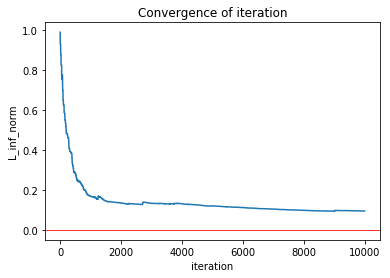

--------------------------------
0.11 0.87
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85590796  0.91456233  0.98749405  0.          0.79500324  0.90899831
  0.          0.74080396  0.71944554  0.77865781  0.7147131 ]
	 plot convengence of value function: 


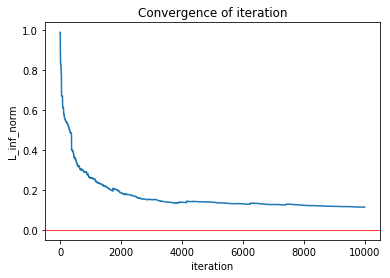

--------------------------------
0.11 0.88
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85690647  0.91441225  0.98636239  0.          0.79164064  0.90885451
  0.          0.72959987  0.66588381  0.79061993  0.69153847]
	 plot convengence of value function: 


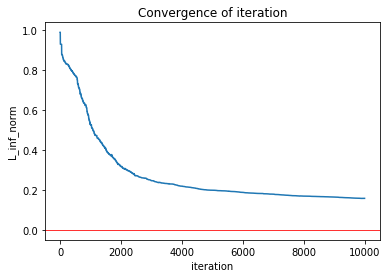

--------------------------------
0.11 0.89
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85601668  0.91537287  0.9860384   0.          0.79237972  0.90638145
  0.          0.73549145  0.72086385  0.78227074  0.71279819]
	 plot convengence of value function: 


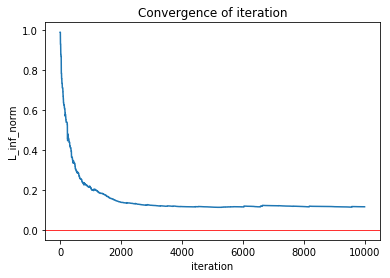

--------------------------------
0.11 0.9
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.8572809   0.91292871  0.98534897  0.          0.79499426  0.90468573
  0.          0.73272882  0.66551724  0.79696361  0.69714961]
	 plot convengence of value function: 


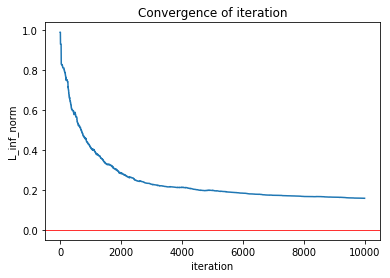

--------------------------------
0.11 0.91
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85004612  0.90914983  0.98493397  0.          0.76422159  0.90517545
  0.          0.64644122  0.70239786  0.778443    0.70752864]
	 plot convengence of value function: 


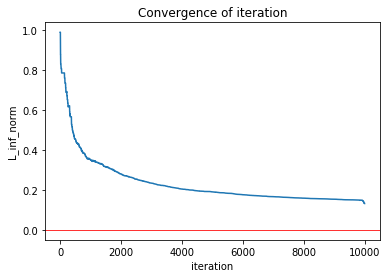

--------------------------------
0.11 0.92
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85385024  0.91327841  0.98581945  0.          0.78111937  0.89963135
  0.          0.70567014  0.6237023   0.76365273  0.6337793 ]
	 plot convengence of value function: 


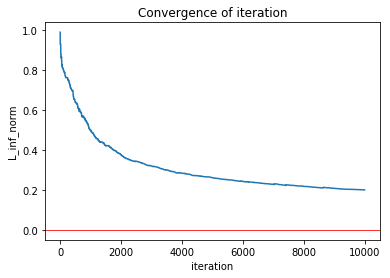

--------------------------------
0.11 0.93
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85373856  0.91302742  0.98592976  0.          0.78139288  0.90333933
  0.          0.70851244  0.63326091  0.78109132  0.65700463]
	 plot convengence of value function: 


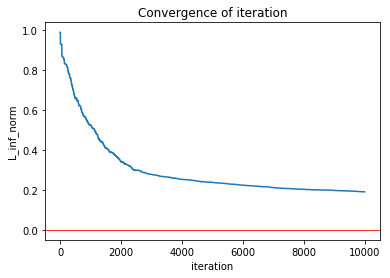

--------------------------------
0.11 0.94
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85137492  0.91352318  0.98635771  0.          0.76926941  0.90058064
  0.          0.67763129  0.6832445   0.77367678  0.65580371]
	 plot convengence of value function: 


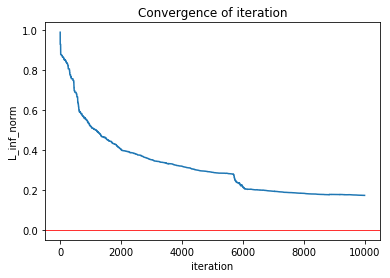

--------------------------------
0.11 0.95
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.84646032  0.9104635   0.9845007   0.          0.76877767  0.89774596
  0.          0.68542919  0.57932565  0.76623001  0.60004463]
	 plot convengence of value function: 


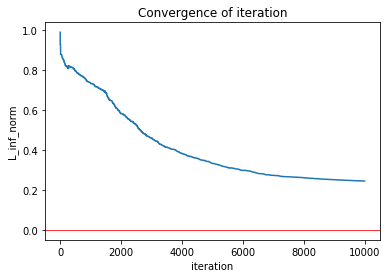

--------------------------------
0.11 0.96
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.84526329  0.91077469  0.98543929  0.          0.75963976  0.90196294
  0.          0.66507748  0.55961888  0.78122834  0.65897262]
	 plot convengence of value function: 


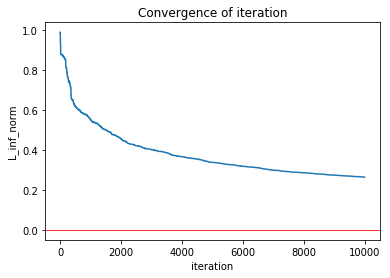

--------------------------------
0.11 0.97
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85067678  0.91065529  0.98586492  0.          0.77068124  0.90366507
  0.          0.69577602  0.66976267  0.76588296  0.65806281]
	 plot convengence of value function: 


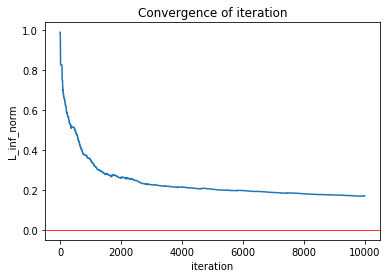

--------------------------------
0.11 0.98
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.82179193  0.90141469  0.98372854  0.          0.71972703  0.89188632
  0.          0.60973686  0.49896977  0.7520246   0.58952463]
	 plot convengence of value function: 


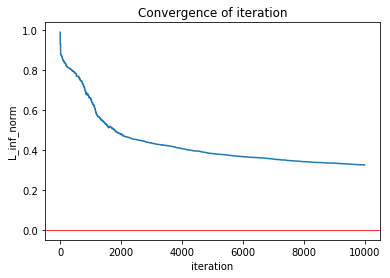

--------------------------------
0.11 0.99
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.84401277  0.90739501  0.9859288   0.          0.76825698  0.89504459
  0.          0.69078822  0.59766881  0.76139831  0.64732787]
	 plot convengence of value function: 


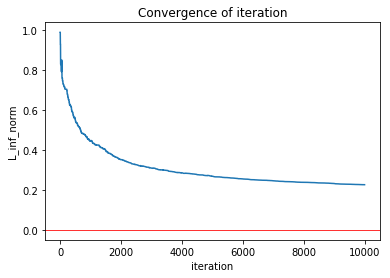

--------------------------------
0.12 0.51
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85788108  0.90736403  0.97945864  0.          0.7985675   0.90051706
  0.          0.74982973  0.70542497  0.76242519  0.71065669]
	 plot convengence of value function: 


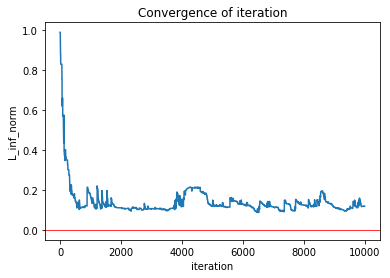

--------------------------------
0.12 0.52
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85389279  0.91294948  0.99248278  0.          0.7971612   0.91010692
  0.          0.74897754  0.72042731  0.75305663  0.7174133 ]
	 plot convengence of value function: 


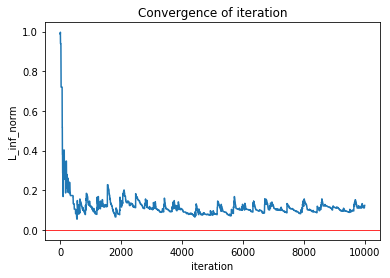

--------------------------------
0.12 0.53
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.8605998   0.91902371  0.98629848  0.          0.79928622  0.92167364
  0.          0.75064474  0.75466354  0.78838203  0.72416826]
	 plot convengence of value function: 


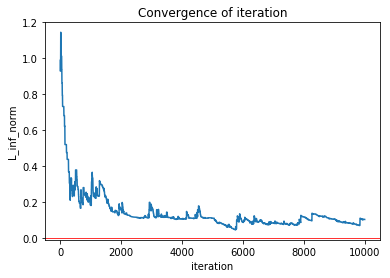

--------------------------------
0.12 0.54
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.8583747   0.91524498  0.9854626   0.          0.80067238  0.90972552
  0.          0.75082003  0.72681546  0.76014989  0.71608135]
	 plot convengence of value function: 


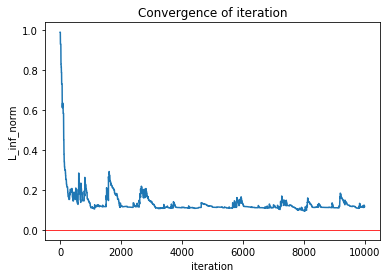

--------------------------------
0.12 0.55
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85457254  0.91668448  0.98735772  0.          0.79800892  0.90976423
  0.          0.75102893  0.75158488  0.79511443  0.76179717]
	 plot convengence of value function: 


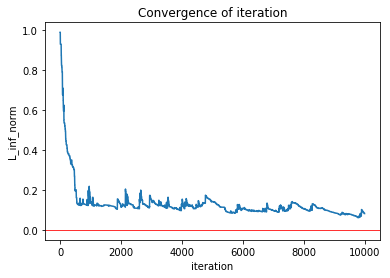

--------------------------------
0.12 0.56
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85874286  0.91917735  0.98497219  0.          0.79781306  0.90212237
  0.          0.74899738  0.73035208  0.74366246  0.71569629]
	 plot convengence of value function: 


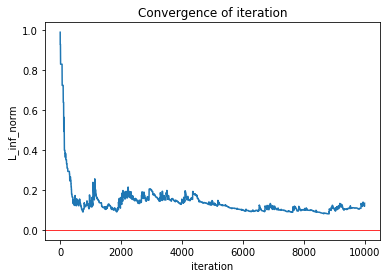

--------------------------------
0.12 0.57
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85924624  0.91399052  0.98580629  0.          0.80385459  0.91096537
  0.          0.75076716  0.71523309  0.76395695  0.72095034]
	 plot convengence of value function: 


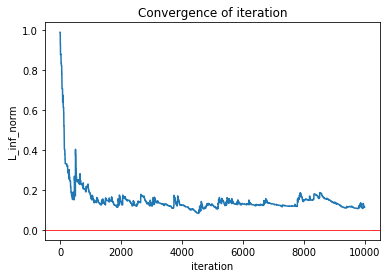

--------------------------------
0.12 0.58
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.84751222  0.90687594  0.98447635  0.          0.79549583  0.89845242
  0.          0.75128854  0.70927881  0.74390773  0.68903217]
	 plot convengence of value function: 


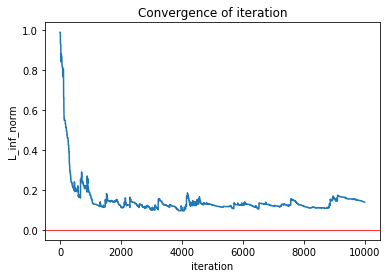

--------------------------------
0.12 0.59
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85552889  0.91246177  0.98627696  0.          0.79904655  0.90469793
  0.          0.74738098  0.70843727  0.7843484   0.72077736]
	 plot convengence of value function: 


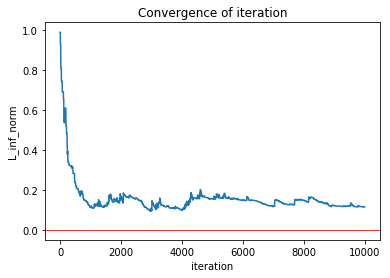

--------------------------------
0.12 0.6
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86086713  0.91440566  0.99078263  0.          0.80140371  0.90403848
  0.          0.75160086  0.72749158  0.80147271  0.71837635]
	 plot convengence of value function: 


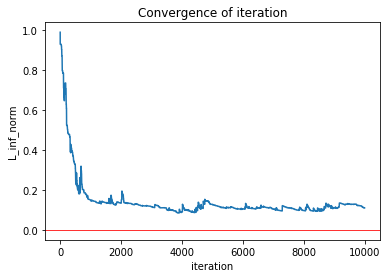

--------------------------------
0.12 0.61
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.8578946   0.91417425  0.98841485  0.          0.80613373  0.89698967
  0.          0.75536478  0.71768604  0.76186789  0.71731111]
	 plot convengence of value function: 


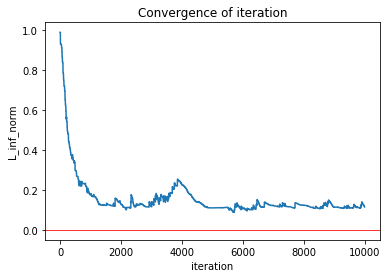

--------------------------------
0.12 0.62
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86044727  0.91480082  0.98817317  0.          0.79863619  0.90755042
  0.          0.75129844  0.73747632  0.76694019  0.7122079 ]
	 plot convengence of value function: 


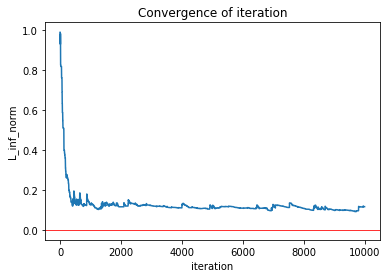

--------------------------------
0.12 0.63
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85478443  0.9114956   0.98386654  0.          0.79909877  0.9010184   0.
  0.75114693  0.72841653  0.77257355  0.73335214]
	 plot convengence of value function: 


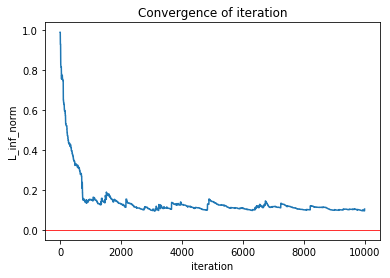

--------------------------------
0.12 0.64
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85649119  0.91803091  0.98788726  0.          0.79771845  0.91682942
  0.          0.74985508  0.71505498  0.78429336  0.73631747]
	 plot convengence of value function: 


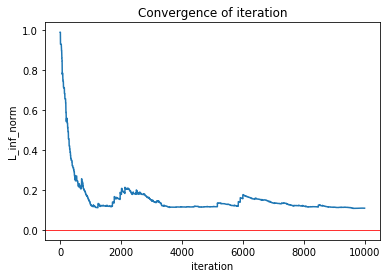

--------------------------------
0.12 0.65
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85733355  0.91161077  0.98484338  0.          0.79936701  0.8981744   0.
  0.74990599  0.72105296  0.74236377  0.70378968]
	 plot convengence of value function: 


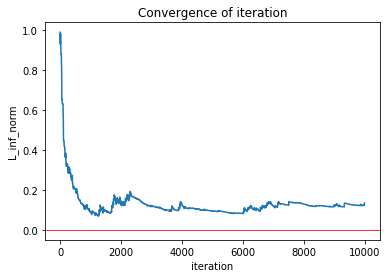

--------------------------------
0.12 0.66
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86035231  0.91512518  0.98404915  0.          0.80194633  0.91312217
  0.          0.7501699   0.73883424  0.80486566  0.73233634]
	 plot convengence of value function: 


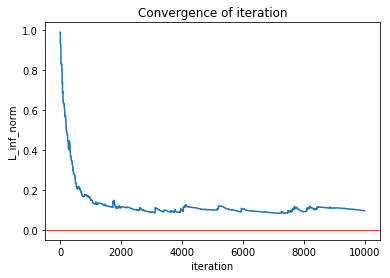

--------------------------------
0.12 0.67
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86053037  0.91646394  0.98747404  0.          0.79638799  0.9041565   0.
  0.74837146  0.74654199  0.79513726  0.72186935]
	 plot convengence of value function: 


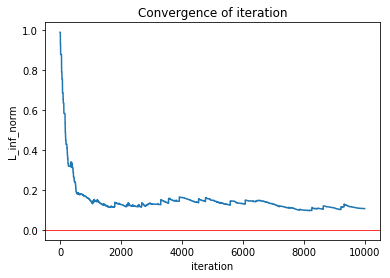

--------------------------------
0.12 0.68
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85867684  0.91074595  0.98672566  0.          0.79954178  0.91062654
  0.          0.75233745  0.74936687  0.80645066  0.74896501]
	 plot convengence of value function: 


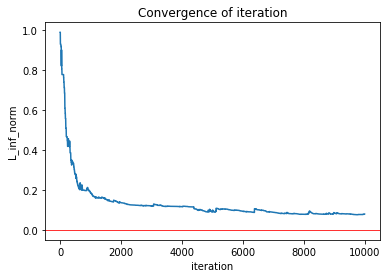

--------------------------------
0.12 0.69
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85782276  0.9172138   0.98657243  0.          0.80247809  0.90512511
  0.          0.750294    0.70598909  0.76852291  0.67018849]
	 plot convengence of value function: 


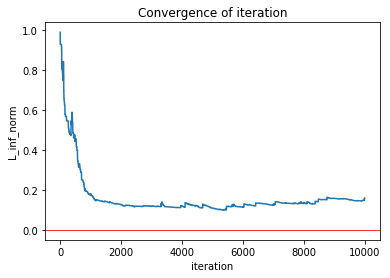

--------------------------------
0.12 0.7
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.8599009   0.91641829  0.98839354  0.          0.79753801  0.91035438
  0.          0.74918852  0.7094093   0.80295671  0.71571599]
	 plot convengence of value function: 


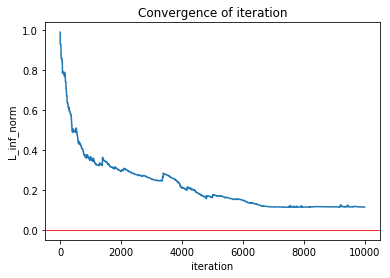

--------------------------------
0.12 0.71
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85711766  0.9142675   0.98504636  0.          0.8003388   0.91151912
  0.          0.75270554  0.74379862  0.80546046  0.73080902]
	 plot convengence of value function: 


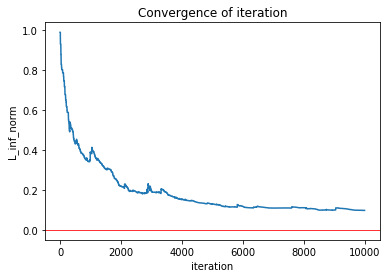

--------------------------------
0.12 0.72
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85718036  0.91617449  0.98588977  0.          0.79580997  0.9063754   0.
  0.75155874  0.71945312  0.76275692  0.70871122]
	 plot convengence of value function: 


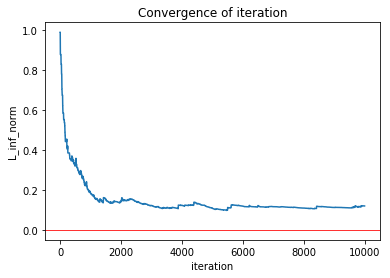

--------------------------------
0.12 0.73
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85490781  0.9135333   0.98843259  0.          0.79877798  0.91390135
  0.          0.75203894  0.71149981  0.78572361  0.7310451 ]
	 plot convengence of value function: 


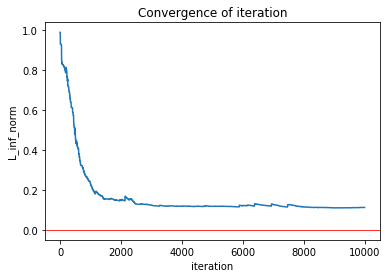

--------------------------------
0.12 0.74
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85908251  0.91473418  0.9870561   0.          0.79991119  0.90405933
  0.          0.75148445  0.71052945  0.78655424  0.71143591]
	 plot convengence of value function: 


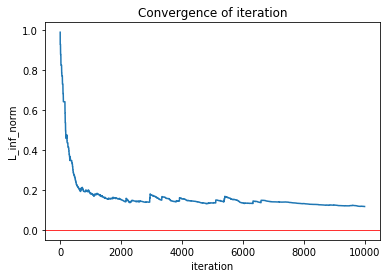

--------------------------------
0.12 0.75
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86076677  0.91698953  0.98637019  0.          0.7999477   0.90712957
  0.          0.75086816  0.7096755   0.77762737  0.71382392]
	 plot convengence of value function: 


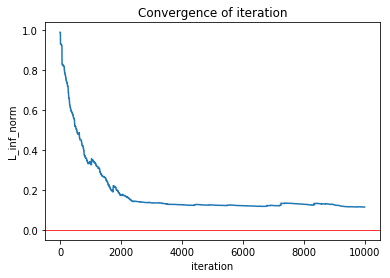

--------------------------------
0.12 0.76
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.8571312   0.9176441   0.98692454  0.          0.80124749  0.90848389
  0.          0.74865273  0.72883007  0.79137401  0.71930887]
	 plot convengence of value function: 


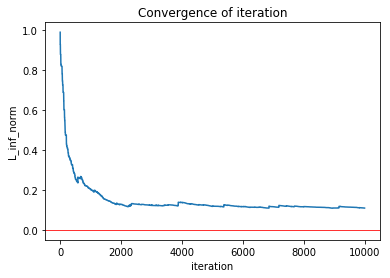

--------------------------------
0.12 0.77
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85839296  0.91408292  0.98544895  0.          0.7981649   0.90705929
  0.          0.74844295  0.70926427  0.77140337  0.71882693]
	 plot convengence of value function: 


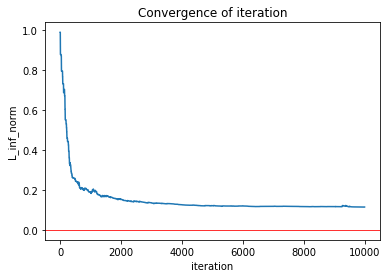

--------------------------------
0.12 0.78
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85711753  0.91514495  0.98532891  0.          0.80038301  0.90145434
  0.          0.74705922  0.70307861  0.7883695   0.71687941]
	 plot convengence of value function: 


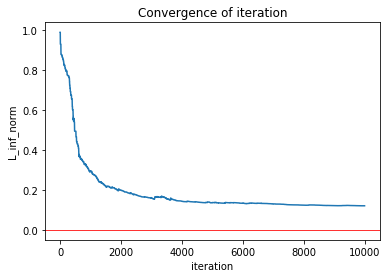

--------------------------------
0.12 0.79
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85793191  0.91452171  0.98775093  0.          0.80057082  0.90879256
  0.          0.74909425  0.70741219  0.7689299   0.69866035]
	 plot convengence of value function: 


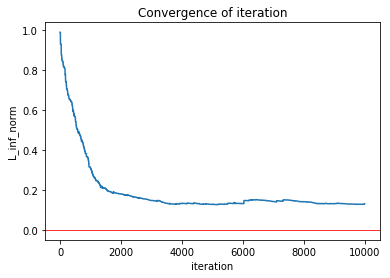

--------------------------------
0.12 0.8
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86048381  0.91673964  0.98657123  0.          0.79825348  0.90791901
  0.          0.74397211  0.73411069  0.80171158  0.72193745]
	 plot convengence of value function: 


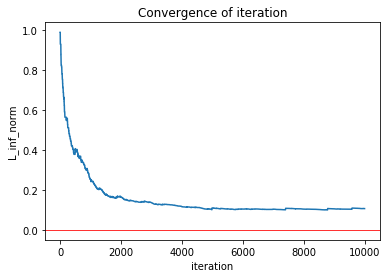

--------------------------------
0.12 0.81
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85724529  0.91493571  0.9871361   0.          0.79825041  0.90522143
  0.          0.74866537  0.73345252  0.80189722  0.72790646]
	 plot convengence of value function: 


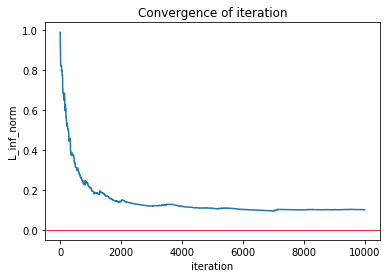

--------------------------------
0.12 0.82
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85736265  0.91466109  0.98618436  0.          0.79797318  0.904241    0.
  0.74578387  0.72139837  0.77444865  0.70066219]
	 plot convengence of value function: 


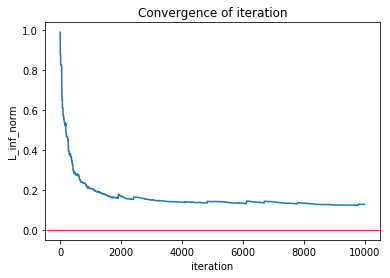

--------------------------------
0.12 0.83
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85789475  0.91503771  0.98675676  0.          0.79488442  0.90087104
  0.          0.74049025  0.68958672  0.76529391  0.69610628]
	 plot convengence of value function: 


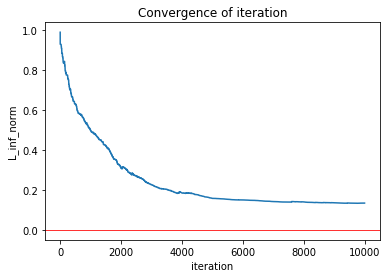

--------------------------------
0.12 0.84
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85615561  0.91326671  0.98680749  0.          0.79722614  0.90509299
  0.          0.74524496  0.69531697  0.76704105  0.69634966]
	 plot convengence of value function: 


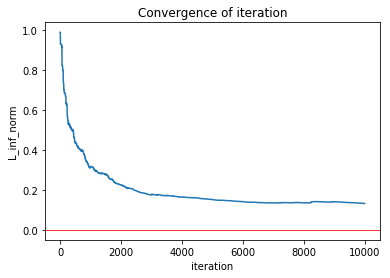

--------------------------------
0.12 0.85
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.8551749   0.91219789  0.98653945  0.          0.79079782  0.90419819
  0.          0.73193162  0.6819586   0.77637118  0.70938579]
	 plot convengence of value function: 


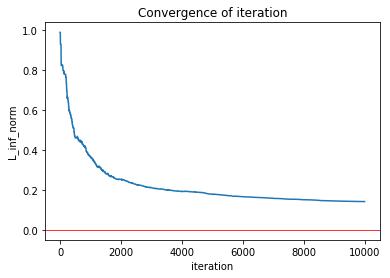

--------------------------------
0.12 0.86
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85431878  0.9119795   0.98692372  0.          0.78939851  0.90396813
  0.          0.72928883  0.67239534  0.77547344  0.69636582]
	 plot convengence of value function: 


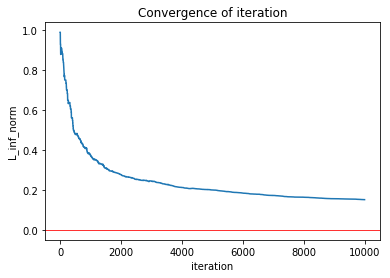

--------------------------------
0.12 0.87
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85172205  0.91106907  0.98623571  0.          0.78445276  0.90100798
  0.          0.71932186  0.71497288  0.77464875  0.70800844]
	 plot convengence of value function: 


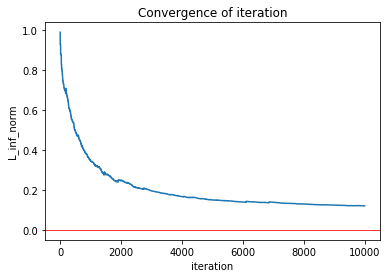

--------------------------------
0.12 0.88
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85736964  0.91359313  0.98633474  0.          0.79570607  0.90393387
  0.          0.74225315  0.68955979  0.78028296  0.68967629]
	 plot convengence of value function: 


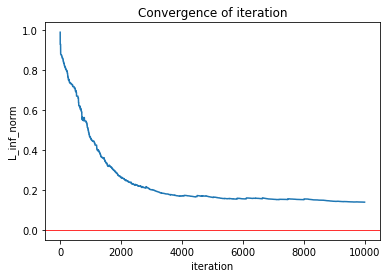

--------------------------------
0.12 0.89
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85419423  0.91378235  0.98690918  0.          0.78671175  0.90168959
  0.          0.71897993  0.65406424  0.77210685  0.6627591 ]
	 plot convengence of value function: 


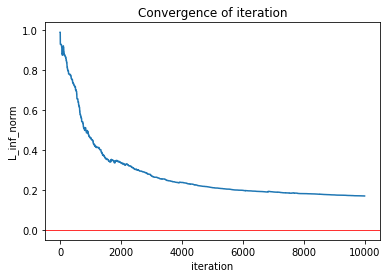

--------------------------------
0.12 0.9
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85569373  0.91427927  0.9855472   0.          0.78713671  0.90457901
  0.          0.7234963   0.70872935  0.77957662  0.68172477]
	 plot convengence of value function: 


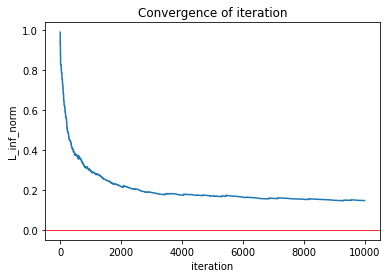

--------------------------------
0.12 0.91
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85168935  0.91175169  0.98496555  0.          0.7815987   0.90303236
  0.          0.71102839  0.70713408  0.78219192  0.69760935]
	 plot convengence of value function: 


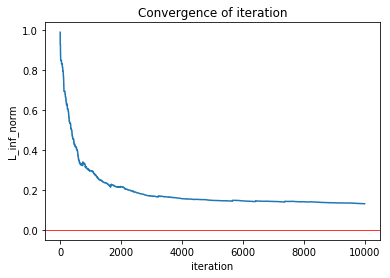

--------------------------------
0.12 0.92
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.8489702   0.9103698   0.98610557  0.          0.77819878  0.90061803
  0.          0.70918402  0.6366284   0.77504511  0.67281749]
	 plot convengence of value function: 


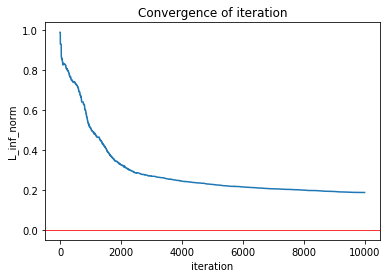

--------------------------------
0.12 0.93
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85731445  0.9146437   0.98608989  0.          0.79470756  0.9052114   0.
  0.7376444   0.70274535  0.77807438  0.68961865]
	 plot convengence of value function: 


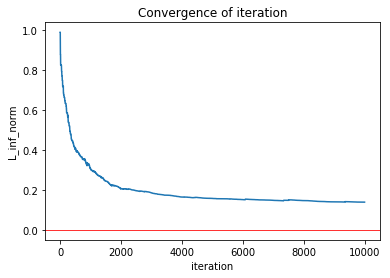

--------------------------------
0.12 0.94
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.84216548  0.90438897  0.98478359  0.          0.77427939  0.89519141
  0.          0.71128784  0.63215638  0.74956515  0.57055661]
	 plot convengence of value function: 


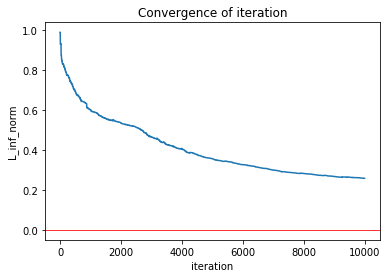

--------------------------------
0.12 0.95
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85186891  0.91139976  0.98545934  0.          0.78172174  0.89791153
  0.          0.71602643  0.63859443  0.76484737  0.63524906]
	 plot convengence of value function: 


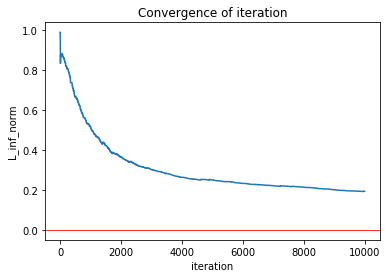

--------------------------------
0.12 0.96
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.84210042  0.90566629  0.98432285  0.          0.75839717  0.89349783
  0.          0.65442181  0.51792479  0.74590093  0.56191931]
	 plot convengence of value function: 


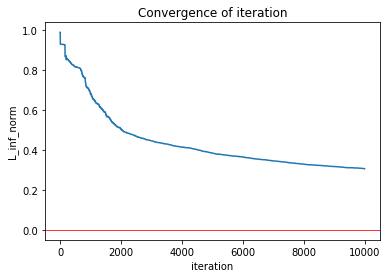

--------------------------------
0.12 0.97
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.84372457  0.90649127  0.98468927  0.          0.75883631  0.89759884
  0.          0.66938906  0.61042862  0.75698509  0.63517156]
	 plot convengence of value function: 


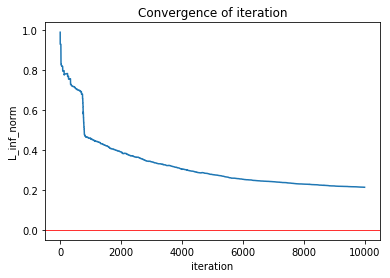

--------------------------------
0.12 0.98
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.83916231  0.90709902  0.98496596  0.          0.75416186  0.89601194
  0.          0.67298993  0.64794456  0.75392716  0.63766262]
	 plot convengence of value function: 


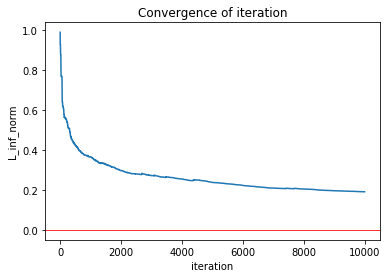

--------------------------------
0.12 0.99
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.84036702  0.90673886  0.98517558  0.          0.7447235   0.89821842
  0.          0.64106654  0.53931421  0.7717502   0.62943685]
	 plot convengence of value function: 


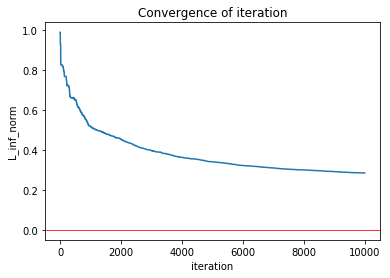

--------------------------------
0.13 0.51
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85845638  0.91064556  0.98941777  0.          0.80262164  0.90827411
  0.          0.74781744  0.7212925   0.7668558   0.7270068 ]
	 plot convengence of value function: 


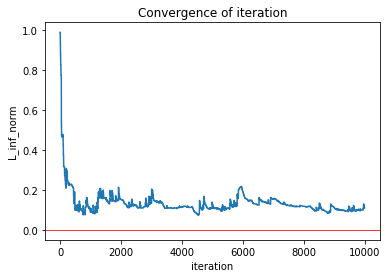

--------------------------------
0.13 0.52
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86166654  0.91978095  0.986399    0.          0.79804433  0.90425181
  0.          0.74467724  0.74116244  0.82234649  0.74467152]
	 plot convengence of value function: 


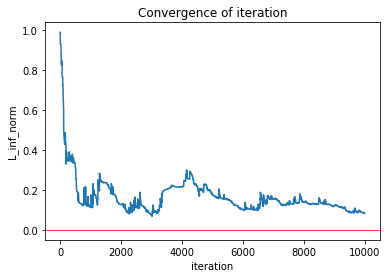

--------------------------------
0.13 0.53
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85901151  0.90991951  0.98207584  0.          0.80096495  0.90858777
  0.          0.74923678  0.70717973  0.77221212  0.71197501]
	 plot convengence of value function: 


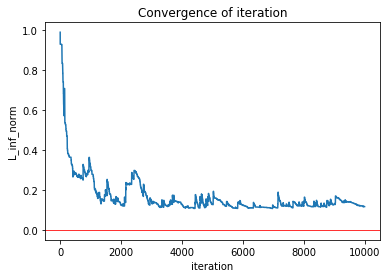

--------------------------------
0.13 0.54
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85914348  0.91507369  0.99050117  0.          0.794219    0.90782246
  0.          0.74535917  0.71270731  0.78748571  0.68016886]
	 plot convengence of value function: 


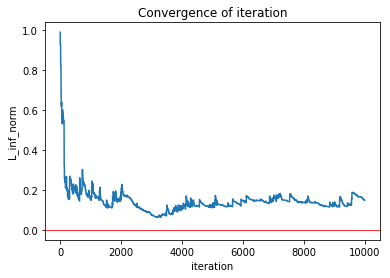

--------------------------------
0.13 0.55
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85419014  0.91066732  0.98834237  0.          0.79900924  0.90674618
  0.          0.75373133  0.71337718  0.78895298  0.71233872]
	 plot convengence of value function: 


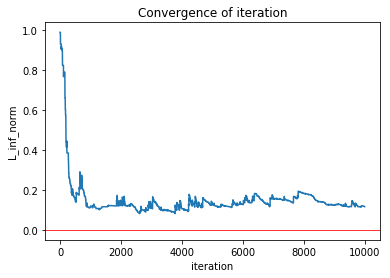

--------------------------------
0.13 0.56
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85597758  0.91521097  0.98670303  0.          0.80178437  0.90742497
  0.          0.75023092  0.71708036  0.78211323  0.70575109]
	 plot convengence of value function: 


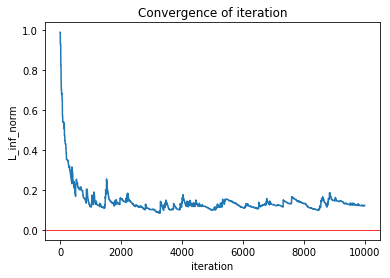

--------------------------------
0.13 0.57
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86159023  0.91618582  0.9849172   0.          0.80539818  0.89866166
  0.          0.7572232   0.72422225  0.77736821  0.72534661]
	 plot convengence of value function: 


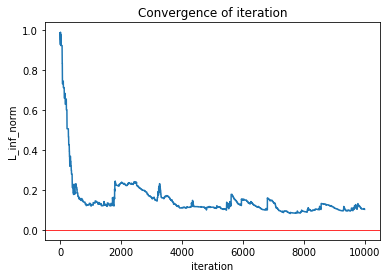

--------------------------------
0.13 0.58
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85190083  0.90899742  0.98574813  0.          0.79618118  0.89708385
  0.          0.7489498   0.70603835  0.76462729  0.70197356]
	 plot convengence of value function: 


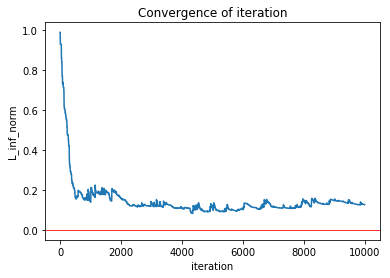

--------------------------------
0.13 0.59
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85257981  0.90303032  0.98824641  0.          0.79268127  0.90107744
  0.          0.73913402  0.73865647  0.77596888  0.72677669]
	 plot convengence of value function: 


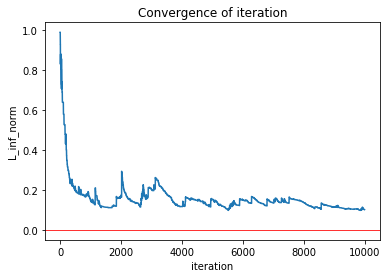

--------------------------------
0.13 0.6
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85989791  0.91825406  0.98842428  0.          0.80470236  0.90317291
  0.          0.74580273  0.72536124  0.77570997  0.71927946]
	 plot convengence of value function: 


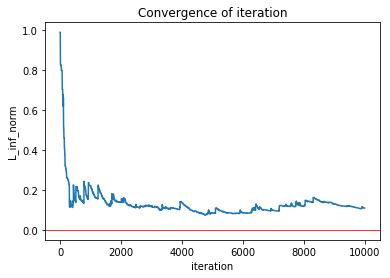

--------------------------------
0.13 0.61
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85962585  0.91299109  0.9838701   0.          0.80023714  0.90456965
  0.          0.74883113  0.70904547  0.75465002  0.70722036]
	 plot convengence of value function: 


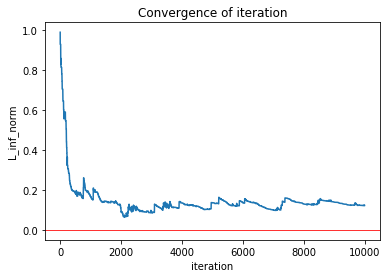

--------------------------------
0.13 0.62
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.8538932   0.91078394  0.98527801  0.          0.79563928  0.90143592
  0.          0.74666117  0.72777354  0.74602468  0.72326831]
	 plot convengence of value function: 


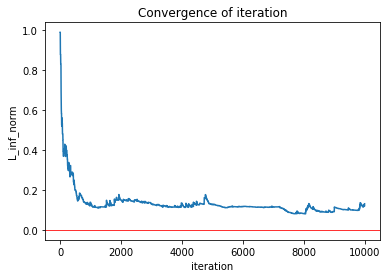

--------------------------------
0.13 0.63
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85255634  0.91256623  0.98986591  0.          0.79363333  0.90651838
  0.          0.74290602  0.71775925  0.78314563  0.71622893]
	 plot convengence of value function: 


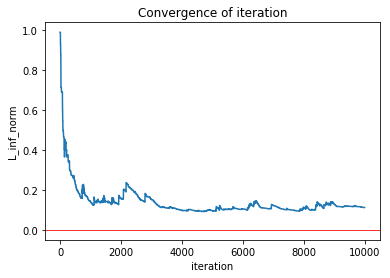

--------------------------------
0.13 0.64
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85267468  0.91084292  0.98526368  0.          0.79419774  0.90402054
  0.          0.74499479  0.71003117  0.79904672  0.72818836]
	 plot convengence of value function: 


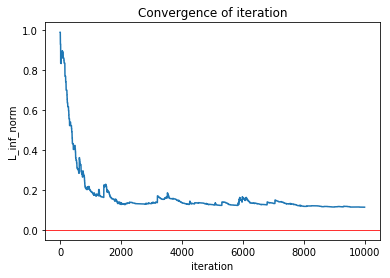

--------------------------------
0.13 0.65
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.86074317  0.91563744  0.98885899  0.          0.8013991   0.90561921
  0.          0.7499858   0.7077198   0.72688289  0.69616683]
	 plot convengence of value function: 


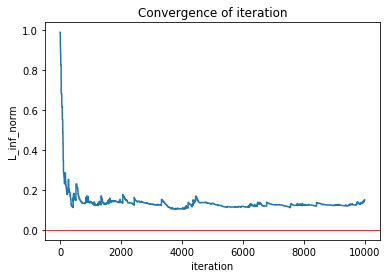

--------------------------------
0.13 0.66
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85696406  0.9096179   0.98594425  0.          0.79766116  0.90128522
  0.          0.74791799  0.71929954  0.79124602  0.67679012]
	 plot convengence of value function: 


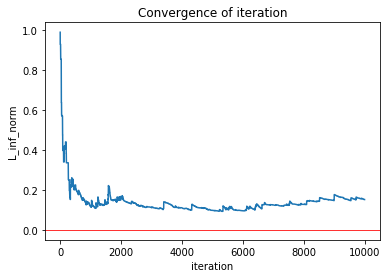

--------------------------------
0.13 0.67
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85231739  0.90957567  0.98487018  0.          0.79740506  0.90815711
  0.          0.74505327  0.70274823  0.76181323  0.7041129 ]
	 plot convengence of value function: 


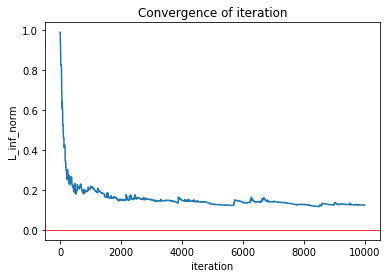

--------------------------------
0.13 0.68
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85476741  0.90998916  0.98675554  0.          0.79546597  0.90670546
  0.          0.74845964  0.70377919  0.77805448  0.7184974 ]
	 plot convengence of value function: 


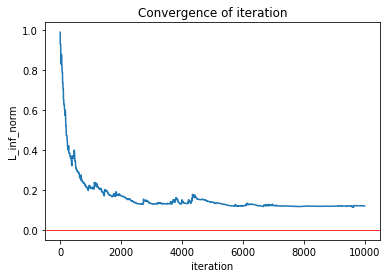

--------------------------------
0.13 0.69
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85621873  0.91329057  0.98682082  0.          0.79889079  0.91012031
  0.          0.74760416  0.73923359  0.81154121  0.73671019]
	 plot convengence of value function: 


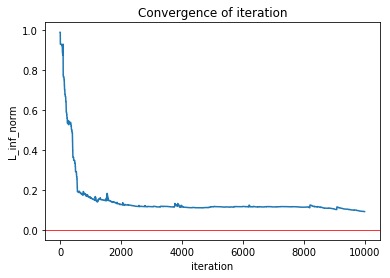

--------------------------------
0.13 0.7
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.8554394   0.91304433  0.98749535  0.          0.79584992  0.90466879
  0.          0.74526461  0.70150279  0.7708616   0.70733709]
	 plot convengence of value function: 


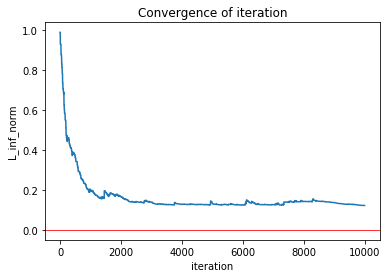

--------------------------------
0.13 0.71
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85612817  0.9126133   0.98493933  0.          0.79546677  0.90040835
  0.          0.7462421   0.70318374  0.78013214  0.70342958]
	 plot convengence of value function: 


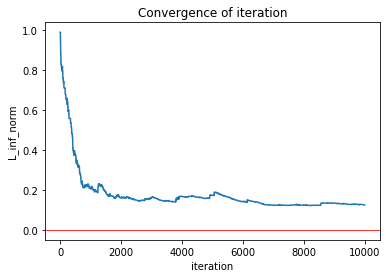

--------------------------------
0.13 0.72
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85312465  0.91253587  0.98561133  0.          0.79741056  0.90672796
  0.          0.74647047  0.72704696  0.79829034  0.7223606 ]
	 plot convengence of value function: 


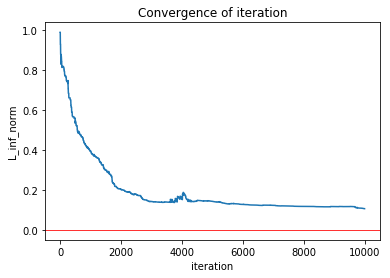

--------------------------------
0.13 0.73
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.8558014   0.91036049  0.98565671  0.          0.79646753  0.90171491
  0.          0.74658432  0.71428507  0.7571741   0.70370204]
	 plot convengence of value function: 


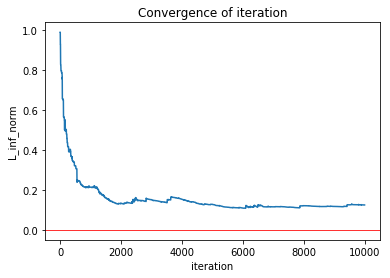

--------------------------------
0.13 0.74
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85726106  0.91587674  0.98605954  0.          0.79533151  0.90466464
  0.          0.74538875  0.70178702  0.76707373  0.71379926]
	 plot convengence of value function: 


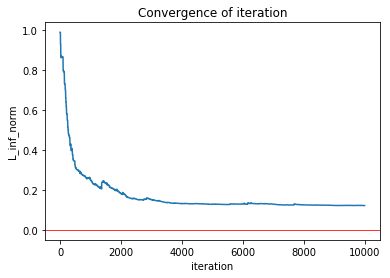

--------------------------------
0.13 0.75
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85745492  0.91332548  0.98428307  0.          0.79983644  0.90437969
  0.          0.75001811  0.70866323  0.7874118   0.72153097]
	 plot convengence of value function: 


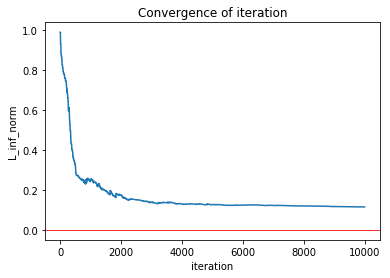

--------------------------------
0.13 0.76
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.8569527   0.9137695   0.98450941  0.          0.79667416  0.90193582
  0.          0.74636268  0.70384131  0.76265462  0.69381193]
	 plot convengence of value function: 


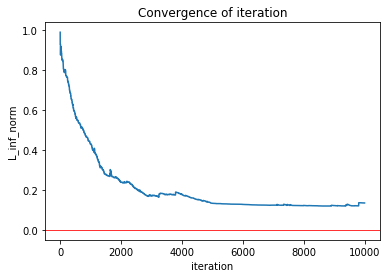

--------------------------------
0.13 0.77
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.86132107  0.91535158  0.98559612  0.          0.79778986  0.90950526
  0.          0.74542721  0.70256736  0.79587011  0.71030853]
	 plot convengence of value function: 


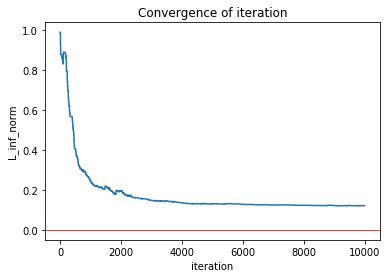

--------------------------------
0.13 0.78
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85586973  0.91201796  0.98495017  0.          0.79445373  0.90414198
  0.          0.74627449  0.69975814  0.77913905  0.70573211]
	 plot convengence of value function: 


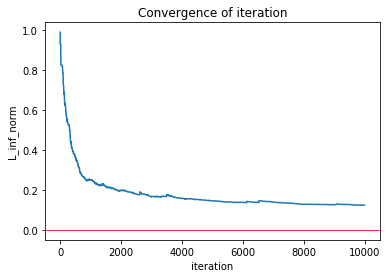

--------------------------------
0.13 0.79
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85387278  0.91002579  0.98498174  0.          0.79575043  0.90004547
  0.          0.74663584  0.71935291  0.7732684   0.71308902]
	 plot convengence of value function: 


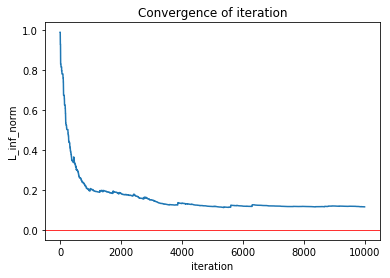

--------------------------------
0.13 0.8
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85351616  0.91456447  0.98657723  0.          0.79406571  0.90277649
  0.          0.74026569  0.72019938  0.77687742  0.7112731 ]
	 plot convengence of value function: 


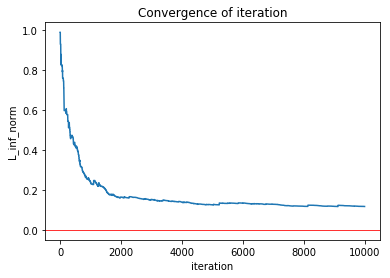

--------------------------------
0.13 0.81
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85564195  0.91478416  0.98683789  0.          0.79137601  0.90237537
  0.          0.73966277  0.71380231  0.77174192  0.70113566]
	 plot convengence of value function: 


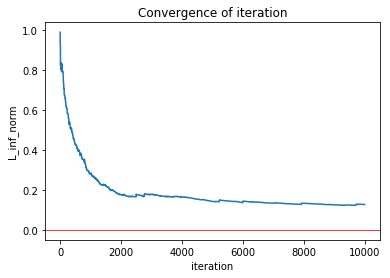

--------------------------------
0.13 0.82
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.8520366   0.91049016  0.98631094  0.          0.78862392  0.90567399
  0.          0.73590029  0.68618892  0.79283104  0.70964676]
	 plot convengence of value function: 


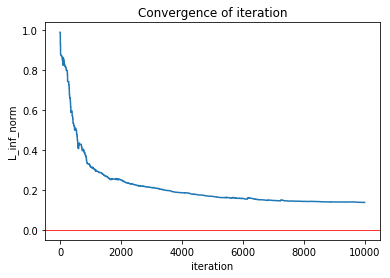

--------------------------------
0.13 0.83
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85457572  0.91187789  0.98577938  0.          0.79240793  0.90190236
  0.          0.74129392  0.7005012   0.75941679  0.69215874]
	 plot convengence of value function: 


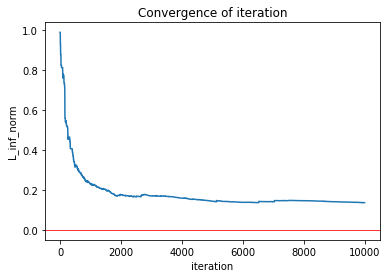

--------------------------------
0.13 0.84
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85471693  0.91290434  0.98730228  0.          0.79342958  0.89707094
  0.          0.73937384  0.68961624  0.75753907  0.66615437]
	 plot convengence of value function: 


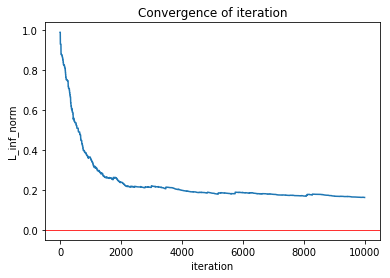

--------------------------------
0.13 0.85
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85092005  0.90882157  0.98571242  0.          0.78797297  0.89609394
  0.          0.73288459  0.67065274  0.74501546  0.58244465]
	 plot convengence of value function: 


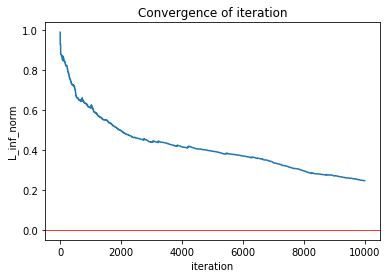

--------------------------------
0.13 0.86
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85272324  0.91080237  0.98483883  0.          0.78427891  0.90117156
  0.          0.71484152  0.69346341  0.76085924  0.68640143]
	 plot convengence of value function: 


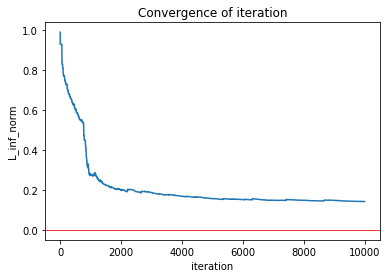

--------------------------------
0.13 0.87
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.854713    0.91171521  0.98467209  0.          0.79323255  0.90228546
  0.          0.73364018  0.69690296  0.76744137  0.67961398]
	 plot convengence of value function: 


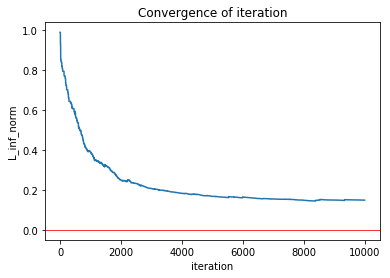

--------------------------------
0.13 0.88
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.84717174  0.90711438  0.98488426  0.          0.77796583  0.89589094
  0.          0.7163888   0.64499026  0.76546749  0.63796669]
	 plot convengence of value function: 


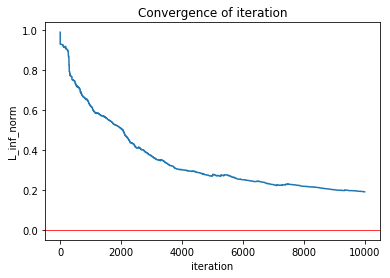

--------------------------------
0.13 0.89
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.84933693  0.9081232   0.98474305  0.          0.78080009  0.89489217
  0.          0.71928537  0.65034284  0.76325469  0.64548633]
	 plot convengence of value function: 


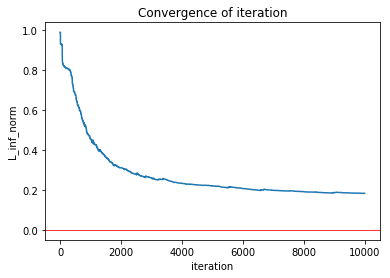

--------------------------------
0.13 0.9
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.84812235  0.91162005  0.98574229  0.          0.778432    0.90101394
  0.          0.71858797  0.65619274  0.76398149  0.64459784]
	 plot convengence of value function: 


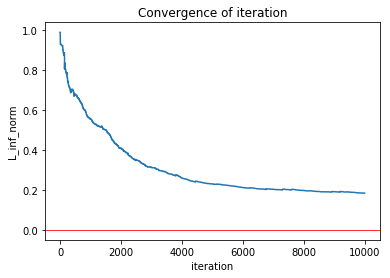

--------------------------------
0.13 0.91
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85095835  0.90898588  0.98504658  0.          0.78856487  0.90048454
  0.          0.72627571  0.69805583  0.76881512  0.69285043]
	 plot convengence of value function: 


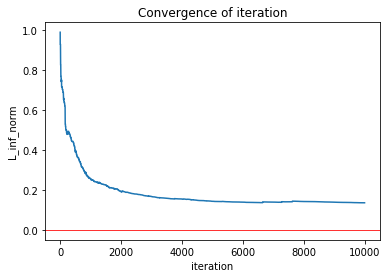

--------------------------------
0.13 0.92
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.84615418  0.90870699  0.98549887  0.          0.77157893  0.89932861
  0.          0.70003607  0.68465033  0.74842502  0.67725718]
	 plot convengence of value function: 


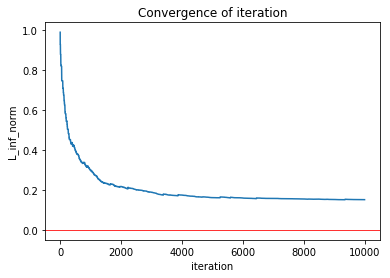

--------------------------------
0.13 0.93
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85038756  0.90778275  0.98566087  0.          0.78049965  0.89731555
  0.          0.71473546  0.64817615  0.74943949  0.62274077]
	 plot convengence of value function: 


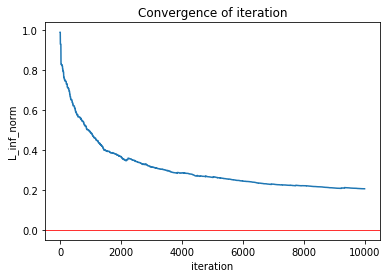

--------------------------------
0.13 0.94
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85338952  0.9126662   0.98561299  0.          0.78254033  0.89822723
  0.          0.71629898  0.64858561  0.76529691  0.65094757]
	 plot convengence of value function: 


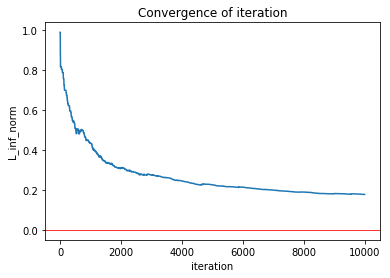

--------------------------------
0.13 0.95
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.83965869  0.90469974  0.98400266  0.          0.75736259  0.88950197
  0.          0.67574395  0.57540989  0.74858615  0.61251115]
	 plot convengence of value function: 


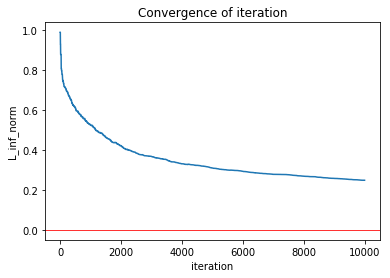

--------------------------------
0.13 0.96
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.84374333  0.90876404  0.98491011  0.          0.76416776  0.89088535
  0.          0.68523785  0.61613588  0.72262815  0.56934178]
	 plot convengence of value function: 


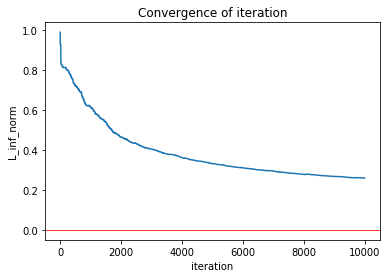

--------------------------------
0.13 0.97
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.83622515  0.90400533  0.98450415  0.          0.7507894   0.89544055
  0.          0.65799678  0.55174198  0.75233048  0.59333107]
	 plot convengence of value function: 


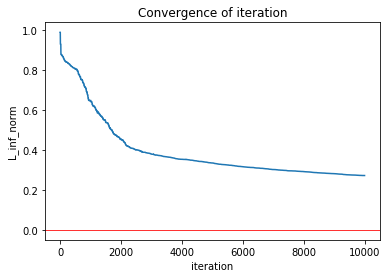

--------------------------------
0.13 0.98
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.83991299  0.90689079  0.98593303  0.          0.75445952  0.89457664
  0.          0.67016443  0.61833917  0.75522359  0.60653223]
	 plot convengence of value function: 


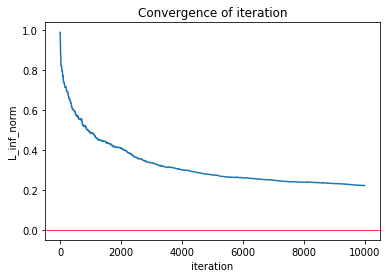

--------------------------------
0.13 0.99
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.82283278  0.89853298  0.98270859  0.          0.72427777  0.89013391
  0.          0.61883513  0.6302926   0.75535507  0.64230249]
	 plot convengence of value function: 


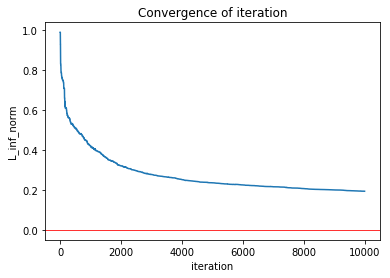

--------------------------------
0.14 0.51
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.84969756  0.91601317  0.98379505  0.          0.79162683  0.89681782
  0.          0.74458333  0.70224896  0.77135089  0.71687297]
	 plot convengence of value function: 


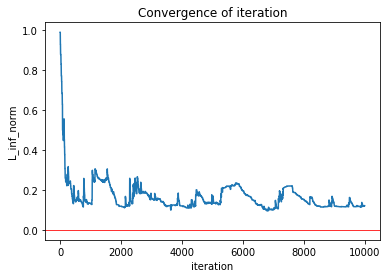

--------------------------------
0.14 0.52
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85257468  0.90515743  0.98576085  0.          0.79496909  0.8973281   0.
  0.74330397  0.70645295  0.78173964  0.69445443]
	 plot convengence of value function: 


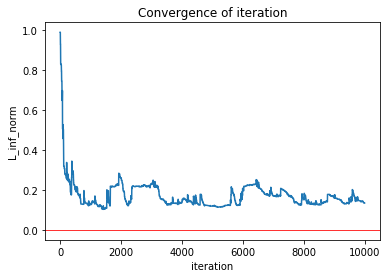

--------------------------------
0.14 0.53
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.8630693   0.91906711  0.98539781  0.          0.79645172  0.91108746
  0.          0.74830599  0.72646051  0.77118499  0.71579518]
	 plot convengence of value function: 


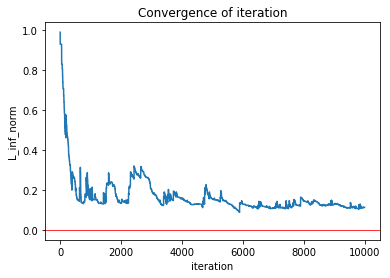

--------------------------------
0.14 0.54
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85318983  0.91433727  0.98160935  0.          0.79687663  0.89867747
  0.          0.74776315  0.71001531  0.75386709  0.69224888]
	 plot convengence of value function: 


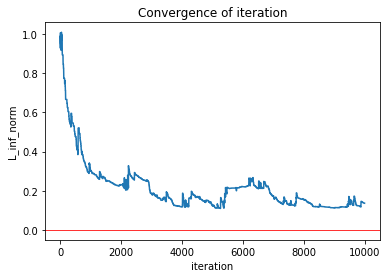

--------------------------------
0.14 0.55
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85384836  0.91516792  0.98204985  0.          0.79153385  0.91260626
  0.          0.74147019  0.71262598  0.74109658  0.7212035 ]
	 plot convengence of value function: 


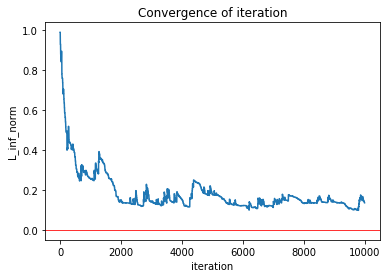

--------------------------------
0.14 0.56
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85674433  0.91034237  0.98399861  0.          0.80162005  0.90211665
  0.          0.75095568  0.70580775  0.78336906  0.70536976]
	 plot convengence of value function: 


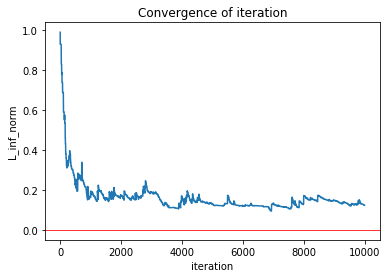

--------------------------------
0.14 0.57
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85722343  0.90998349  0.98672966  0.          0.79690321  0.90814987
  0.          0.74284036  0.72253663  0.73857259  0.71876713]
	 plot convengence of value function: 


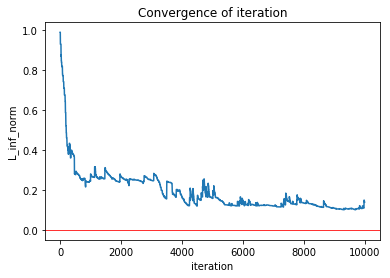

--------------------------------
0.14 0.58
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.84800462  0.89901646  0.97818843  0.          0.79437417  0.89377424
  0.          0.74318631  0.70005745  0.74268889  0.67581045]
	 plot convengence of value function: 


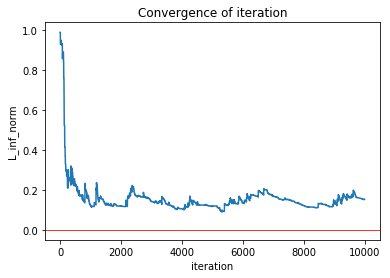

--------------------------------
0.14 0.59
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85420927  0.9113504   0.98667564  0.          0.79640746  0.90832521
  0.          0.74403498  0.74491692  0.82707845  0.72648823]
	 plot convengence of value function: 


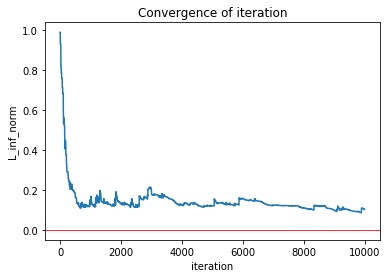

--------------------------------
0.14 0.6
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85726739  0.91444613  0.98891631  0.          0.79631331  0.90935696
  0.          0.74894916  0.71081534  0.77809573  0.70908232]
	 plot convengence of value function: 


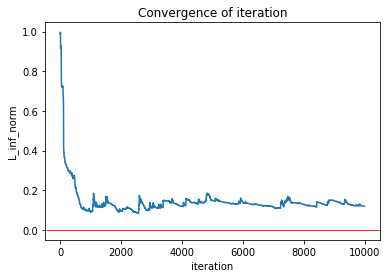

--------------------------------
0.14 0.61
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.84573715  0.90392523  0.98702612  0.          0.79373629  0.88313347
  0.          0.74621201  0.70159915  0.73526203  0.65817579]
	 plot convengence of value function: 


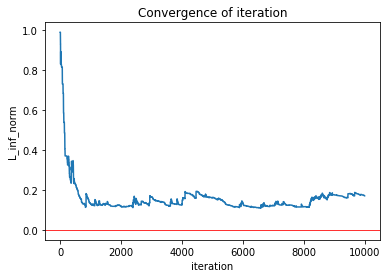

--------------------------------
0.14 0.62
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85190264  0.91061453  0.9852172   0.          0.79189983  0.9044392   0.
  0.74052947  0.71269064  0.75931114  0.66719046]
	 plot convengence of value function: 


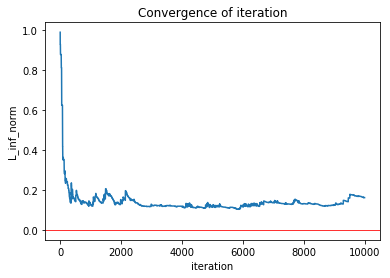

--------------------------------
0.14 0.63
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85821455  0.91479348  0.98738451  0.          0.79660338  0.90973632
  0.          0.74741969  0.72704309  0.77827347  0.72164139]
	 plot convengence of value function: 


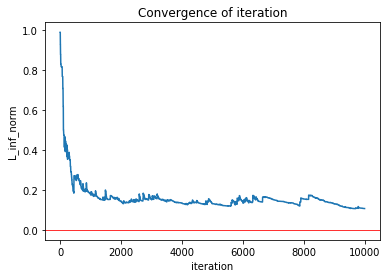

--------------------------------
0.14 0.64
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85726056  0.91245046  0.98655821  0.          0.79432814  0.90293923
  0.          0.74423848  0.70493273  0.76207364  0.69570537]
	 plot convengence of value function: 


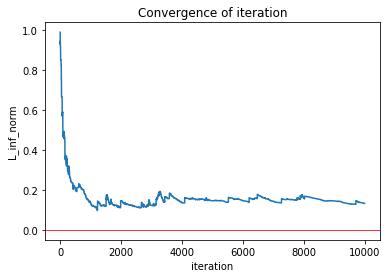

--------------------------------
0.14 0.65
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85681821  0.91768522  0.98578114  0.          0.79670349  0.90442276
  0.          0.74416355  0.71707241  0.76478689  0.71779233]
	 plot convengence of value function: 


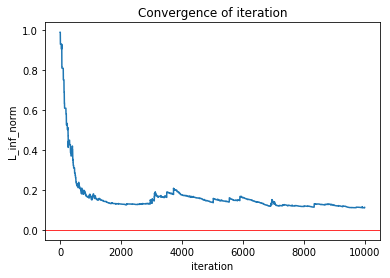

--------------------------------
0.14 0.66
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.854261    0.91328062  0.98693194  0.          0.79633107  0.90452548
  0.          0.74829561  0.7367235   0.78782391  0.70393248]
	 plot convengence of value function: 


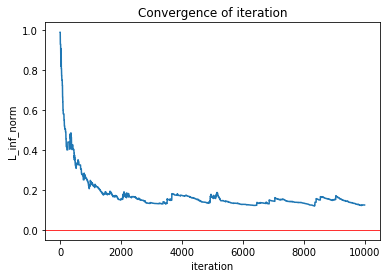

--------------------------------
0.14 0.67
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85120163  0.90836303  0.98559261  0.          0.79542749  0.89483975
  0.          0.7445061   0.70152832  0.74830106  0.68301197]
	 plot convengence of value function: 


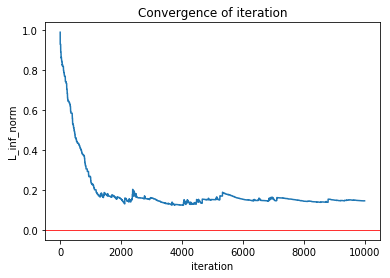

--------------------------------
0.14 0.68
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85509705  0.91557751  0.98610435  0.          0.79155082  0.90140758
  0.          0.74414715  0.70218812  0.75445883  0.70982155]
	 plot convengence of value function: 


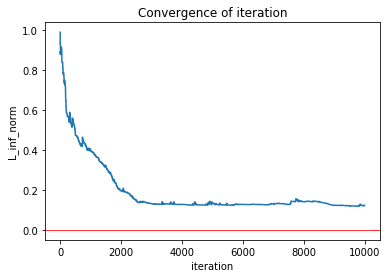

--------------------------------
0.14 0.69
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85696728  0.91003913  0.98252814  0.          0.79726523  0.895421    0.
  0.74608935  0.70809996  0.76360663  0.69246722]
	 plot convengence of value function: 


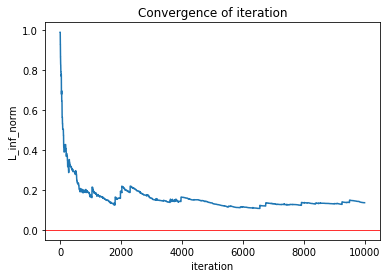

--------------------------------
0.14 0.7
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85271789  0.91098203  0.98433338  0.          0.79542269  0.90277632
  0.          0.74545288  0.70507014  0.75659748  0.69904442]
	 plot convengence of value function: 


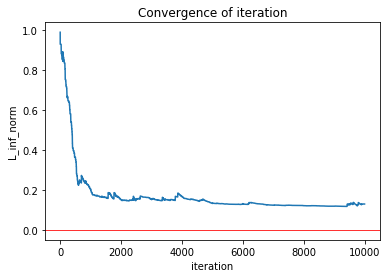

--------------------------------
0.14 0.71
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.84849691  0.90468581  0.98578128  0.          0.78964066  0.90224529
  0.          0.73974844  0.71651544  0.78010919  0.7001834 ]
	 plot convengence of value function: 


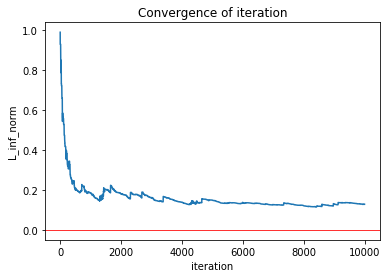

--------------------------------
0.14 0.72
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85716427  0.91318973  0.98705922  0.          0.79515058  0.90423096
  0.          0.74154053  0.71259709  0.74641442  0.71699189]
	 plot convengence of value function: 


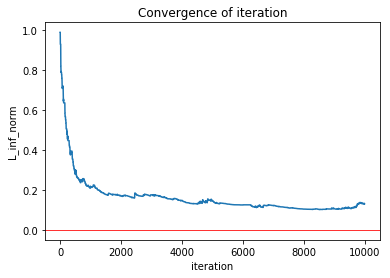

--------------------------------
0.14 0.73
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85276468  0.90901761  0.98469589  0.          0.79105171  0.89940542
  0.          0.74038623  0.6981092   0.72628316  0.67854483]
	 plot convengence of value function: 


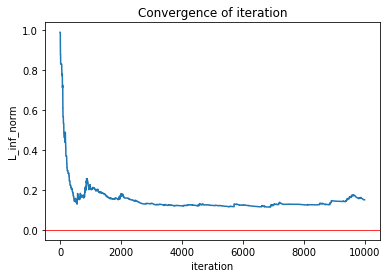

--------------------------------
0.14 0.74
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85188373  0.90876128  0.98595265  0.          0.79272747  0.90116468
  0.          0.74176536  0.71277101  0.77514677  0.69513837]
	 plot convengence of value function: 


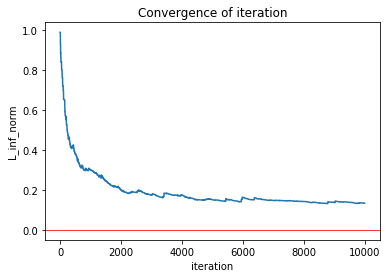

--------------------------------
0.14 0.75
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85503674  0.91249673  0.98532438  0.          0.79451493  0.90212892
  0.          0.74059653  0.70854514  0.75838224  0.6992127 ]
	 plot convengence of value function: 


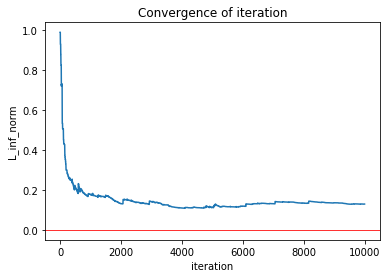

--------------------------------
0.14 0.76
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85300295  0.90836839  0.98631712  0.          0.7947809   0.9008416   0.
  0.74486322  0.7063098   0.78374383  0.71235197]
	 plot convengence of value function: 


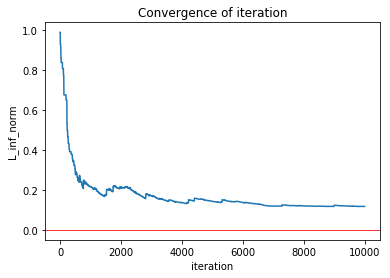

--------------------------------
0.14 0.77
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85257178  0.9087031   0.98671788  0.          0.79632995  0.90575143
  0.          0.74159996  0.70856861  0.7733612   0.6928496 ]
	 plot convengence of value function: 


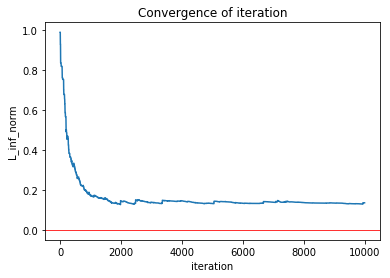

--------------------------------
0.14 0.78
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85347282  0.91138681  0.98702764  0.          0.79325712  0.89929044
  0.          0.74401058  0.69989751  0.75218105  0.65500158]
	 plot convengence of value function: 


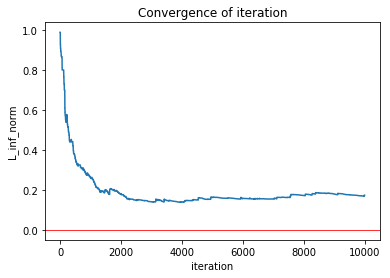

--------------------------------
0.14 0.79
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85450541  0.91178571  0.98508702  0.          0.79687586  0.90431035
  0.          0.7446647   0.69779333  0.7729379   0.69197226]
	 plot convengence of value function: 


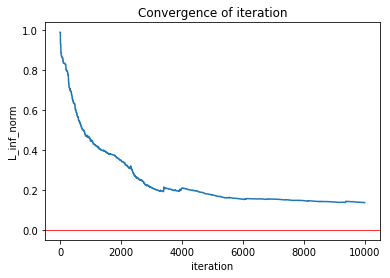

--------------------------------
0.14 0.8
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.8548089   0.91146876  0.98592611  0.          0.79473355  0.90547856
  0.          0.74392531  0.72108334  0.77253567  0.69592976]
	 plot convengence of value function: 


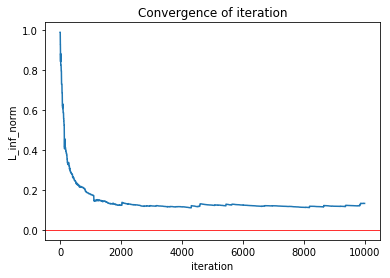

--------------------------------
0.14 0.81
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85660466  0.91269025  0.98647651  0.          0.79753387  0.90090766
  0.          0.74331537  0.69543431  0.75826415  0.68869279]
	 plot convengence of value function: 


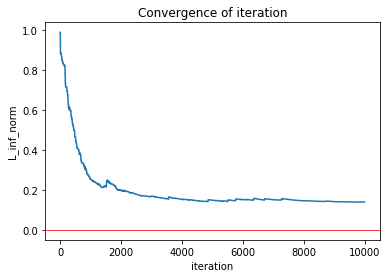

--------------------------------
0.14 0.82
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85367987  0.91031237  0.98525895  0.          0.79359463  0.89928881
  0.          0.73998     0.70681652  0.76735816  0.68614862]
	 plot convengence of value function: 


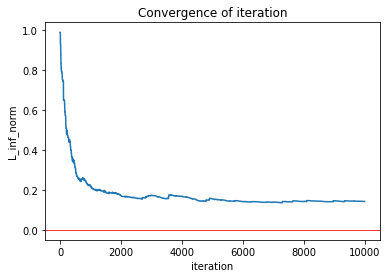

--------------------------------
0.14 0.83
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85318519  0.91131176  0.98679202  0.          0.79178101  0.89734598
  0.          0.73943143  0.68988739  0.76866491  0.68470915]
	 plot convengence of value function: 


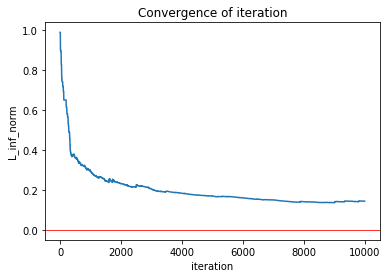

--------------------------------
0.14 0.84
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.84803151  0.90787747  0.98523729  0.          0.78393512  0.89877098
  0.          0.72500308  0.66514513  0.76578332  0.66315485]
	 plot convengence of value function: 


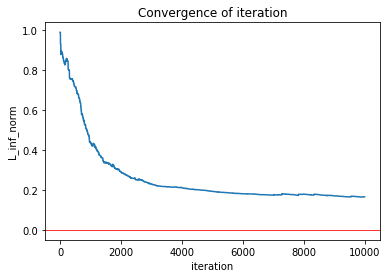

--------------------------------
0.14 0.85
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.8534174   0.91303295  0.98618808  0.          0.78462871  0.90226514
  0.          0.71962769  0.69442285  0.75124878  0.67702878]
	 plot convengence of value function: 


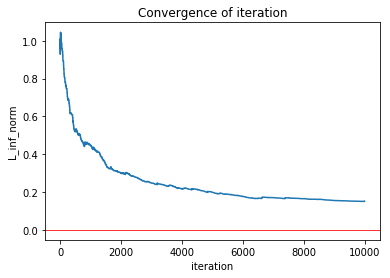

--------------------------------
0.14 0.86
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85173198  0.91023289  0.98566046  0.          0.78784742  0.90120068
  0.          0.72831513  0.67256109  0.77444019  0.68269777]
	 plot convengence of value function: 


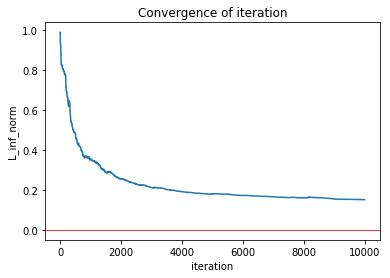

--------------------------------
0.14 0.87
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85260741  0.91069634  0.98616263  0.          0.78478564  0.90042674
  0.          0.71971454  0.70585884  0.76758128  0.68993781]
	 plot convengence of value function: 


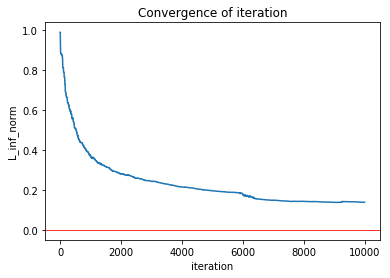

--------------------------------
0.14 0.88
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.84896757  0.90771625  0.9852874   0.          0.78371244  0.90247228
  0.          0.72103911  0.66470522  0.74322198  0.6674331 ]
	 plot convengence of value function: 


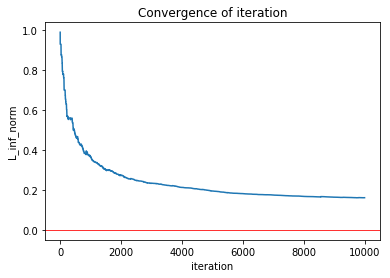

--------------------------------
0.14 0.89
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.84797874  0.90836994  0.98531567  0.          0.77639208  0.89830814
  0.          0.71022313  0.68754857  0.7618218   0.66169615]
	 plot convengence of value function: 


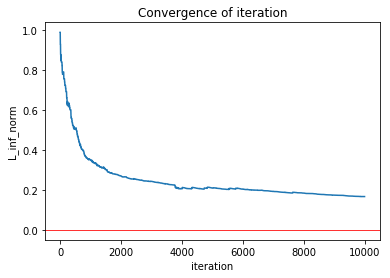

--------------------------------
0.14 0.9
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.84676591  0.90791225  0.98528397  0.          0.77604814  0.89437903
  0.          0.70682493  0.63150548  0.75507465  0.63001552]
	 plot convengence of value function: 


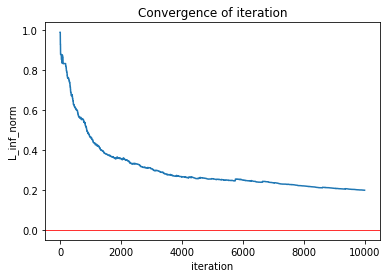

--------------------------------
0.14 0.91
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.84679026  0.90734763  0.98490789  0.          0.77339854  0.89690512
  0.          0.70391721  0.63310902  0.75141276  0.64884501]
	 plot convengence of value function: 


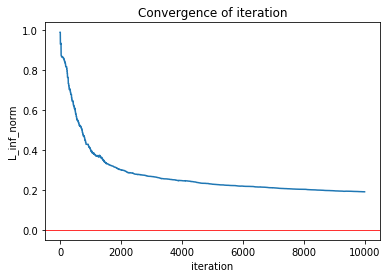

--------------------------------
0.14 0.92
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.84412351  0.90748366  0.98464211  0.          0.77253474  0.8942065   0.
  0.69879328  0.65714602  0.75597422  0.66283671]
	 plot convengence of value function: 


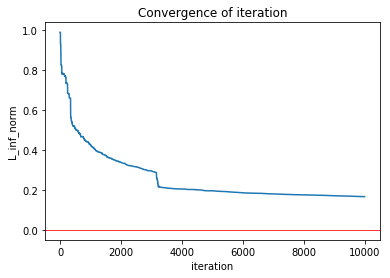

--------------------------------
0.14 0.93
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.83661448  0.90476958  0.98466053  0.          0.75313544  0.89201838
  0.          0.67918596  0.64105949  0.73729704  0.64187937]
	 plot convengence of value function: 


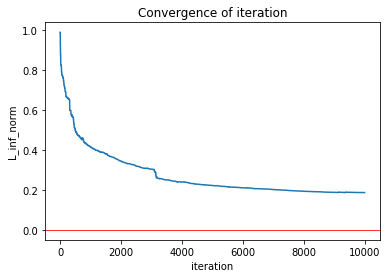

--------------------------------
0.14 0.94
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.83519938  0.90303557  0.98388634  0.          0.74218759  0.88916483
  0.          0.63488102  0.64856011  0.74955477  0.63125225]
	 plot convengence of value function: 


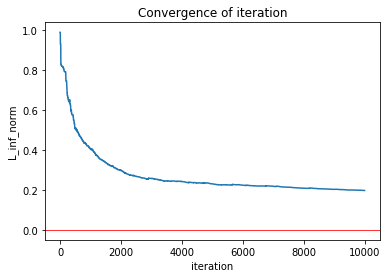

--------------------------------
0.14 0.95
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.83941684  0.90453407  0.98463354  0.          0.75406037  0.89203113
  0.          0.66150164  0.5715699   0.73298748  0.60216138]
	 plot convengence of value function: 


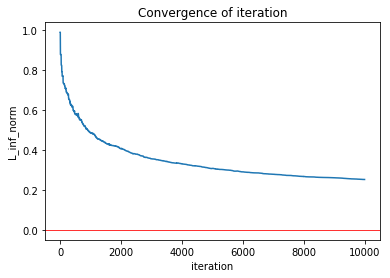

--------------------------------
0.14 0.96
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.84109541  0.90490851  0.98457399  0.          0.76484111  0.88734037
  0.          0.69127124  0.60840988  0.72976381  0.61173954]
	 plot convengence of value function: 


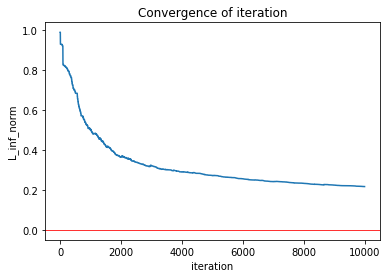

--------------------------------
0.14 0.97
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.83213186  0.90082748  0.98370483  0.          0.74616712  0.89147402
  0.          0.66645416  0.65688088  0.75489715  0.64969589]
	 plot convengence of value function: 


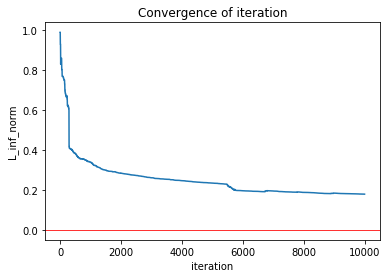

--------------------------------
0.14 0.98
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.84183154  0.90521354  0.98512485  0.          0.7687692   0.89195201
  0.          0.70140717  0.62897686  0.74551824  0.60732478]
	 plot convengence of value function: 


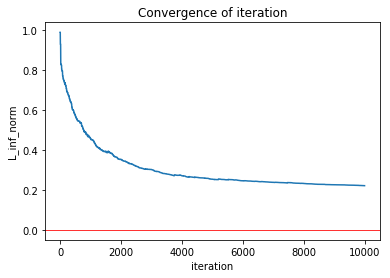

--------------------------------
0.14 0.99
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.82487688  0.9005802   0.98386982  0.          0.7058651   0.89434548
  0.          0.57172454  0.6391695   0.75059766  0.62975733]
	 plot convengence of value function: 


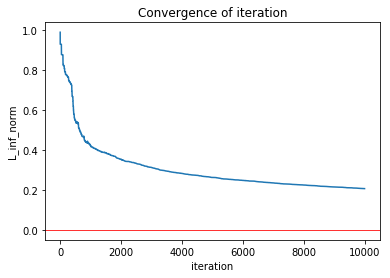

--------------------------------
0.15 0.51
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85507196  0.91040996  0.98685844  0.          0.78806086  0.90995471
  0.          0.74018353  0.70348022  0.79316046  0.7354756 ]
	 plot convengence of value function: 


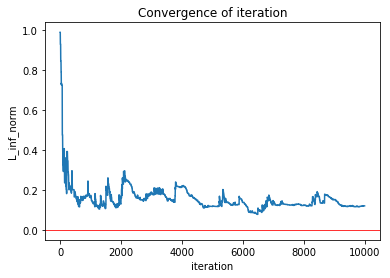

--------------------------------
0.15 0.52
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85067569  0.90754039  0.98520965  0.          0.79280965  0.89426781
  0.          0.74324684  0.70026752  0.80048046  0.71327129]
	 plot convengence of value function: 


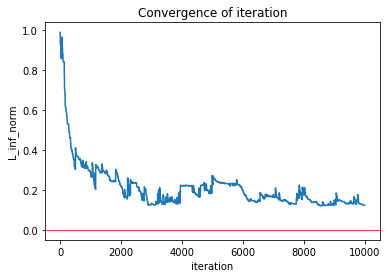

--------------------------------
0.15 0.53
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.8479838   0.9079167   0.98773802  0.          0.78836709  0.89522652
  0.          0.74298703  0.70079675  0.7504517   0.67693395]
	 plot convengence of value function: 


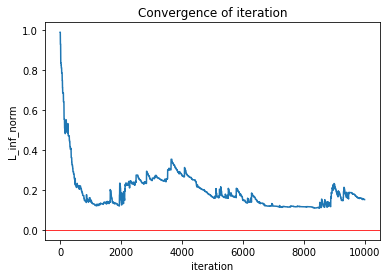

--------------------------------
0.15 0.54
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.8524647   0.91122414  0.98839512  0.          0.79683888  0.89748092
  0.          0.74347486  0.69430704  0.7237344   0.64799817]
	 plot convengence of value function: 


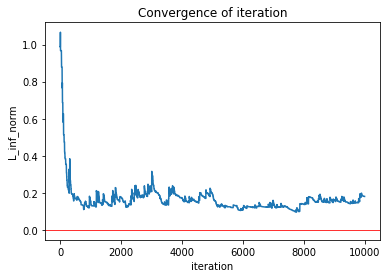

--------------------------------
0.15 0.55
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.84907074  0.90480814  0.98425752  0.          0.79033276  0.90418329
  0.          0.74049698  0.70955863  0.76998392  0.69804146]
	 plot convengence of value function: 


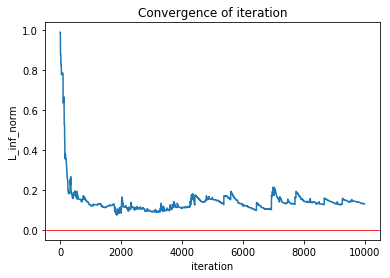

--------------------------------
0.15 0.56
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85523762  0.90991149  0.98641122  0.          0.79801655  0.9069913   0.
  0.7456458   0.73210787  0.80899711  0.72160626]
	 plot convengence of value function: 


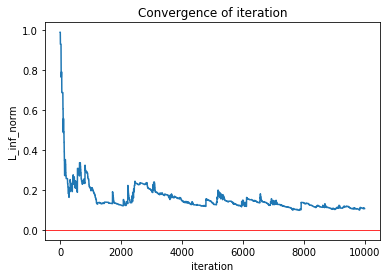

--------------------------------
0.15 0.57
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.84486057  0.90276718  0.99060253  0.          0.78481593  0.89805528
  0.          0.73667789  0.69853374  0.72143006  0.69126193]
	 plot convengence of value function: 


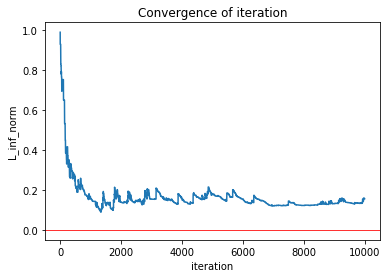

--------------------------------
0.15 0.58
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85252554  0.90462127  0.98180327  0.          0.78980251  0.89127041
  0.          0.7364285   0.69418252  0.737637    0.68031481]
	 plot convengence of value function: 


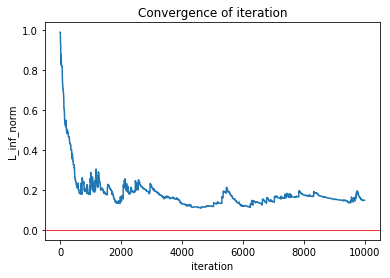

--------------------------------
0.15 0.59
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85432314  0.90798858  0.98362937  0.          0.79707116  0.90668412
  0.          0.74777224  0.70333501  0.77781851  0.70303692]
	 plot convengence of value function: 


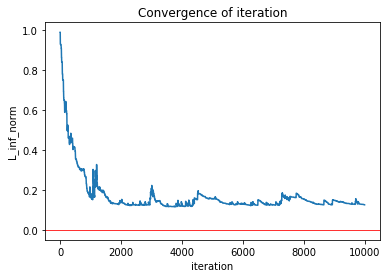

--------------------------------
0.15 0.6
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85169594  0.90112597  0.98434787  0.          0.790185    0.89309096
  0.          0.74171093  0.70095688  0.77882064  0.71394197]
	 plot convengence of value function: 


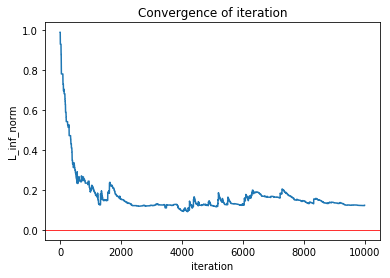

--------------------------------
0.15 0.61
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85247069  0.91157493  0.98796272  0.          0.78814826  0.8942285   0.
  0.73892206  0.71272778  0.77612818  0.70752266]
	 plot convengence of value function: 


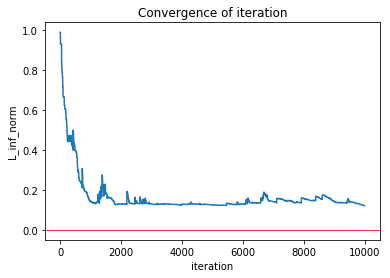

--------------------------------
0.15 0.62
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.84868003  0.90877288  0.98652103  0.          0.78780389  0.91063668
  0.          0.73833439  0.69690074  0.78524803  0.68186513]
	 plot convengence of value function: 


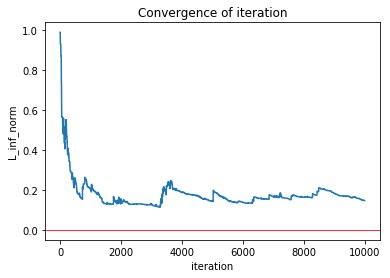

--------------------------------
0.15 0.63
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85316379  0.91458303  0.98697545  0.          0.79109843  0.90919491
  0.          0.74458319  0.72198322  0.77090062  0.71838132]
	 plot convengence of value function: 


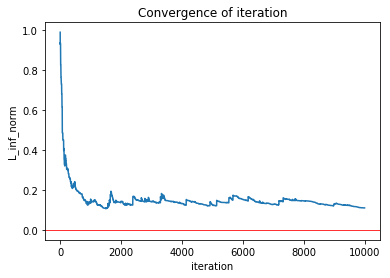

--------------------------------
0.15 0.64
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.8529978   0.91242913  0.98921261  0.          0.79328283  0.89255275
  0.          0.74198051  0.69849577  0.73547434  0.65428421]
	 plot convengence of value function: 


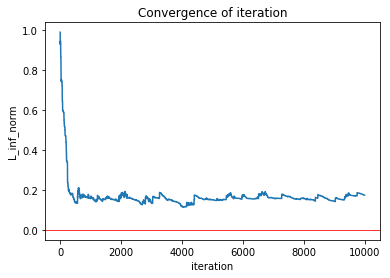

--------------------------------
0.15 0.65
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85060842  0.90719193  0.98638201  0.          0.79249754  0.89902492
  0.          0.73942977  0.70987244  0.78432605  0.68275047]
	 plot convengence of value function: 


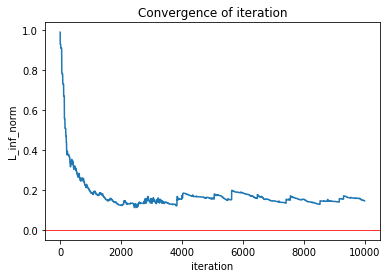

--------------------------------
0.15 0.66
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.84927266  0.90595854  0.98729355  0.          0.78880395  0.8969828   0.
  0.74028364  0.70049981  0.7123626   0.64492071]
	 plot convengence of value function: 


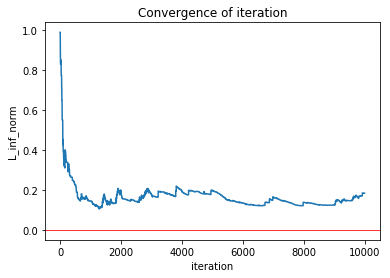

--------------------------------
0.15 0.67
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85022568  0.90641581  0.98427401  0.          0.79105197  0.90065589
  0.          0.74588873  0.70372628  0.7771008   0.71437267]
	 plot convengence of value function: 


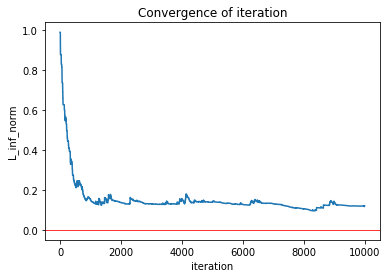

--------------------------------
0.15 0.68
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85102947  0.90835323  0.98592532  0.          0.79374767  0.90047683
  0.          0.74277732  0.70272432  0.76746154  0.68043389]
	 plot convengence of value function: 


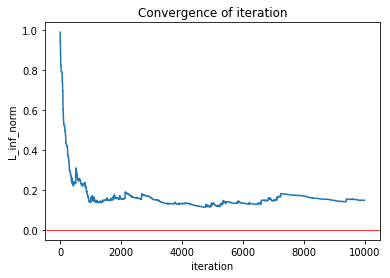

--------------------------------
0.15 0.69
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85180088  0.90902063  0.98438979  0.          0.79361491  0.89071937
  0.          0.74173639  0.69557897  0.74760051  0.67577725]
	 plot convengence of value function: 


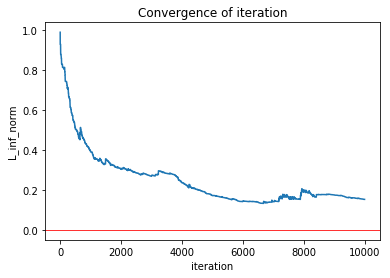

--------------------------------
0.15 0.7
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85560659  0.91501704  0.98792678  0.          0.79350655  0.90160844
  0.          0.7419446   0.71750858  0.76630663  0.71807458]
	 plot convengence of value function: 


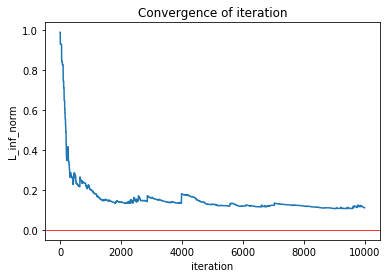

--------------------------------
0.15 0.71
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.8497445   0.90849649  0.98684931  0.          0.7915919   0.90285658
  0.          0.74201177  0.69650651  0.76652634  0.68209764]
	 plot convengence of value function: 


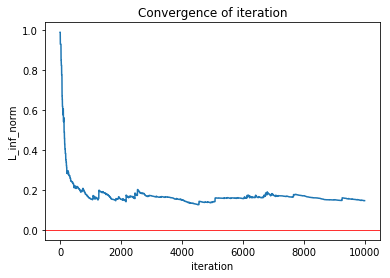

--------------------------------
0.15 0.72
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85443734  0.91550152  0.98750573  0.          0.79262982  0.89932704
  0.          0.74092496  0.72259509  0.7789869   0.70082001]
	 plot convengence of value function: 


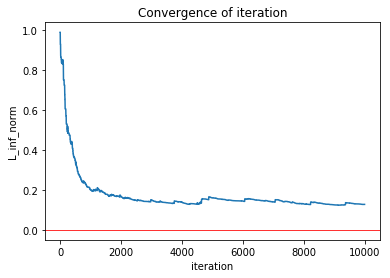

--------------------------------
0.15 0.73
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85298285  0.91031429  0.98657566  0.          0.79340735  0.90012788
  0.          0.74272024  0.69582229  0.74398327  0.6725173 ]
	 plot convengence of value function: 


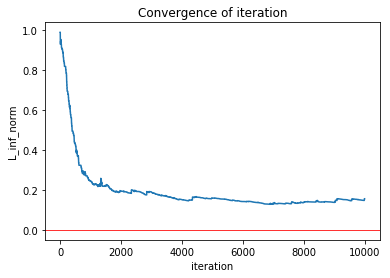

--------------------------------
0.15 0.74
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85364678  0.9097215   0.98605245  0.          0.79292376  0.89799245
  0.          0.74181742  0.69507193  0.75539831  0.69945184]
	 plot convengence of value function: 


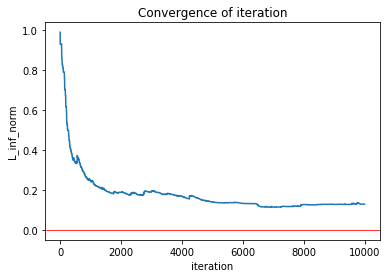

--------------------------------
0.15 0.75
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.84943844  0.90992806  0.98683053  0.          0.79132544  0.89978424
  0.          0.74125713  0.69998464  0.76982318  0.70017659]
	 plot convengence of value function: 


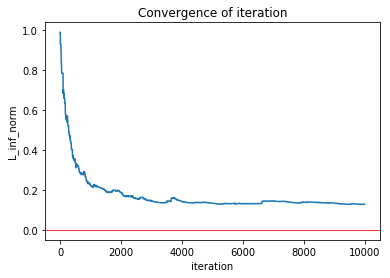

--------------------------------
0.15 0.76
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85145977  0.9085706   0.98440192  0.          0.79172045  0.89981143
  0.          0.73895785  0.6898398   0.73431802  0.68686669]
	 plot convengence of value function: 


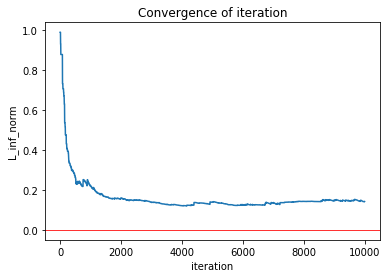

--------------------------------
0.15 0.77
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.84928872  0.9064288   0.98547909  0.          0.78992638  0.89875937
  0.          0.73869072  0.72191133  0.7783472   0.7084877 ]
	 plot convengence of value function: 


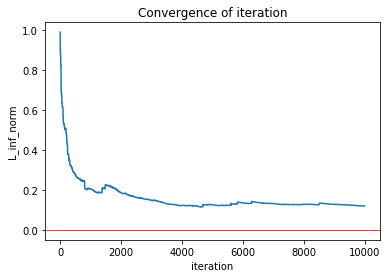

--------------------------------
0.15 0.78
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85358091  0.91247619  0.98686764  0.          0.78995515  0.90256995
  0.          0.73613764  0.69204772  0.75056768  0.68047898]
	 plot convengence of value function: 


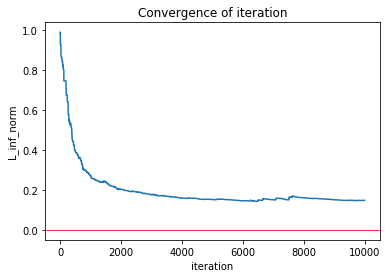

--------------------------------
0.15 0.79
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.84692525  0.90660443  0.98517542  0.          0.78739047  0.89493763
  0.          0.73531567  0.70238729  0.75213395  0.6883468 ]
	 plot convengence of value function: 


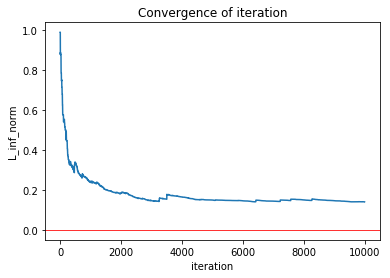

--------------------------------
0.15 0.8
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.85195098  0.90981568  0.98649557  0.          0.78928094  0.89465521
  0.          0.73658753  0.68591196  0.75618011  0.68211698]
	 plot convengence of value function: 


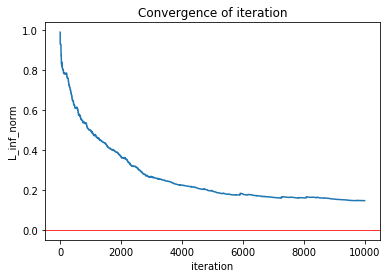

--------------------------------
0.15 0.81
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.84852626  0.90676919  0.98459802  0.          0.78498534  0.89802461
  0.          0.73043266  0.67677362  0.75898471  0.66796584]
	 plot convengence of value function: 


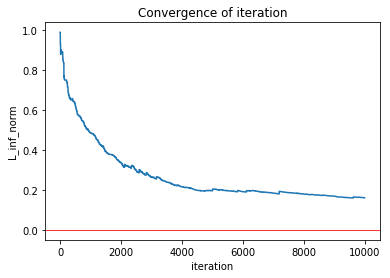

--------------------------------
0.15 0.82
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.84833819  0.90681237  0.98680557  0.          0.79060466  0.89227815
  0.          0.73802103  0.68811184  0.75126232  0.67052112]
	 plot convengence of value function: 


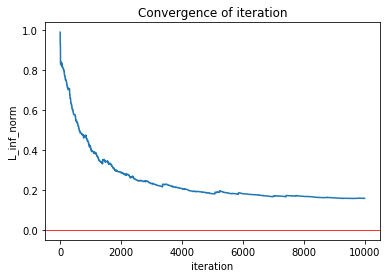

--------------------------------
0.15 0.83
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.84578026  0.90624048  0.98550377  0.          0.78037702  0.90032888
  0.          0.71925068  0.68580454  0.76228959  0.6709305 ]
	 plot convengence of value function: 


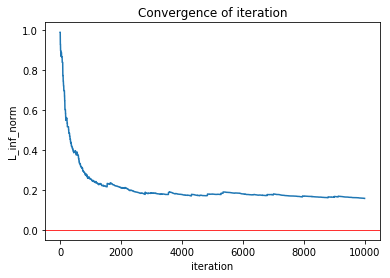

--------------------------------
0.15 0.84
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.84948983  0.9053908   0.98546147  0.          0.78895723  0.8971232   0.
  0.7361315   0.70036992  0.75728027  0.68192028]
	 plot convengence of value function: 


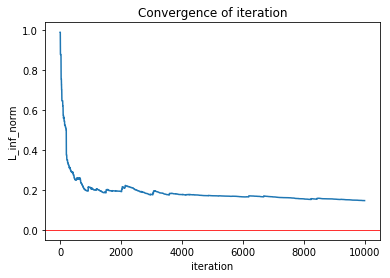

--------------------------------
0.15 0.85
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.84782366  0.9065062   0.98658806  0.          0.78444086  0.89705454
  0.          0.73009726  0.67726301  0.76570362  0.67282457]
	 plot convengence of value function: 


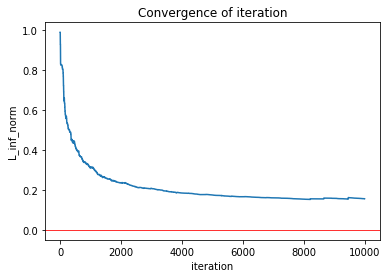

--------------------------------
0.15 0.86
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.85070546  0.91078598  0.98471174  0.          0.78487545  0.90083817
  0.          0.72593709  0.68236522  0.72874991  0.67380217]
	 plot convengence of value function: 


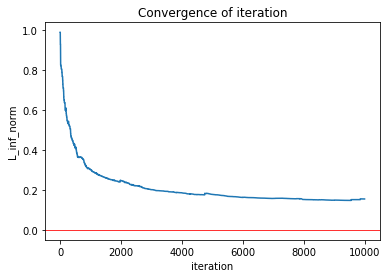

--------------------------------
0.15 0.87
	 run time:  1.928797960281372
	 number of iterations:  10001
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.84826925  0.90618565  0.9853912   0.          0.78366383  0.89731949
  0.          0.72014129  0.68729715  0.74300482  0.66135241]
	 plot convengence of value function: 


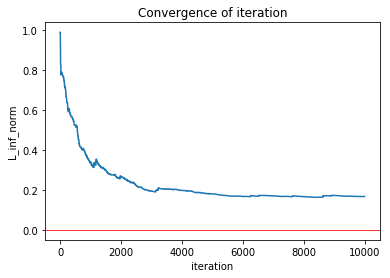

--------------------------------
0.15 0.88


KeyboardInterrupt: 

In [316]:
for e in [i/100 for i in range(1, 100)]:
    for w in [j/100 for j in range(51, 100)]:
        print('--------------------------------')
        print(e, w)
        Vs, policy = Q_learning_epi_greedy(n_episodes, gamma, epi=e, w=w, env=env, mu0=None)
        recall_iteration_results(start, stop, Vs, policy, np.array(v_opt))

## Q6: Change of initial distribution ($\mu_0$) 

Initial distribution:  [ 0.02748534  0.1277763   0.16289265  0.08656495  0.0997112   0.11314805
  0.01902169  0.0614575   0.16470695  0.05284475  0.08439061]
	 run time:  1.2610459327697754
	 number of iterations:  5000
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 2, 2]
	 value function of final iteration:  [ 0.8776432   0.93002563  0.98552863  0.          0.82148206  0.91091641
  0.          0.7757982   0.72548193  0.67875136  0.63925317]
	 plot convengence of value function: 


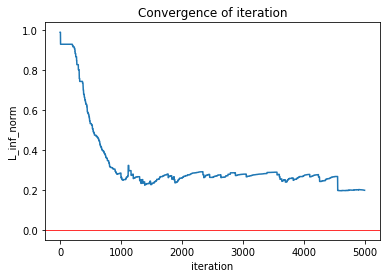

-------------------------------------------------------

Initial distribution:  [ 0.11530558  0.05503418  0.03723267  0.14183402  0.05529314  0.09244408
  0.07963787  0.0735981   0.14396356  0.13417728  0.07147951]
	 run time:  1.0710937976837158
	 number of iterations:  5000
	 greedy policy:  [0, 0, 0, 0, 1, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.87239999  0.92744699  0.99079067  0.          0.72975648  0.92037355
  0.          0.75942506  0.8022971   0.86148929  0.80352044]
	 plot convengence of value function: 


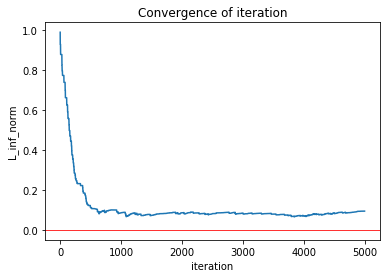

-------------------------------------------------------

Initial distribution:  [ 0.07286995  0.07811733  0.12919269  0.13600283  0.10326969  0.08903573
  0.13020161  0.01219597  0.03061169  0.12718506  0.09131744]
	 run time:  1.1622719764709473
	 number of iterations:  5000
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87268962  0.92410076  0.98323561  0.          0.819947    0.92463985
  0.          0.77443811  0.74170167  0.87106739  0.8220186 ]
	 plot convengence of value function: 


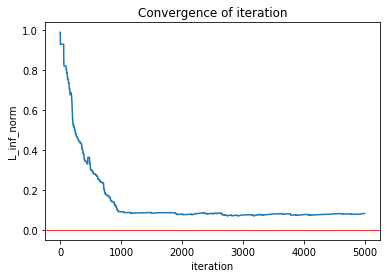

-------------------------------------------------------

Initial distribution:  [ 0.11785158  0.05359731  0.09748509  0.18682026  0.02418429  0.07756372
  0.10340712  0.04353003  0.1633841   0.10988126  0.02229523]
	 run time:  1.1948778629302979
	 number of iterations:  5000
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87375851  0.92796539  0.98756877  0.          0.82058354  0.92116815
  0.          0.77081274  0.81233786  0.83927339  0.81788946]
	 plot convengence of value function: 


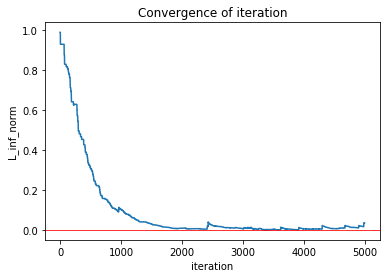

-------------------------------------------------------

Initial distribution:  [ 0.12464896  0.0033099   0.12012747  0.03528795  0.05160745  0.01487934
  0.15662356  0.11784984  0.13945809  0.0689623   0.16724514]
	 run time:  1.0980379581451416
	 number of iterations:  5000
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87420315  0.91730178  0.9827954   0.          0.81732078  0.91457805
  0.          0.77247068  0.74920165  0.86402797  0.80921951]
	 plot convengence of value function: 


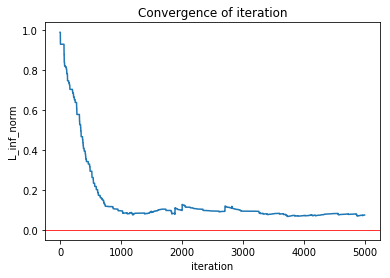

-------------------------------------------------------

Initial distribution:  [ 0.14352357  0.17195576  0.10285861  0.13638896  0.04652802  0.14343412
  0.17167329  0.02826097  0.0171453   0.00089488  0.03733654]
	 run time:  1.2734990119934082
	 number of iterations:  5000
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.87203707  0.92616152  0.98830404  0.          0.8258282   0.92791644
  0.          0.76745834  0.81554423  0.87336237  0.81238874]
	 plot convengence of value function: 


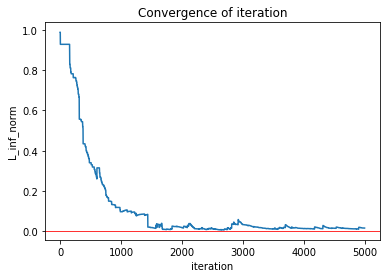

-------------------------------------------------------

Initial distribution:  [ 0.01048817  0.01387211  0.01318447  0.14371061  0.19838053  0.17888615
  0.09850727  0.2118874   0.0719185   0.01461271  0.04455207]
	 run time:  1.3465778827667236
	 number of iterations:  5000
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 2, 2]
	 value function of final iteration:  [ 0.87029016  0.92687167  0.98598977  0.          0.82496488  0.90055315
  0.          0.77668666  0.72367914  0.66598128  0.62978815]
	 plot convengence of value function: 


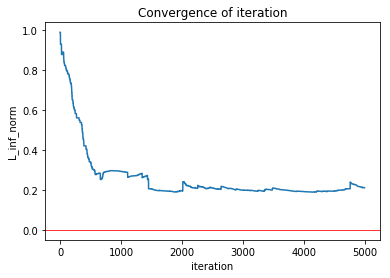

-------------------------------------------------------

Initial distribution:  [ 0.02593993  0.05838361  0.07516631  0.10090041  0.05469784  0.21751289
  0.07097406  0.16033242  0.13965603  0.01808384  0.07835266]
	 run time:  1.0812859535217285
	 number of iterations:  5000
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87439684  0.92539158  0.99004622  0.          0.82493743  0.93504994
  0.          0.77832117  0.81826138  0.88136377  0.82231001]
	 plot convengence of value function: 


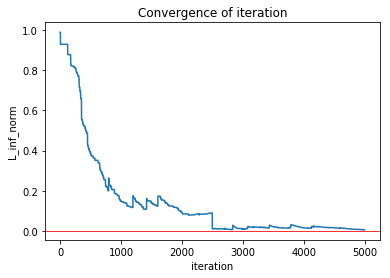

-------------------------------------------------------

Initial distribution:  [ 0.04483036  0.02443176  0.10015966  0.11576579  0.09547497  0.06403886
  0.10213468  0.10467602  0.15078029  0.06641941  0.1312882 ]
	 run time:  1.0996739864349365
	 number of iterations:  5000
	 greedy policy:  [0, 0, 0, 0, 1, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.87302508  0.93254344  0.98988118  0.          0.73078526  0.92791961
  0.          0.75714482  0.79853449  0.85976497  0.81359433]
	 plot convengence of value function: 


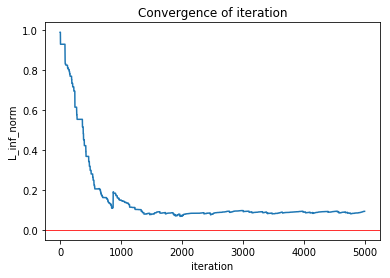

-------------------------------------------------------

Initial distribution:  [ 0.14949942  0.04117932  0.01395142  0.15036453  0.14979516  0.05850952
  0.05921358  0.05275041  0.07419117  0.11652307  0.1340224 ]
	 run time:  1.3564369678497314
	 number of iterations:  5000
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87888001  0.93341788  0.99166742  0.          0.82740557  0.92471031
  0.          0.78278804  0.7427518   0.84858393  0.81738423]
	 plot convengence of value function: 


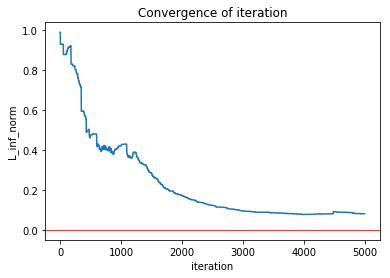

-------------------------------------------------------

Initial distribution:  [ 0.090582    0.08538708  0.02089667  0.05048635  0.18566278  0.04614057
  0.02893146  0.17447127  0.14482091  0.16671669  0.00590422]
	 run time:  0.987069845199585
	 number of iterations:  5000
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87599469  0.92591079  0.98943915  0.          0.82467612  0.92492348
  0.          0.77922285  0.80839819  0.82990107  0.81366596]
	 plot convengence of value function: 


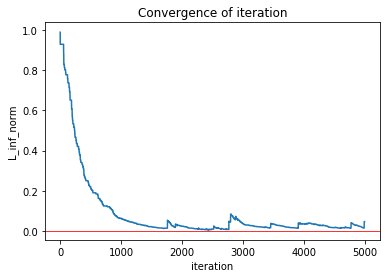

-------------------------------------------------------

Initial distribution:  [ 0.01689186  0.12483521  0.12032179  0.12381535  0.13215566  0.03478601
  0.06315468  0.14346673  0.05224683  0.15592515  0.03240072]
	 run time:  1.203322172164917
	 number of iterations:  5000
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87342881  0.9260417   0.98836178  0.          0.82272905  0.93413733
  0.          0.77830754  0.73698335  0.88186424  0.78878969]
	 plot convengence of value function: 


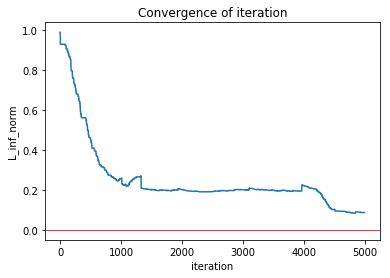

-------------------------------------------------------

Initial distribution:  [ 0.0328358   0.10593762  0.03928737  0.14125655  0.0582739   0.09476516
  0.13399724  0.02340487  0.11453234  0.10141089  0.15429825]
	 run time:  0.9781851768493652
	 number of iterations:  5000
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.87017767  0.9272271   0.98899094  0.          0.81770234  0.92997347
  0.          0.77217881  0.81214665  0.85508518  0.82642987]
	 plot convengence of value function: 


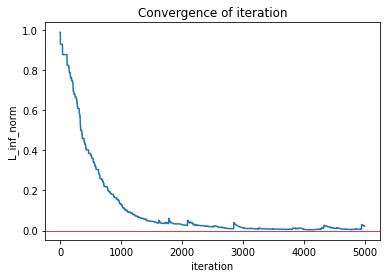

-------------------------------------------------------

Initial distribution:  [ 0.11526932  0.04318093  0.07048     0.09051352  0.07064777  0.12281088
  0.11537131  0.05789854  0.04856326  0.14760872  0.11765575]
	 run time:  0.9940919876098633
	 number of iterations:  5000
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.87220228  0.92269506  0.98253607  0.          0.82020358  0.91704218
  0.          0.77674312  0.79186011  0.86807474  0.81787155]
	 plot convengence of value function: 


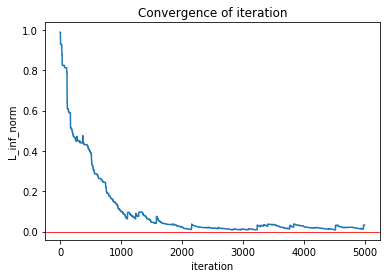

-------------------------------------------------------

Initial distribution:  [ 0.05373056  0.01850014  0.13761562  0.08682397  0.08573657  0.21623074
  0.0327666   0.07514943  0.04965736  0.06507295  0.17871607]
	 run time:  1.1519010066986084
	 number of iterations:  5000
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 2, 2]
	 value function of final iteration:  [ 0.87705078  0.92939269  0.98942597  0.          0.82631224  0.90520956
  0.          0.77682006  0.71694005  0.67190251  0.62214162]
	 plot convengence of value function: 


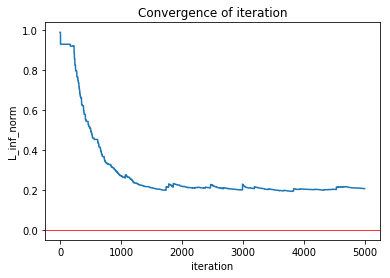

-------------------------------------------------------

Initial distribution:  [ 0.07226056  0.03366455  0.02197386  0.11032025  0.02130152  0.18762284
  0.02409436  0.1110624   0.05863858  0.1791035   0.17995756]
	 run time:  0.9590959548950195
	 number of iterations:  5000
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.87360375  0.9295999   0.99223268  0.          0.81985223  0.92735351
  0.          0.77051451  0.81228865  0.86319571  0.81795125]
	 plot convengence of value function: 


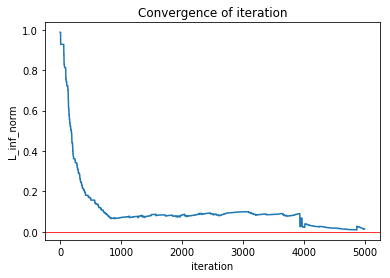

-------------------------------------------------------

Initial distribution:  [ 0.11149602  0.05019666  0.01973187  0.10719303  0.05657895  0.13781853
  0.09200707  0.14942818  0.08146396  0.05735967  0.13672606]
	 run time:  0.9446840286254883
	 number of iterations:  5000
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.8728107   0.92408988  0.98857844  0.          0.8237205   0.92554045
  0.          0.77030029  0.81617178  0.86217116  0.82333982]
	 plot convengence of value function: 


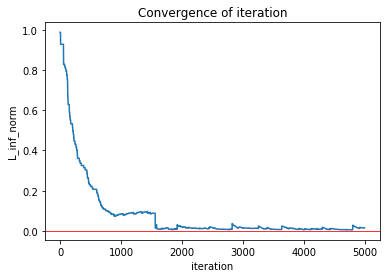

-------------------------------------------------------

Initial distribution:  [ 0.05087461  0.04006737  0.2104875   0.06925568  0.08870421  0.16119126
  0.09079707  0.05343096  0.10230603  0.07588824  0.05699708]
	 run time:  0.9449219703674316
	 number of iterations:  5000
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
	 value function of final iteration:  [ 0.88127871  0.93030967  0.98836936  0.          0.82385916  0.93173754
  0.          0.77742054  0.80586851  0.85446453  0.81065018]
	 plot convengence of value function: 


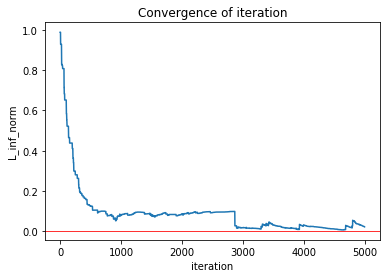

-------------------------------------------------------

Initial distribution:  [ 0.16305881  0.13815653  0.04140588  0.02532947  0.1330275   0.02470592
  0.09859881  0.06918854  0.03425731  0.1206207   0.15165054]
	 run time:  1.2339999675750732
	 number of iterations:  5000
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 3, 2, 3, 2]
	 value function of final iteration:  [ 0.87798731  0.92893682  0.98978958  0.          0.82275887  0.92536888
  0.          0.77741802  0.73094596  0.87253894  0.70845473]
	 plot convengence of value function: 


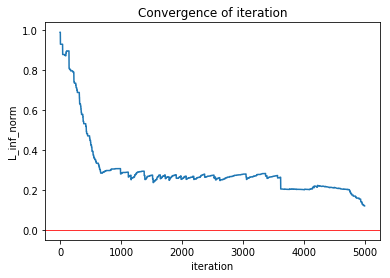

-------------------------------------------------------

Initial distribution:  [ 0.05651964  0.04267836  0.10990931  0.0874333   0.15177932  0.15201141
  0.03482276  0.00841018  0.12548098  0.18068838  0.05026636]
	 run time:  1.0599470138549805
	 number of iterations:  5000
	 greedy policy:  [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
	 value function of final iteration:  [ 0.87553155  0.92720452  0.99115803  0.          0.8194191   0.923499    0.
  0.77157768  0.80539598  0.86547232  0.82114079]
	 plot convengence of value function: 


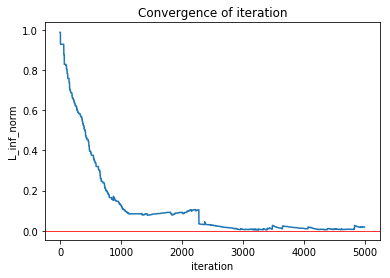

-------------------------------------------------------



In [59]:
for i in range(20):
    mu0 = np.random.uniform(0, 1, 11)
    mu0 = mu0/np.sum(mu0)
    print('Initial distribution: ', mu0)
    start = time.time()
    Vs, policy = Q_learning_epi_greedy(n_episodes, gamma, epi, w=0.53, env=env, mu0=None)
    stop = time.time()
    recall_iteration_results(start, stop, Vs, policy, np.array(v_opt))
    print('-------------------------------------------------------\n')

In [63]:
for i in range(10):
    mu0 = np.random.uniform(0, 1, 11)
    mu0 = mu0/np.sum(mu0)
    print('Initial distribution: ', mu0)
    start = time.time()
    Vs, policy = Q_learning_epi_greedy(n_episodes, gamma, epi, w=0.53, env=env, mu0=None)
    print('Optimal policy obtained:')
    print('\t', policy)
    print('-------------------------------------------------------')

Initial distribution:  [ 0.14910401  0.131979    0.01639918  0.06191372  0.07543874  0.0575452
  0.04249296  0.1137169   0.14558458  0.11846223  0.08736348]
Optimal policy obtained:
	 [0, 0, 0, 0, 3, 3, 0, 3, 2, 2, 2]
-------------------------------------------------------
Initial distribution:  [ 0.10129408  0.14727315  0.1734339   0.11202337  0.10295865  0.110265
  0.043464    0.01185685  0.04052311  0.13413272  0.02277517]
Optimal policy obtained:
	 [0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 2]
-------------------------------------------------------
Initial distribution:  [ 0.02922402  0.11534104  0.08465926  0.04779324  0.14513975  0.14974602
  0.08955133  0.09893804  0.09294599  0.09903795  0.04762335]
Optimal policy obtained:
	 [0, 0, 0, 0, 3, 3, 0, 3, 0, 3, 2]
-------------------------------------------------------
Initial distribution:  [ 0.13020814  0.17013913  0.06839666  0.09042481  0.1381248   0.04368629
  0.00484224  0.04497819  0.07812757  0.07297928  0.1580929 ]
Optimal policy obtai